In [ ]:
#!pip install --user imblearn
#!pip install optuna

In [1]:
def agrupar_categorias(df, columnas, umbral):
    transform = {}
    for col in columnas:
        conteo_categorias = df[col].value_counts()
        categorias_a_agrupar = conteo_categorias[conteo_categorias < umbral].index.tolist()
        df[col+"_aux"] = df[col] 
        df.loc[:,col] = df[col].apply(lambda x: 'otro_' + col if x in categorias_a_agrupar else x)
        transform[col] = df.set_index(col+"_aux")[col].to_dict()
        df = df.drop(columns=[col+"_aux"])
    return df, transform

In [2]:
import pandas as pd
import numpy as np

from imblearn.over_sampling import SMOTE
import sys
sys.path.append("../../")

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.feature_selection import chi2
from sklearn.preprocessing import FunctionTransformer, OneHotEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import brier_score_loss, make_scorer
from sklearn.model_selection import StratifiedKFold, cross_val_score, train_test_split
from xgboost.sklearn import XGBClassifier
from scipy.stats import chi2_contingency
import optuna

import warnings
warnings.filterwarnings("ignore")

In [ ]:
incosistencias_columns = ['Feature_11', 'Feature_71', 'Feature_88', 'Feature_90',
       'Feature_143', 'Feature_156', 'Feature_176', 'Feature_194',
       'Feature_200', 'Feature_216', 'Feature_237', 'Feature_268',
       'Feature_273', 'Feature_319', 'Feature_339', 'Feature_386',
       'Feature_391', 'Feature_402', 'Feature_407', 'Feature_410',
       'Feature_417', 'Feature_421', 'Feature_422', 'Feature_427',
       'Feature_431', 'Feature_441', 'Feature_471', 'Feature_477',
       'Feature_492', 'Feature_532']

In [3]:
df_train = pd.read_csv("../data/raw/training.csv")\
    .drop(columns=incosistencias_columns)
df_val = pd.read_csv("../data/raw/data_validation2.csv")\
    .drop(columns=incosistencias_columns)
df_val1 = pd.read_csv("../data/raw/data_validation3.csv")\
    .drop(columns=incosistencias_columns)

In [4]:
df_train["Feature_2"].value_counts(True)[0]

0.8435427233710495

In [5]:
df_numeric = df_train.select_dtypes(include=["number"]).drop(columns=["Target"])
df_categorical = df_train.select_dtypes(include=["object"])

df_numeric_val = df_val[df_numeric.columns]
df_categorical_val = df_val[df_categorical.columns]

df_numeric_val1 = df_val1[df_numeric.columns]
df_categorical_val1 = df_val1[df_categorical.columns]
y = df_train["Target"]

In [6]:
porcentaje_first_value = []
for i in df_numeric.columns:
    porcentaje_first_value.append(df_numeric[i].value_counts(True)[0])

In [7]:
porcentaje_drop_column = df_numeric.columns[np.array(porcentaje_first_value)>0.8]
df_numeric = df_numeric.drop(columns=porcentaje_drop_column)
df_numeric_val = df_numeric_val.drop(columns=porcentaje_drop_column)
df_numeric_val1 = df_numeric_val1.drop(columns=porcentaje_drop_column)

In [8]:
constants_drop_columns = list(df_numeric.columns[df_numeric.nunique()==1])
df_train_procesing_1 = df_numeric.drop(columns=constants_drop_columns)
df_val_processing_1 = df_numeric_val.drop(columns=constants_drop_columns)
df_val1_processing_1 = df_numeric_val1.drop(columns=constants_drop_columns)


df_train_procesing_1 = df_train_procesing_1.fillna(df_train_procesing_1.mean())
df_val_processing_1 = df_val_processing_1.fillna(df_train_procesing_1.mean())
df_val1_processing_1 = df_val1_processing_1.fillna(df_train_procesing_1.mean())

In [9]:
# Calculate the correlation matrix
correlation_matrix = df_train_procesing_1.corr()

# Identify features with high correlation
high_corr_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            colname = correlation_matrix.columns[i]
            high_corr_features.add(colname)

# Select features with correlation below the threshold
correlation_drop_columns = high_corr_features
df_train_procesing_2 = df_train_procesing_1.drop(columns=correlation_drop_columns)
df_val_processing_2 = df_val_processing_1.drop(columns=correlation_drop_columns)
df_val1_processing_2 = df_val1_processing_1.drop(columns=correlation_drop_columns)

(0.0, 40.0)

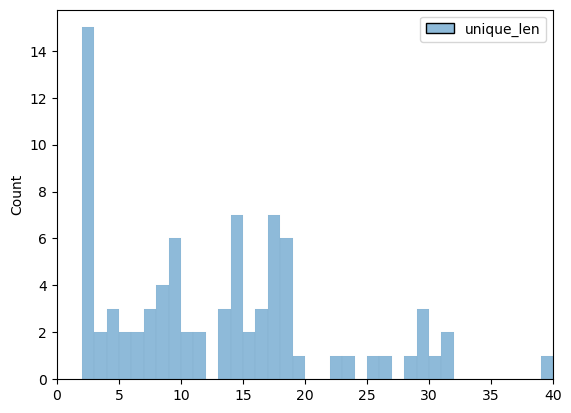

In [10]:
numeric_columns_unique_len = []
for column in df_train_procesing_2.columns:
    numeric_columns_unique_len.append(len(df_train_procesing_2[column].unique()))
numeric_columns_unique_len_df = pd.DataFrame({
    'feature':df_train_procesing_2.columns,
    'unique_len': numeric_columns_unique_len
})
sns.histplot(numeric_columns_unique_len_df.sort_values('unique_len'), binwidth= 1)
plt.xlim(0,40)

<AxesSubplot:>

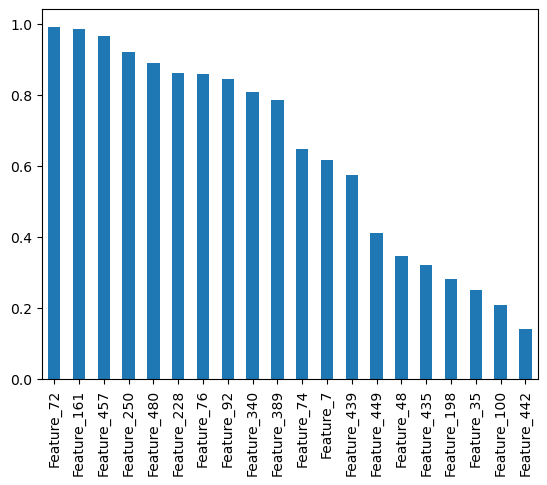

In [11]:
X = df_train_procesing_2[list(numeric_columns_unique_len_df[numeric_columns_unique_len_df.unique_len<10].feature.values)]
X = X.select_dtypes(include=["number"])
X = X.fillna(X.mean())
chi_scores = chi2(X,y)
chi_scores
p_values = pd.Series(chi_scores[1],index = X.columns)
p_values.sort_values(ascending = False , inplace = True)
p_values.plot.bar()


In [12]:
categoricas_select_columns = p_values.keys()[p_values>0.25]

In [13]:
categoricas_select_columns

Index(['Feature_72', 'Feature_161', 'Feature_457', 'Feature_250',
       'Feature_480', 'Feature_228', 'Feature_76', 'Feature_92', 'Feature_340',
       'Feature_389', 'Feature_74', 'Feature_7', 'Feature_439', 'Feature_449',
       'Feature_48', 'Feature_435', 'Feature_198', 'Feature_35'],
      dtype='object')

In [14]:
chi_drop_columns = set(numeric_columns_unique_len_df[numeric_columns_unique_len_df.unique_len<5].feature.values)-set(categoricas_select_columns+["Target"])-set(["Target"])

In [15]:
df_train_procesing_3 = df_train_procesing_2.drop(columns=chi_drop_columns)
df_val_processing_3 = df_val_processing_2.drop(columns=chi_drop_columns)
df_val1_processing_3 = df_val1_processing_2.drop(columns=chi_drop_columns)

df_train_procesing_3.head(1)

,Feature_1,Feature_3,Feature_4,Feature_9,Feature_10,Feature_11,Feature_12,Feature_15,Feature_16,Feature_18,...,Feature_518,Feature_520,Feature_523,Feature_528,Feature_529,Feature_530,Feature_532,Feature_534,Feature_540,Feature_545
0,0.144231,0.9,0.66665,0.07386,0.5625,0.166667,0.038552,0.001089,0.176444,1.0,...,0.0,0.9999,0.172073,0.006944,0.25,0.210526,0.292566,0.2768,0.216696,0.0


In [16]:
X_cate = df_train.select_dtypes("object")
X_cate = X_cate.fillna(X_cate.mode())

X_val_cate = df_val[X_cate.columns]
X_val_cate = X_val_cate.fillna(X_cate.mode())

X_val1_cate = df_val1[X_cate.columns]
X_val1_cate = X_val1_cate.fillna(X_cate.mode())


In [17]:
p_value = []
for i in X_cate.columns:
    print(i)
    crosstab = pd.crosstab(X_cate[i], y)
    print(chi2_contingency(crosstab))
    p_value.append(chi2_contingency(crosstab)[1])

Feature_82
(11.35299205546586, 0.9693417777592401, 22, array([[8.91533359e-01, 1.08466641e-01],
       [8.91533359e-01, 1.08466641e-01],
       [2.67460008e+00, 3.25399922e-01],
       [8.91533359e-01, 1.08466641e-01],
       [6.86480687e+01, 8.35193133e+00],
       [8.91533359e-01, 1.08466641e-01],
       [2.67460008e+00, 3.25399922e-01],
       [8.91533359e-01, 1.08466641e-01],
       [8.91533359e-01, 1.08466641e-01],
       [8.91533359e-01, 1.08466641e-01],
       [8.91533359e-01, 1.08466641e-01],
       [8.91533359e-01, 1.08466641e-01],
       [8.91533359e-01, 1.08466641e-01],
       [8.91533359e-01, 1.08466641e-01],
       [1.78306672e+00, 2.16933281e-01],
       [8.91533359e-01, 1.08466641e-01],
       [8.91533359e-01, 1.08466641e-01],
       [8.91533359e-01, 1.08466641e-01],
       [1.78306672e+00, 2.16933281e-01],
       [2.94206009e+01, 3.57939914e+00],
       [5.32245416e+02, 6.47545845e+01],
       [1.60565158e+03, 1.95348420e+02],
       [2.76375341e+01, 3.36246586e+00]]))


In [18]:
chiqcategorical_drop_columns = X_cate.columns[np.array(p_value)>0.25]
categorical_select_columns = X_cate.columns[np.array(p_value)<0.25]

In [19]:
X_new = X_cate[categorical_select_columns]
X_val_new = X_val_cate[categorical_select_columns]
X_val1_new = X_val1_cate[categorical_select_columns]


X_new, t = agrupar_categorias(X_new, categorical_select_columns, 31)
for c in t.keys():
    X_val_new[c] = X_val_new[c].map(t[c])
    
    
for c in t.keys():
    X_val1_new[c] = X_val1_new[c].map(t[c])

In [20]:
le = OneHotEncoder(handle_unknown='ignore', drop='first', sparse=False)
le.fit(X_new)
X_new_value = le.transform(X_new)
X_new_value_val = le.transform(X_val_new)
X_new_value_val1 = le.transform(X_val1_new)

In [21]:
X_new_value.shape

(2563, 29)

In [22]:
df_train_procesing_3.dtypes.value_counts()

float64    231
dtype: int64

In [23]:
# import pandas as pd
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.feature_selection import SelectFromModel

# sel = SelectFromModel(RandomForestClassifier(n_estimators = 100))
# sel.fit(df_train_procesing_3,  y.copy())

In [24]:
# selected_feat= df_train_procesing_3.columns[(sel.get_support())]
# selected_feat

Feature_1
0.005857042008832224


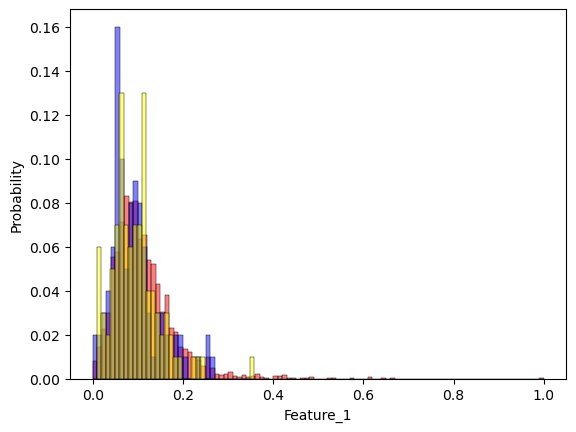

Feature_3
0.008471953899978407


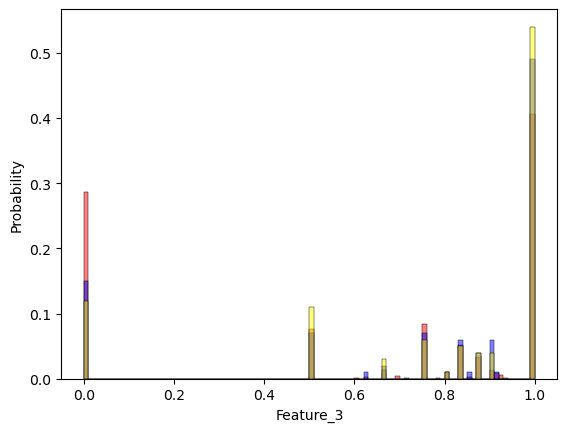

Feature_4
0.978927305990792


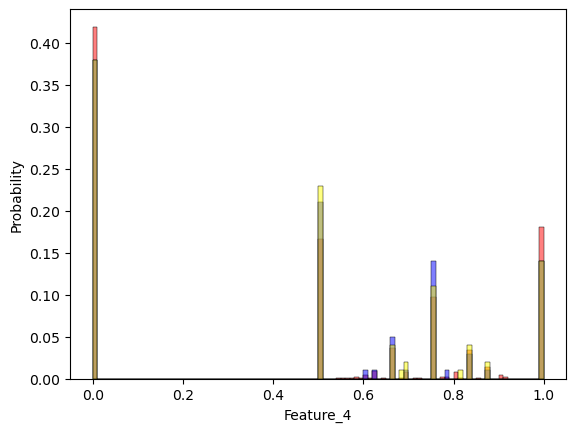

Feature_9
2.770122915616644e-13


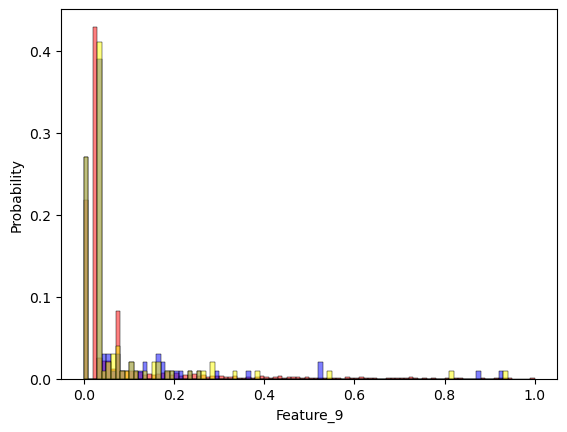

Feature_10
0.008471953899978407


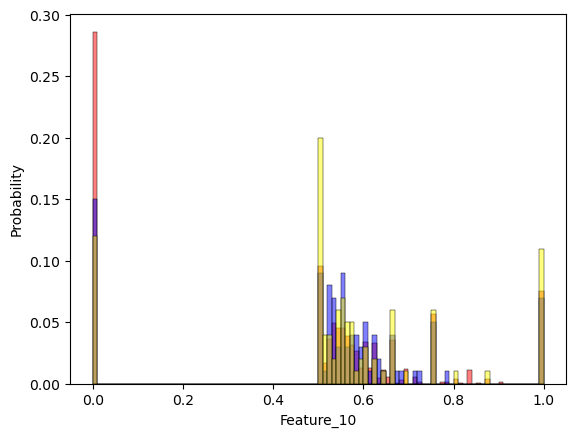

Feature_11
1.7529675443661212e-10


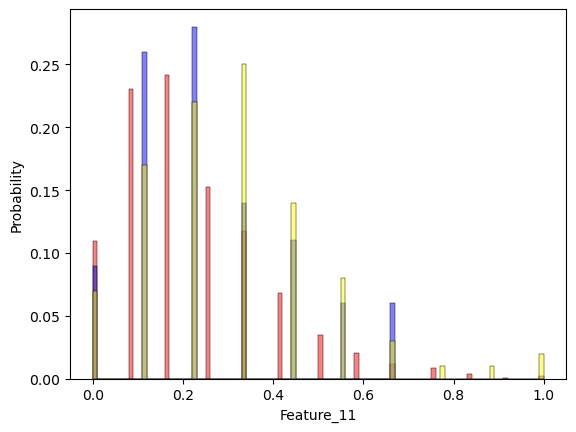

Feature_12
0.0036656851990073745


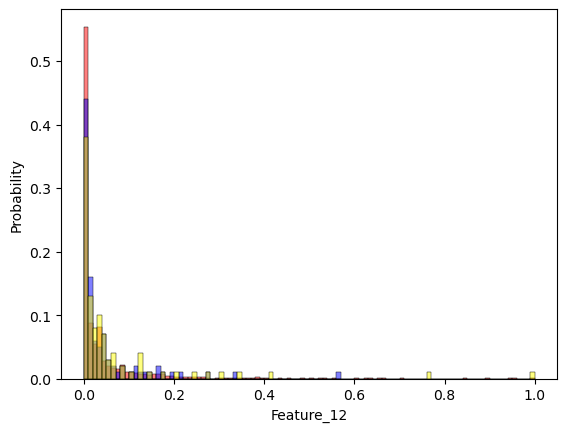

Feature_15
0.004305242196315439


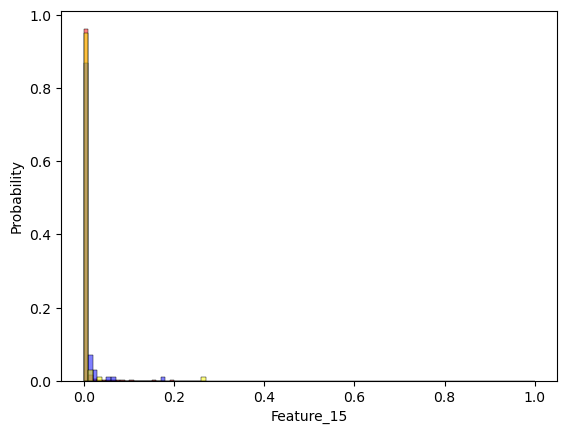

Feature_16
0.03825632059859666


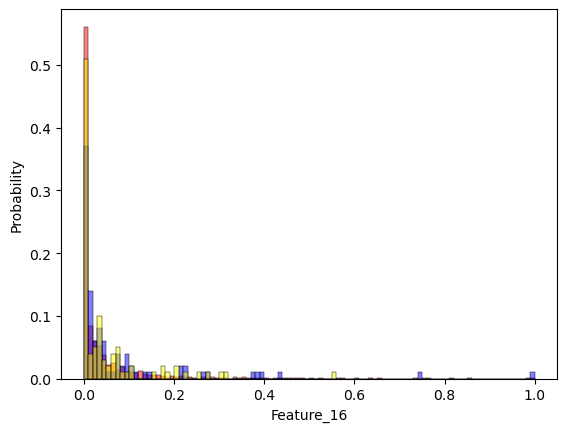

Feature_18
0.810389083785637


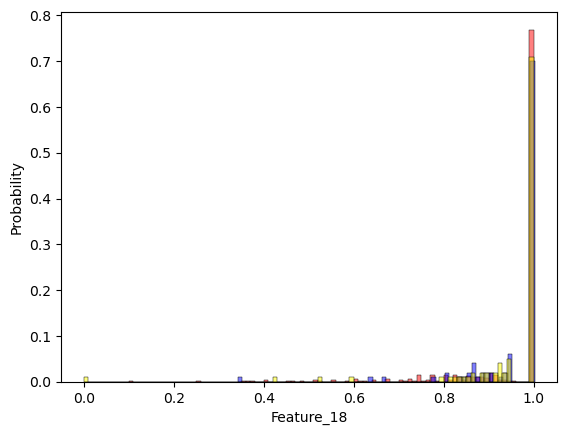

Feature_19
4.0156360660757194e-12


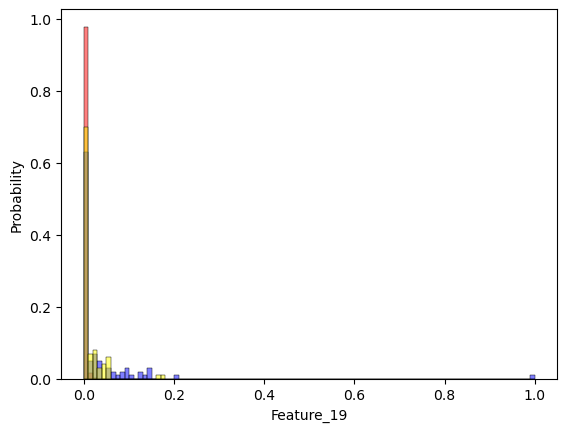

Feature_20
0.049393734376383155


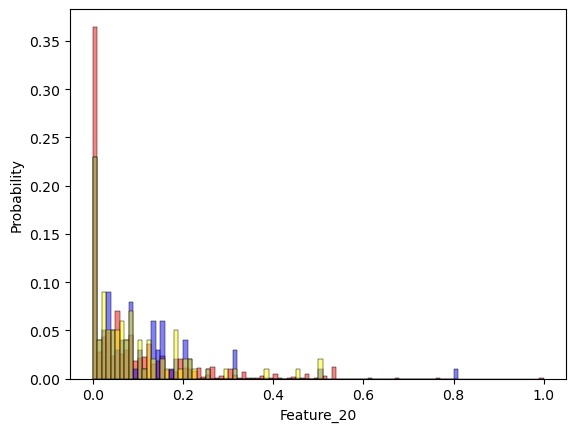

Feature_22
0.01064422282663493


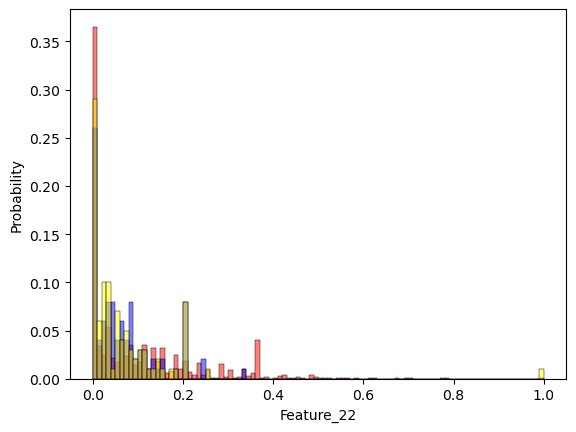

Feature_26
5.572659541310907e-07


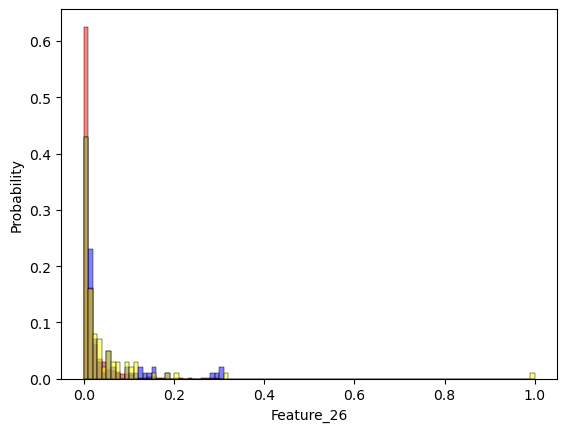

Feature_27
1.607505888791061e-19


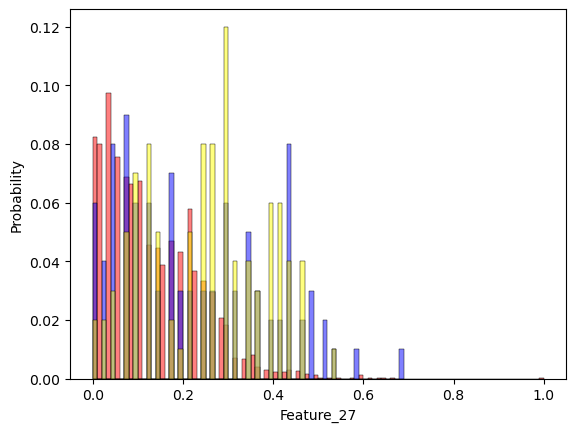

Feature_29
0.4251350901803664


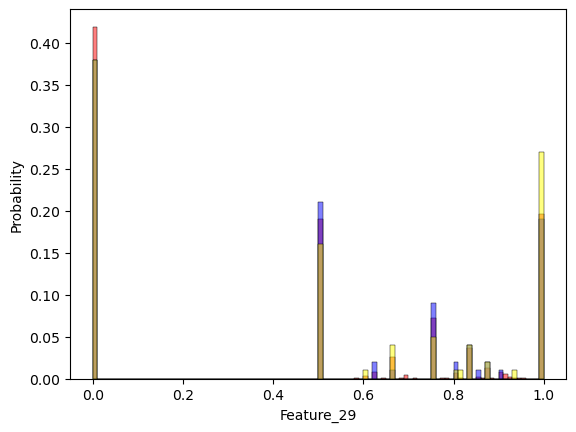

Feature_30
0.9010675548092472


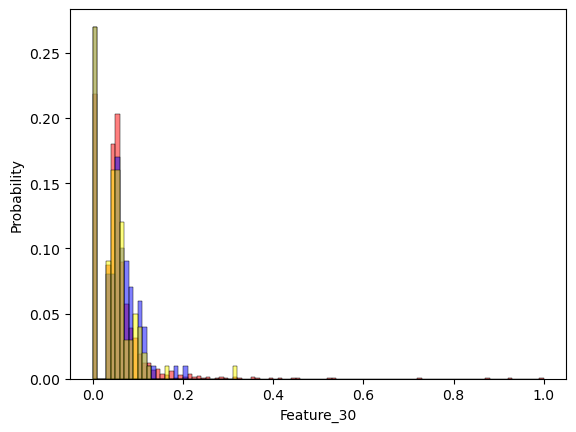

Feature_31
0.5572264402529269


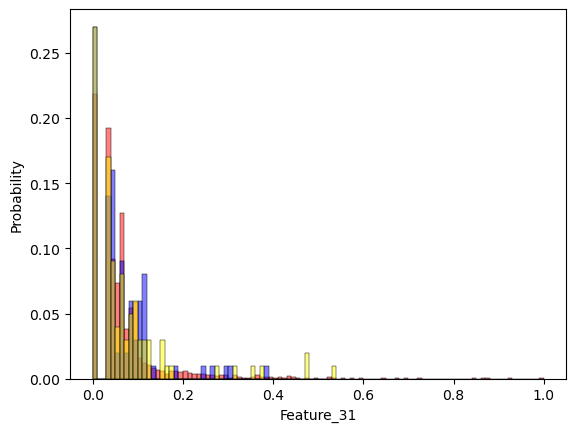

Feature_33
0.015205431079763217


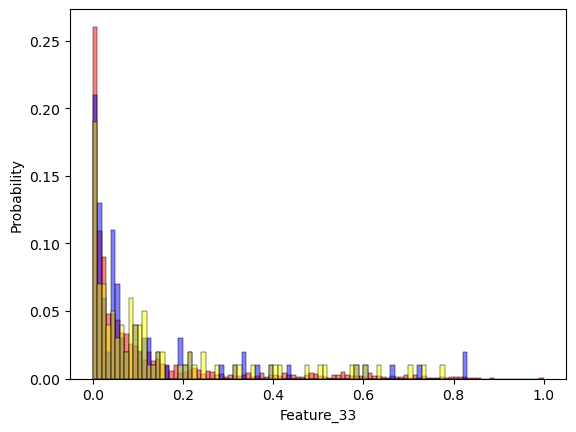

Feature_40
0.6479988214113352


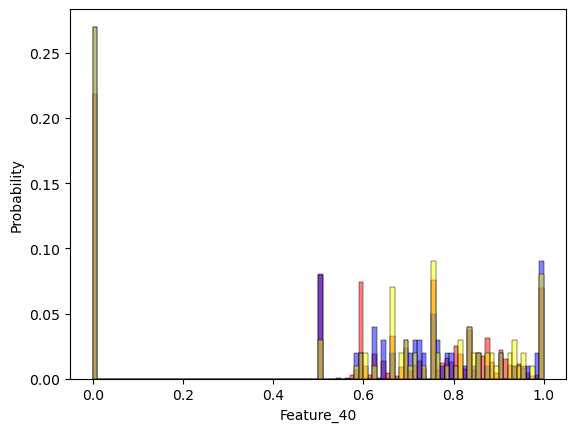

Feature_41
2.987408494308454e-08


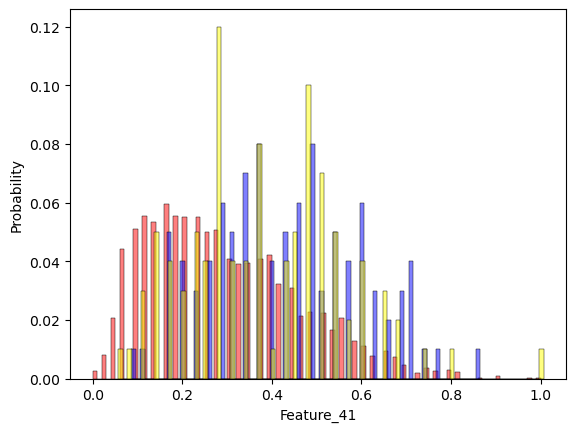

Feature_44
0.006084443977637219


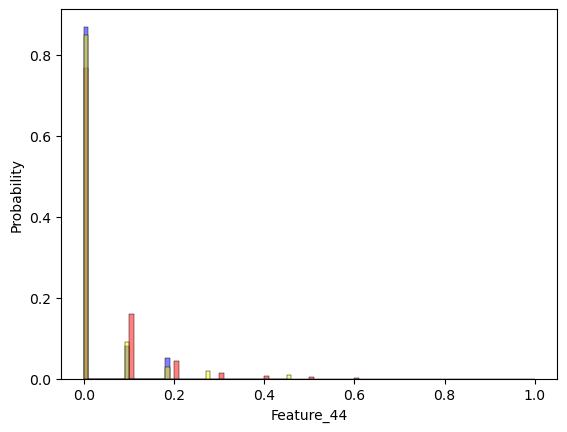

Feature_49
0.02879419727509439


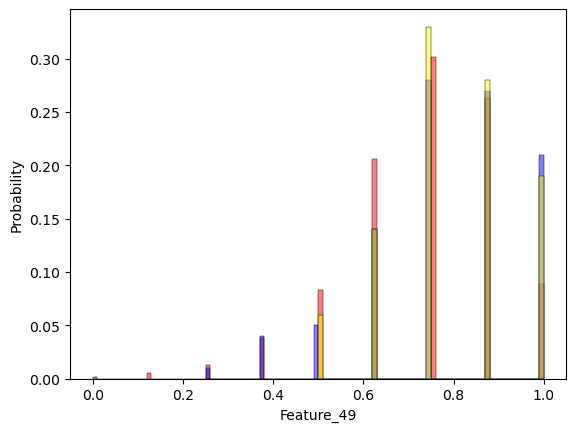

Feature_50
0.0007896535314336978


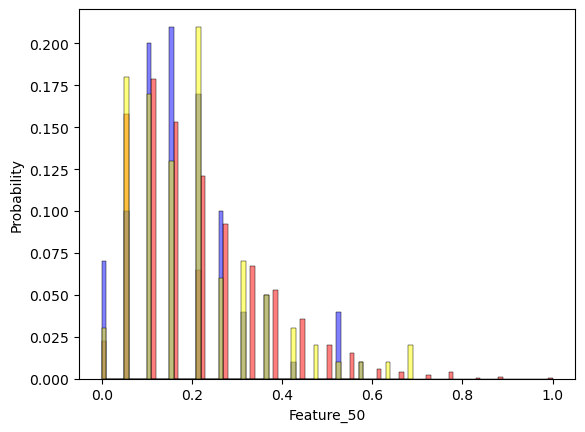

Feature_52
0.008471953899978407


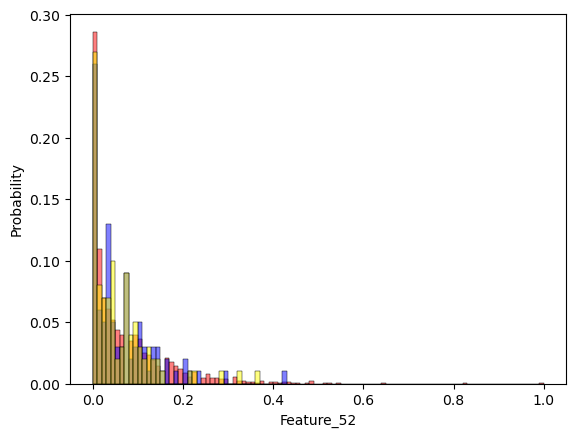

Feature_54
0.7678561641334741


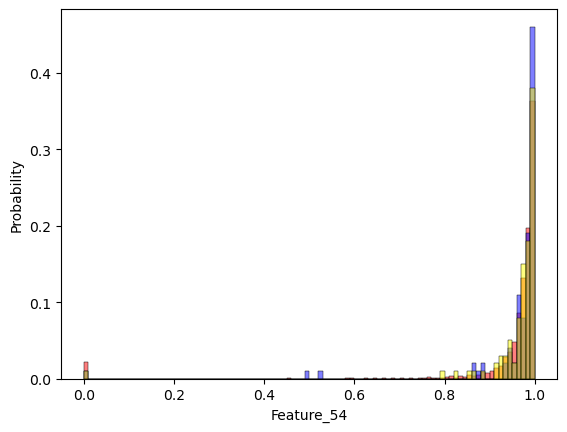

Feature_56
0.43855492612909613


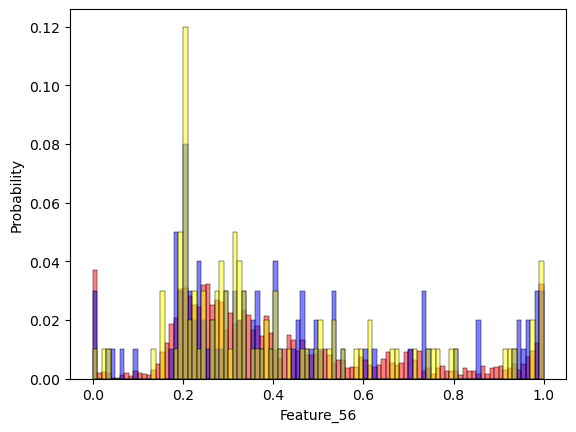

Feature_58
0.24497240441424548


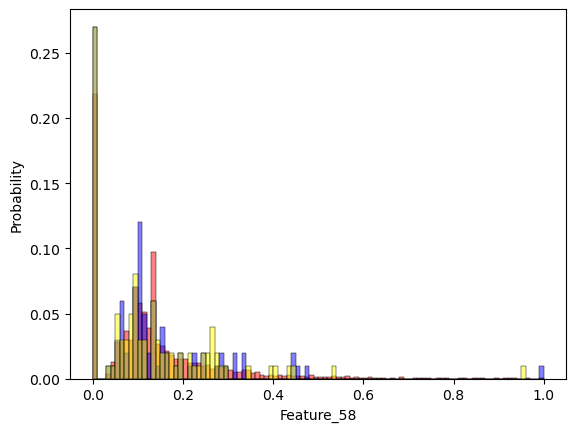

Feature_61
0.12696645978826485


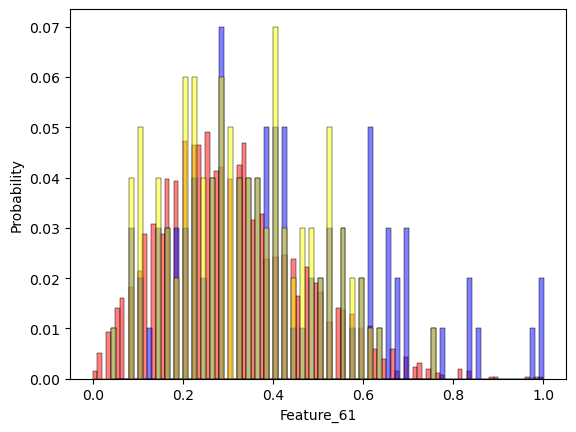

Feature_63
0.010639342183468365


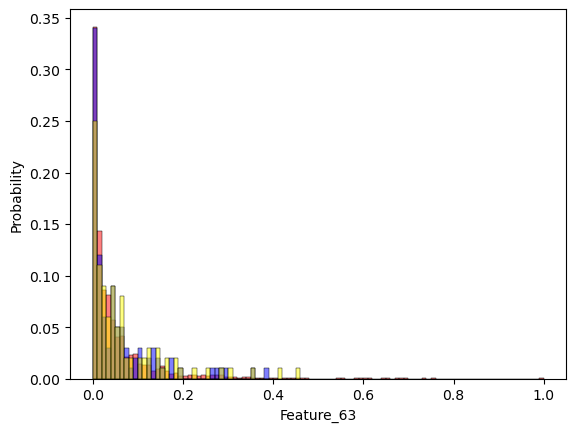

Feature_64
0.41224943261935865


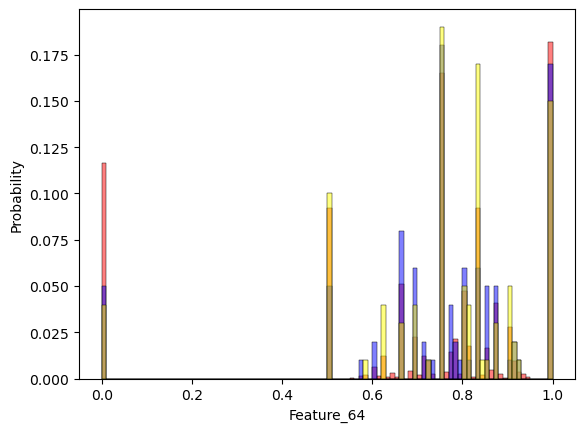

Feature_65
0.18005602223684772


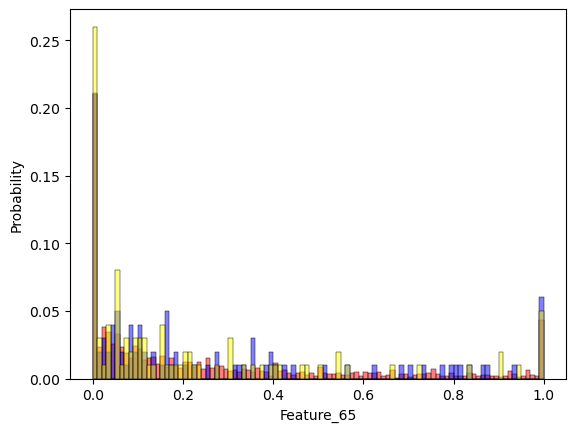

Feature_66
0.33330007698570124


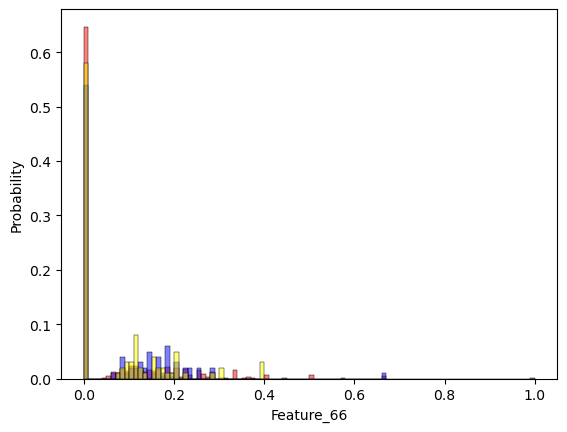

Feature_71
1.2299632538019297e-56


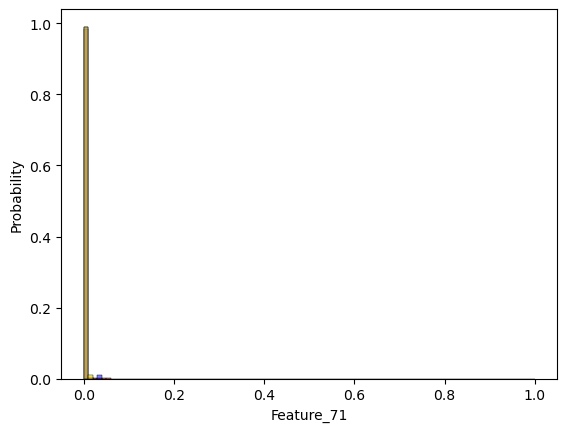

Feature_73
0.4071895100430421


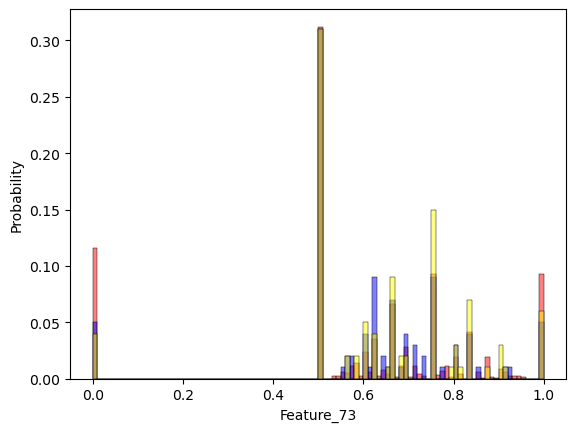

Feature_77
0.8528896888449365


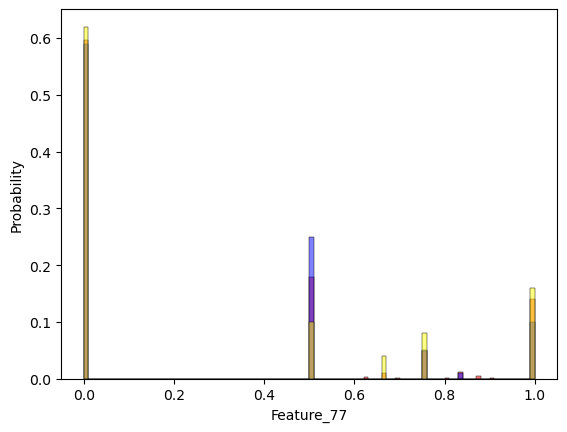

Feature_81
5.113940971815204e-15


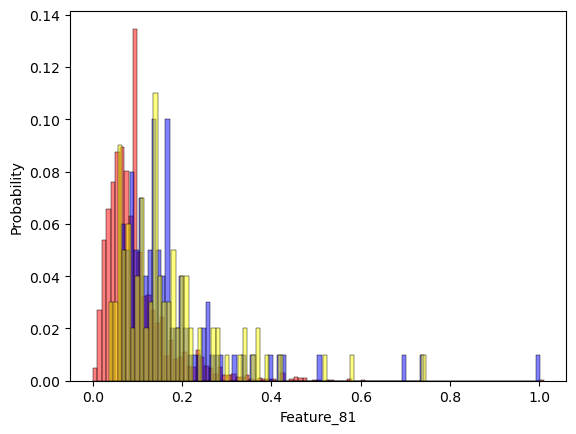

Feature_83
2.026017254388407e-05


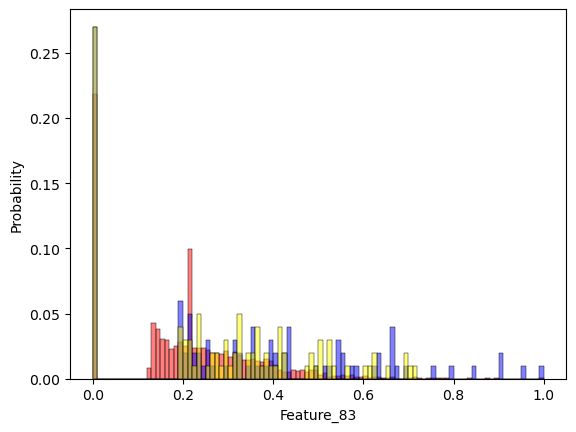

Feature_87
1.5593435623159685e-09


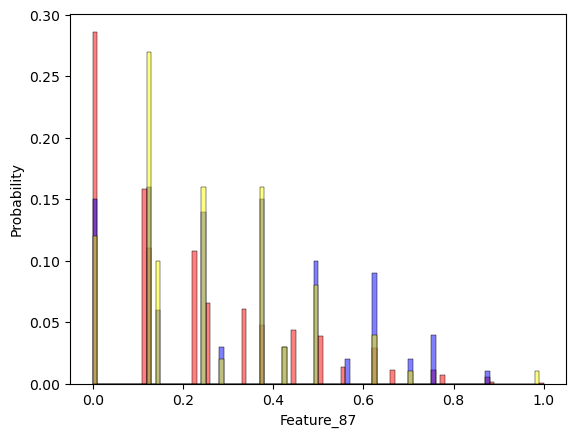

Feature_88
4.260813211320323e-31


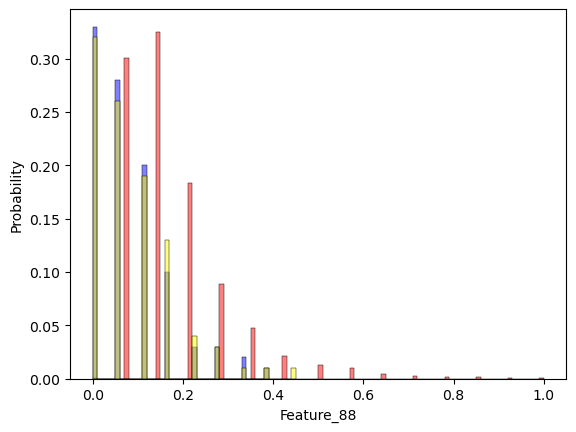

Feature_89
0.6730762232091051


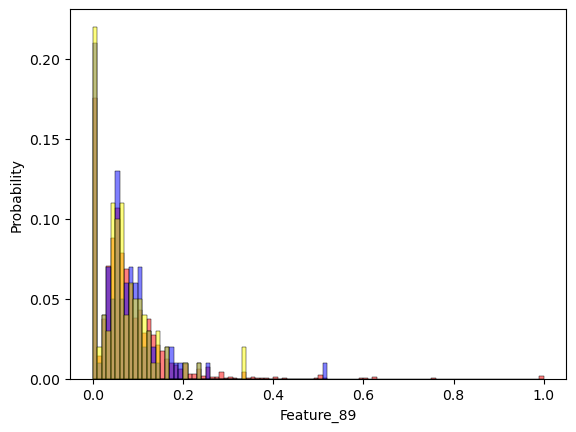

Feature_90
1.6117244377451672e-77


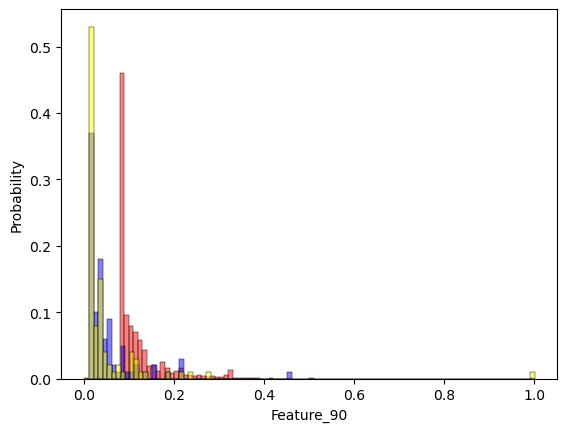

Feature_94
0.23070382642182036


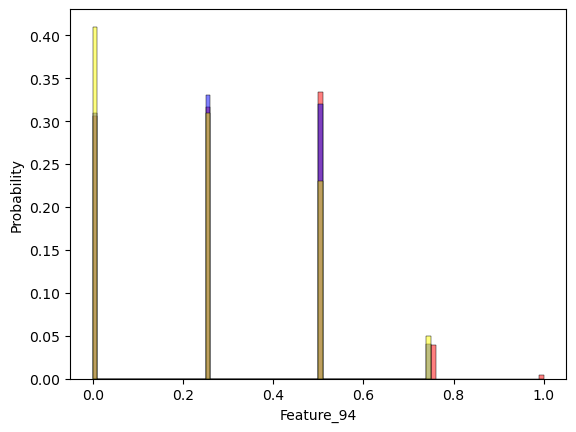

Feature_98
2.849962035506823e-65


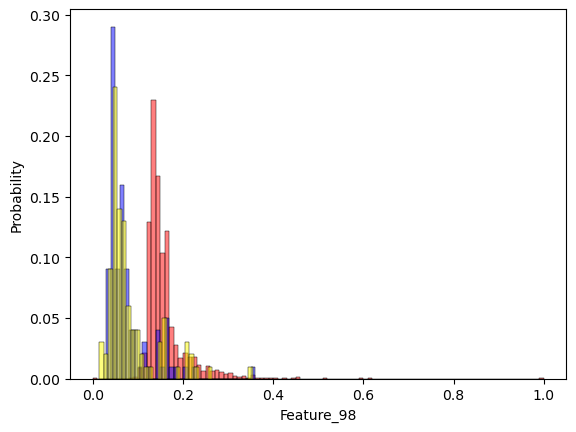

Feature_99
0.0014514831628749001


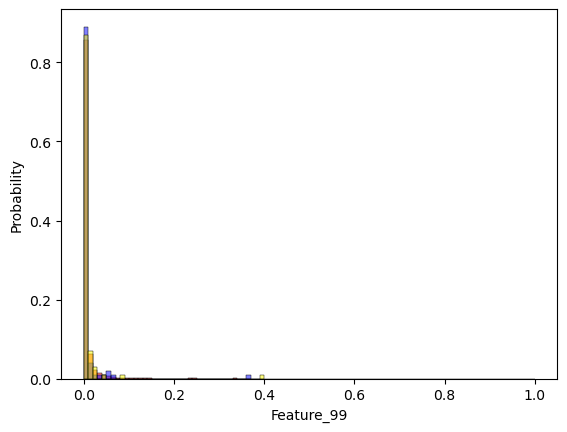

Feature_106
0.08369328064425836


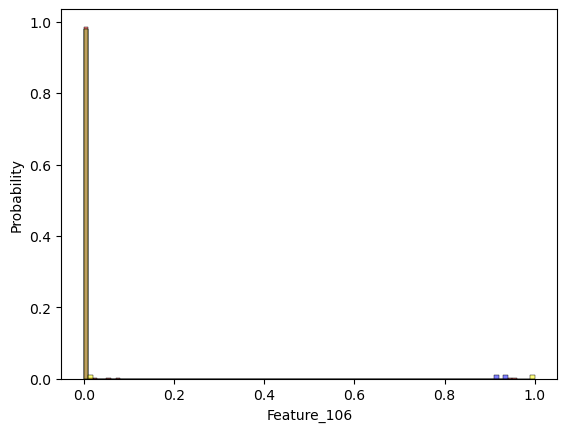

Feature_108
0.03186224112107788


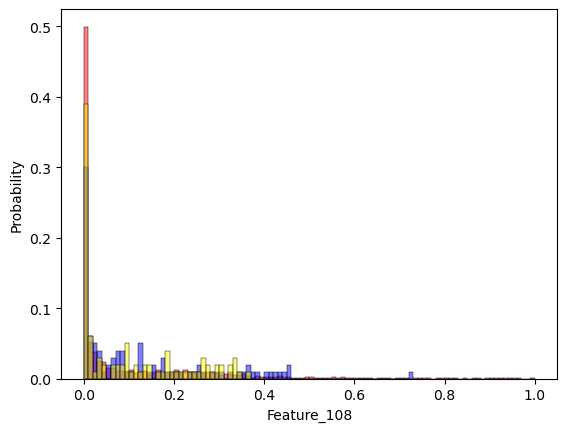

Feature_111
1.2510341928054994e-52


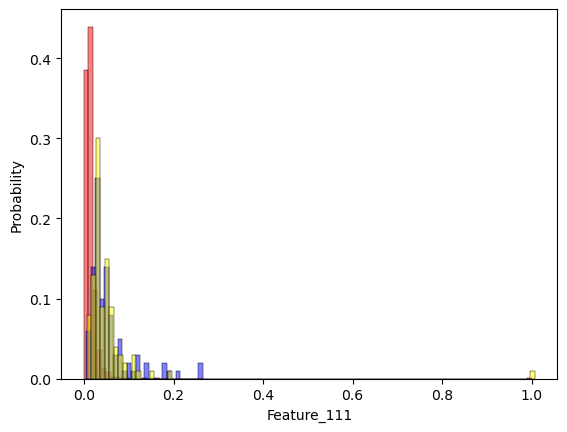

Feature_113
0.02852361523963317


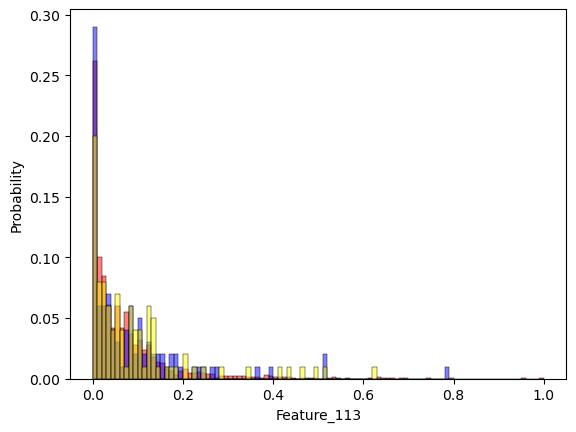

Feature_114
0.0012126397300635124


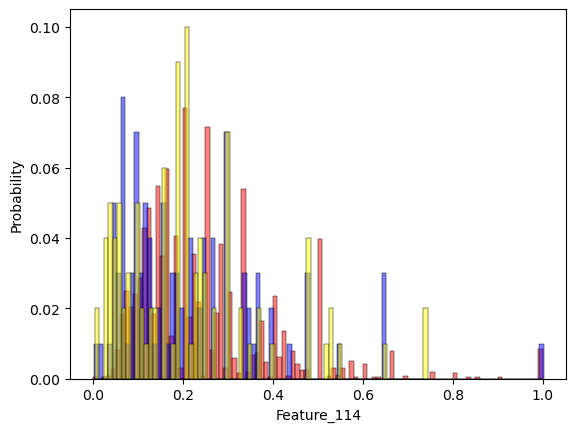

Feature_118
3.3427911362099328e-09


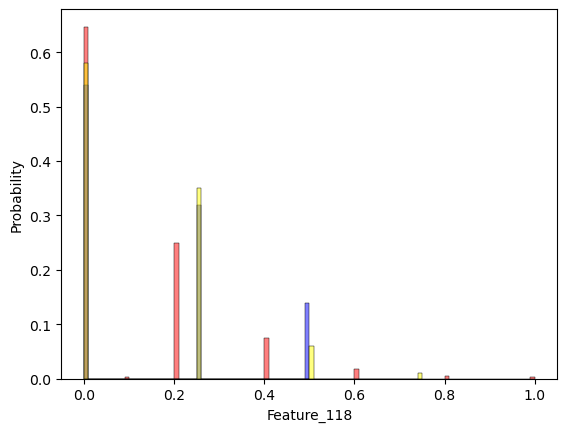

Feature_119
0.06573597936533061


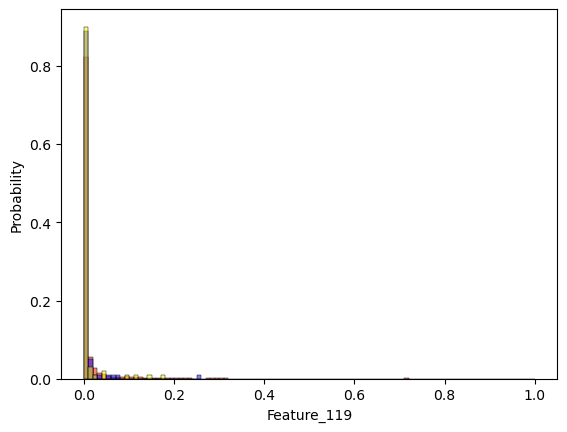

Feature_120
0.01990722315131234


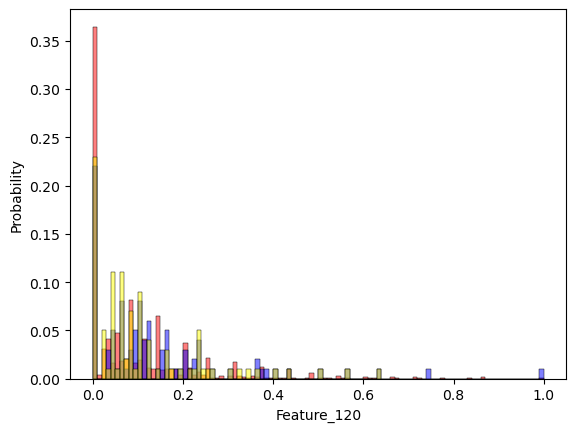

Feature_121
0.004090219651134071


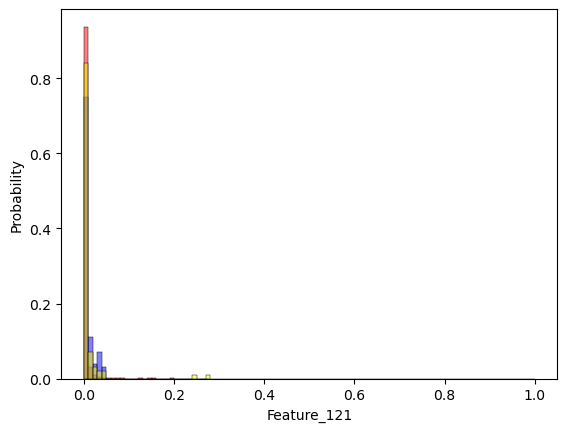

Feature_124
5.089974447719341e-09


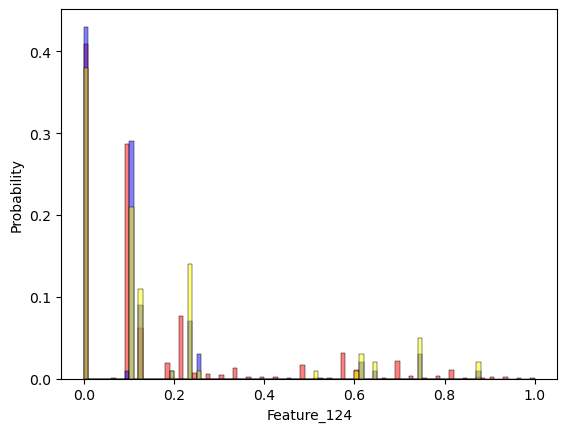

Feature_125
0.22963297369718028


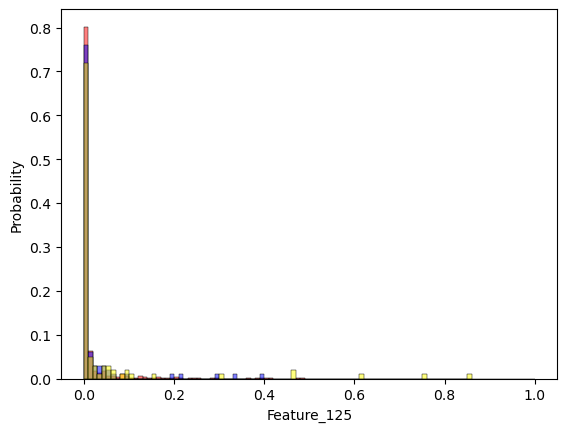

Feature_126
1.624970751234847e-111


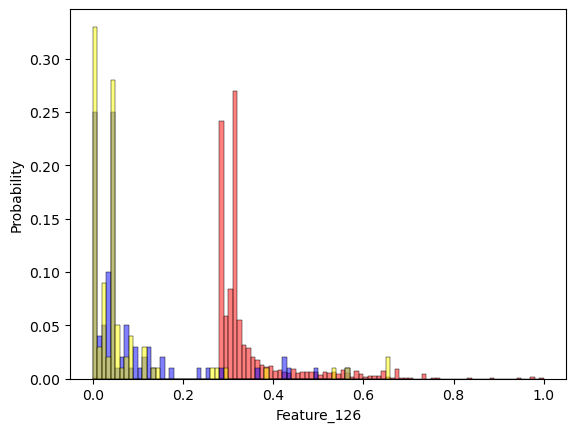

Feature_127
2.2436558161928687e-157


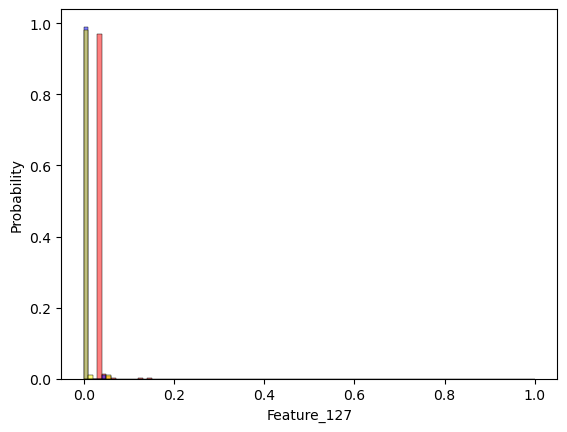

Feature_128
0.20769219213090956


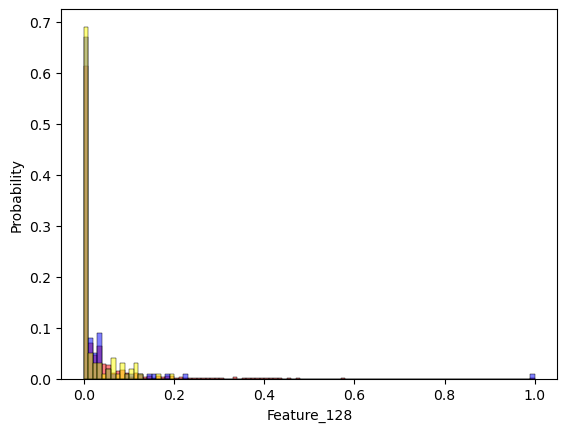

Feature_130
1.644507362568251e-05


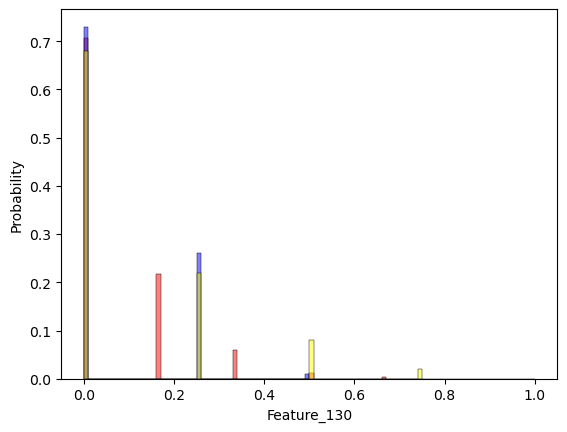

Feature_131
0.3695894757918764


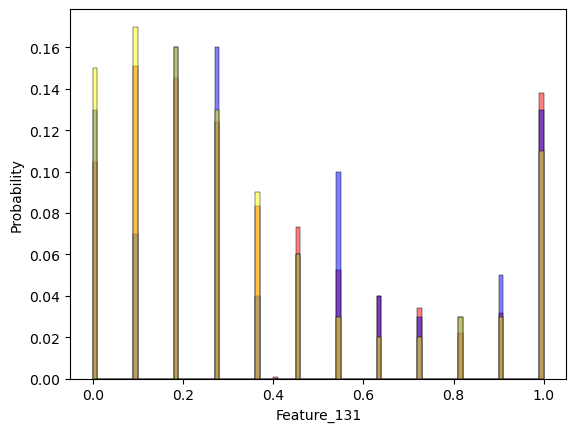

Feature_133
5.089659712558347e-49


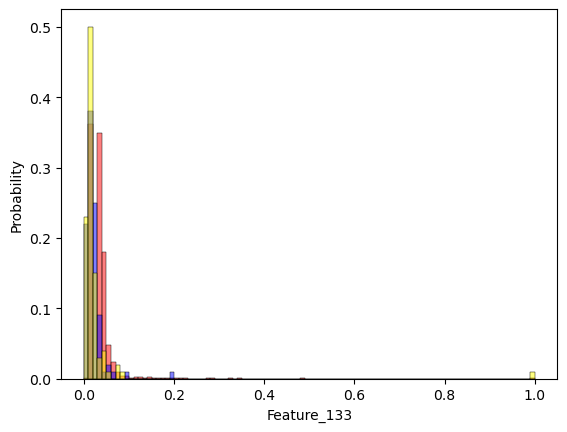

Feature_136
1.4575171126771859e-08


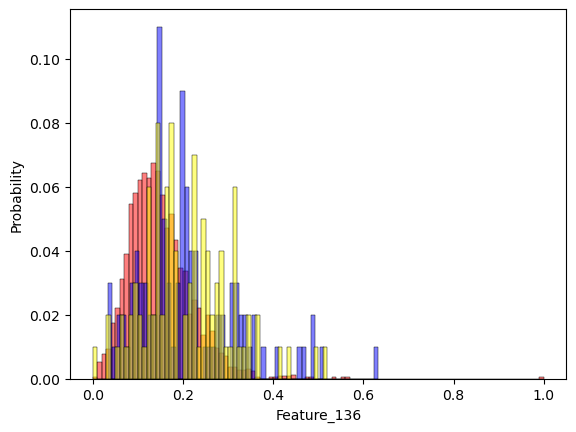

Feature_138
0.5537354806142516


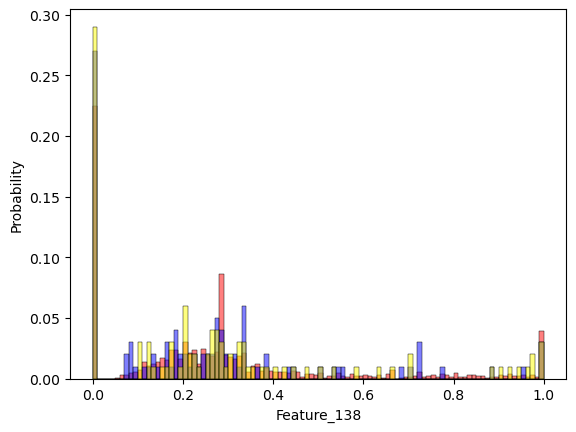

Feature_141
0.0011469084508767583


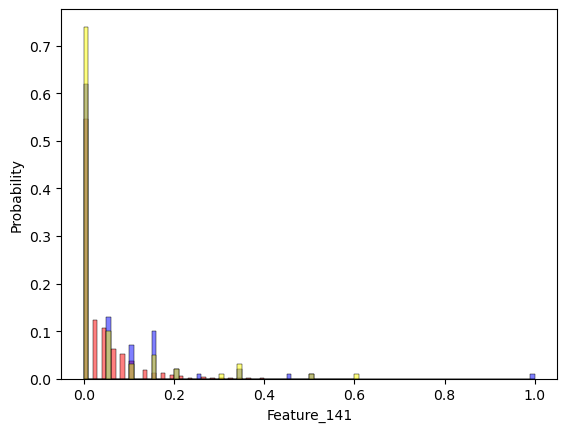

Feature_143
9.259531939843588e-159


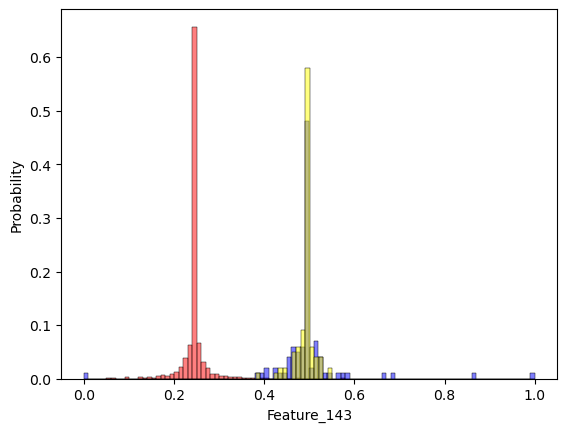

Feature_144
0.29953684452384843


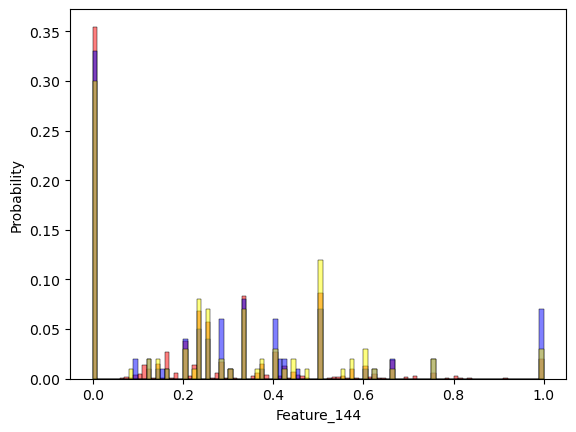

Feature_147
0.6147190409502525


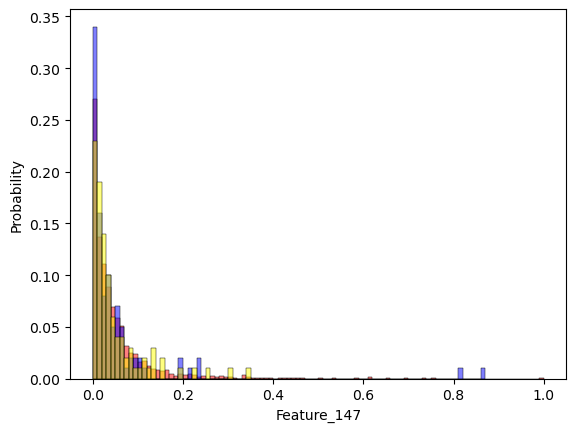

Feature_150
0.03966399379737407


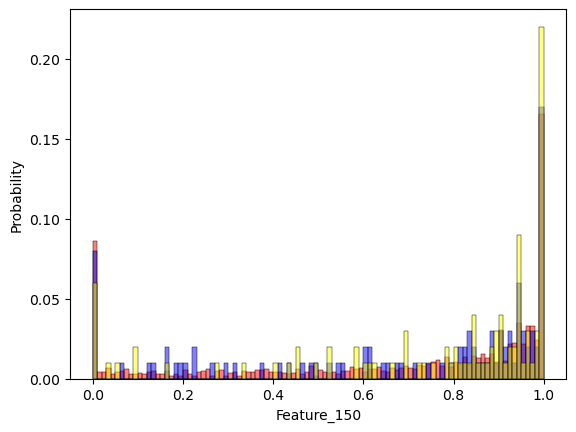

Feature_151
0.16417971894976327


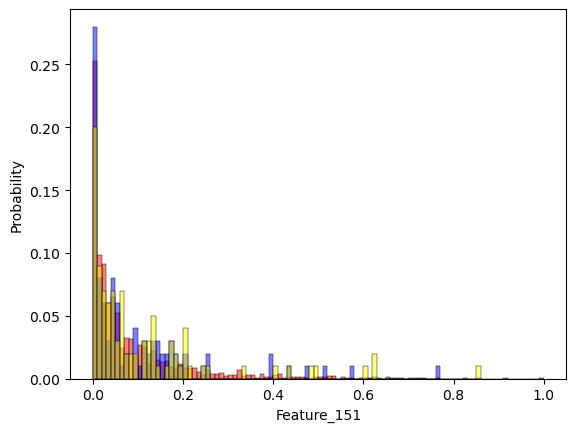

Feature_153
1.1747129623132622e-07


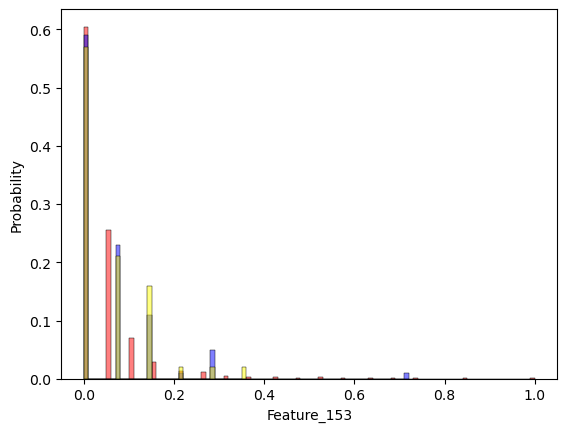

Feature_154
0.013506498570690358


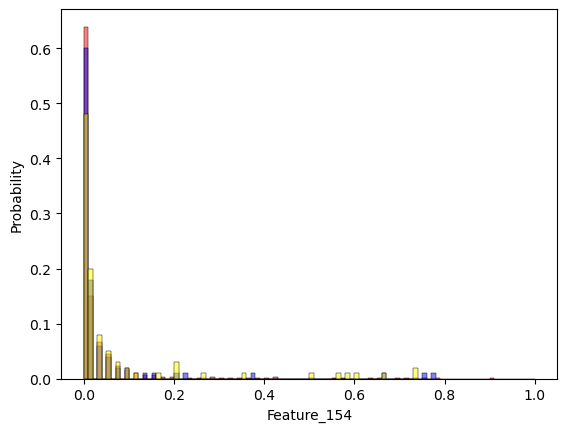

Feature_155
4.2881273194399616e-08


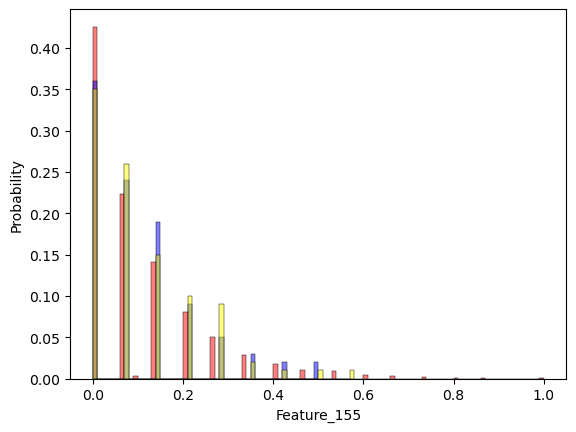

Feature_156
1.122739267004003e-25


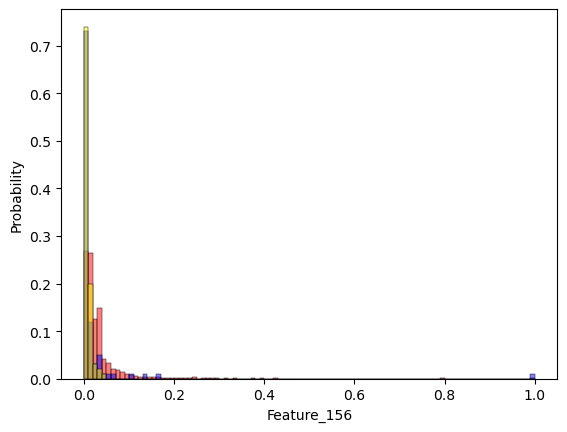

Feature_157
2.3642389294942822e-07


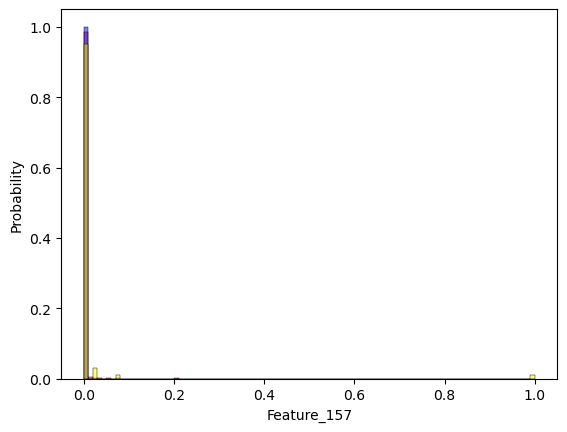

Feature_158
0.000824429189991005


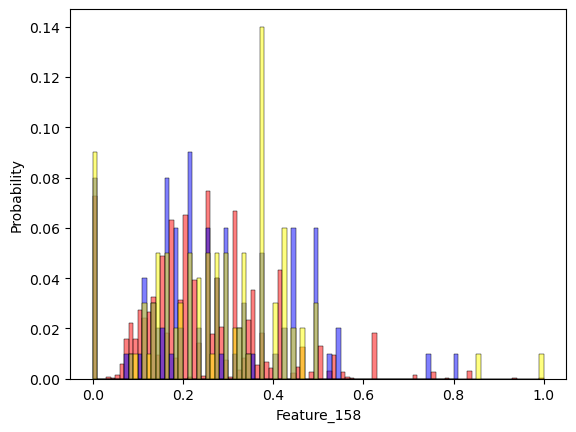

Feature_160
0.05358127125900861


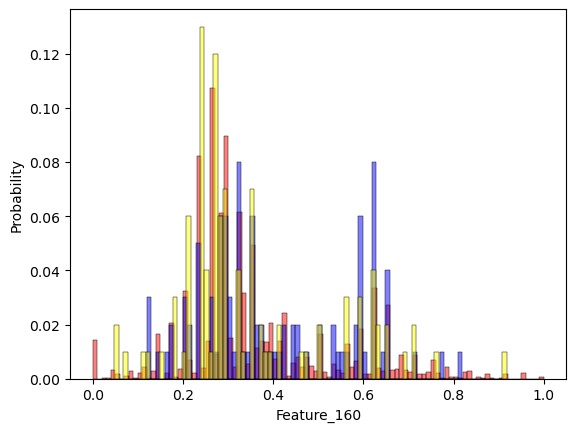

Feature_164
0.0324510777881909


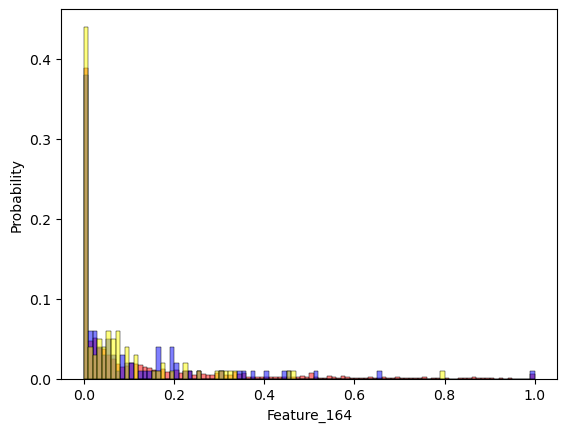

Feature_166
6.550992373642245e-05


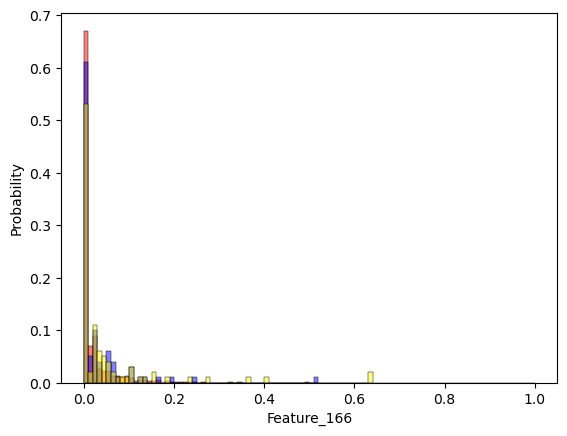

Feature_167
3.082543123639898e-07


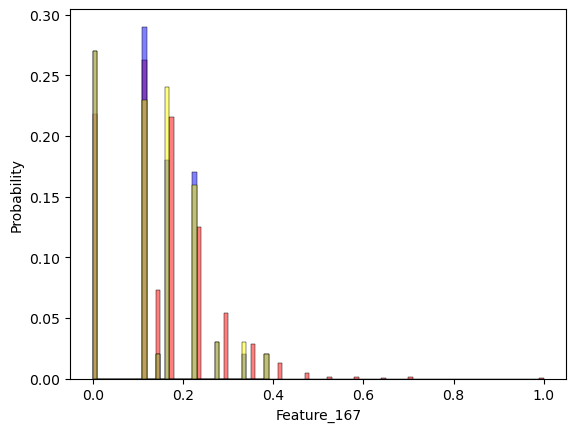

Feature_169
0.9226259380358706


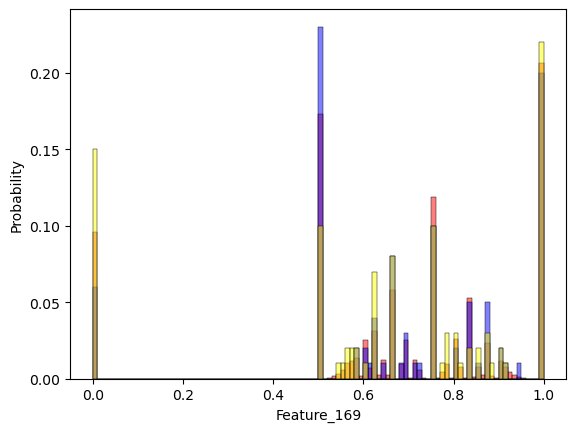

Feature_170
0.7986690818630238


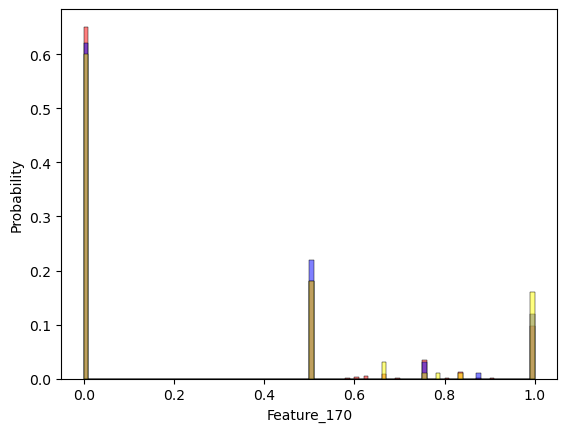

Feature_173
0.18089359329277196


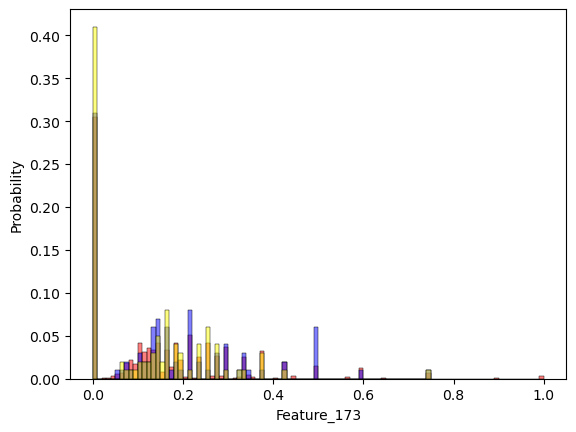

Feature_174
1.9634926534345936e-07


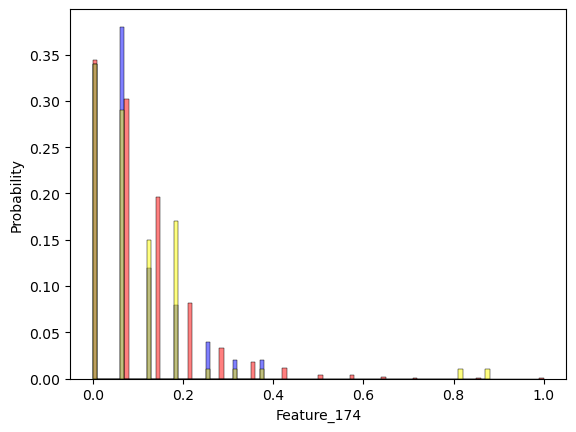

Feature_175
0.32978694925753477


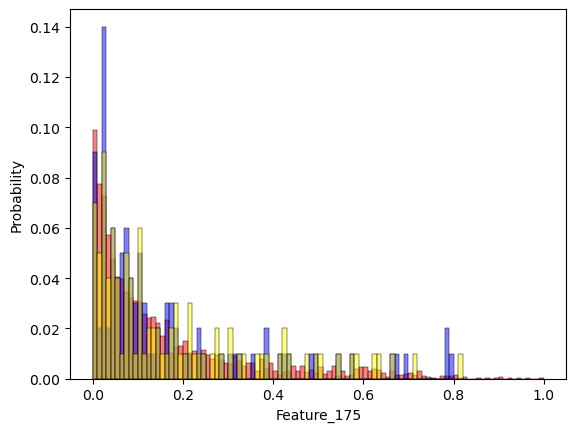

Feature_176
1.6037510779068769e-25


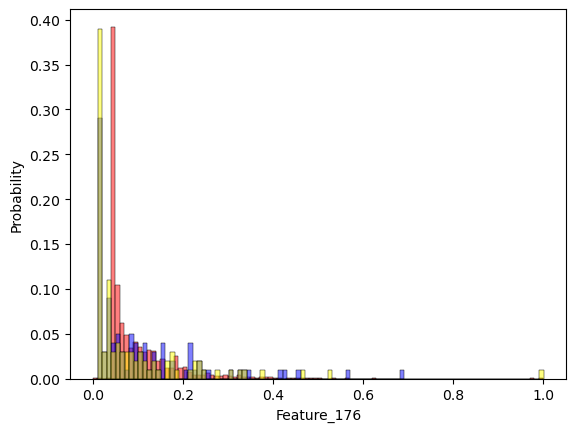

Feature_177
0.01927835779094581


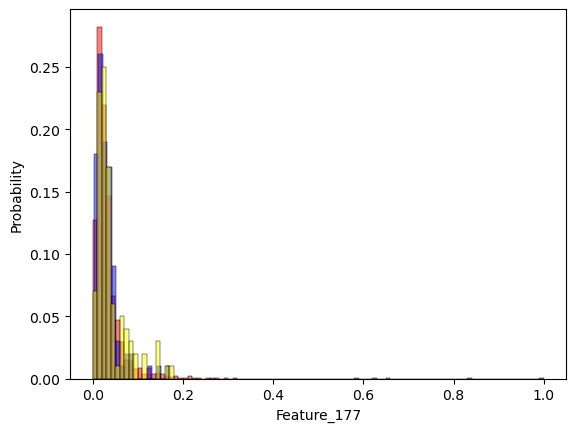

Feature_178
5.6133354134191505e-14


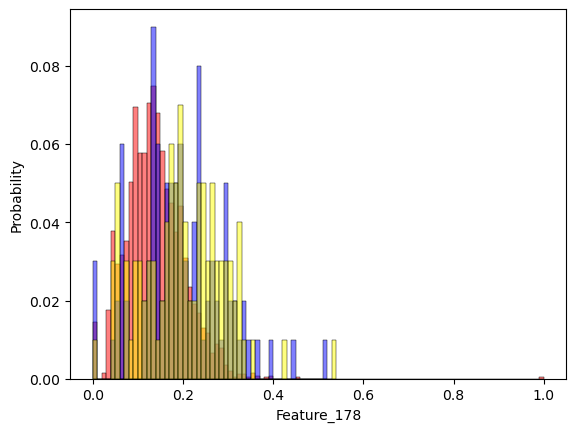

Feature_179
0.007898363353264281


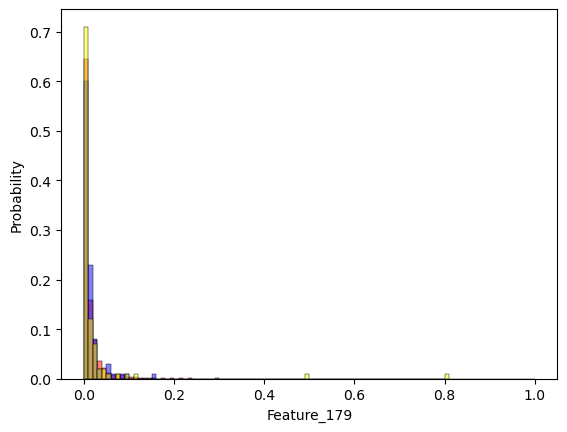

Feature_181
5.172387298813479e-20


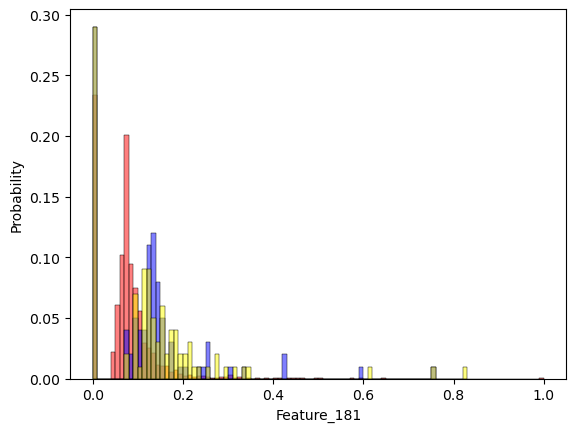

Feature_183
0.9999999967182001


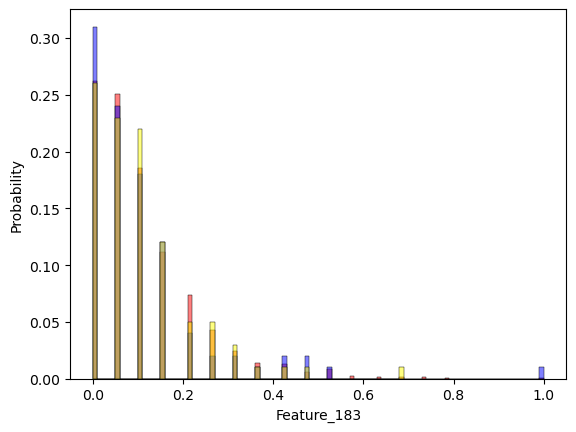

Feature_184
9.582206647757986e-08


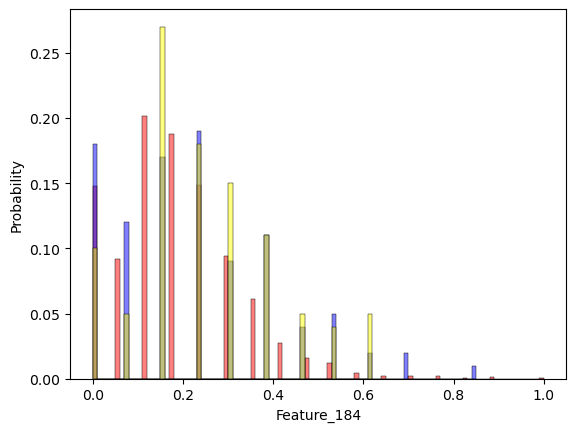

Feature_187
0.62032189545904


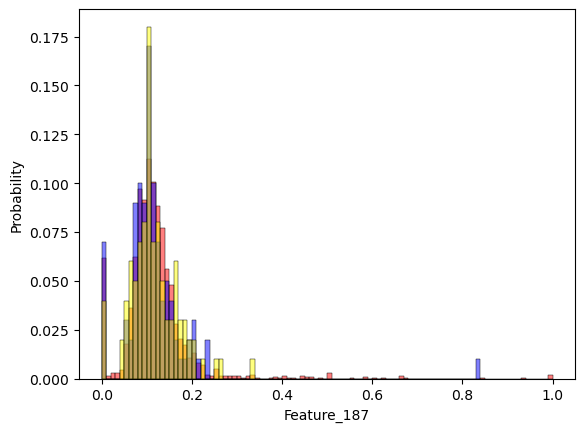

Feature_190
0.2059390757317761


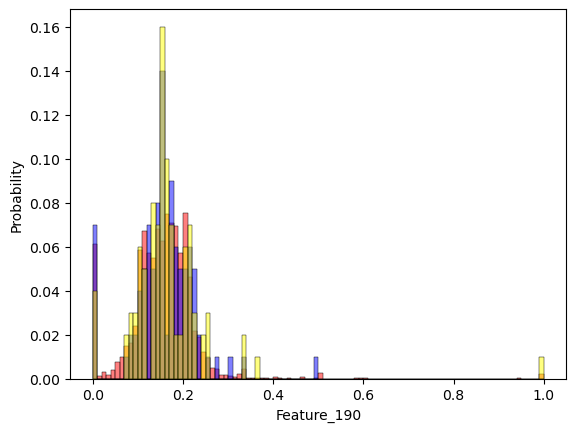

Feature_192
0.37259974872664003


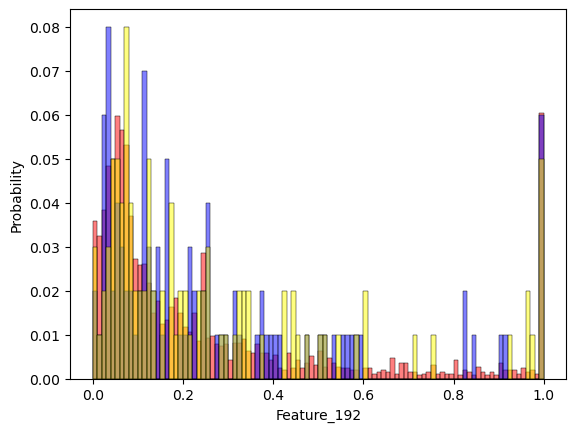

Feature_194
6.619379355769189e-48


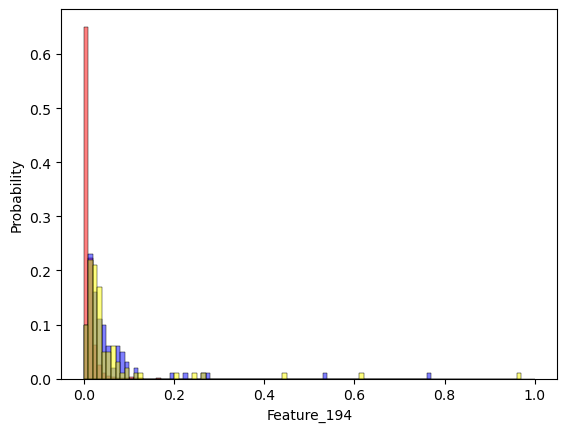

Feature_197
0.2539090515514435


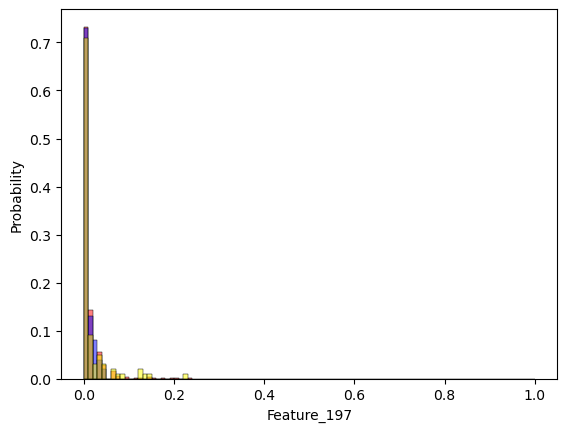

Feature_200
1.0980444839526009e-30


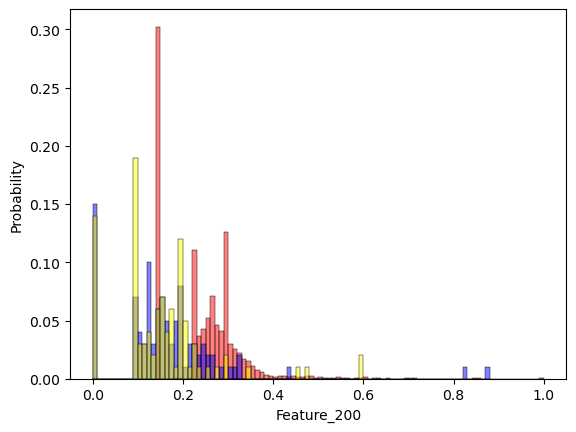

Feature_201
0.8411958889744987


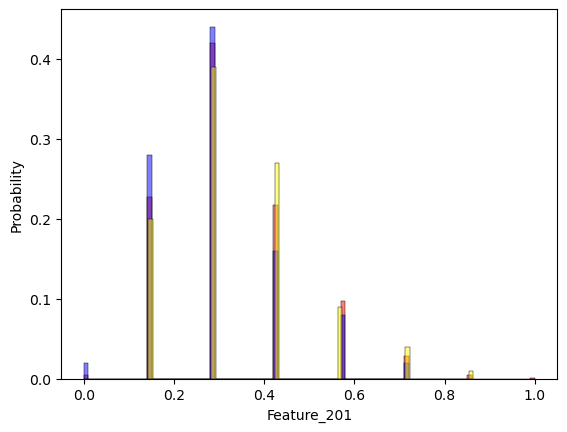

Feature_204
0.20043304665192557


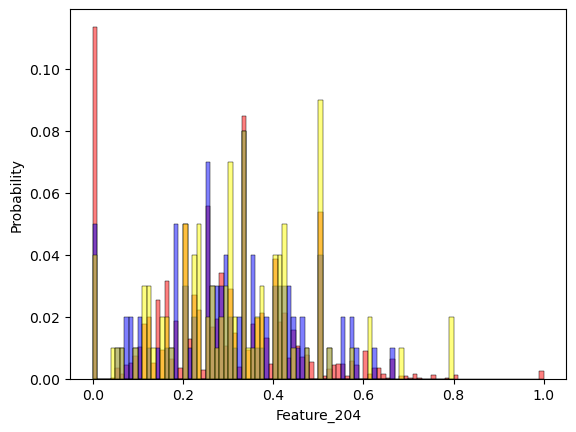

Feature_212
3.4059992182350625e-20


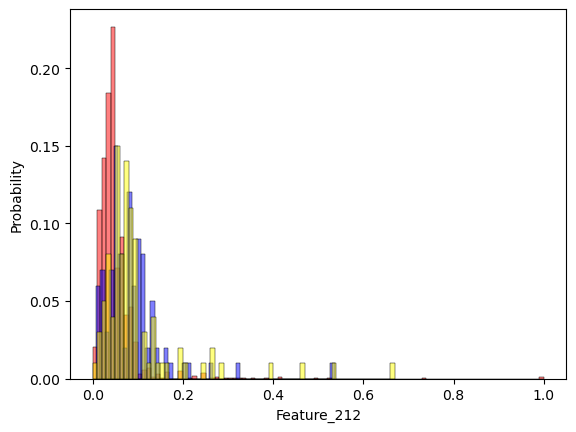

Feature_216
4.1054600344649787e-13


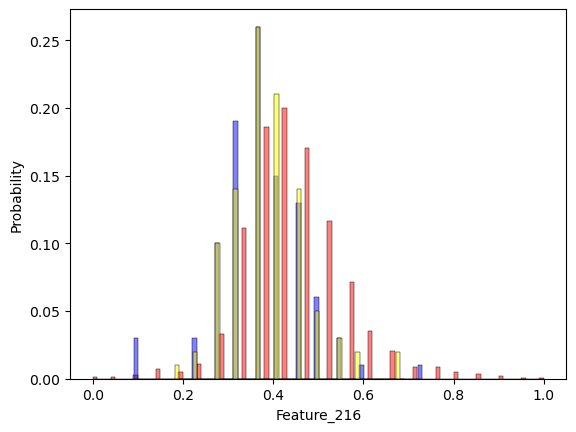

Feature_222
1.6553696266103458e-23


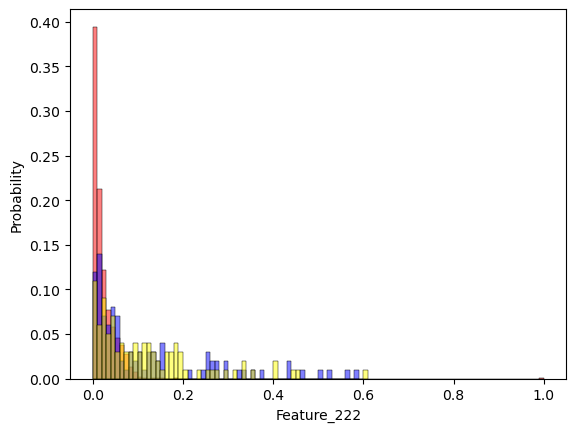

Feature_229
0.028785392608991166


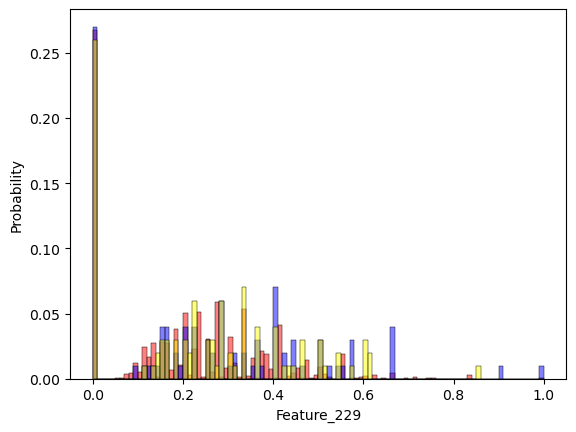

Feature_232
0.00331087386464628


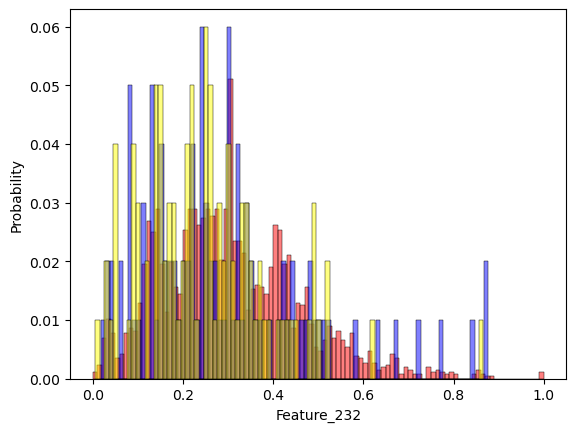

Feature_237
2.2436558161928687e-157


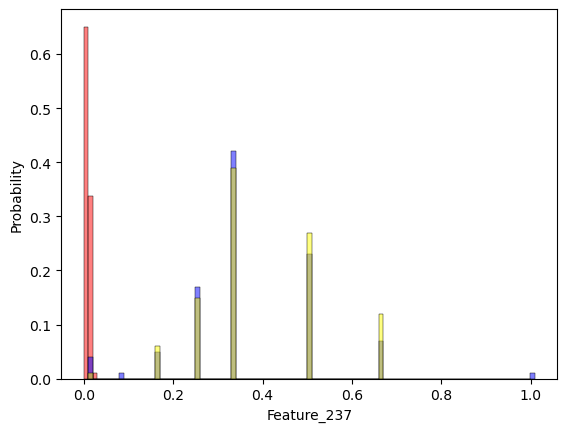

Feature_238
0.09005047626915051


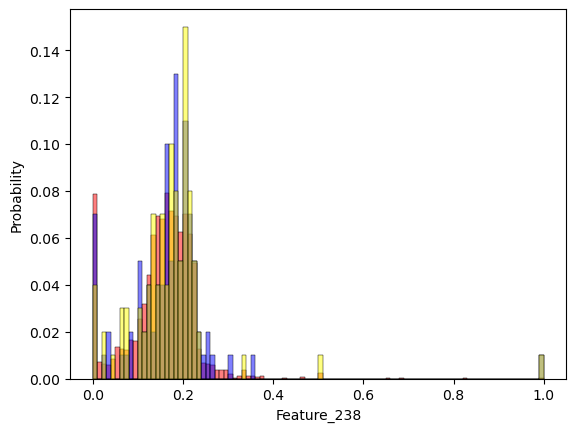

Feature_239
0.0027371778097496835


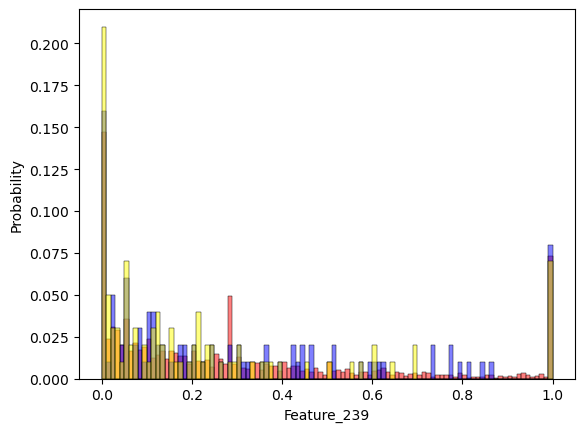

Feature_240
1.6385490296526784e-07


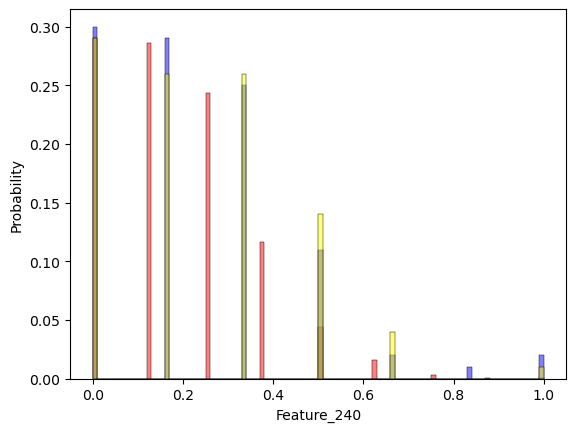

Feature_244
0.00037149748058511357


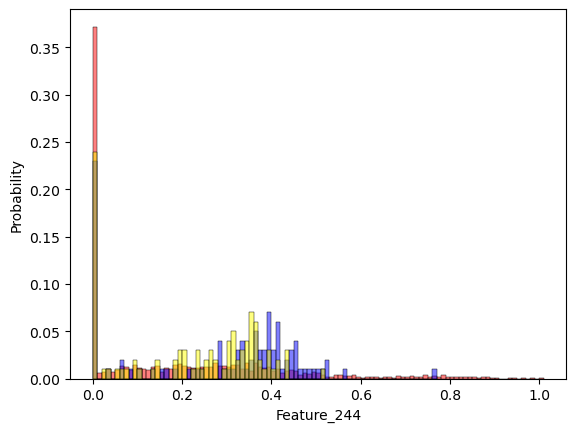

Feature_247
8.088636048962614e-14


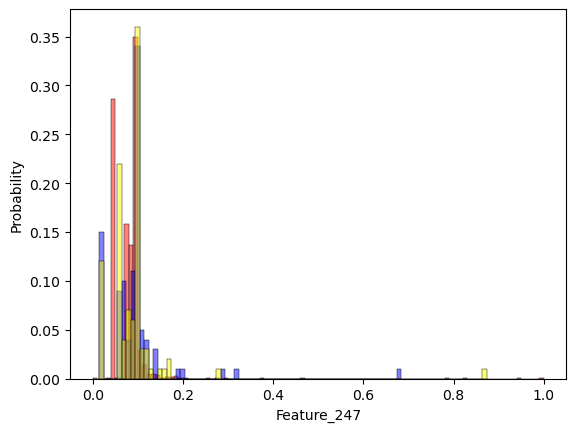

Feature_251
0.00022387527910610426


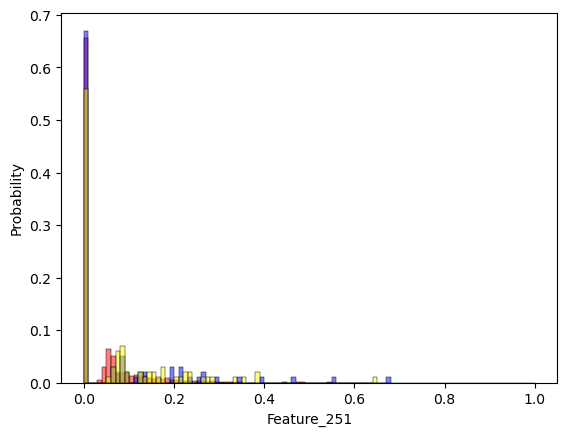

Feature_253
0.14764410676967268


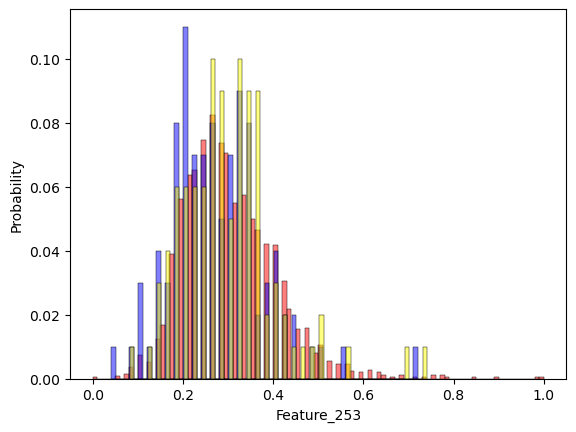

Feature_260
1.8511454161821278e-22


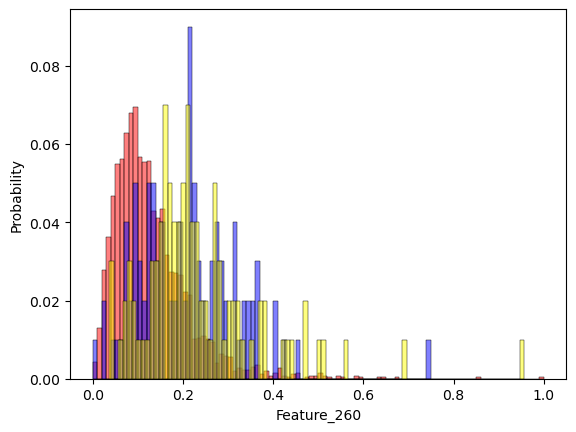

Feature_261
0.021992243201213603


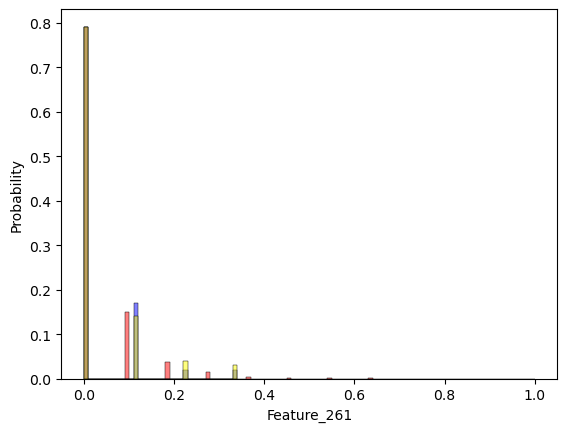

Feature_262
0.5855563252153624


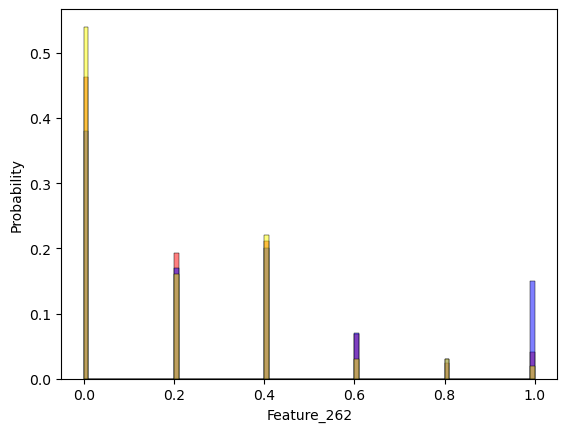

Feature_263
0.3280948686497925


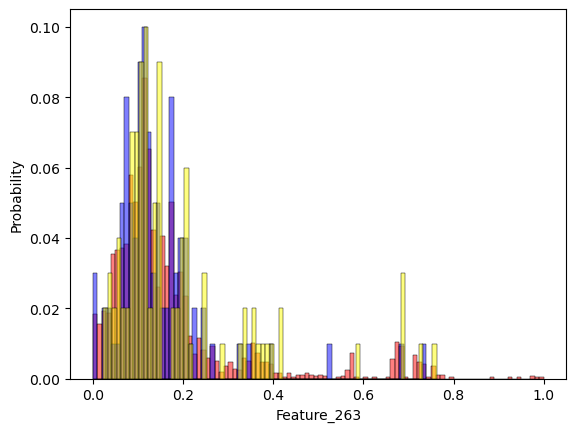

Feature_265
0.018810632181594122


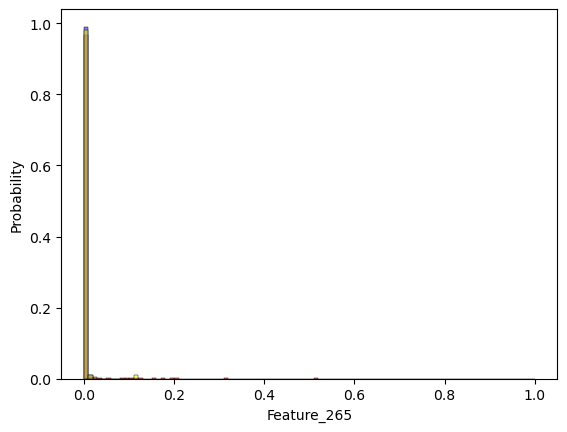

Feature_266
0.0005581604591180268


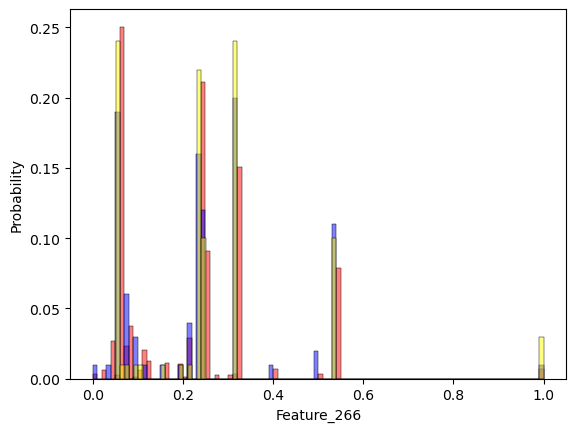

Feature_268
4.758719103639418e-132


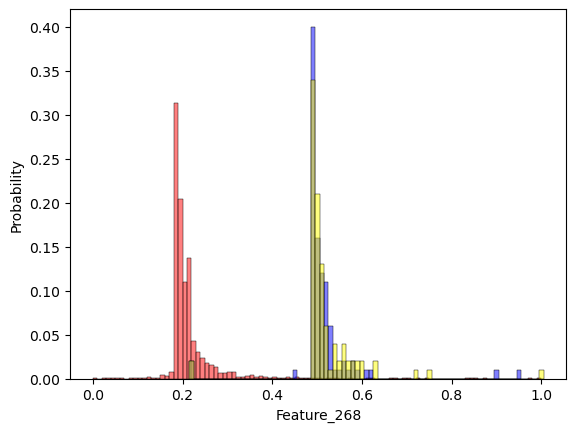

Feature_269
2.9067154907576488e-08


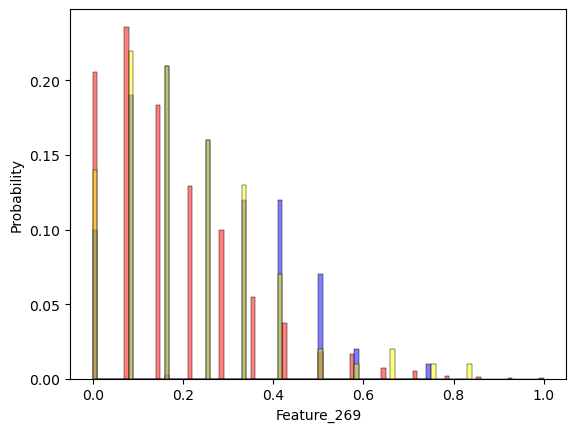

Feature_270
0.5625974978182433


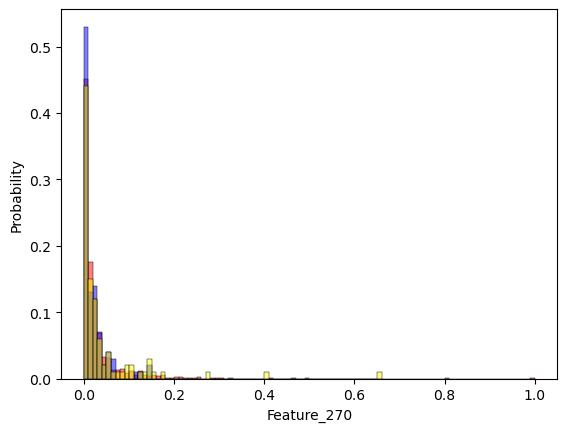

Feature_271
0.01247082187838943


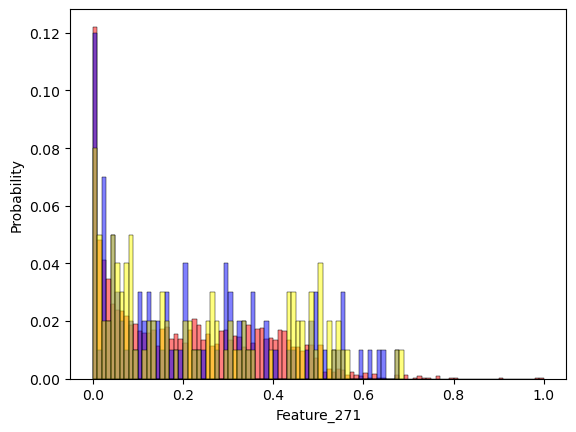

Feature_272
3.816114528128992e-06


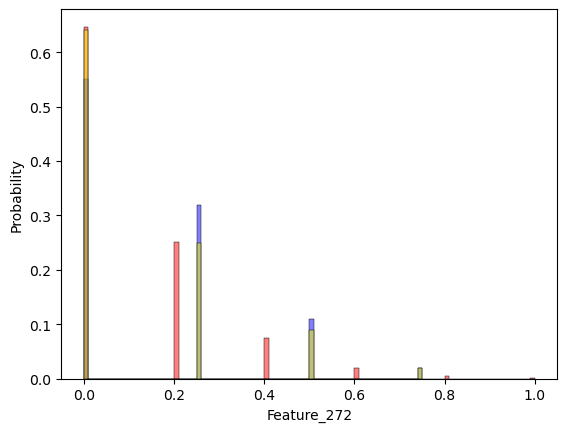

Feature_273
1.0148165656880514e-09


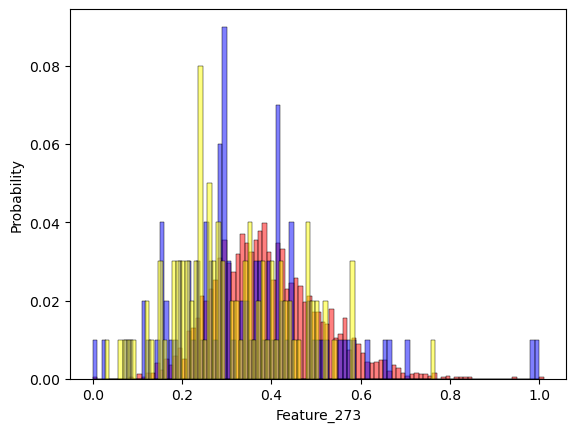

Feature_279
2.2280327110925994e-10


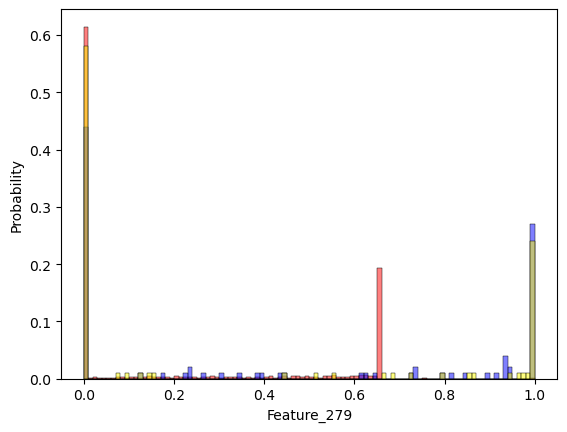

Feature_281
3.163872787534259e-09


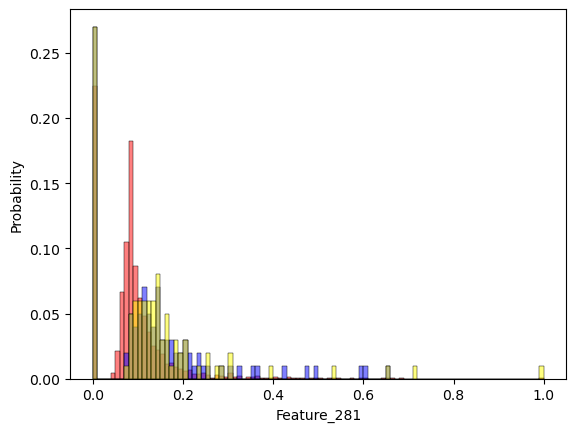

Feature_290
0.09748857983503871


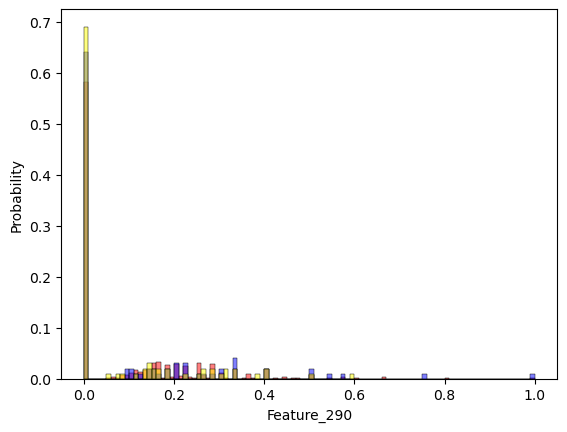

Feature_291
6.20146666262039e-143


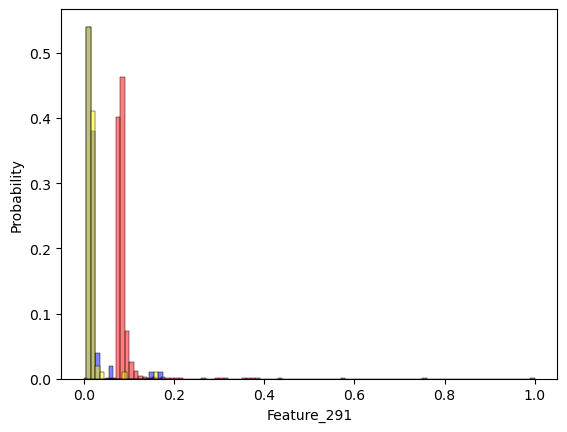

Feature_294
0.0021647470822021737


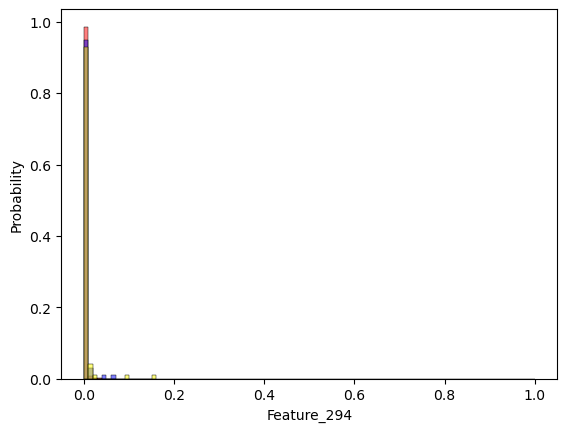

Feature_297
5.582588142614672e-10


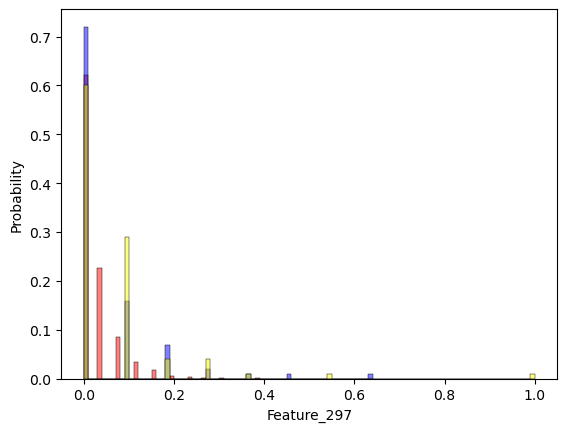

Feature_301
0.5159368579867626


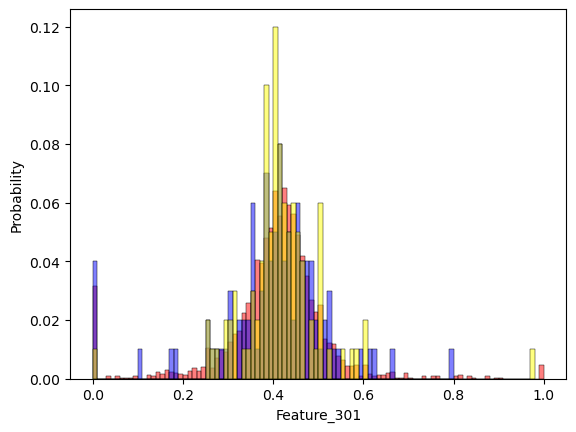

Feature_302
1.0763864024047951e-06


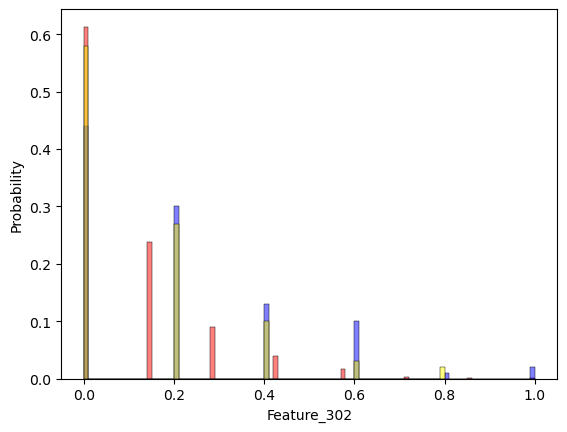

Feature_303
0.16775911574653302


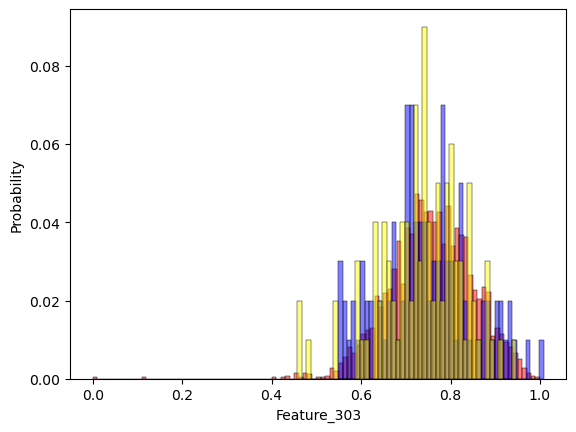

Feature_304
0.03139108836583077


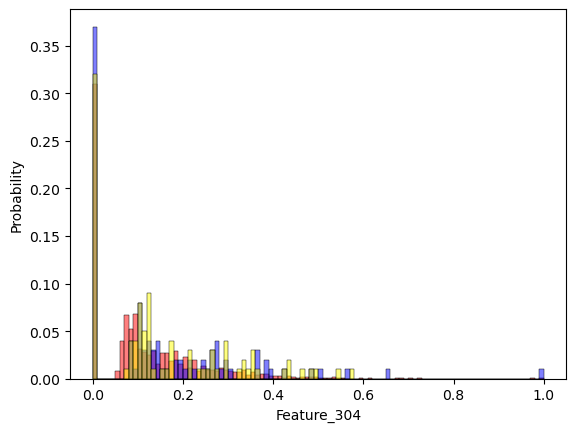

Feature_305
2.394177381946749e-12


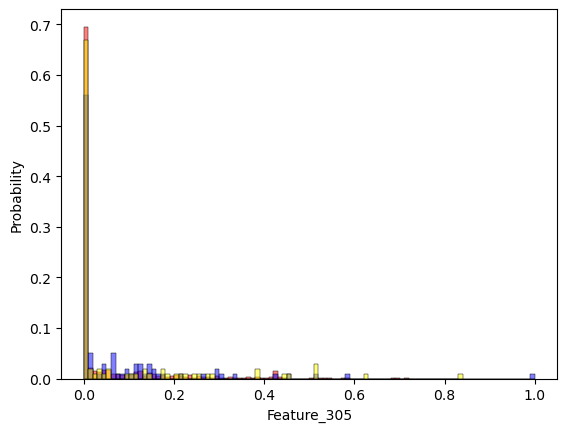

Feature_306
0.7240915260069938


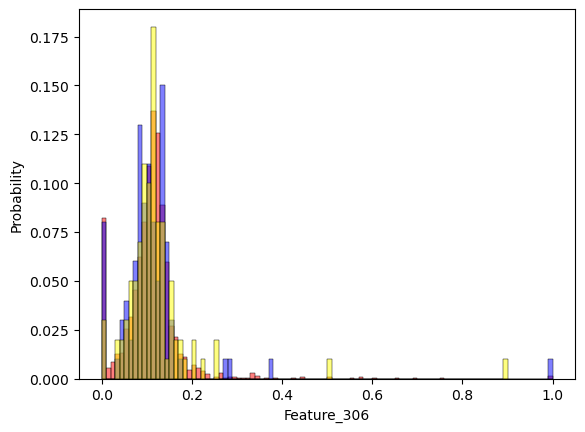

Feature_309
0.5683995826280163


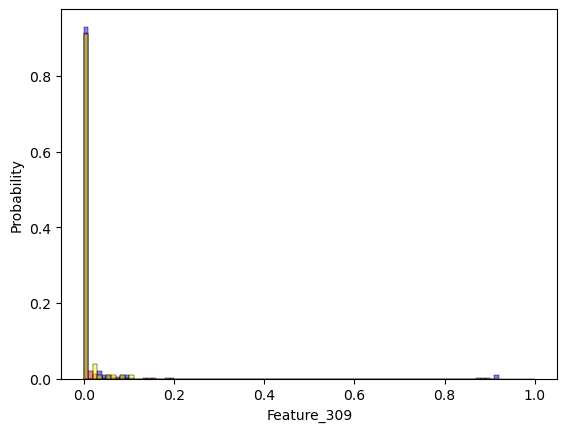

Feature_312
5.331401966601324e-15


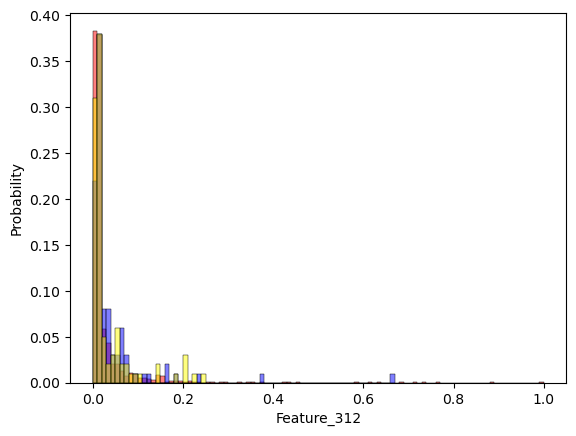

Feature_318
4.878161234559901e-11


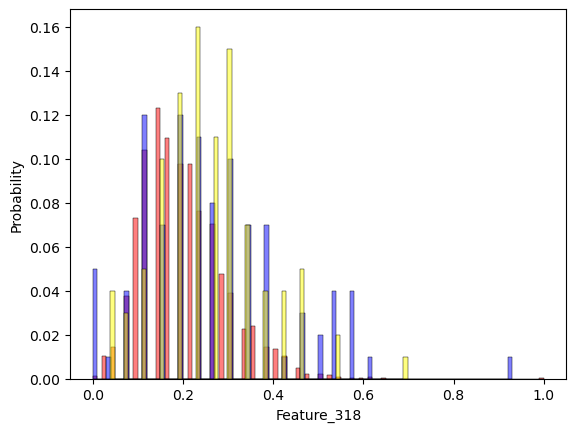

Feature_319
3.082780731719472e-51


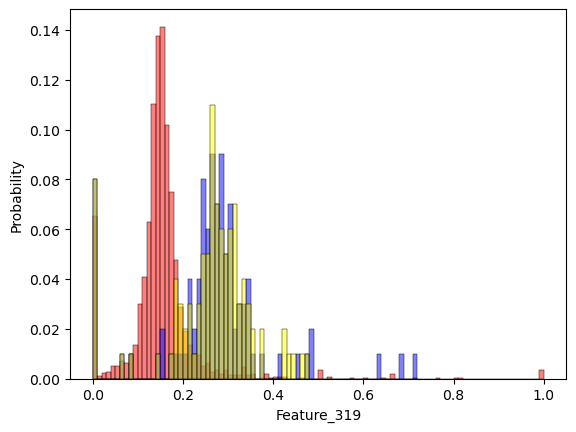

Feature_324
0.025669135109397896


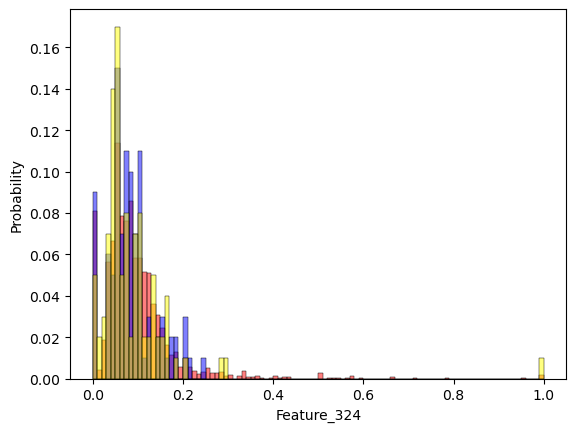

Feature_326
9.495147915778386e-22


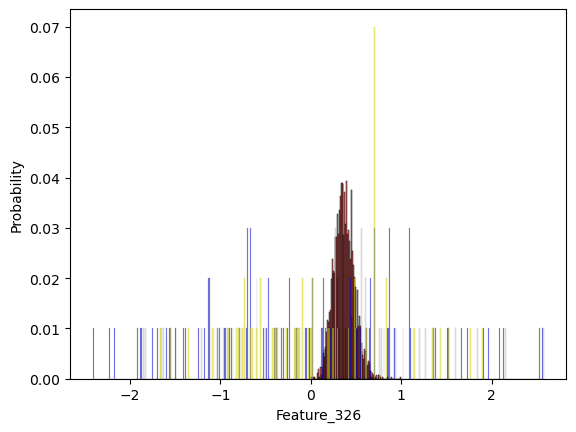

Feature_327
0.014681403794080049


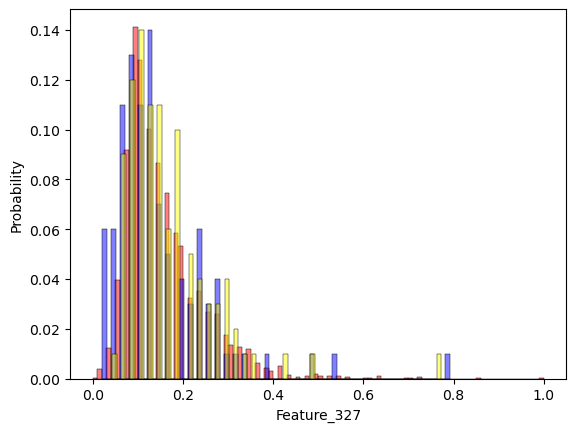

Feature_336
0.020742685099891654


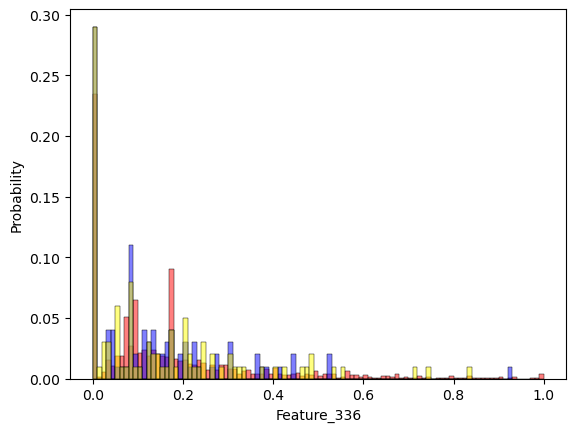

Feature_337
0.00021340135846566717


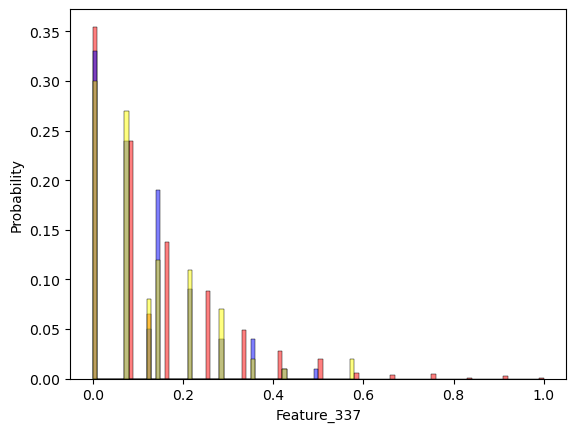

Feature_339
1.653753346874175e-66


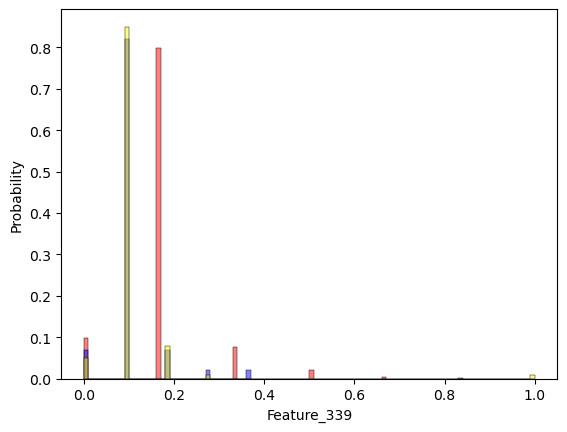

Feature_343
2.6427730213372566e-05


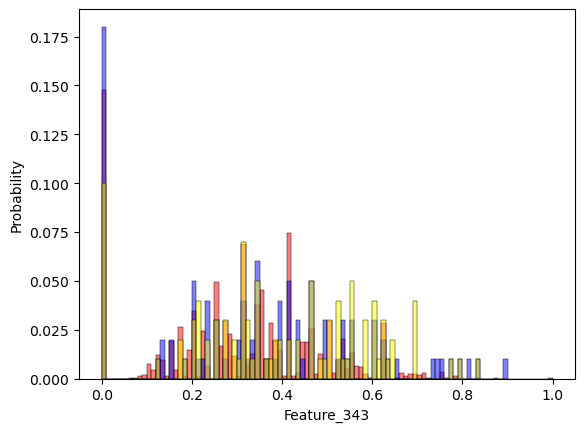

Feature_344
0.5169364126686259


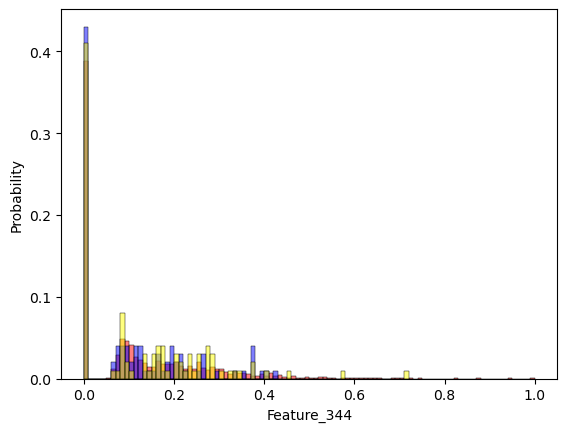

Feature_346
1.058695486751785e-05


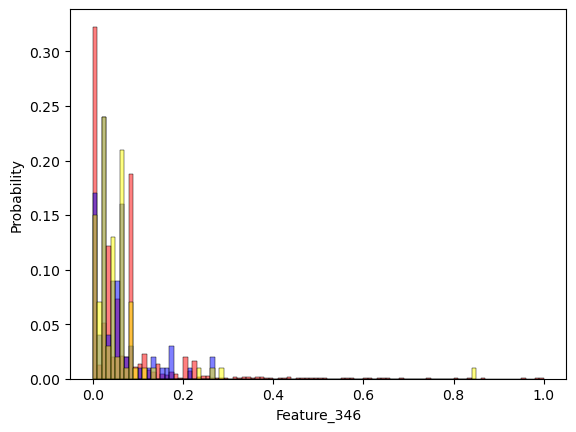

Feature_347
6.85400490255041e-10


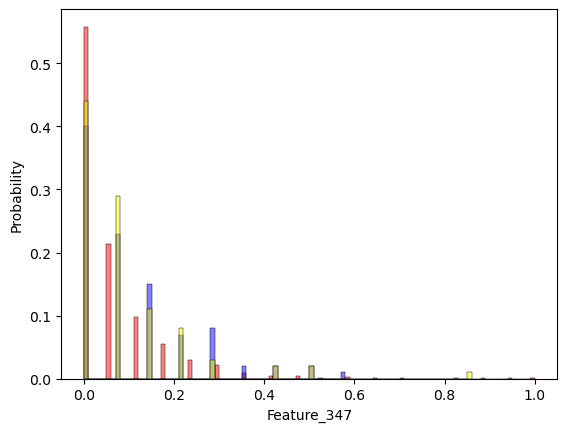

Feature_349
0.21386977589249268


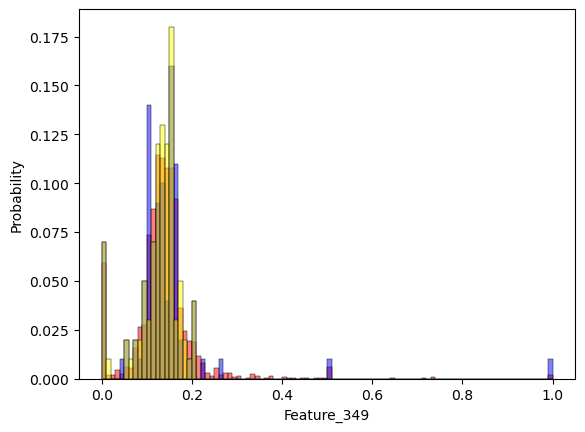

Feature_350
0.4536116059095087


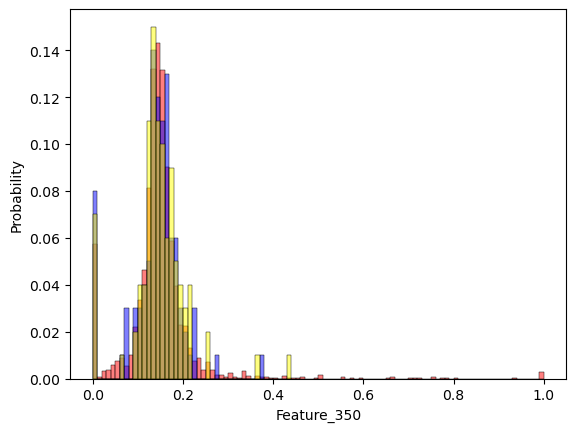

Feature_352
0.09076433826451866


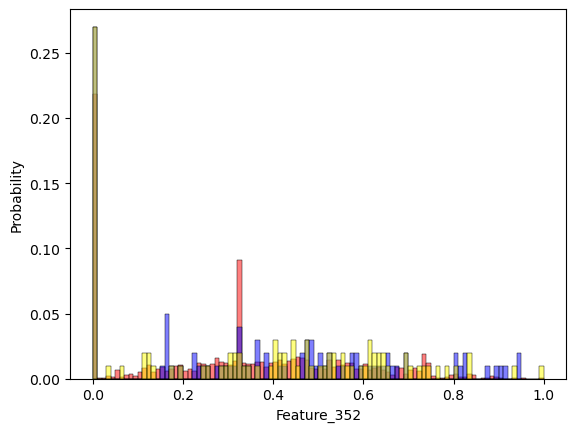

Feature_353
0.9575897485686554


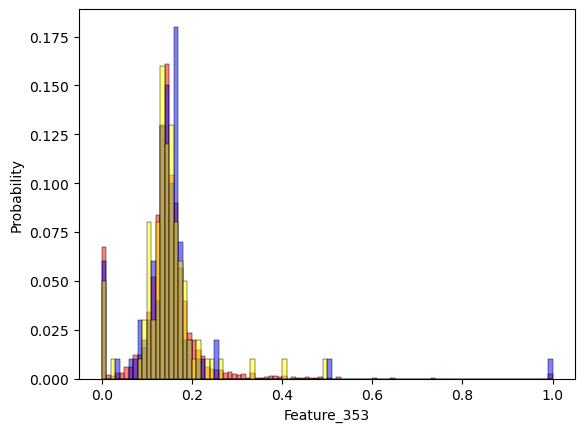

Feature_359
0.0431256790292416


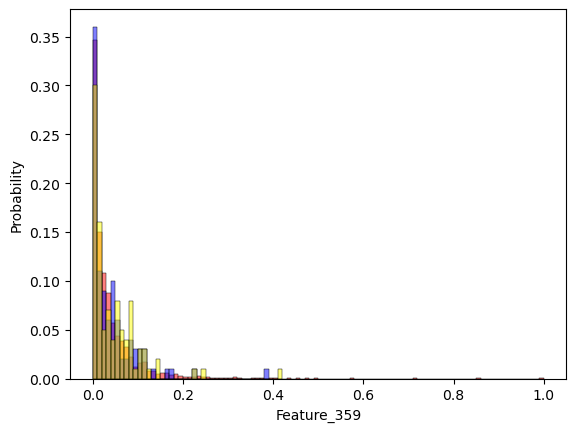

Feature_361
0.19724844264541302


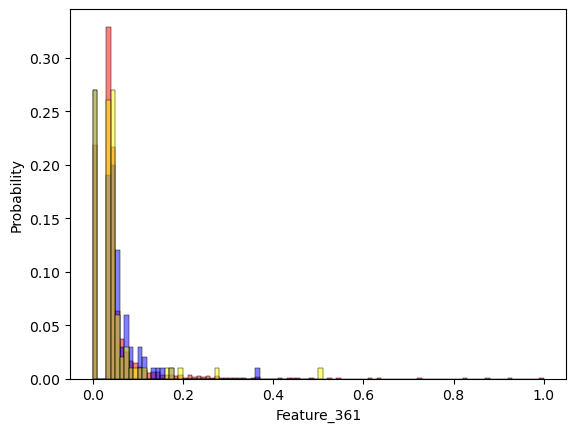

Feature_363
2.1755082587726817e-09


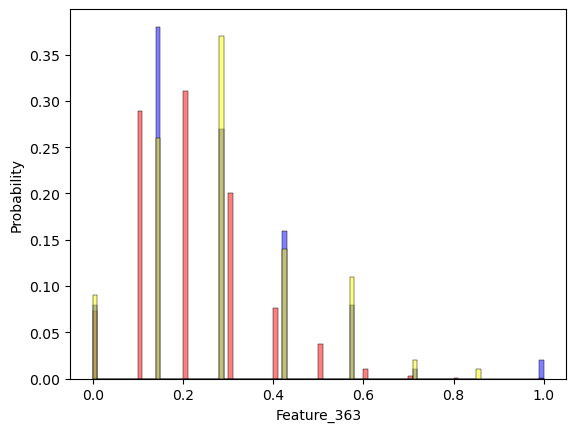

Feature_376
0.9947895259368607


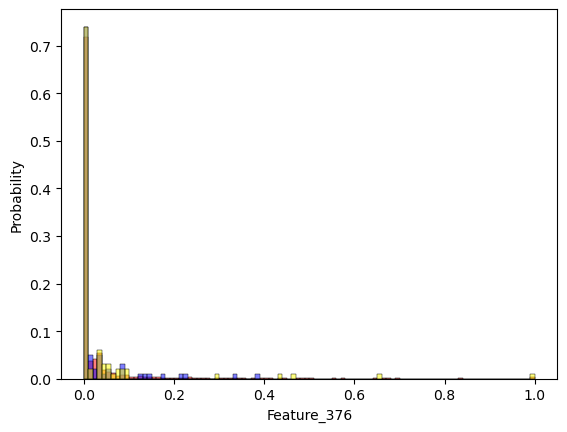

Feature_378
4.8192603985327664e-20


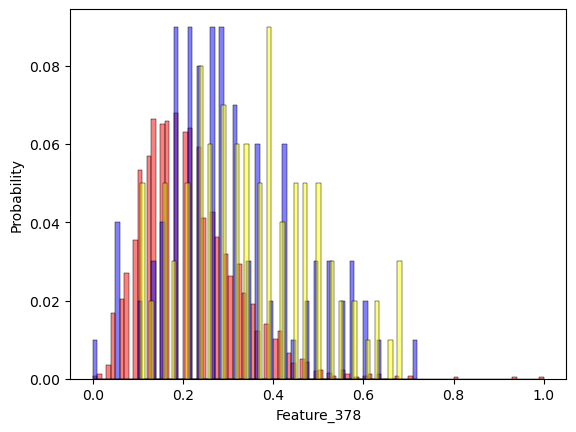

Feature_383
0.0009147058481778447


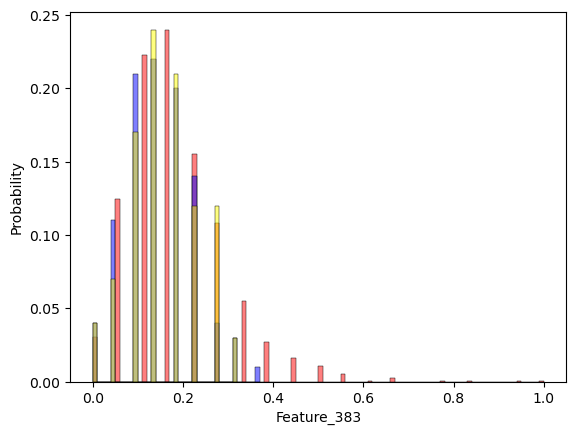

Feature_384
1.0366893156972873e-19


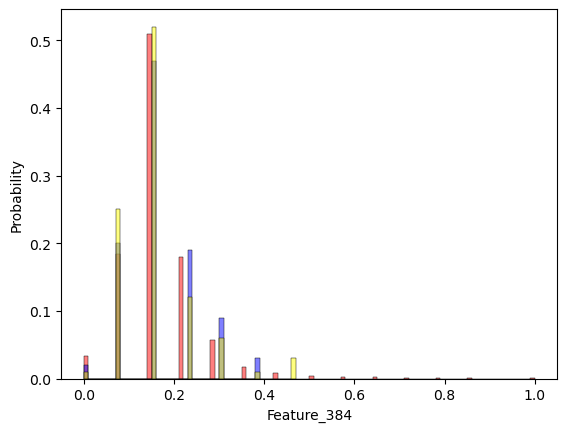

Feature_386
7.807995561931432e-36


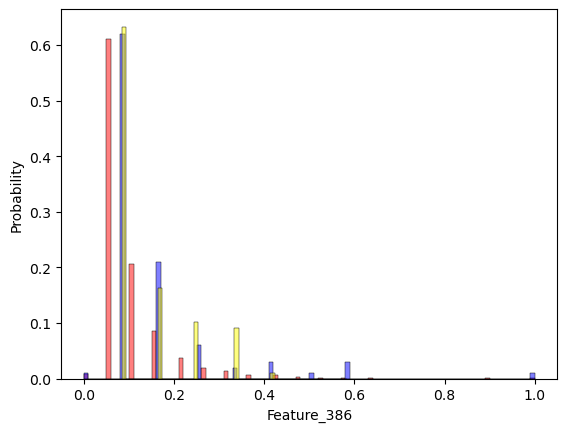

Feature_388
0.876003841352576


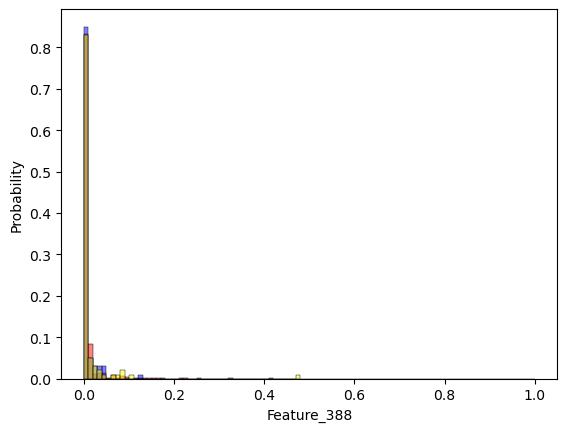

Feature_391
1.0279714322769371e-21


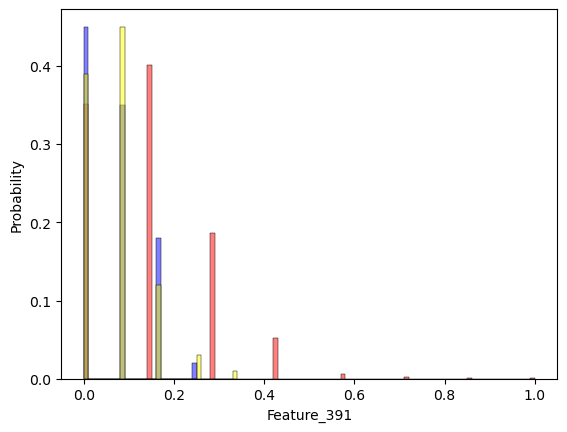

Feature_398
0.00018263965165925085


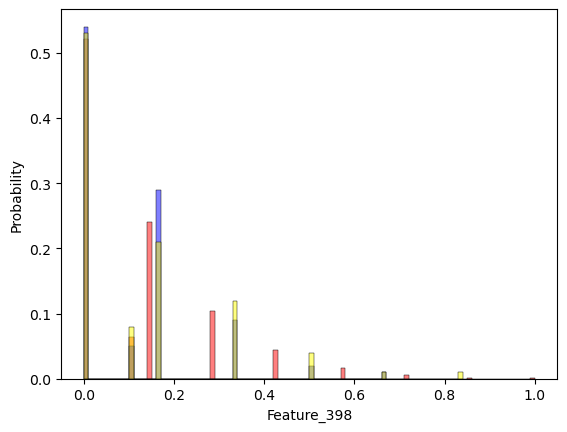

Feature_399
0.9891312416447454


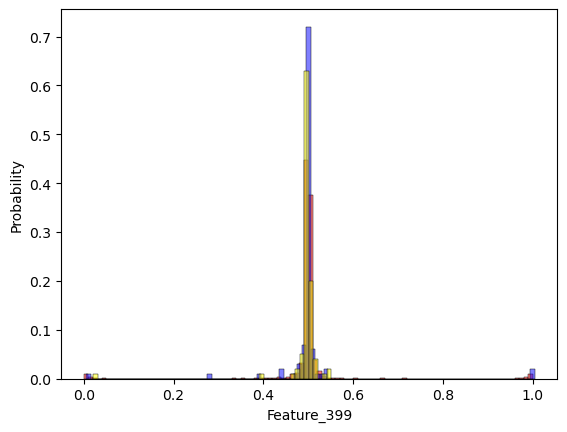

Feature_400
0.5670315155693144


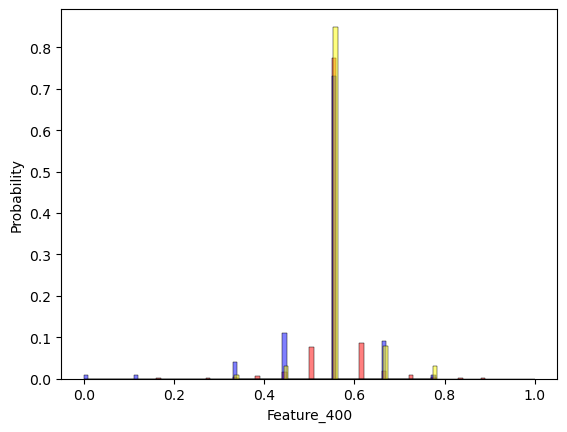

Feature_401
1.7902347158947494e-142


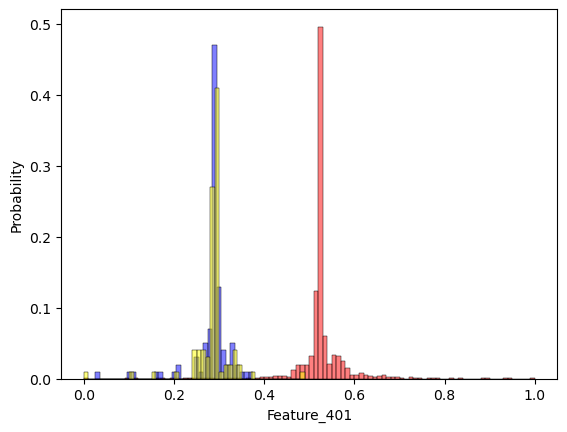

Feature_402
1.6368669576913757e-177


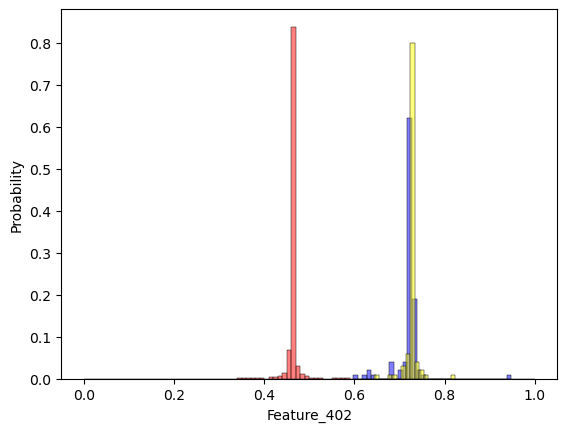

Feature_403
1.4541353862594732e-10


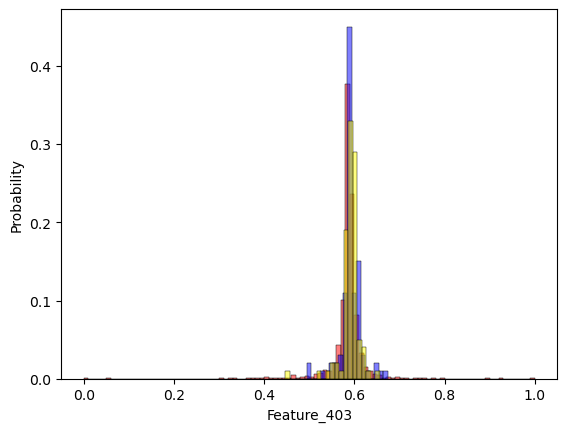

Feature_406
2.2462653831153948e-102


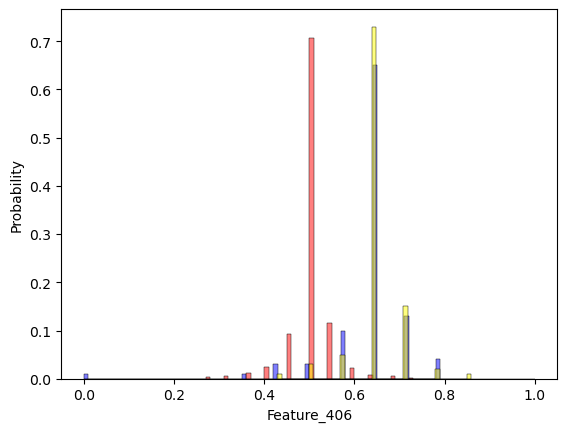

Feature_407
2.7101924013429105e-60


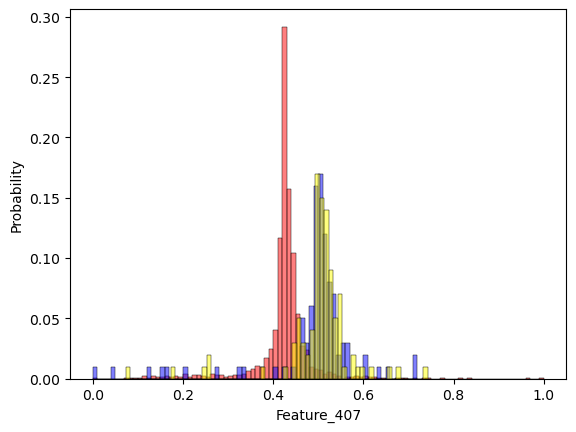

Feature_408
0.0006886023939927315


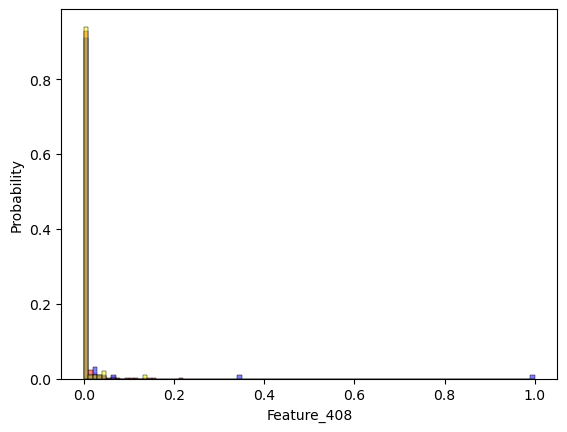

Feature_410
1.2499264335278601e-11


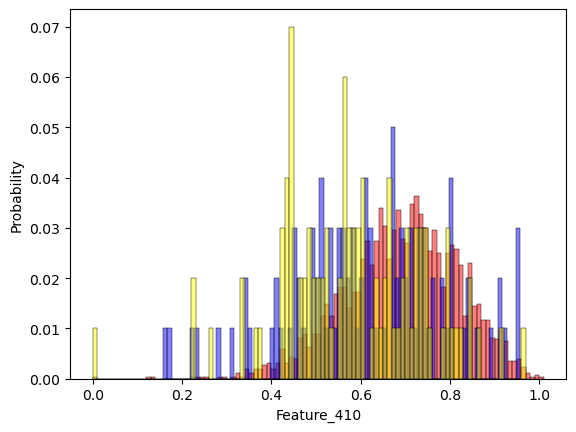

Feature_411
4.943198208131241e-15


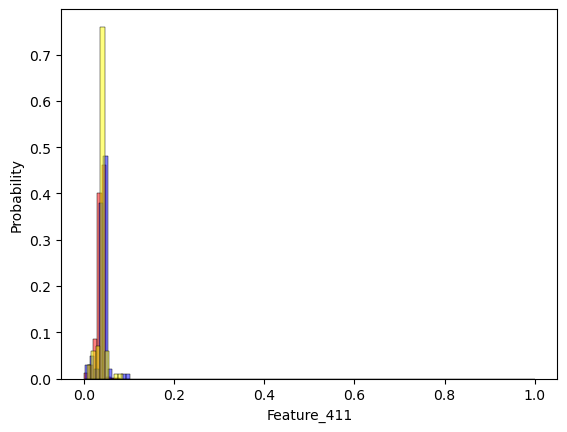

Feature_412
8.231708533430153e-82


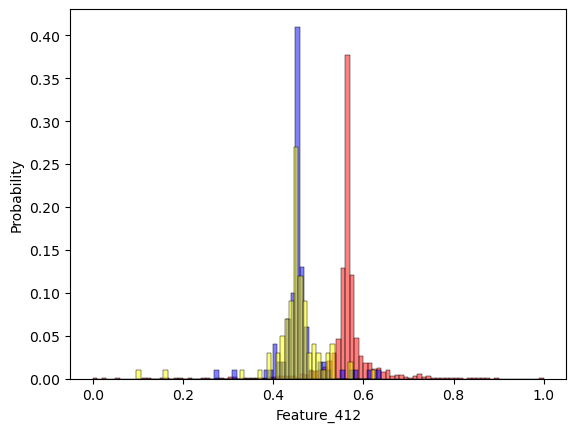

Feature_413
1.0044347373027812e-17


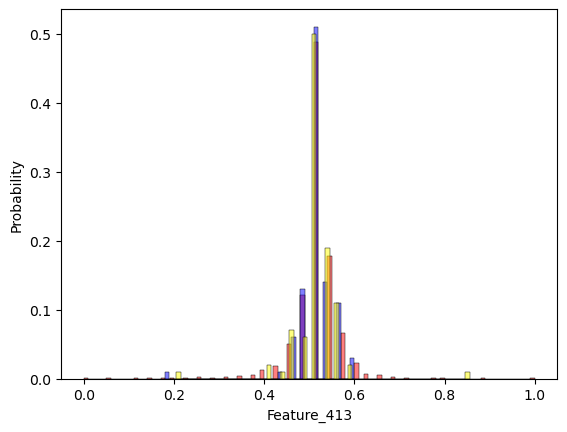

Feature_416
0.4832500290906215


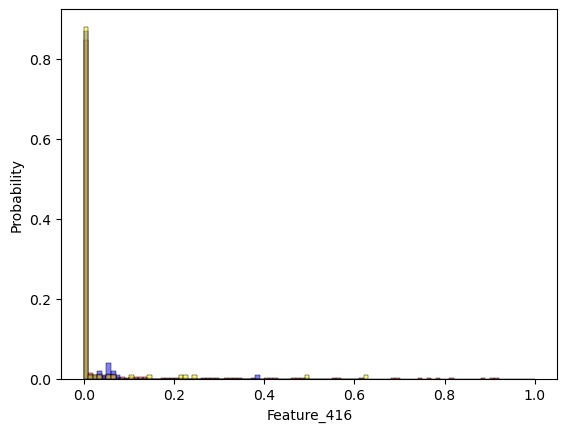

Feature_417
1.3510345484026722e-54


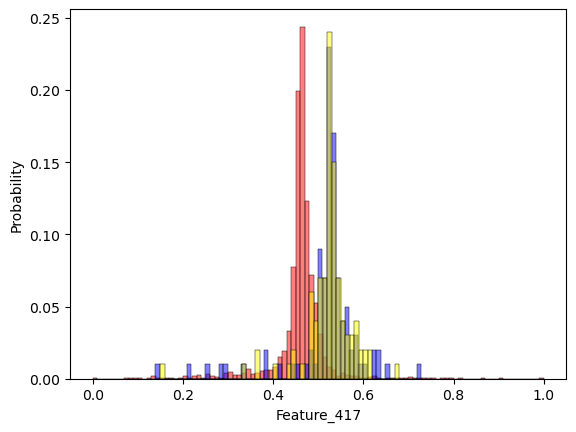

Feature_419
1.3922771430721227e-107


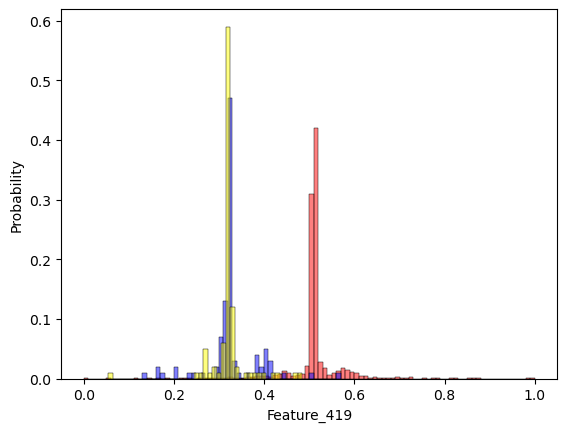

Feature_421
2.48532712828606e-128


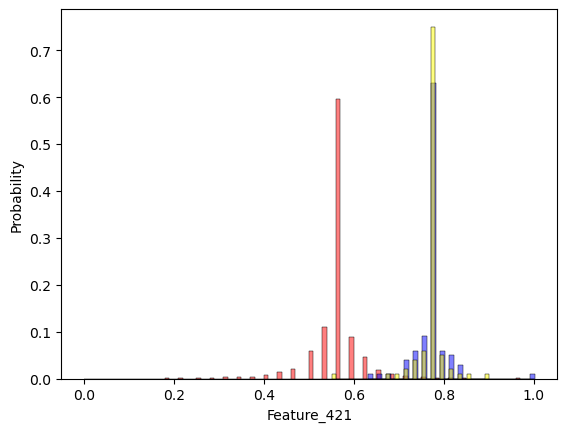

Feature_422
5.704351672778902e-139


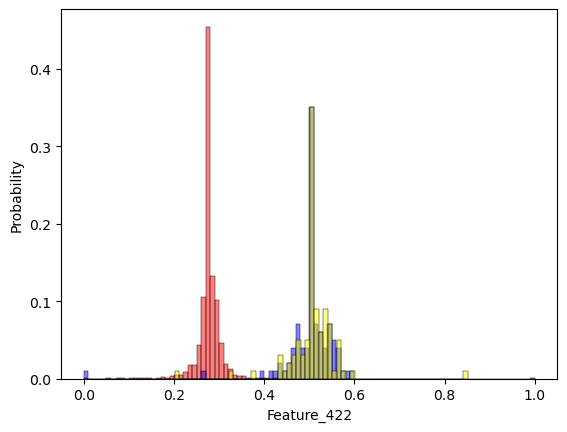

Feature_427
1.048813067604499e-161


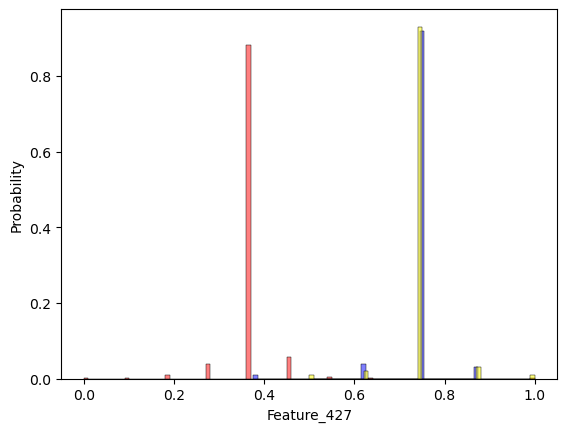

Feature_428
9.145075525040335e-122


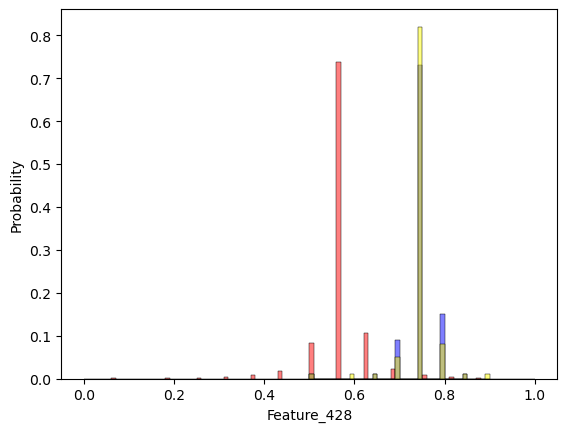

Feature_429
3.2939738698440724e-78


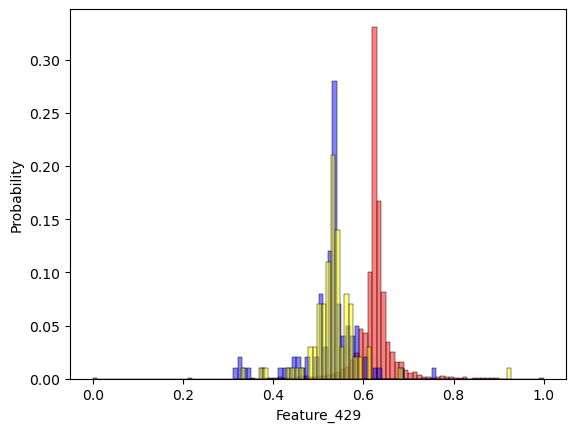

Feature_431
5.105484189921535e-142


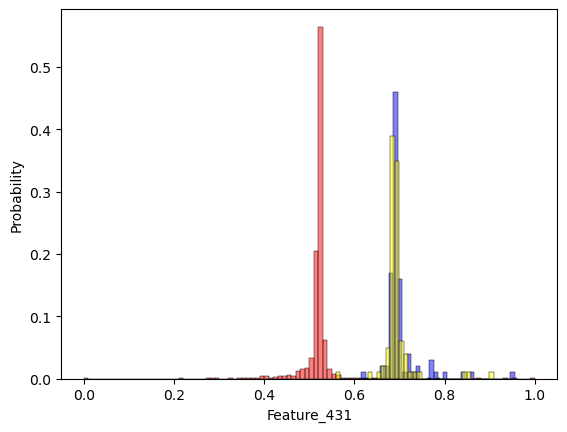

Feature_432
1.0707118152402917e-131


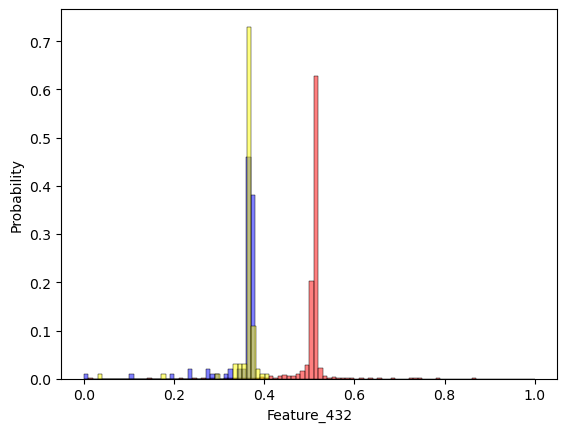

Feature_433
0.00843508401007822


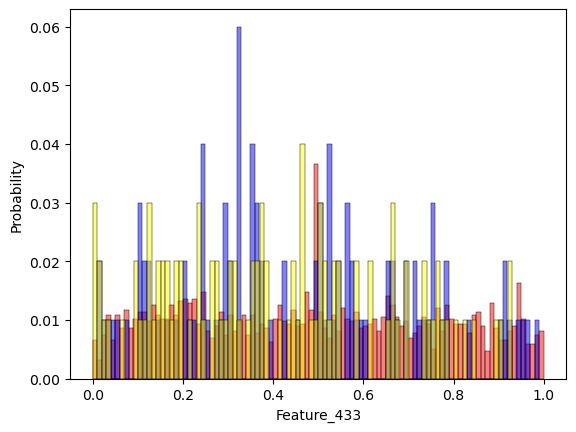

Feature_437
0.6481665040852592


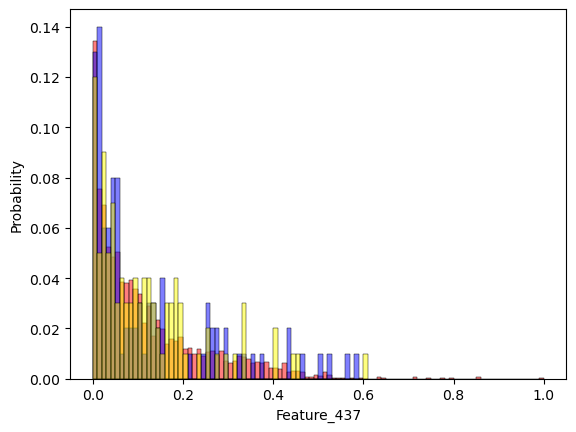

Feature_441
1.7054527056696366e-18


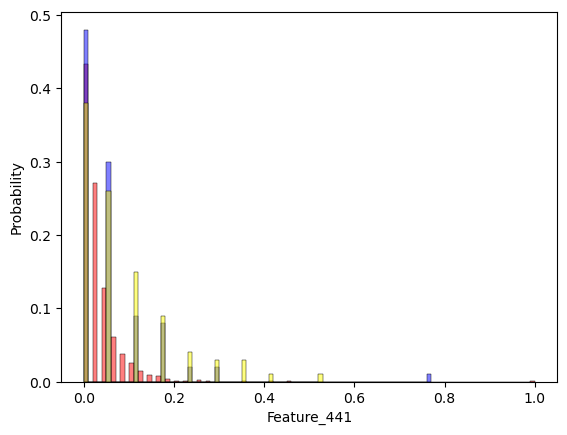

Feature_444
0.9999999999998985


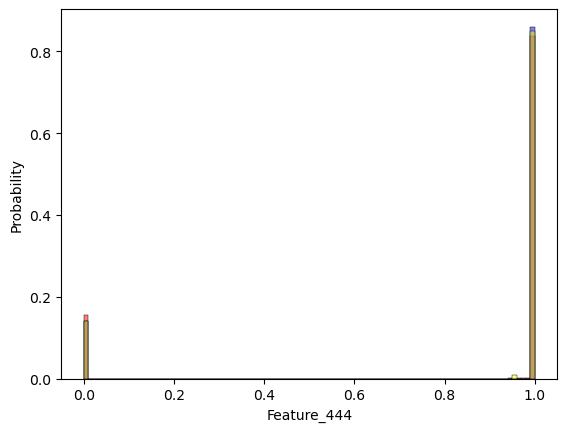

Feature_445
0.12838744948831232


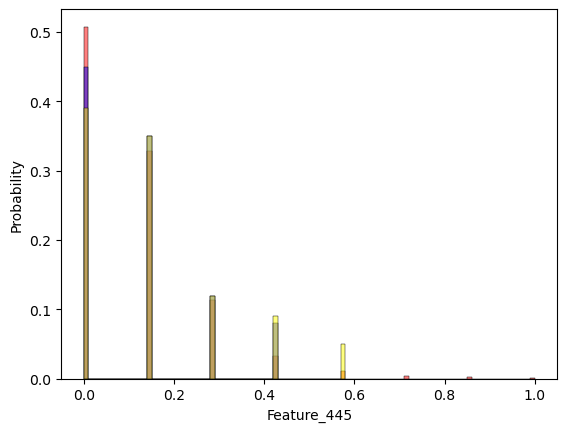

Feature_446
0.0015679567831109467


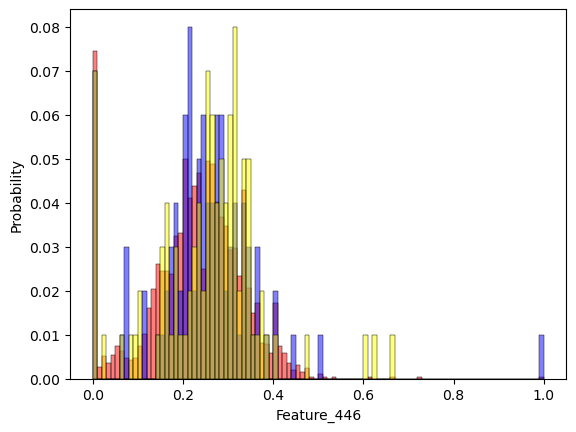

Feature_454
1.2486569152506965e-18


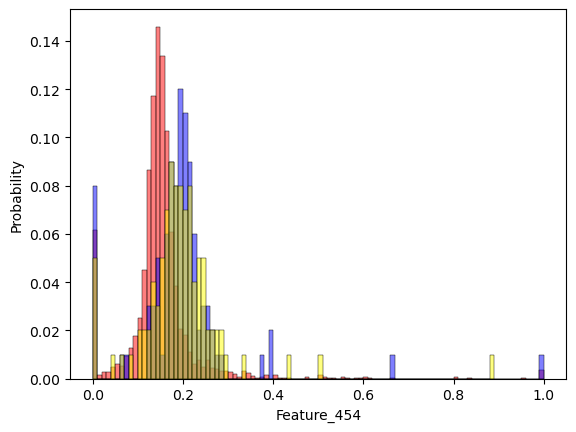

Feature_463
0.9868497943833745


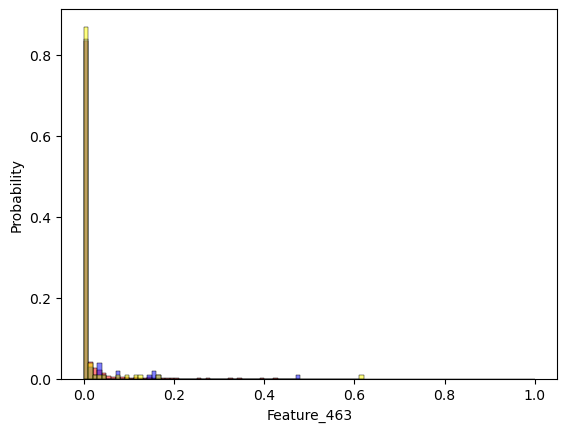

Feature_467
0.7185035912502233


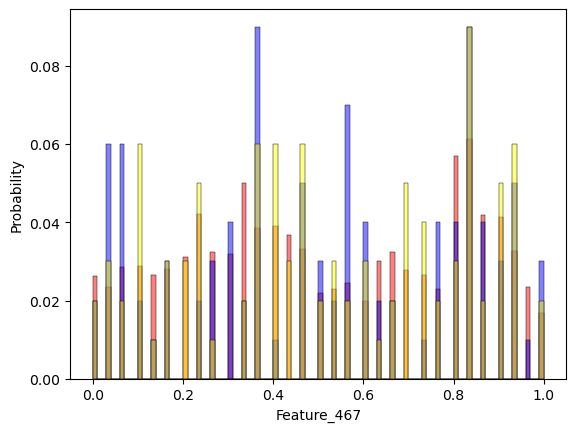

Feature_471
6.52546725026445e-23


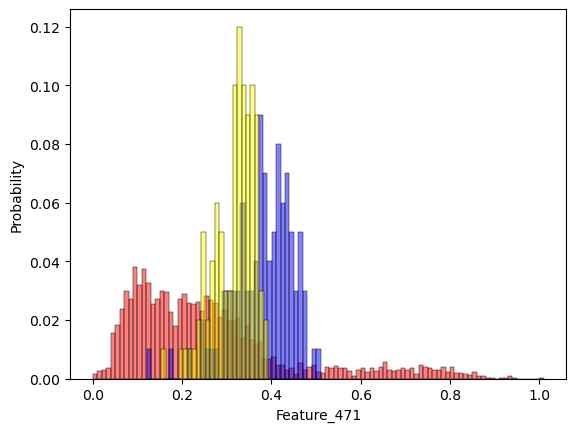

Feature_473
0.8023128572006296


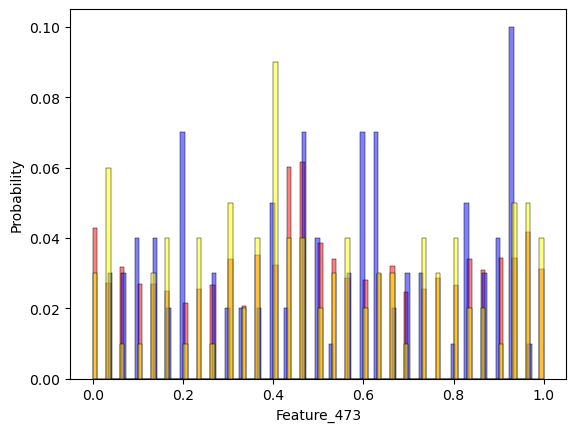

Feature_474
0.9386492018337826


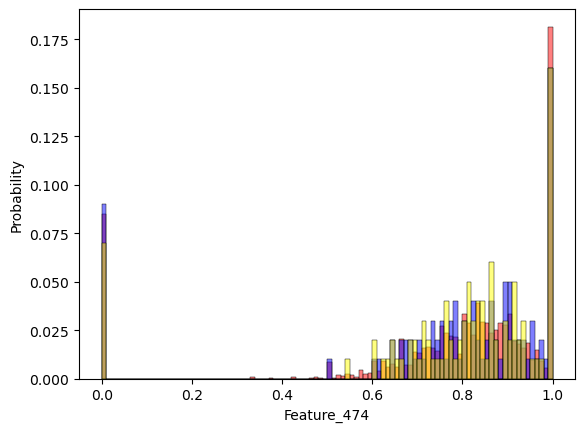

Feature_475
0.9999996017636926


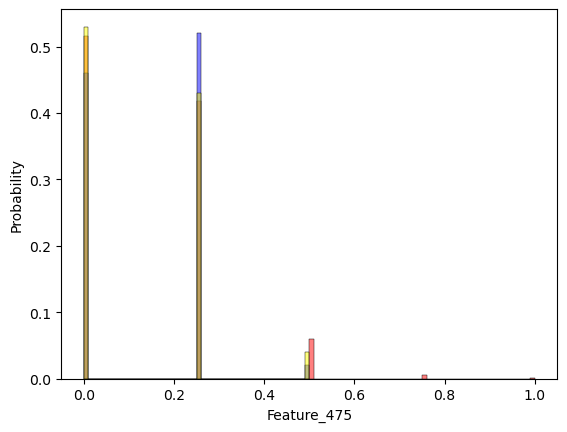

Feature_477
4.963766845293687e-40


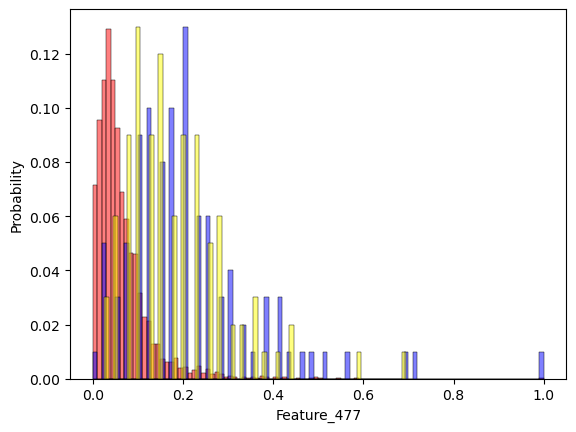

Feature_478
0.6396968523643942


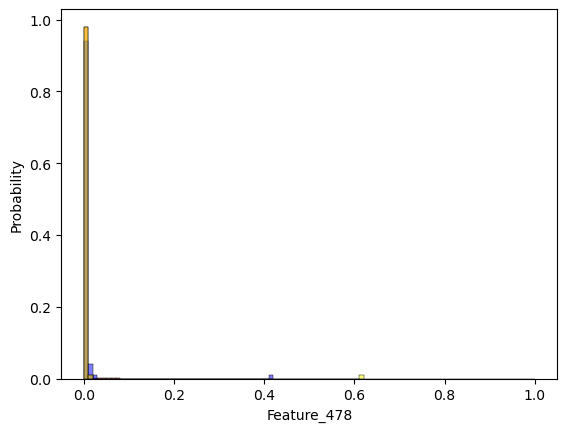

Feature_481
0.2269388177993736


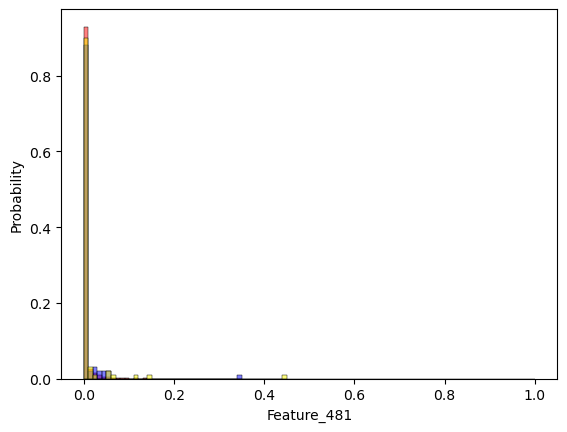

Feature_482
0.8585584739039335


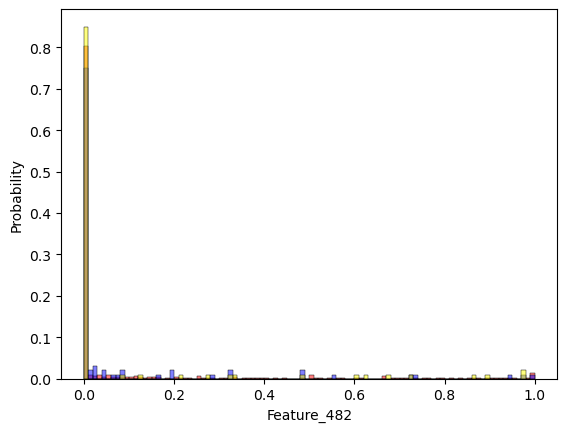

Feature_484
0.9108771458719181


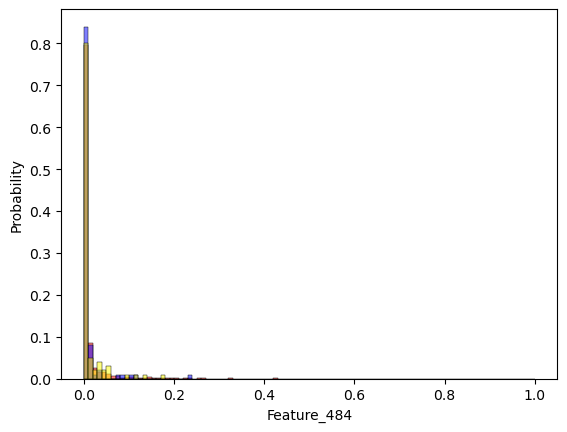

Feature_485
0.17512786491787072


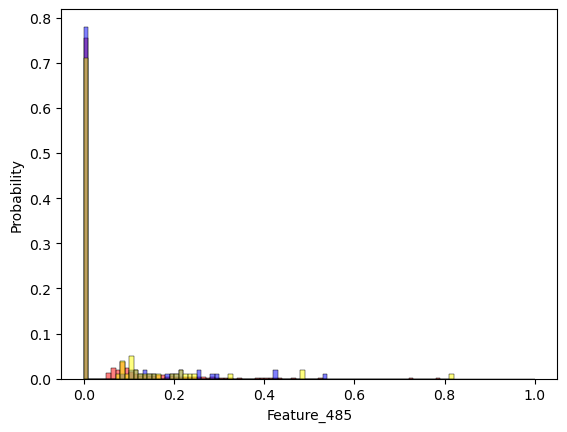

Feature_486
0.0325452303016687


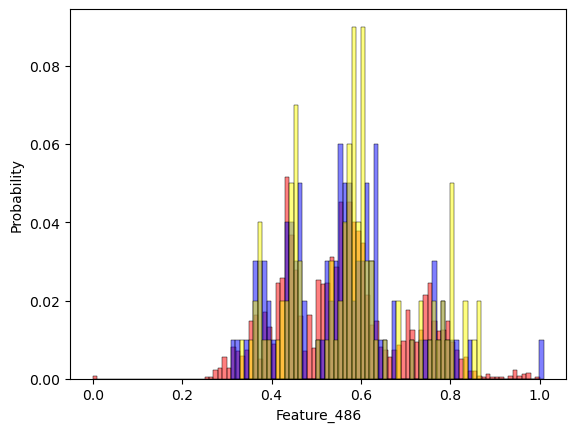

Feature_489
0.0009116323446619059


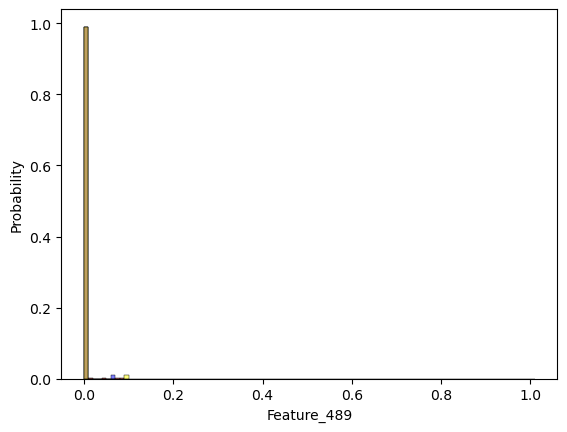

Feature_490
0.0004996396657840831


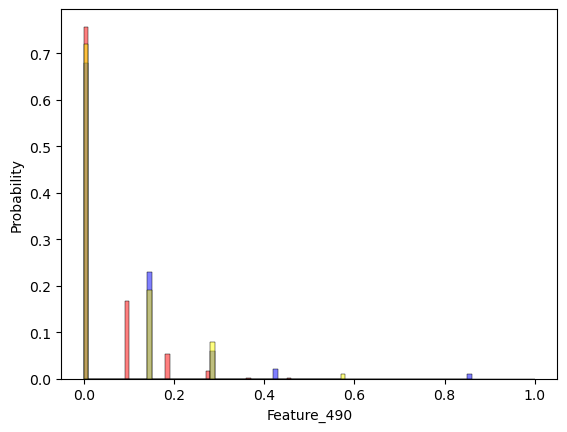

Feature_492
1.462198830319032e-17


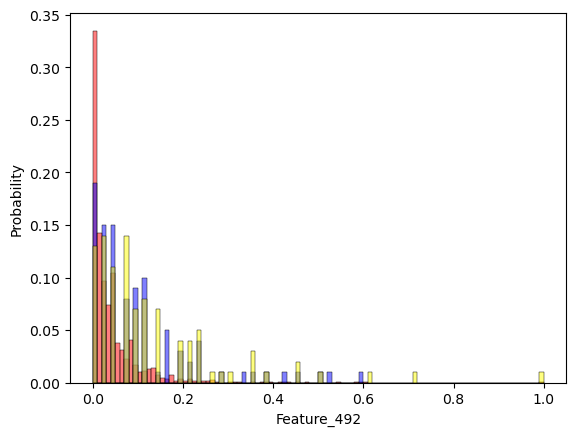

Feature_493
0.9999085348081552


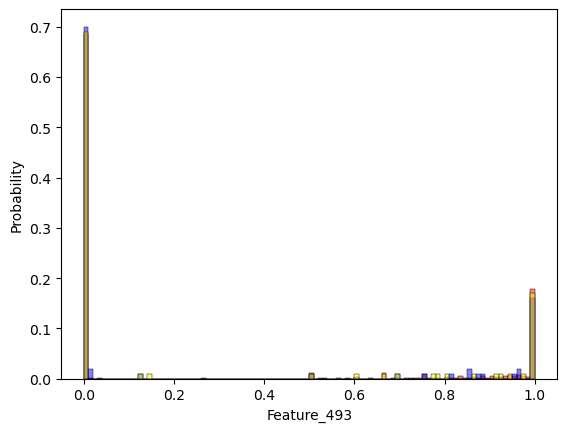

Feature_496
0.09417589703722483


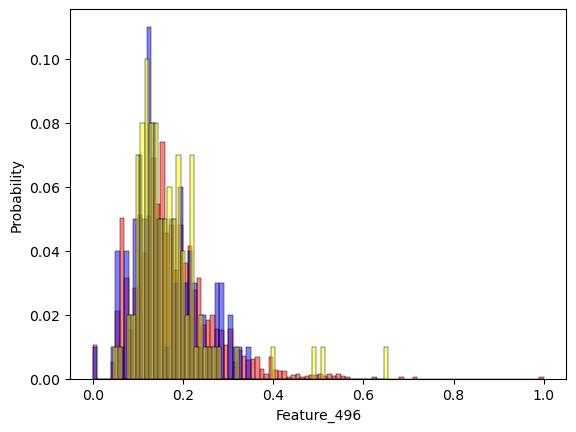

Feature_498
0.20667237275933334


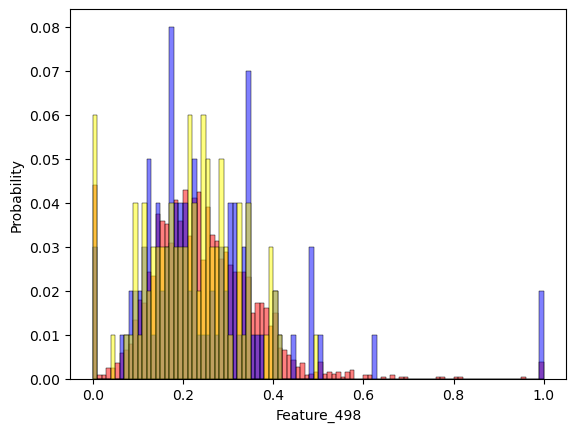

Feature_499
0.3453903535922312


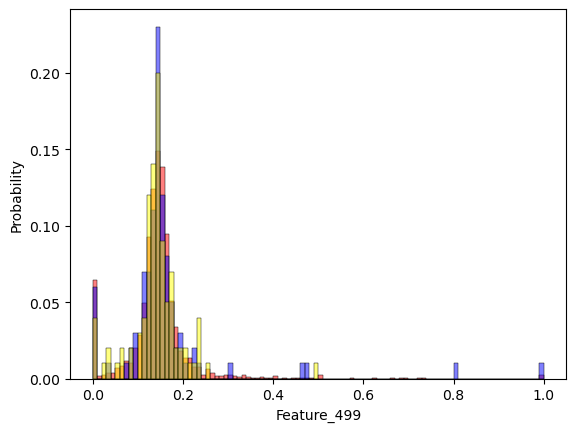

Feature_502
0.5801294806882717


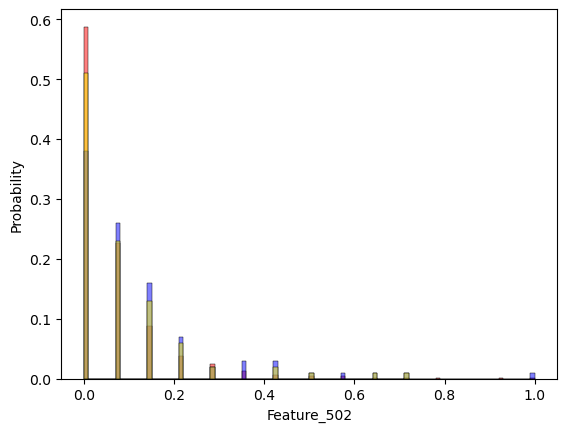

Feature_504
3.5678562235325475e-18


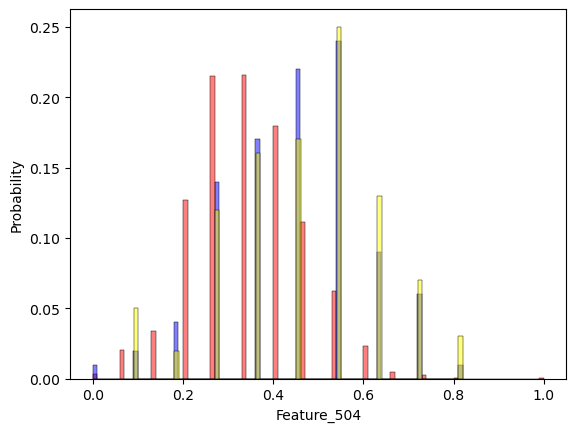

Feature_505
0.18213876615622202


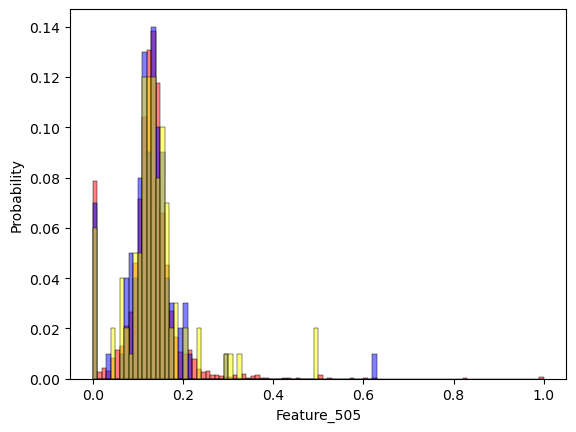

Feature_508
0.42329932771977236


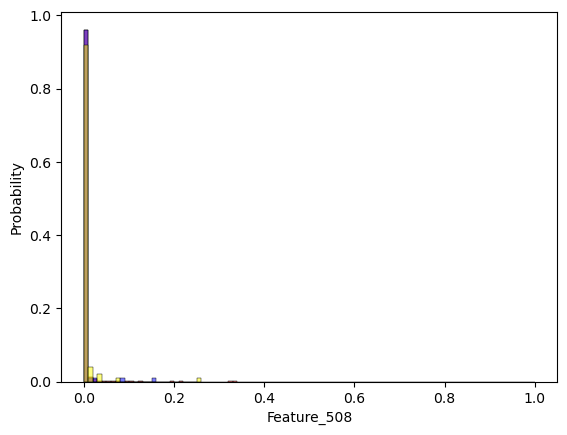

Feature_515
0.10835577051395538


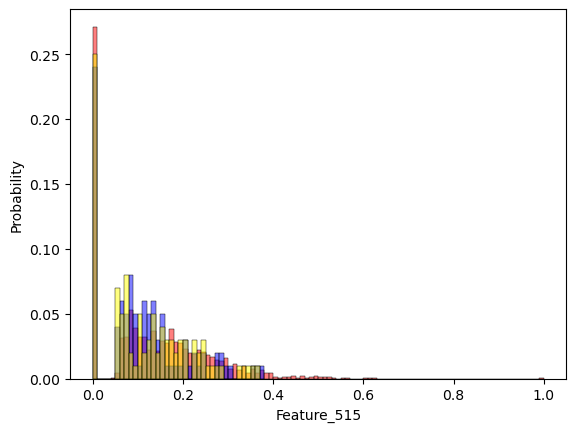

Feature_516
0.0008105645254545074


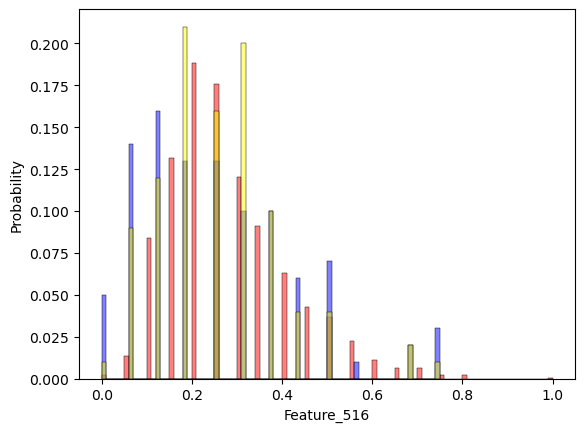

Feature_518
0.6255067984031297


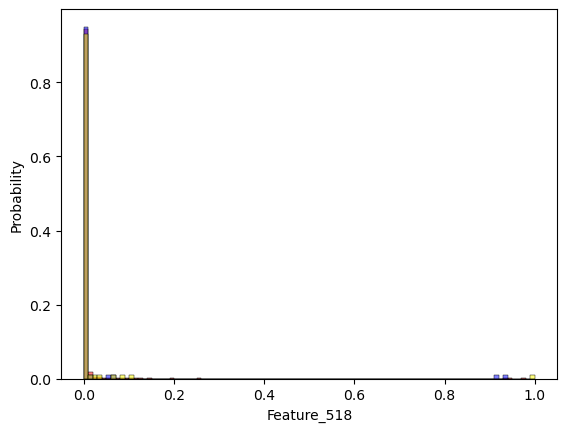

Feature_520
0.7260140808434241


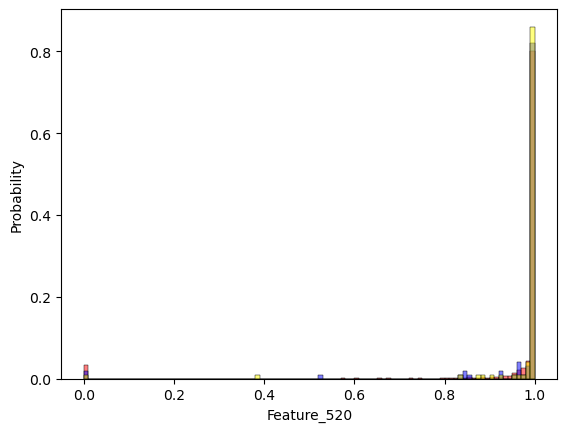

Feature_523
6.465764783511014e-05


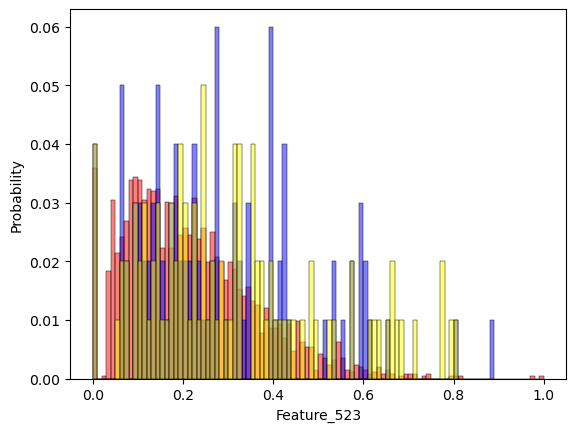

Feature_528
0.1575690133285722


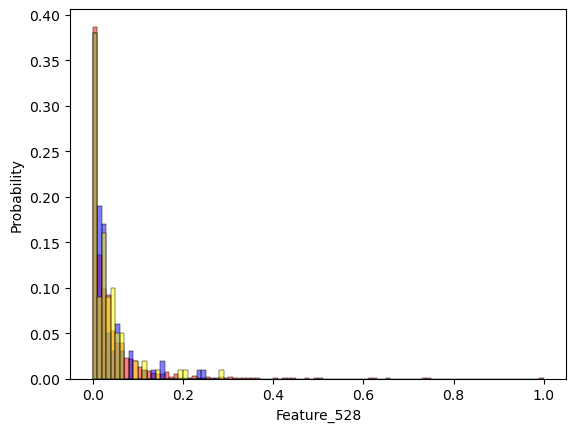

Feature_529
1.8895705462316484e-07


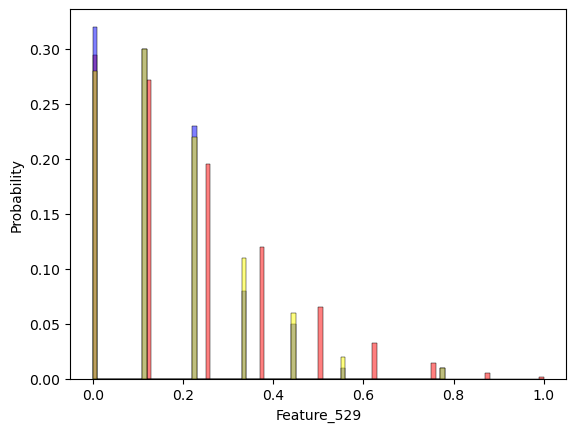

Feature_530
8.151896895720567e-10


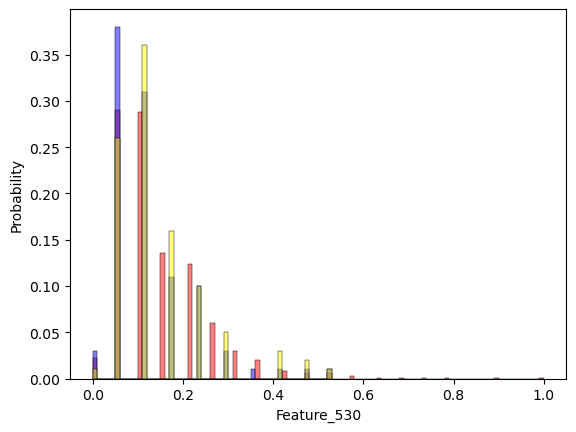

Feature_532
2.1466095372212236e-08


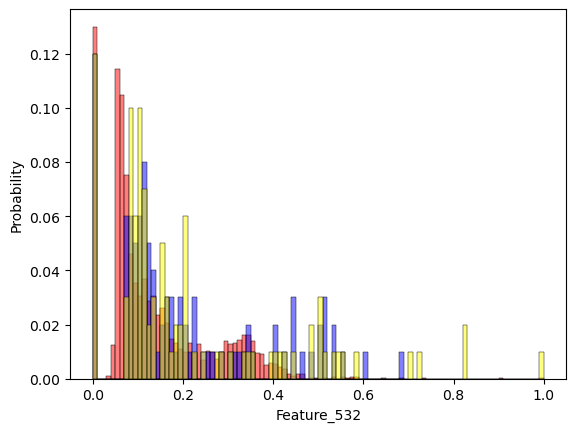

Feature_534
0.17934095710638148


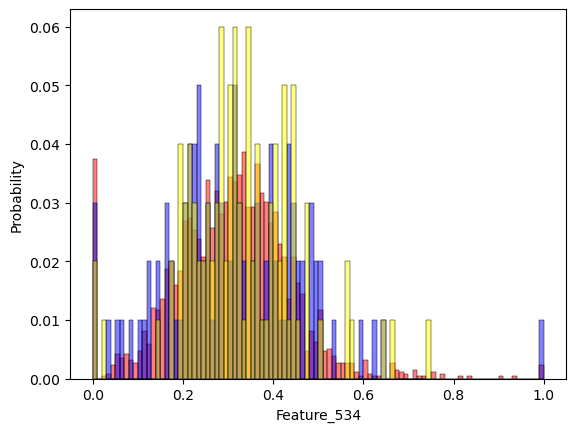

Feature_540
0.20851388537123494


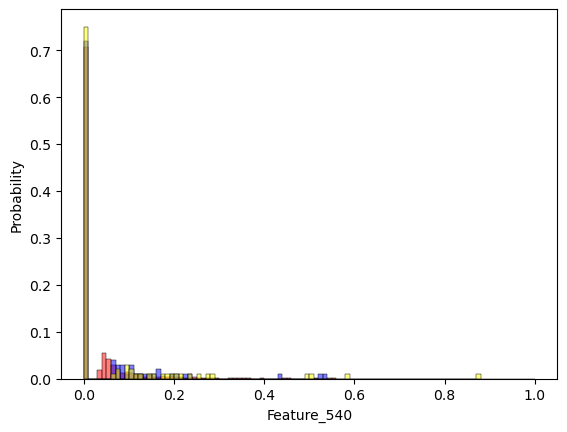

Feature_545
0.9999999598817745


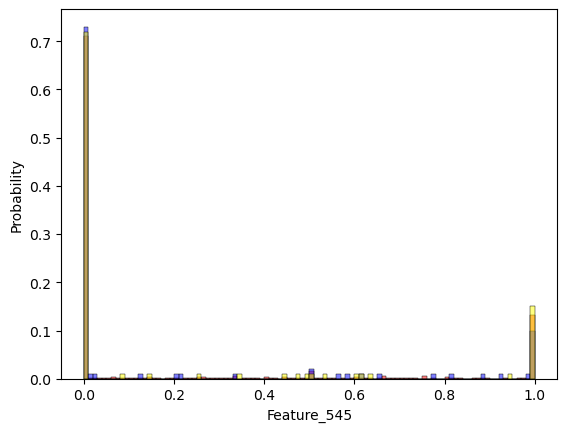

In [25]:
count = 1
for i in df_train_procesing_3.columns:
    print(i)
    from scipy import stats
    ks_statistic, p_value = stats.ks_2samp(df_train_procesing_3[i], df_val1_processing_3[i])
    print(p_value)
    sns.histplot(df_train_procesing_3[i], color="red", stat='probability', binwidth=.01, alpha=0.5)
    sns.histplot(df_val_processing_3[i],color="blue", stat='probability', binwidth=.01, alpha=0.5)
    sns.histplot(df_val1_processing_3[i], color="yellow", stat='probability', binwidth=.01, alpha=0.5)
    count += 1
    plt.show()

In [65]:
df_train_procesing_3 = np.log1p(df_train_procesing_3)
df_val_processing_3 = np.log1p(df_val_processing_3)
df_val1_processing_3 = np.log1p(df_val1_processing_3)

In [28]:
from scipy import stats




In [27]:
from sklearn.preprocessing import KBinsDiscretizer


In [29]:
from scipy.special import kl_div

Feature_1
0.005857042008832224 0.0021062933794312607 0.0010531466897156303 0.10230363116442151


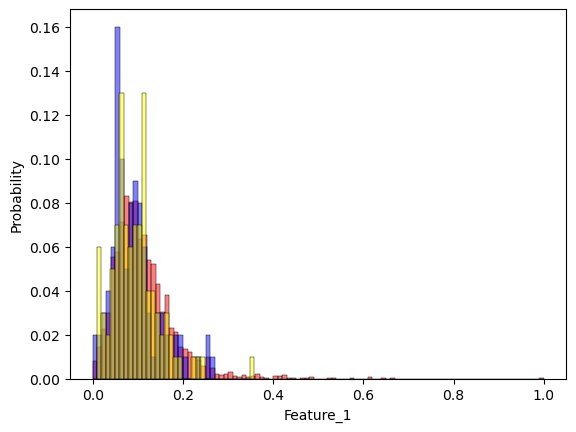

Feature_3
0.008471953899978407 0.0007673225195978832 0.999616532210514 0.03605781203908562


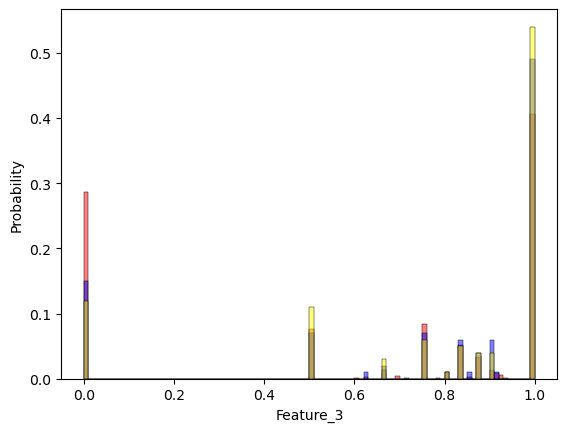

Feature_4
0.978927305990792 0.9809310118025711 0.49046550590128557 0.0065845277450280945


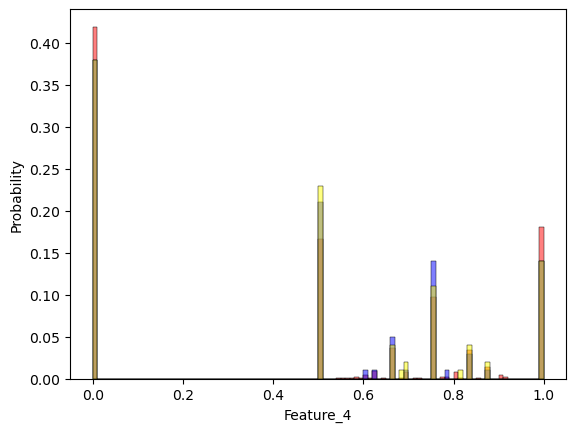

Feature_9
2.770122915616644e-13 0.014334122208820011 0.9928356815994286 0.007310032460993106


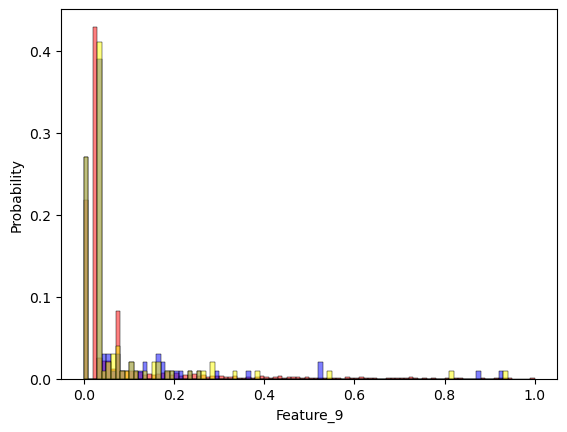

Feature_10
0.008471953899978407 0.06622571727116706 0.9668970457651539 0.007573767525265729


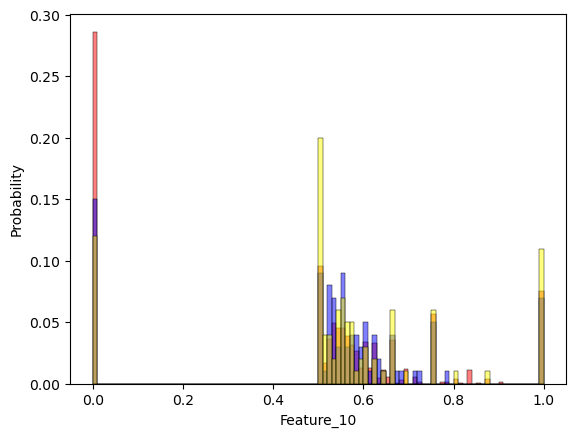

Feature_11
1.7529675443661212e-10 2.5569613070838675e-08 0.9999999872250658 0


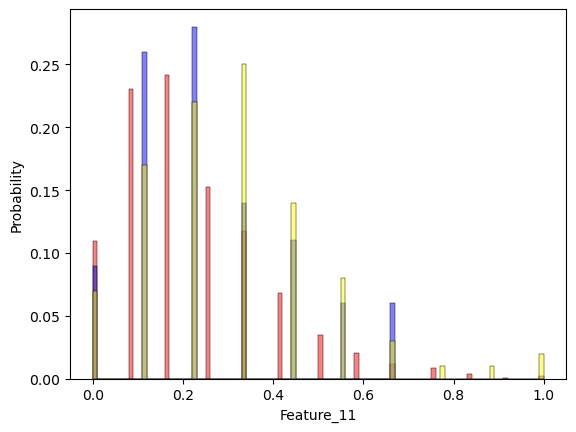

Feature_12
0.0036656851990073745 0.02246235489061381 0.9887728308051372 0.02806099873877811


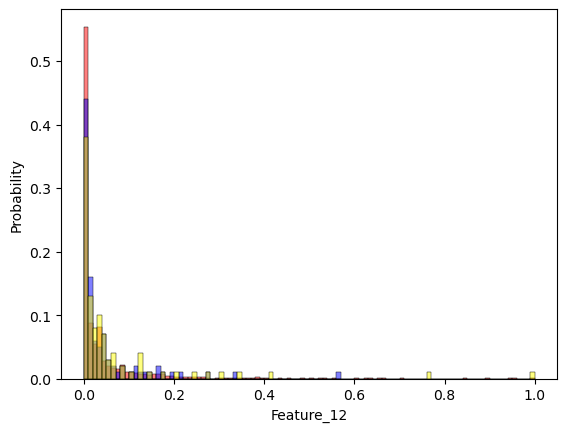

Feature_15
0.004305242196315439 0.19713653904208728 0.9014553582416307 0


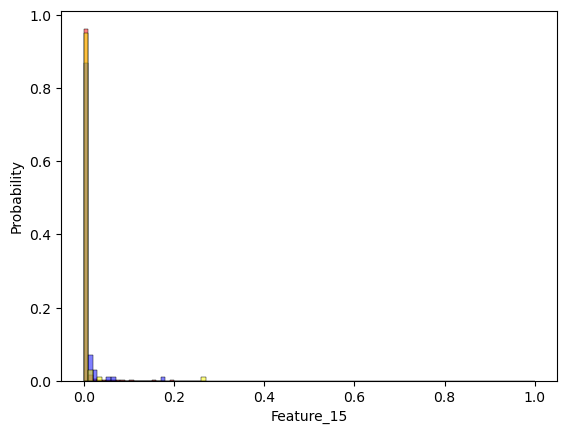

Feature_16
0.03825632059859666 0.014639995725000708 0.9926827524005196 0.02608244175903089


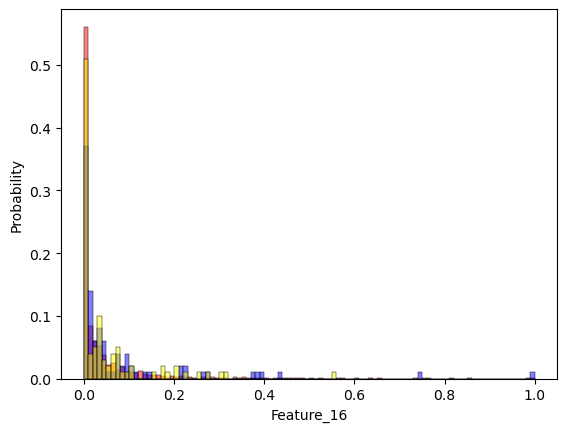

Feature_18
0.810389083785637 0.4893116209331214 0.2446558104665607 0.003444447458970972


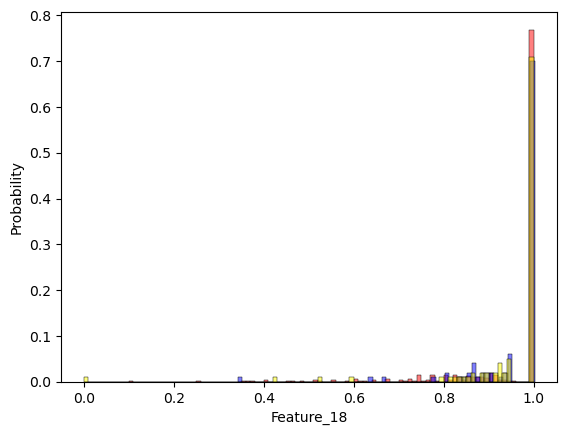

Feature_19
4.0156360660757194e-12 0.004076736396048059 0.9979625170865936 0


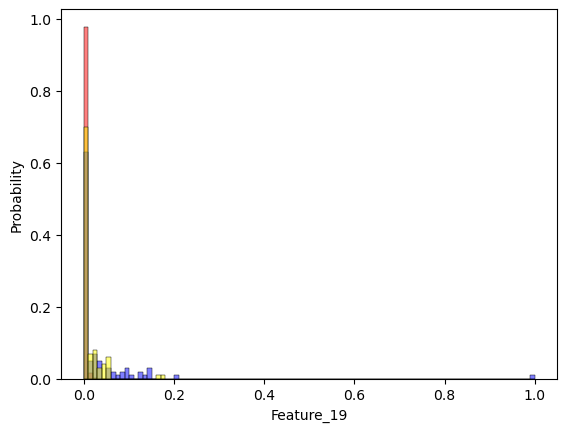

Feature_20
0.049393734376383155 0.16139785067193746 0.9193213831619576 0.011626319087010128


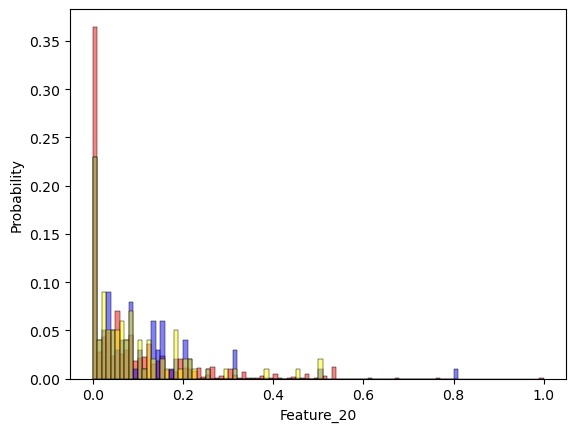

Feature_22
0.01064422282663493 0.2562341577897572 0.1281170788948786 0.07491951620910367


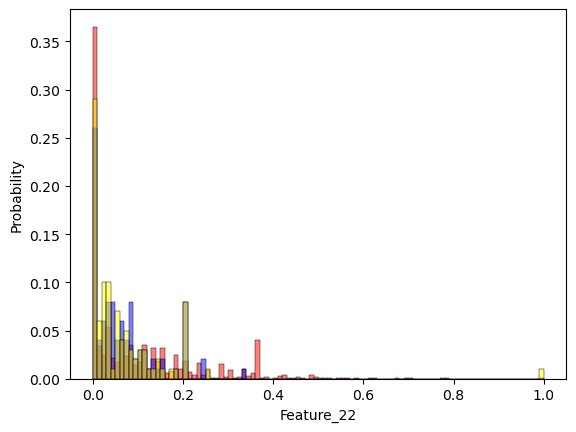

Feature_26
5.572659541310907e-07 0.0005391935570083361 0.9997305451249066 0.10270239177340376


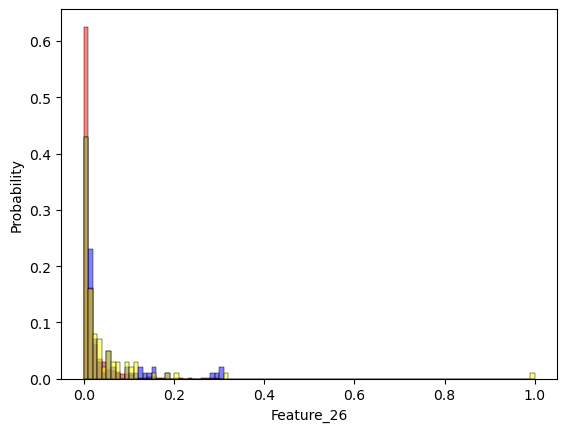

Feature_27
1.607505888791061e-19 7.08643071799919e-20 1.0 0.47937446086152297


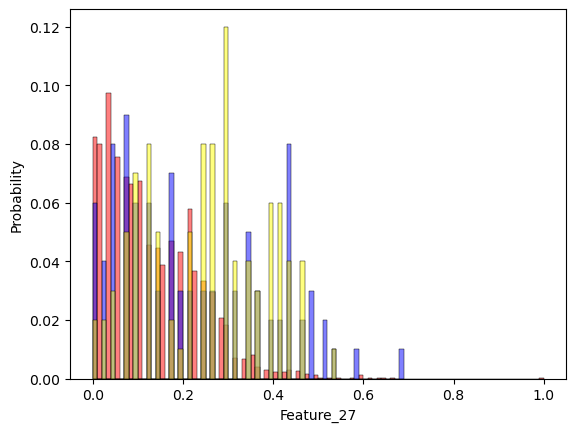

Feature_29
0.4251350901803664 0.15402856880855859 0.92300576546756 0.014929196562327884


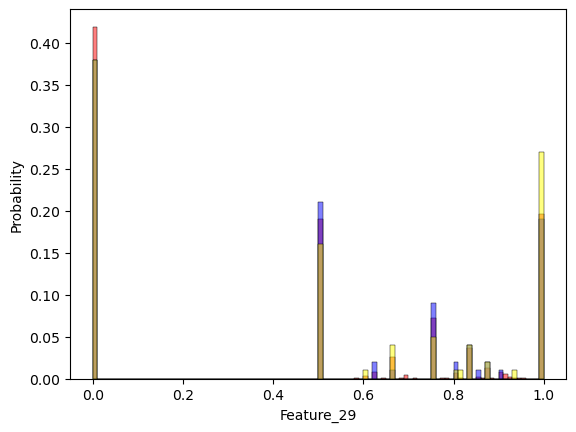

Feature_30
0.9010675548092472 0.5201198218623211 0.26005991093116054 0.003667121845709222


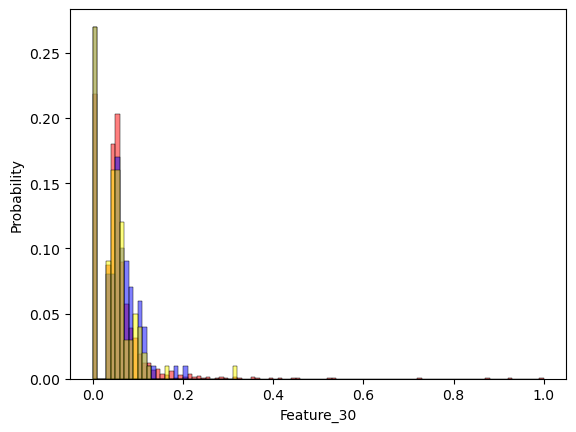

Feature_31
0.5572264402529269 0.8704352244369552 0.5648348677537604 0.017972426388208937


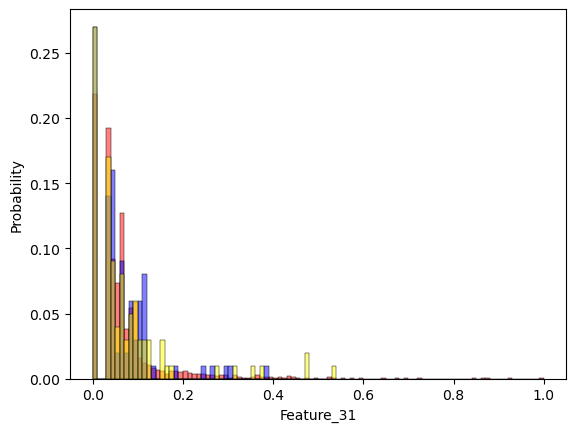

Feature_33
0.015205431079763217 0.012626189086377035 0.9936892638819392 0.047869733072236575


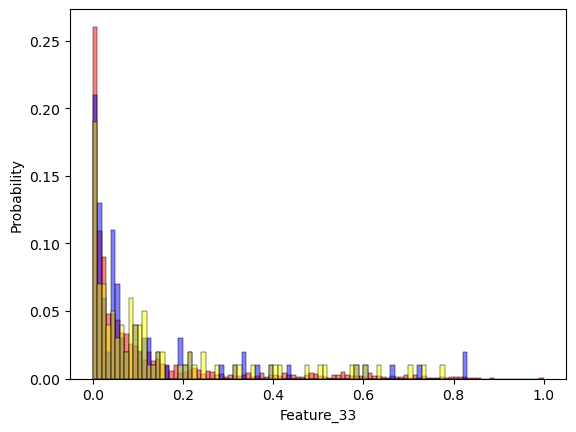

Feature_40
0.6479988214113352 0.758569184959723 0.6207661711197026 0.008804025612759503


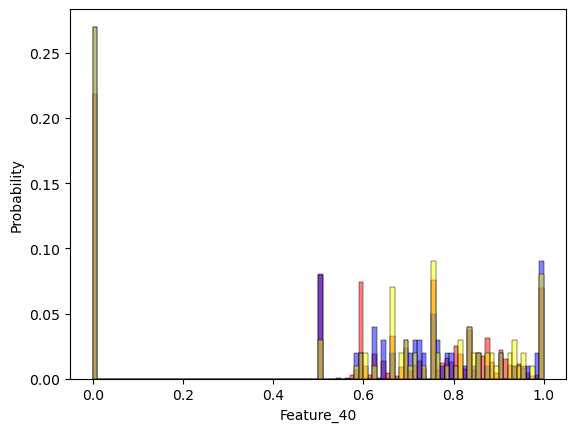

Feature_41
2.987408494308454e-08 5.259045358754035e-08 0.9999999737243584 0.17737730833647944


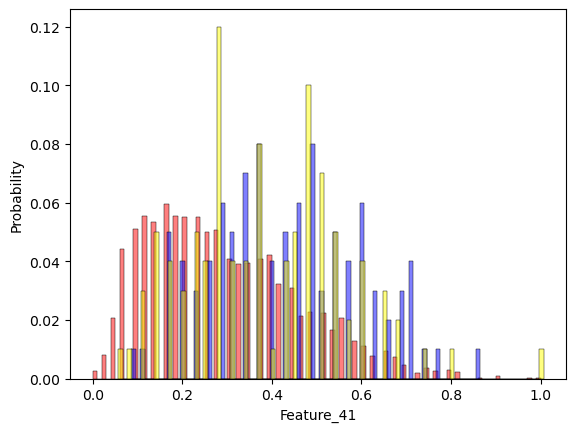

Feature_44
0.006084443977637219 0.029755227210572173 0.014877613605286086 0.15757090015996028


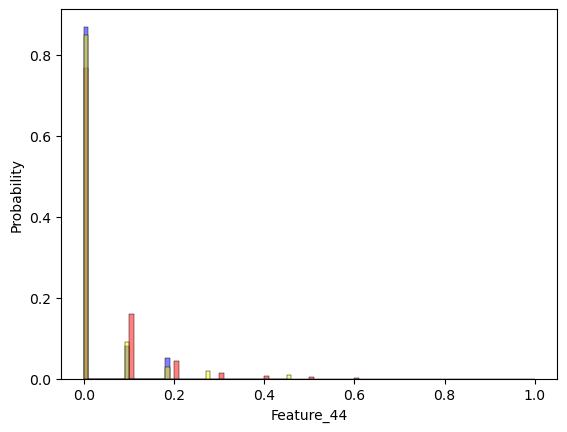

Feature_49
0.02879419727509439 0.00026983758744015044 0.9998651527285163 0.07017311030983704


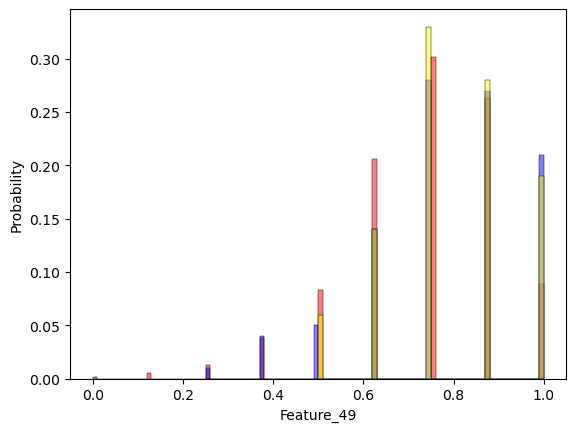

Feature_50
0.0007896535314336978 0.022998135631104186 0.011499067815552093 0.1061871054013066


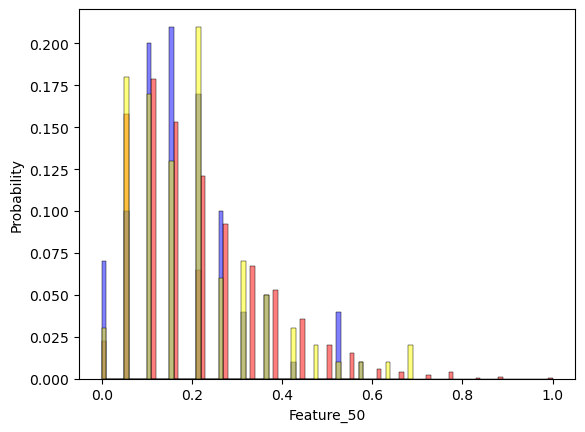

Feature_52
0.008471953899978407 0.4209064892496085 0.7895854781809302 0.06594136064021985


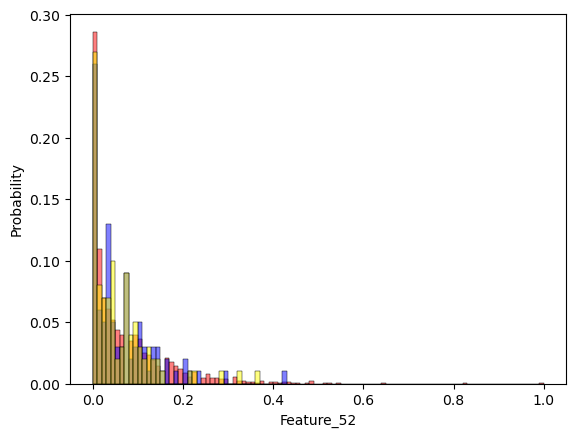

Feature_54
0.7678561641334741 0.8090539076667026 0.5955244616795718 0.01627326293781564


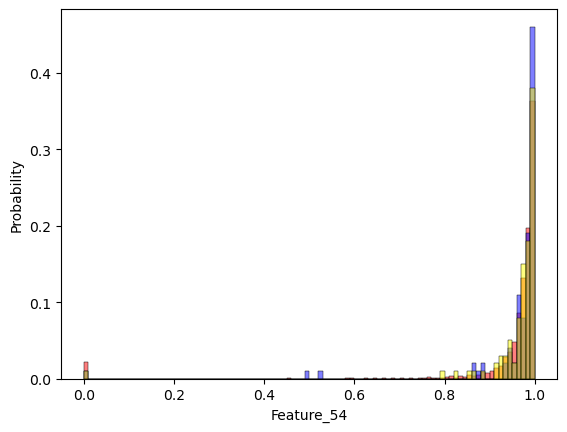

Feature_56
0.43855492612909613 0.438716017569183 0.2193580087845915 0.015089781453724558


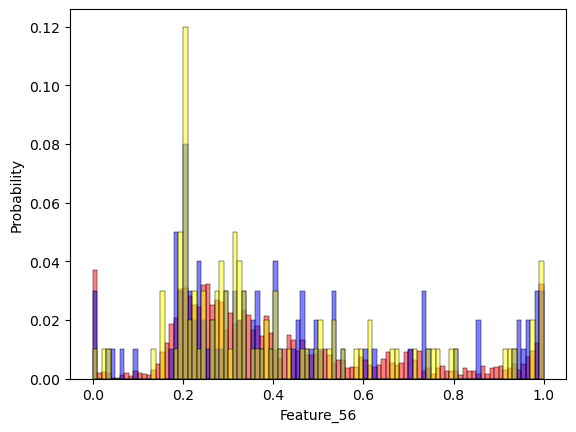

Feature_58
0.24497240441424548 0.31280140250615074 0.15640070125307537 0.028324329281178732


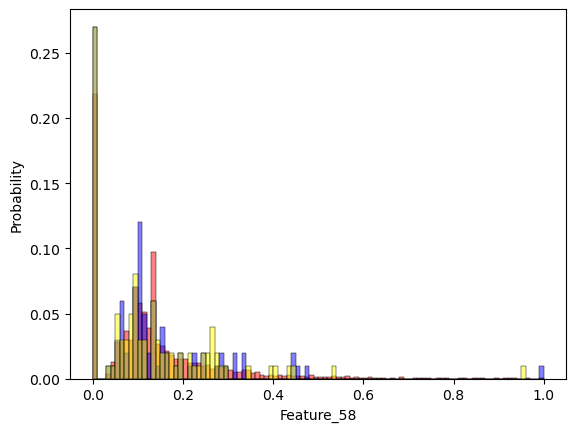

Feature_61
0.12696645978826485 0.07367712231753898 0.9631721258531344 0.01064689147056632


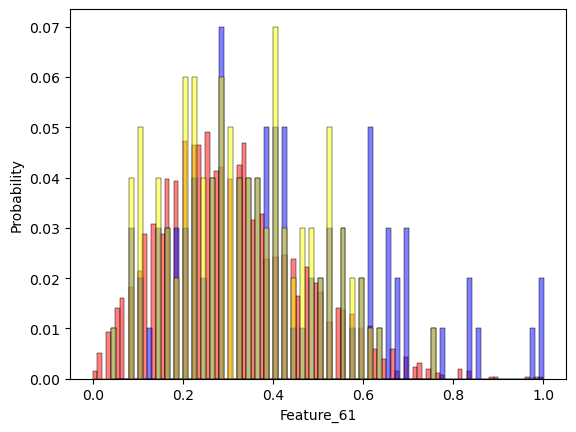

Feature_63
0.010639342183468365 0.008645782823687859 0.9956787947102164 0.06976960234948944


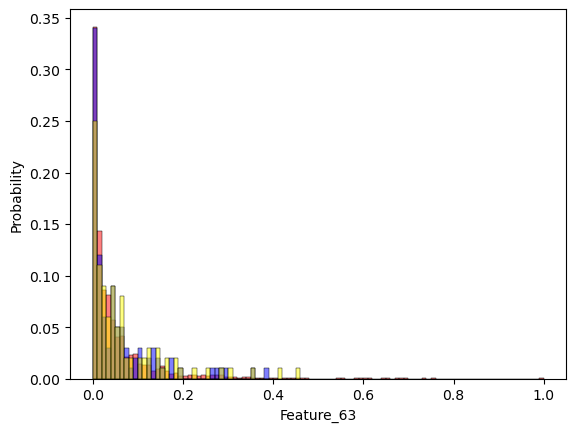

Feature_64
0.41224943261935865 0.22454070963641104 0.8877551163415527 0.06274538146881377


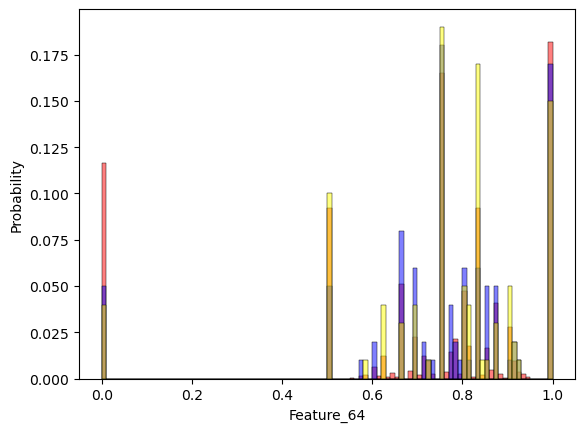

Feature_65
0.18005602223684772 0.12258742061828445 0.06129371030914223 0.02266400996646075


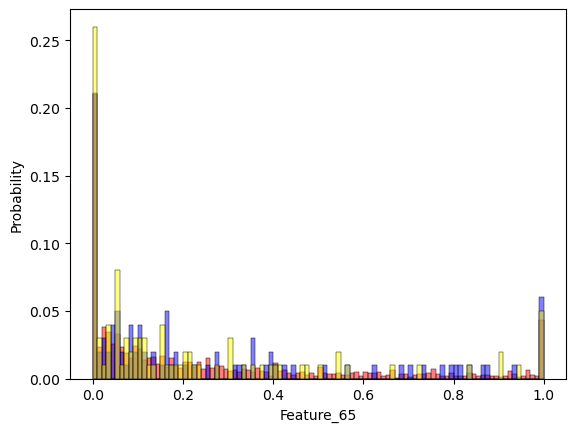

Feature_66
0.33330007698570124 0.29237323391878767 0.8538488818744621 0.000994314048671039


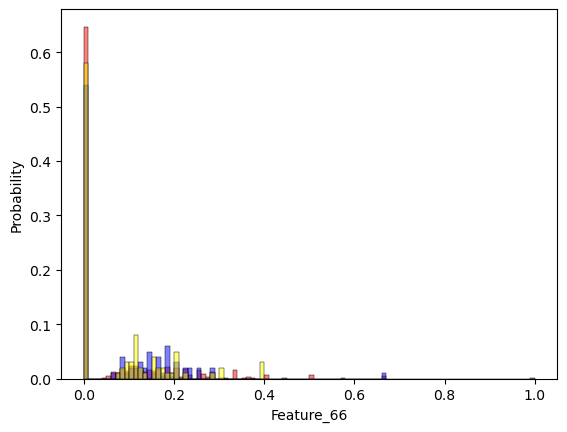

Feature_71
1.2299632538019297e-56 6.877641137260707e-41 3.4388205686303536e-41 1.2464292962520696


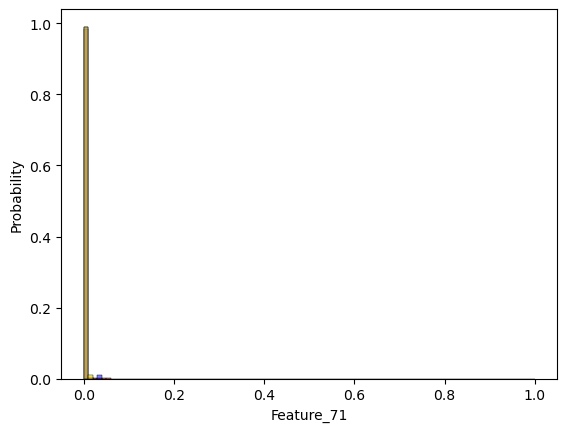

Feature_73
0.4071895100430421 0.14812885637002385 0.9259544807498788 0.052817470448403264


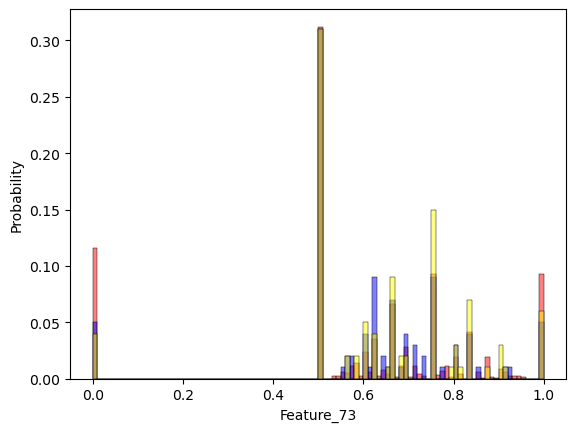

Feature_77
0.8528896888449365 0.9698533577722561 0.48492667888612806 0.012276279418791572


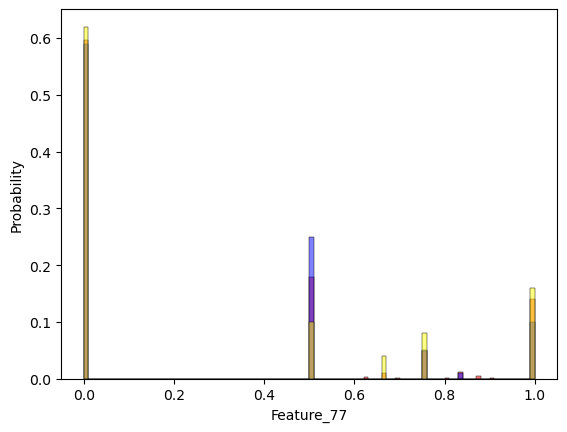

Feature_81
5.113940971815204e-15 8.779424923895136e-15 0.9999999999999957 0.4254239740582225


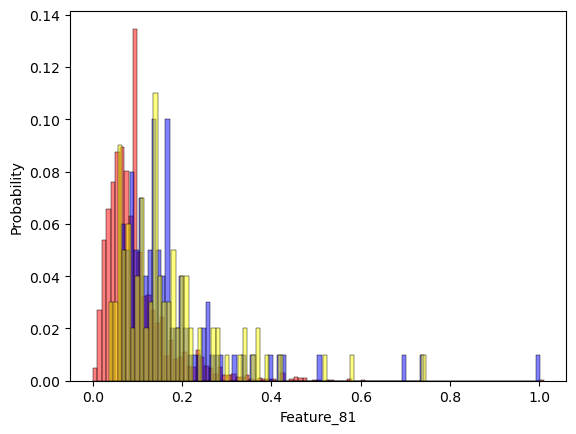

Feature_83
2.026017254388407e-05 0.0002346039846565276 0.9998827592935472 0.1190699966303996


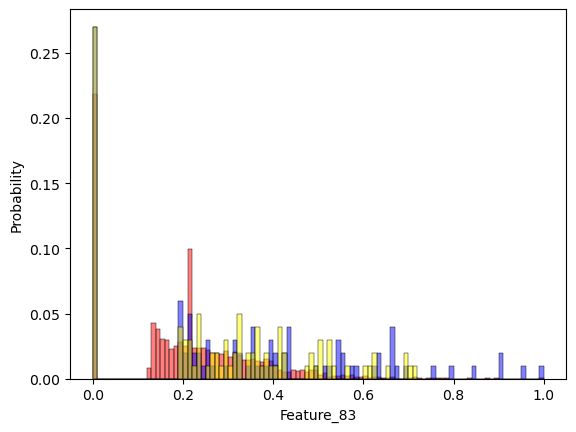

Feature_87
1.5593435623159685e-09 0.0012404489327871024 0.9993800672124495 0.12087327870548256


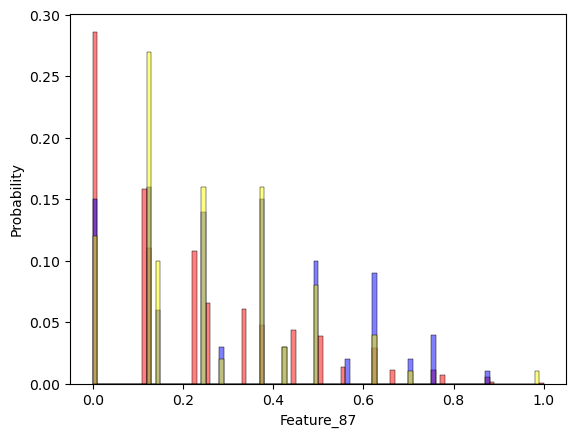

Feature_88
4.260813211320323e-31 3.1810185911100736e-22 1.5905092955550368e-22 0.9261724729118195


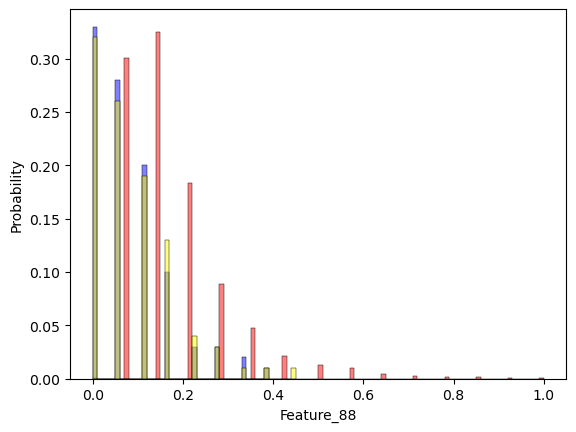

Feature_89
0.6730762232091051 0.2326068599315022 0.1163034299657511 0.020963132782492892


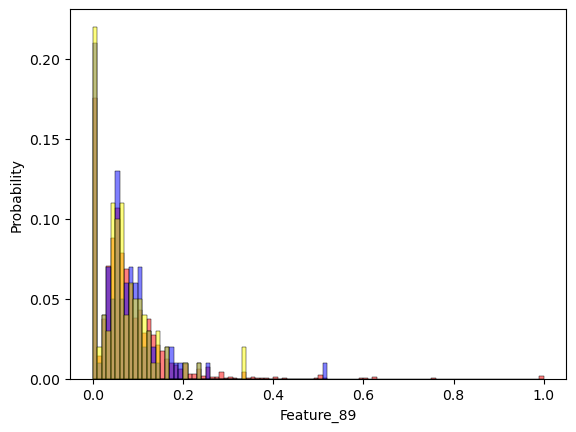

Feature_90
1.6117244377451672e-77 1.9150275621334882e-41 9.575137810667441e-42 2.46624312063994


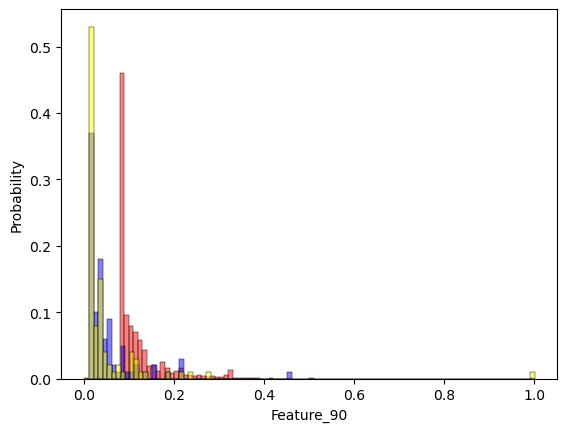

Feature_94
0.23070382642182036 0.024317853492538656 0.012158926746269328 0.029806893331316184


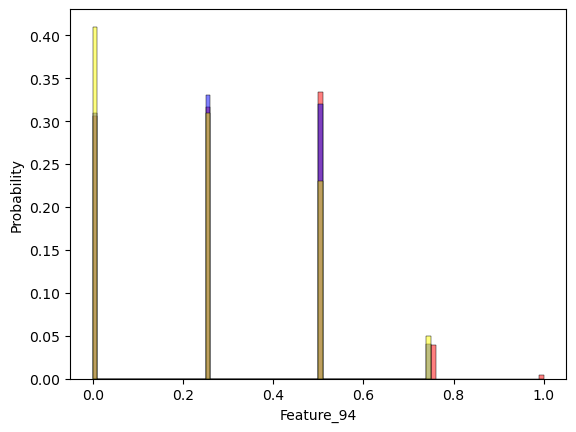

Feature_98
2.849962035506823e-65 2.2762253550118964e-35 1.1381126775059482e-35 0


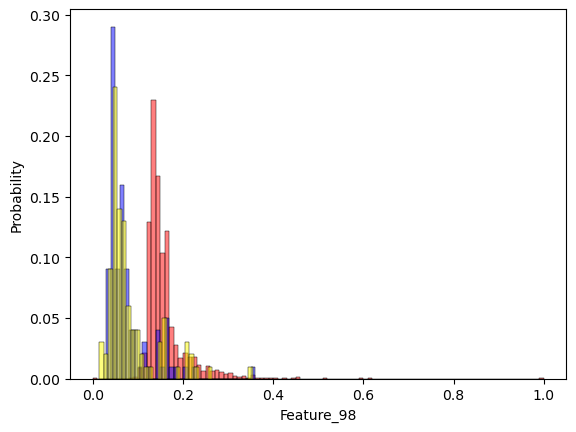

Feature_99
0.0014514831628749001 0.2648667851267218 0.867596086910084 0.010335388134087305


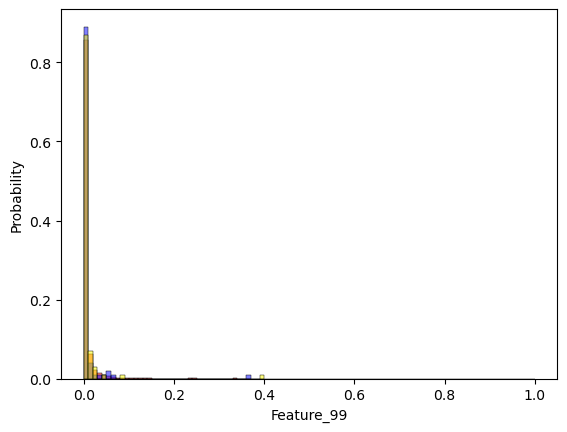

Feature_106
0.08369328064425836 0.14541115149171893 0.07270557574585947 0.09702430959767144


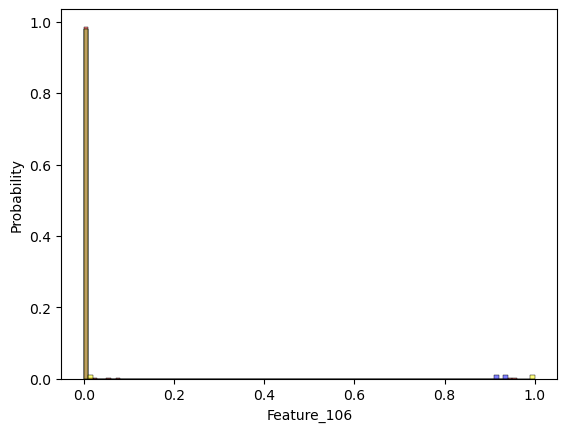

Feature_108
0.03186224112107788 0.017520100857338496 0.9912431731617002 0.04770603924136291


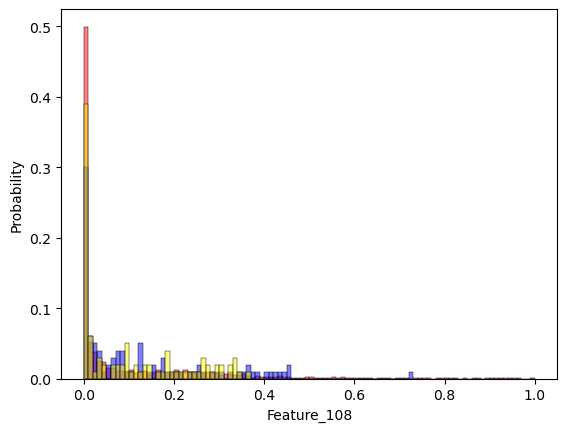

Feature_111
1.2510341928054994e-52 1.3058536651614338e-45 1.0 1.533617473626478


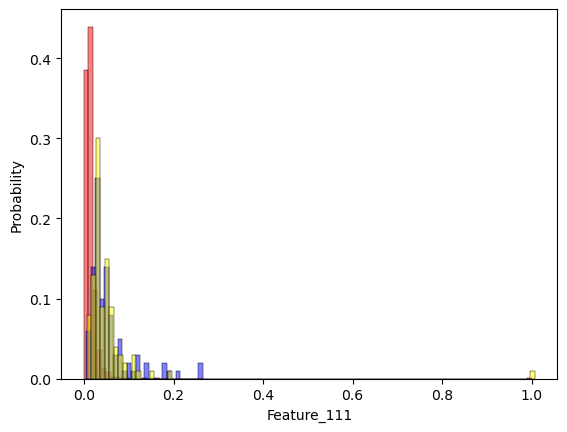

Feature_113
0.02852361523963317 0.017611783370207457 0.9911972756224533 0.033102451891825035


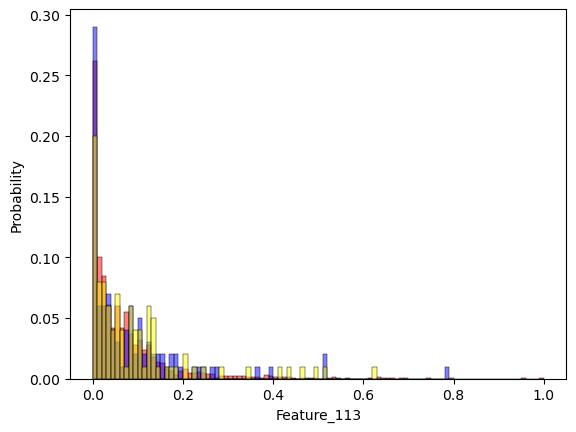

Feature_114
0.0012126397300635124 0.012034003200677136 0.006017001600338568 0.1259617326415502


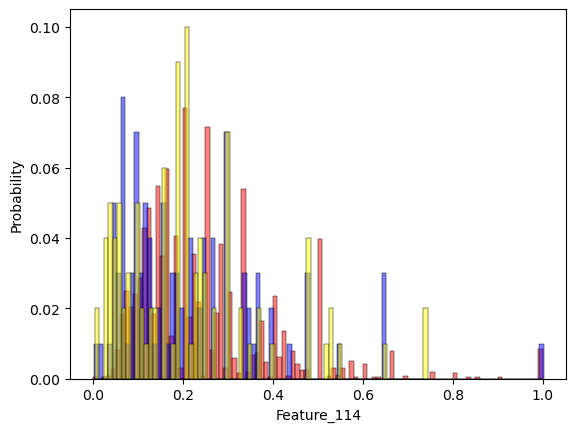

Feature_118
3.3427911362099328e-09 0.004631270902212864 0.9976854970302275 0.010141711897659972


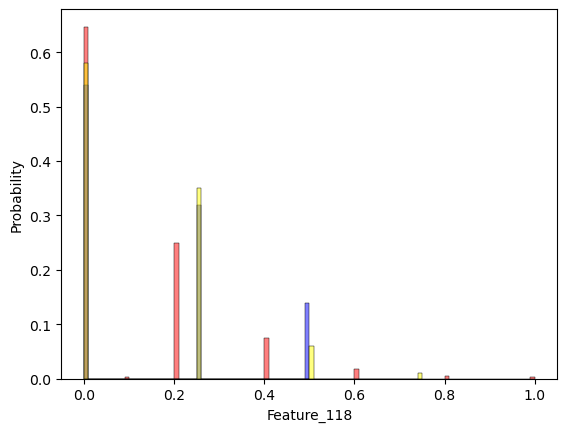

Feature_119
0.06573597936533061 0.1685715056267173 0.08428575281335865 0.02618732056324935


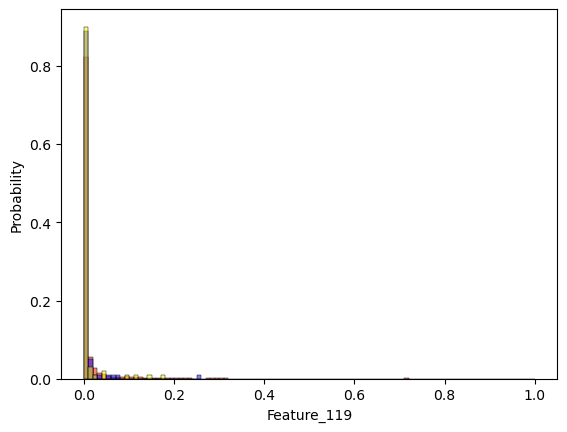

Feature_120
0.01990722315131234 0.14327170080728166 0.9283827026097627 0.11499989932612031


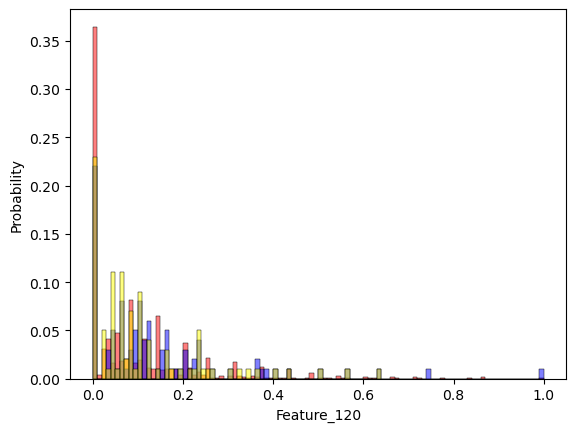

Feature_121
0.004090219651134071 0.01489122797665526 0.9925571222078738 0.09009299822757752


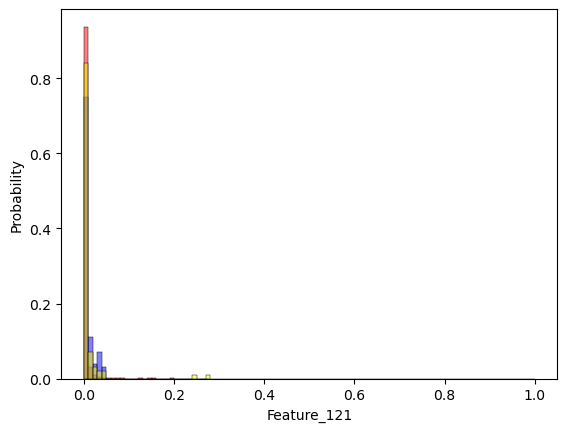

Feature_124
5.089974447719341e-09 0.005618756205327365 0.9971918181596827 0.012425681905722838


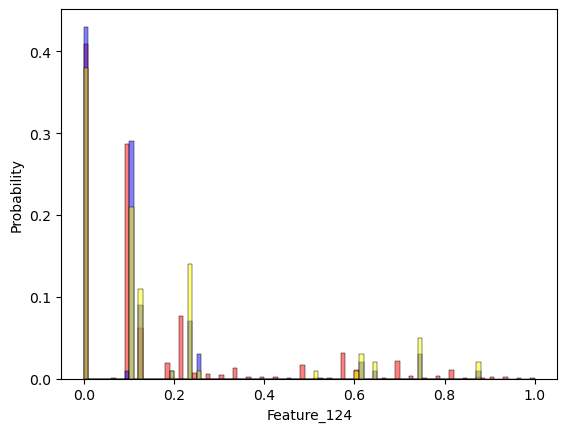

Feature_125
0.22963297369718028 0.2540516385841929 0.8730104351279144 0.002329661439704086


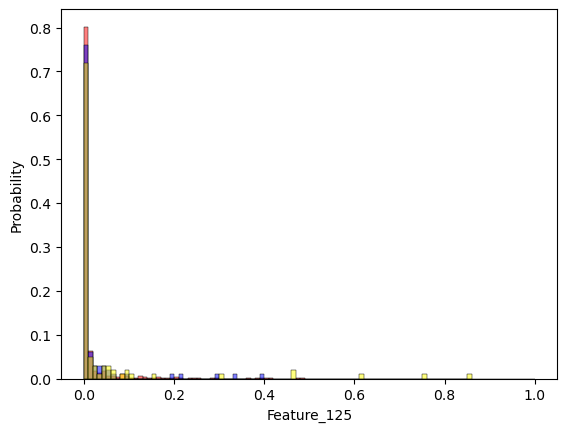

Feature_126
1.624970751234847e-111 1.4371504212508591e-53 7.185752106254296e-54 0


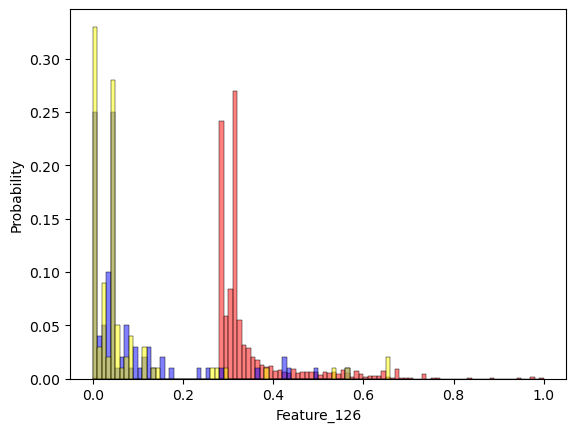

Feature_127
2.2436558161928687e-157 3.53577768387274e-62 1.76788884193637e-62 0


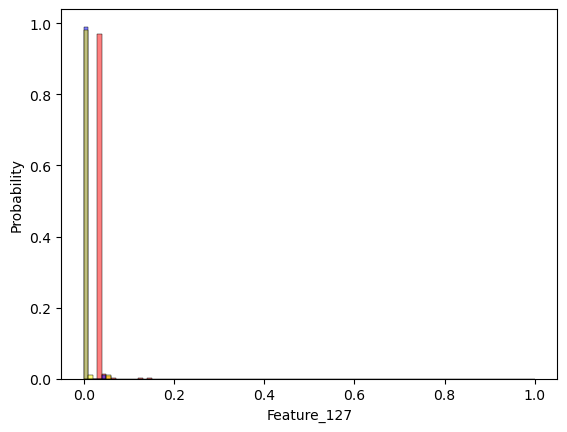

Feature_128
0.20769219213090956 0.348606087925347 0.1743030439626735 0.028294303318089457


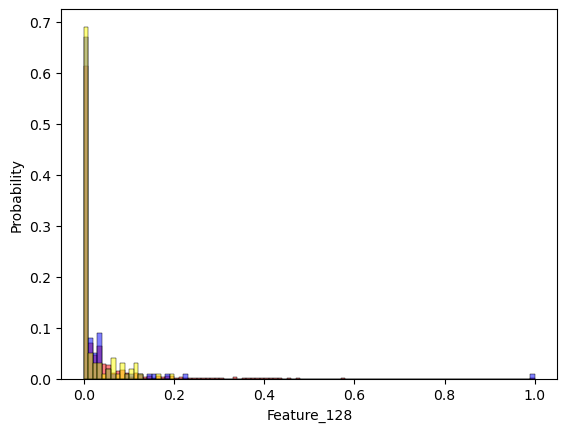

Feature_130
1.644507362568251e-05 0.07297539427604376 0.9635255453879578 0.0015542025750608368


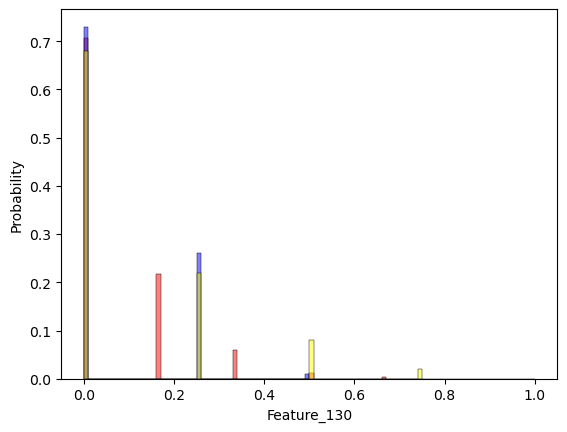

Feature_131
0.3695894757918764 0.0617137152987704 0.0308568576493852 0.018423690411330886


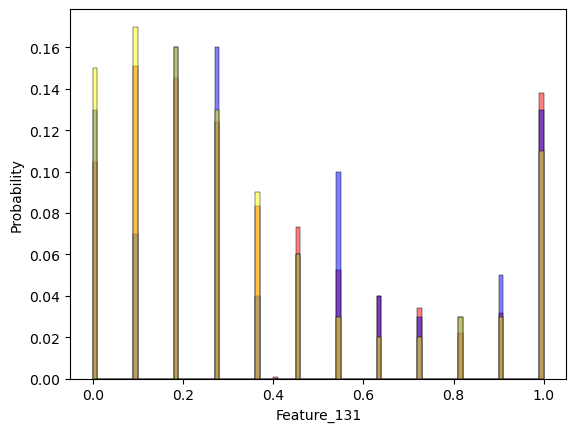

Feature_133
5.089659712558347e-49 4.396588204932424e-33 2.198294102466212e-33 0


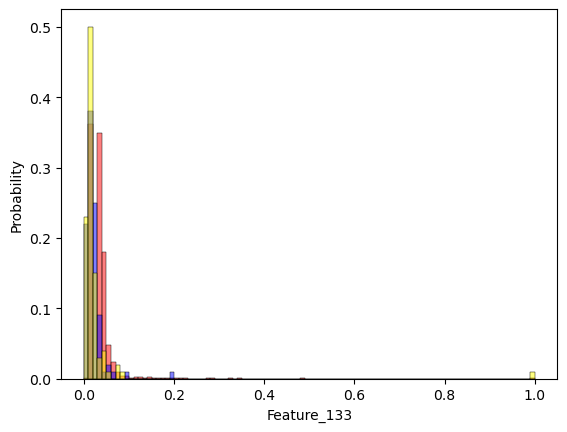

Feature_136
1.4575171126771859e-08 7.85056603776098e-11 0.9999999999607818 0.2708525370969932


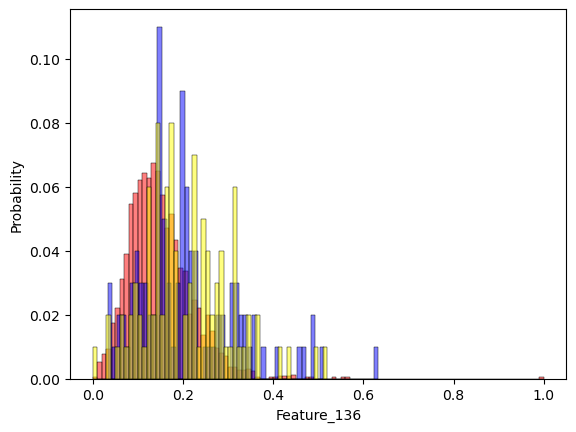

Feature_138
0.5537354806142516 0.4129597017260851 0.20647985086304255 0.017712791910017695


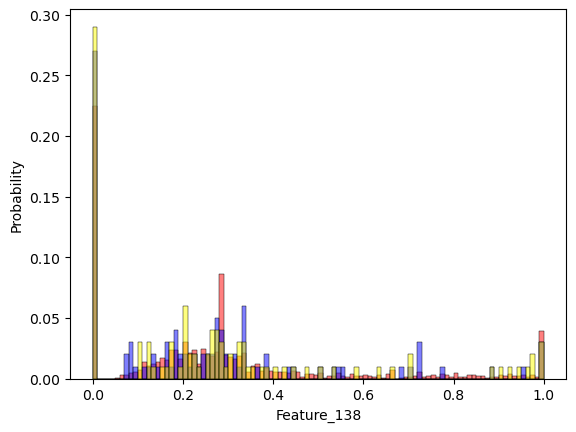

Feature_141
0.0011469084508767583 0.011686151367729868 0.005843075683864934 0.10138661406850624


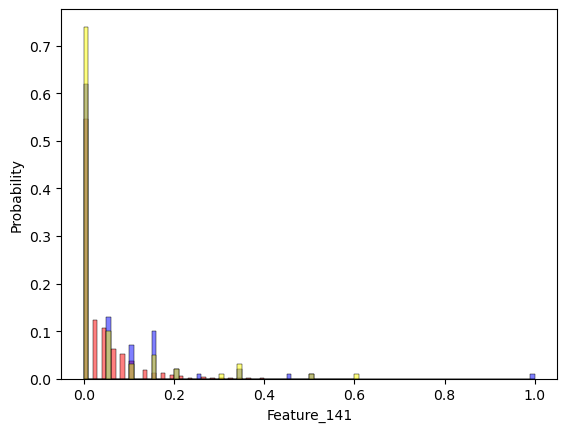

Feature_143
9.259531939843588e-159 6.319945685735386e-69 1.0 0


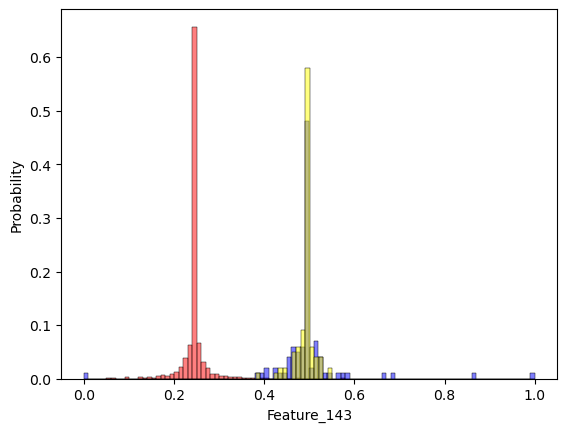

Feature_144
0.29953684452384843 0.08001758236371437 0.960002903659724 0.020615673670656726


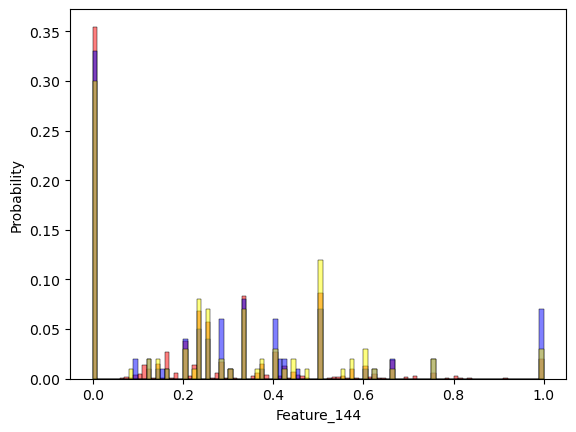

Feature_147
0.6147190409502525 0.856398909585743 0.4281994547928715 0.01709390656118449


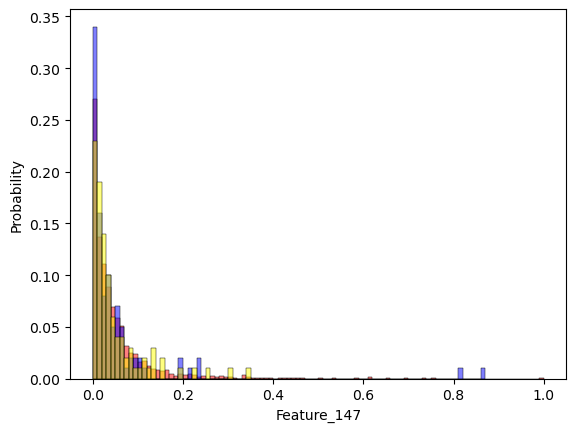

Feature_150
0.03966399379737407 0.018923226721317028 0.9905417601723377 0.03565637673137431


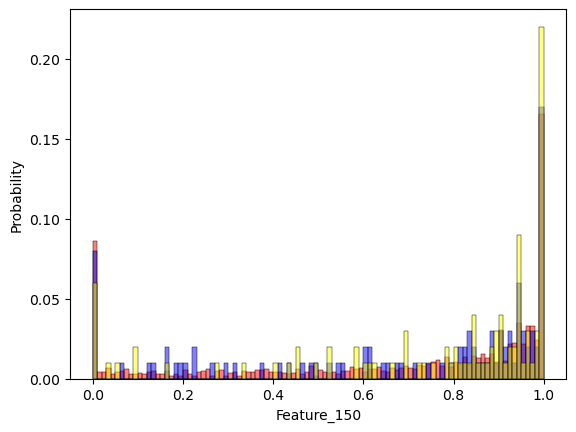

Feature_151
0.16417971894976327 0.04862236796667933 0.9756963997913936 0.013299321742699065


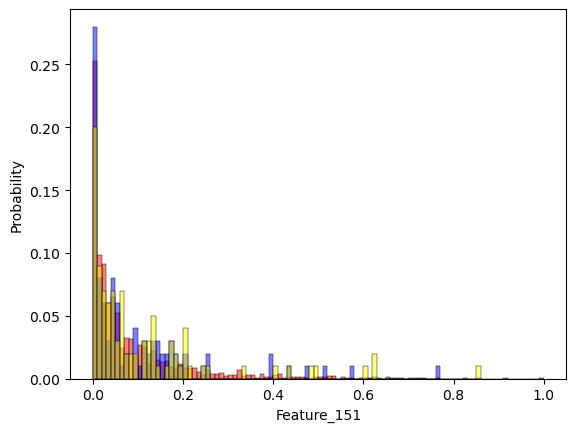

Feature_153
1.1747129623132622e-07 0.018764115804797237 0.9906217618664741 0.0024833877661926823


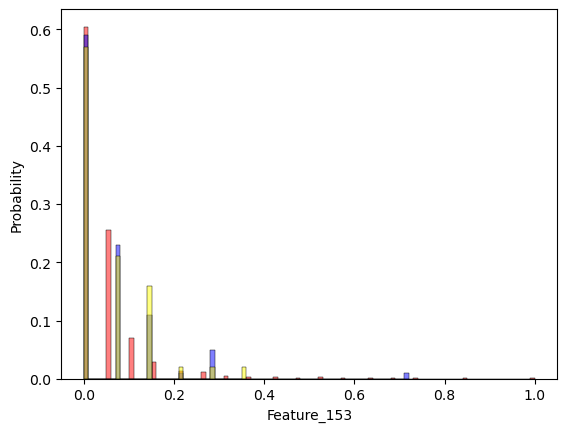

Feature_154
0.013506498570690358 0.006193054480866811 0.9969049204637237 0.0024253559036548876


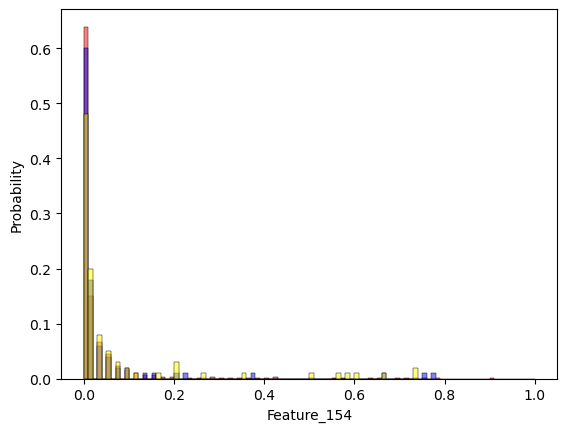

Feature_155
4.2881273194399616e-08 0.004088201553208377 0.997956797068626 0.012309669959461231


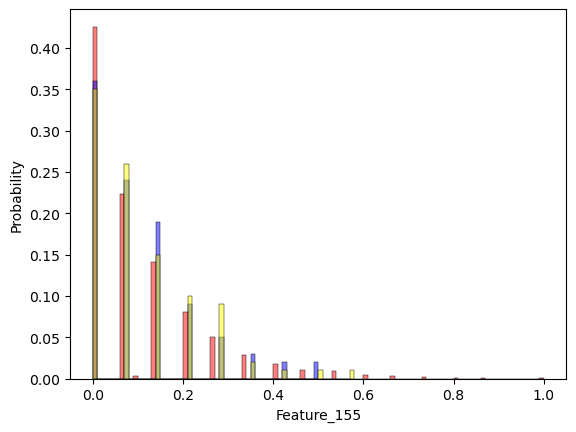

Feature_156
1.122739267004003e-25 6.074956984627237e-18 3.0374784923136185e-18 0.8276694648658298


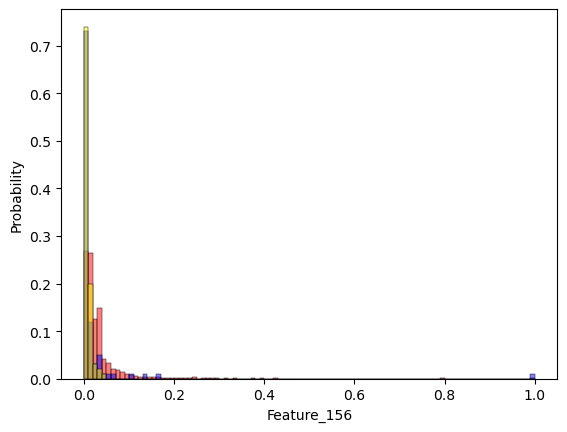

Feature_157
2.3642389294942822e-07 3.755634547112582e-05 0.9999812329159709 0.06832624428469473


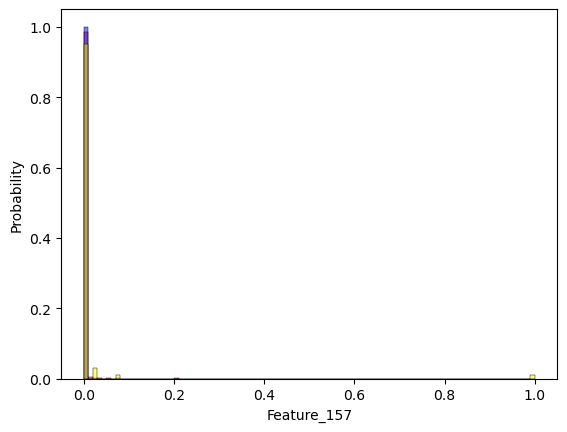

Feature_158
0.000824429189991005 0.004922838663942633 0.9975395959153364 0.04021627665076272


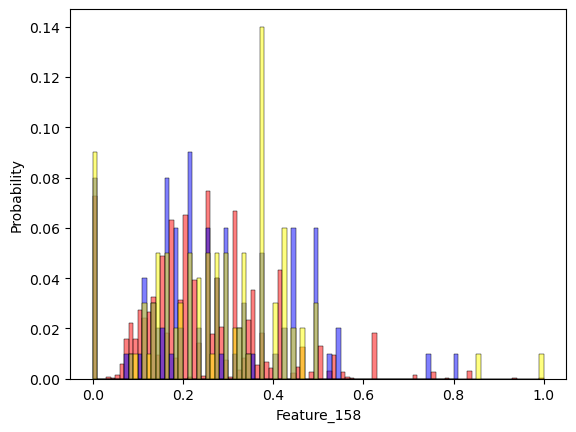

Feature_160
0.05358127125900861 0.05455337450378203 0.027276687251891016 0.04590347811355675


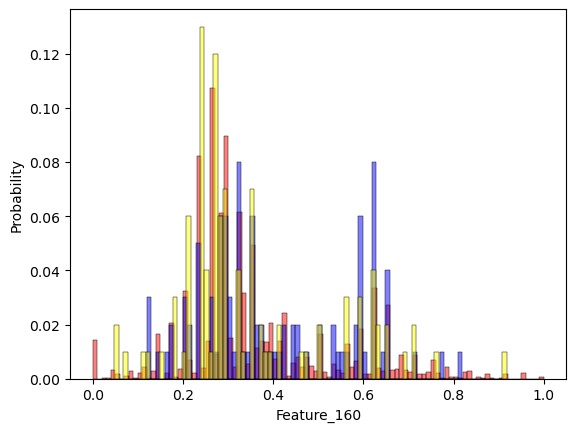

Feature_164
0.0324510777881909 0.05366902493980089 0.026834512469900446 0.03581411195636476


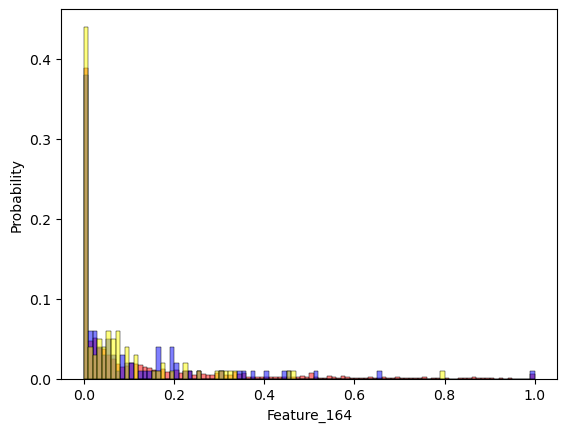

Feature_166
6.550992373642245e-05 0.003649158774590167 0.9981762583280308 0.06489484679154252


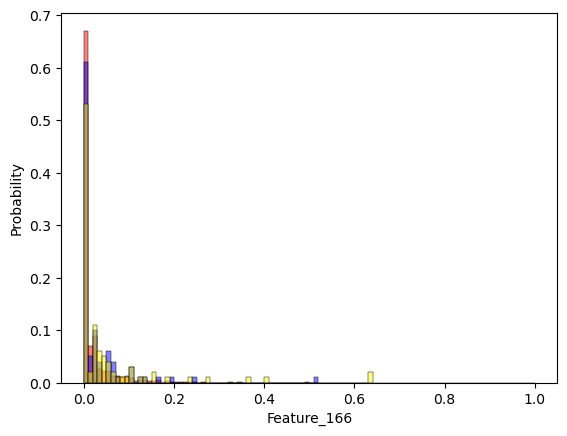

Feature_167
3.082543123639898e-07 0.006893511012574965 0.0034467555062874826 0.21221122766498046


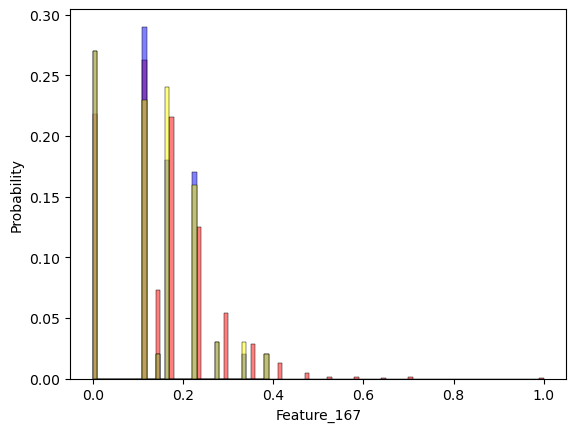

Feature_169
0.9226259380358706 0.9953062775589839 0.5024001983391078 0.020692948005645657


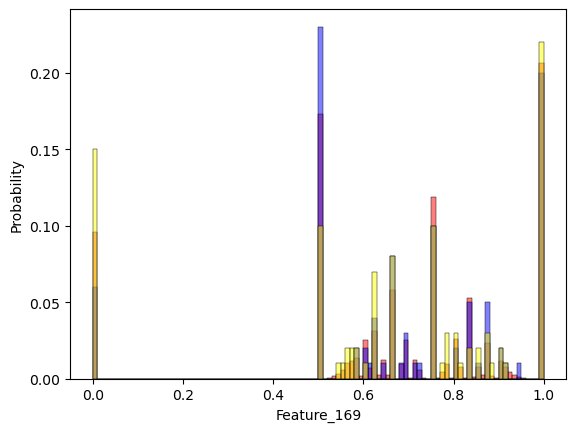

Feature_170
0.7986690818630238 0.1932629205398101 0.9033952784193193 0.00546400505747207


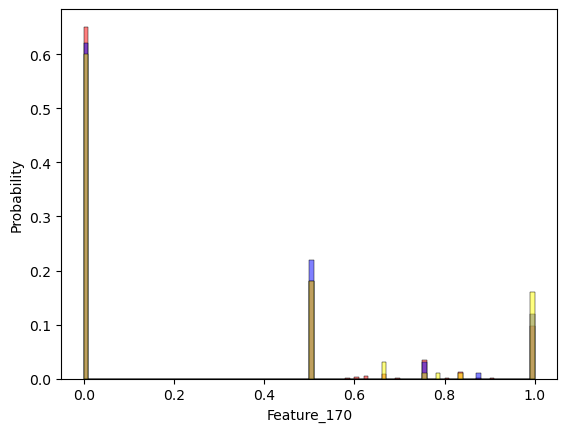

Feature_173
0.18089359329277196 0.040550890581061136 0.020275445290530568 0.01444903651561101


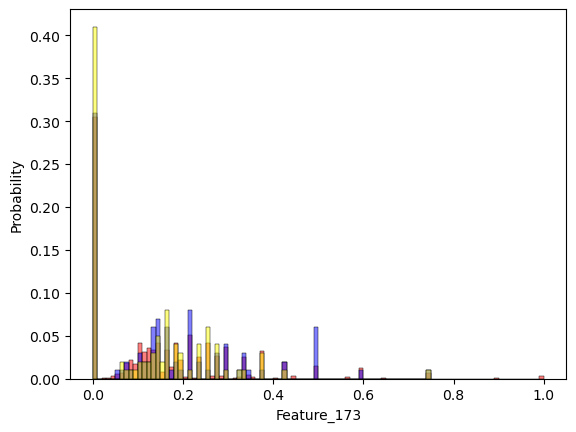

Feature_174
1.9634926534345936e-07 0.06264825960684602 0.03132412980342301 0.17092814315662988


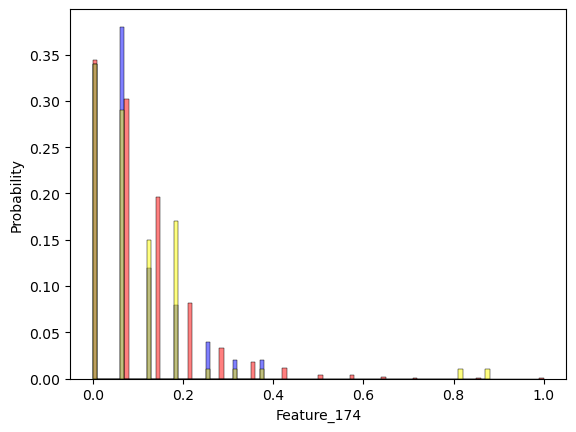

Feature_175
0.32978694925753477 0.11074418725684705 0.9446427312540793 0.01867848078353438


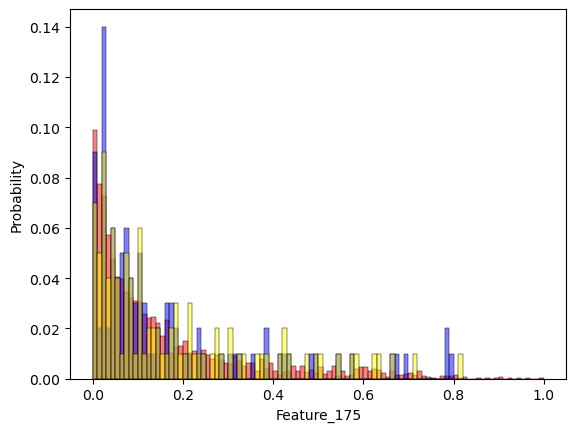

Feature_176
1.6037510779068769e-25 2.2740568860293827e-07 1.1370284430146914e-07 1.242124385979753


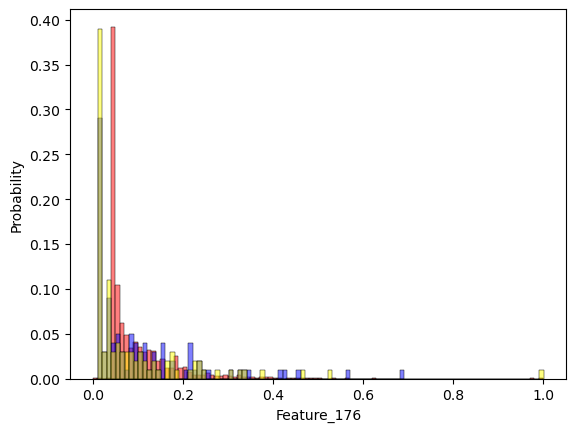

Feature_177
0.01927835779094581 0.007339814654855906 0.9963315463286926 0.05532254238768802


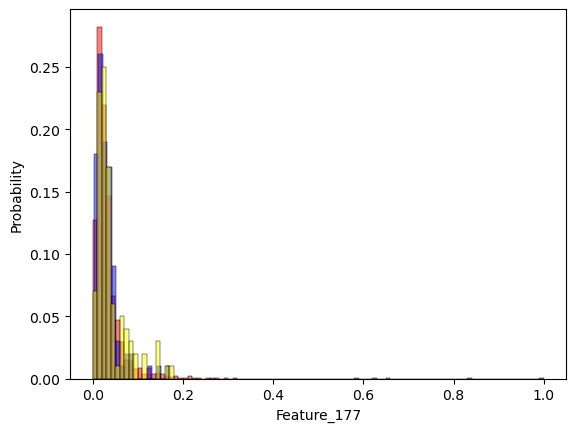

Feature_178
5.6133354134191505e-14 3.5416239014015063e-13 0.9999999999998231 0.3300362692133318


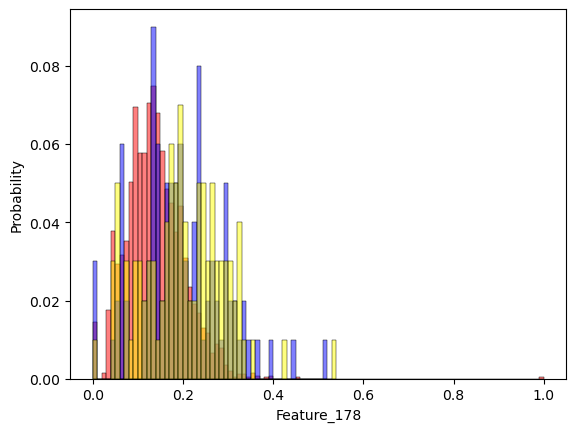

Feature_179
0.007898363353264281 0.4649302332562033 0.7675759702257472 0.010847712444475664


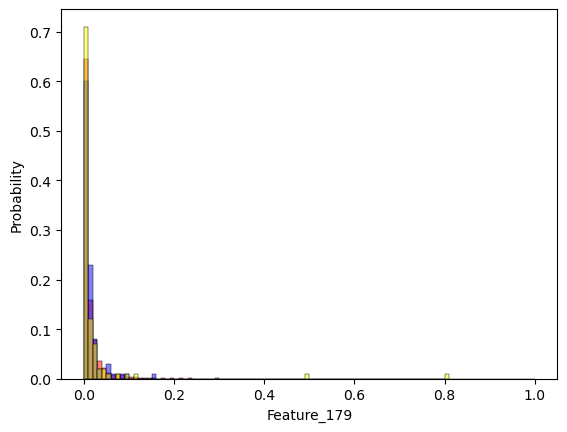

Feature_181
5.172387298813479e-20 3.067673008380471e-09 0.9999999984674094 0.5493262852201524


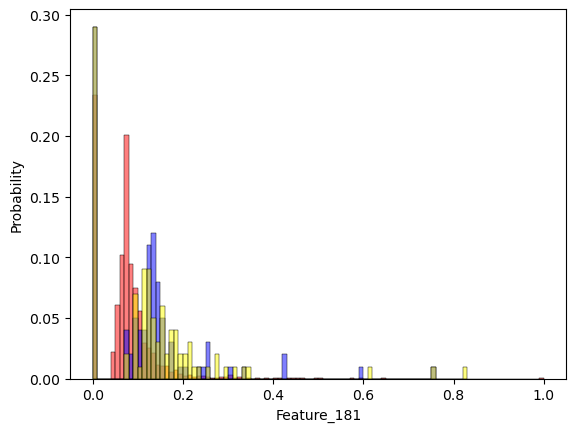

Feature_183
0.9999999967182001 0.957873218543575 0.5211173490156278 0.0040281724385867745


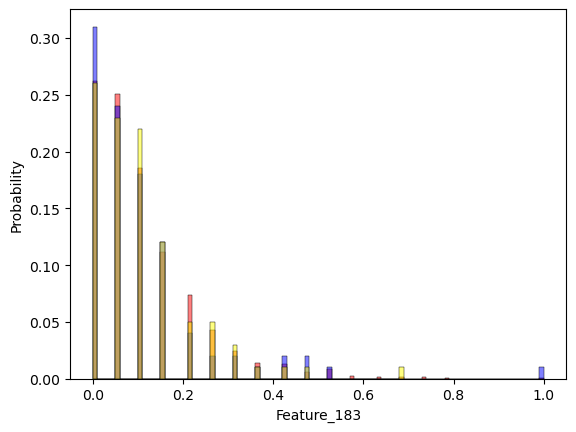

Feature_184
9.582206647757986e-08 2.648423965969719e-05 0.9999867657167387 0.134322553311397


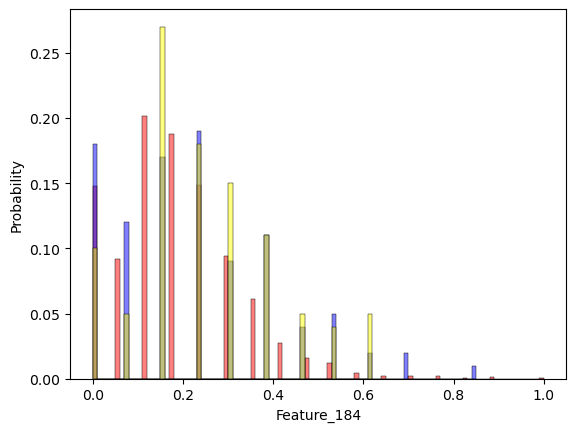

Feature_187
0.62032189545904 0.9661028392831128 0.4830514196415564 0.023071334534265346


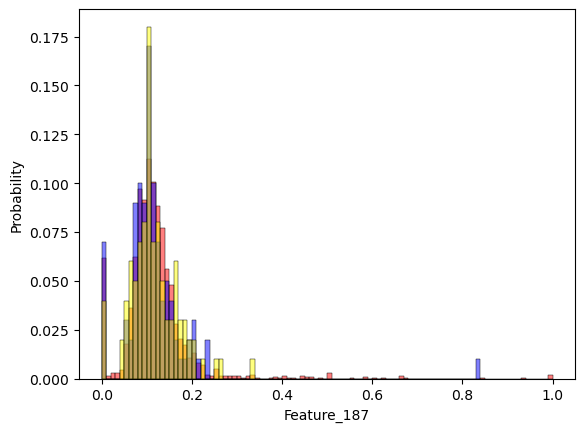

Feature_190
0.2059390757317761 0.55832721118216 0.7208809615120303 0.10955249025919885


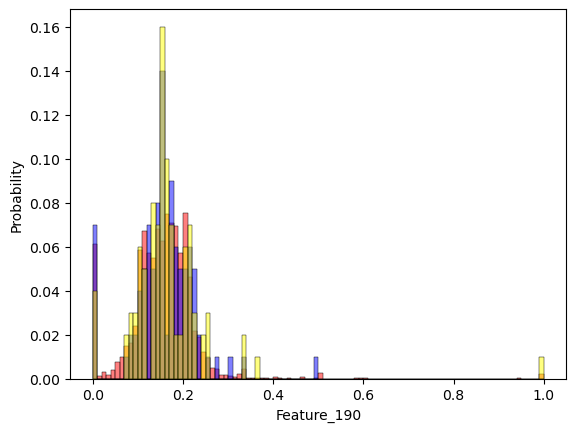

Feature_192
0.37259974872664003 0.134419614837884 0.9328074431080948 0.01597824364779343


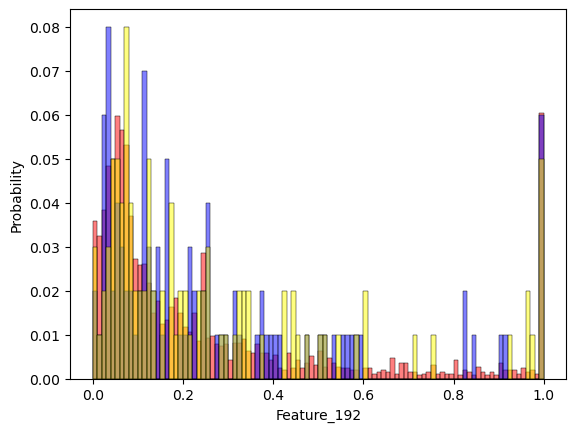

Feature_194
6.619379355769189e-48 2.9314322673898616e-32 1.0 0


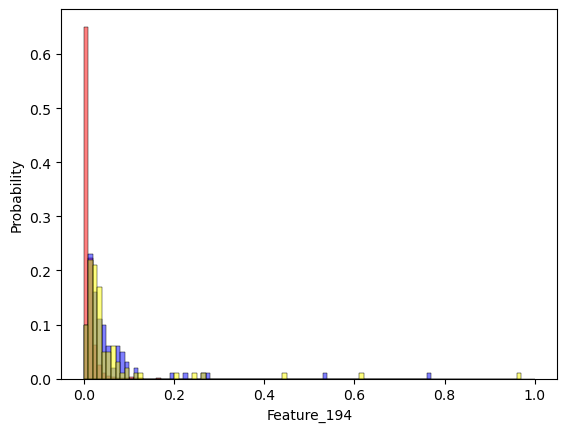

Feature_197
0.2539090515514435 0.48315264028483695 0.7584768419192709 0.013131953947971092


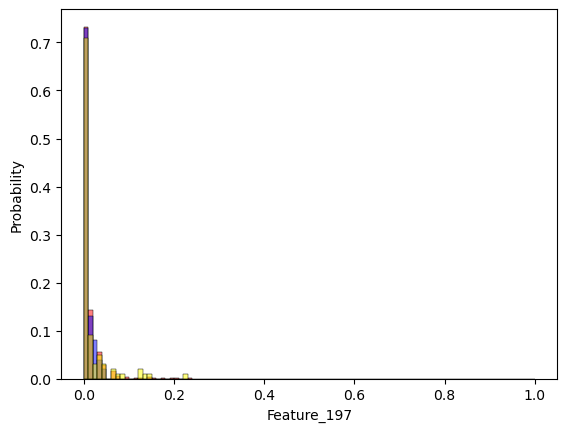

Feature_200
1.0980444839526009e-30 3.064249916162825e-23 1.5321249580814126e-23 1.0728813858120985


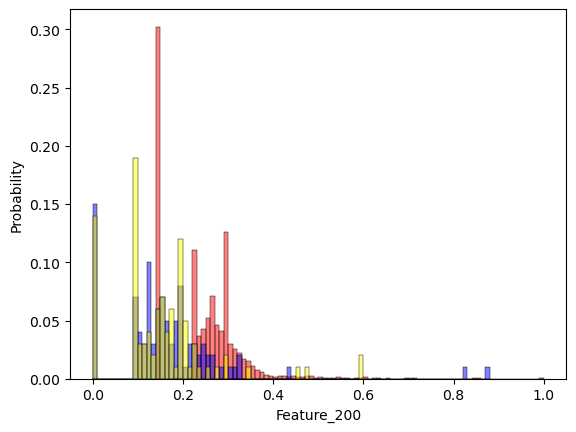

Feature_201
0.8411958889744987 0.24925557902001105 0.8754008587592795 0


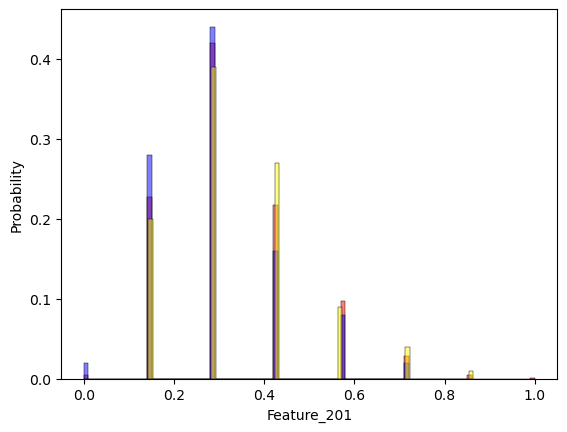

Feature_204
0.20043304665192557 0.07307897236470669 0.9634711377275865 0.01356786491069166


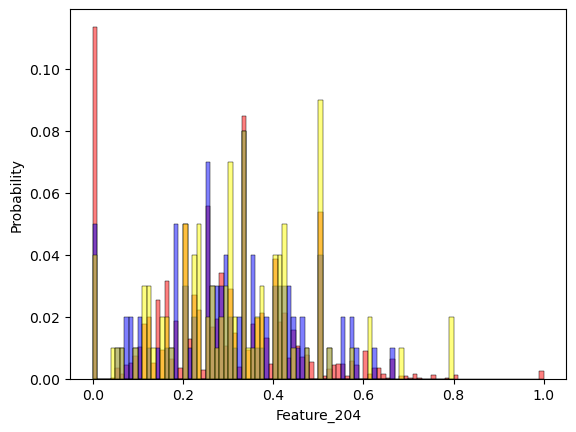

Feature_212
3.4059992182350625e-20 1.3644267723138186e-19 1.0 0.43468706815936586


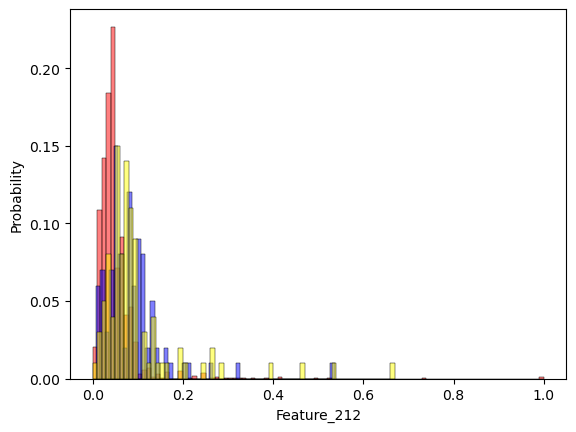

Feature_216
4.1054600344649787e-13 6.366048656406888e-11 3.183024328203444e-11 0.4315420573435901


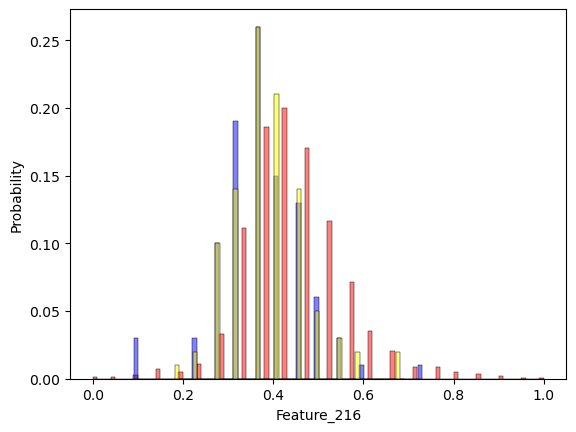

Feature_222
1.6553696266103458e-23 9.733205078188104e-28 1.0 0.5823542306343261


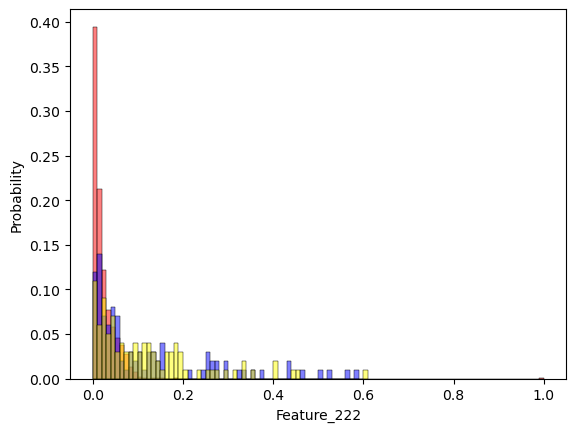

Feature_229
0.028785392608991166 0.053494500653751303 0.9732610300982492 0.02178792949308618


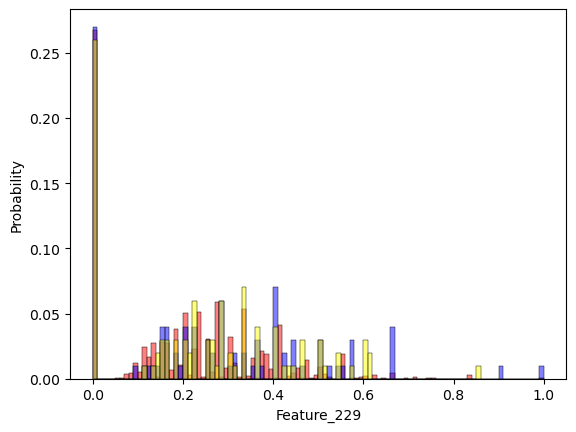

Feature_232
0.00331087386464628 0.0005336609892715475 0.00026683049463577376 0.05507014535431979


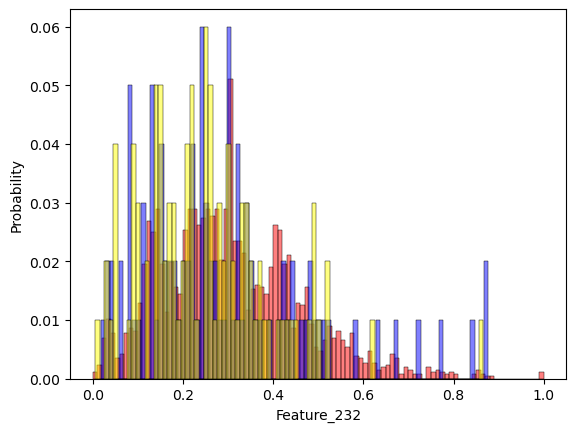

Feature_237
2.2436558161928687e-157 3.892840871551924e-68 1.0 0


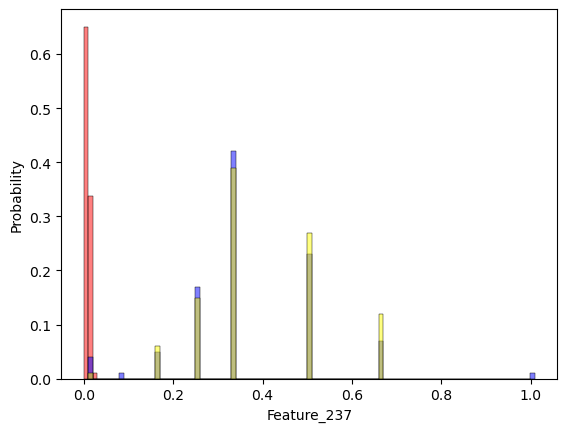

Feature_238
0.09005047626915051 0.08982215674271389 0.9551014693274841 0.0341760807034298


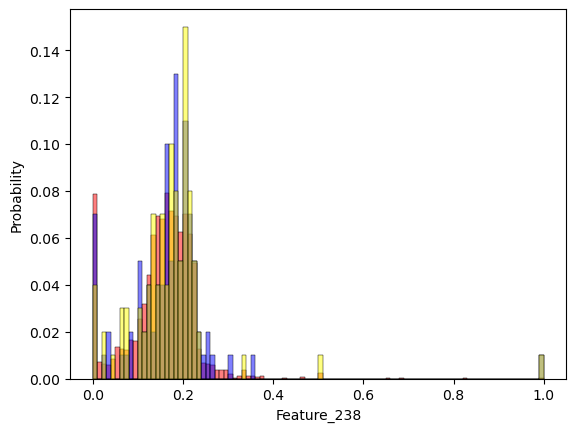

Feature_239
0.0027371778097496835 0.0035982297162559314 0.0017991148581279657 0.06956109887886602


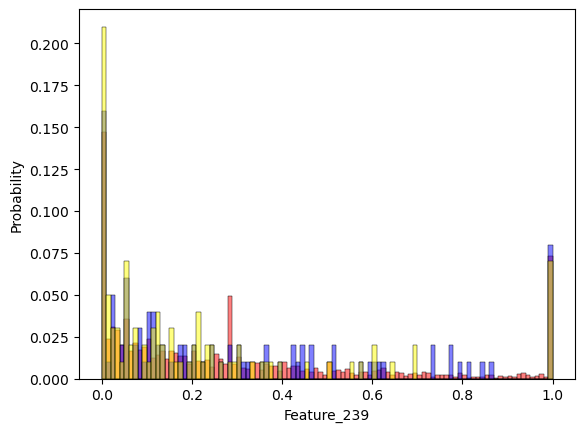

Feature_240
1.6385490296526784e-07 0.0016965112946582736 0.9991521400353605 0.0021265758256066823


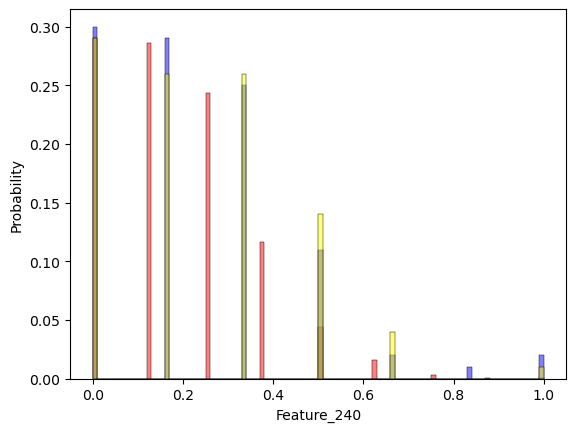

Feature_244
0.00037149748058511357 0.01784848096931288 0.9910790349647001 0.15808282993475792


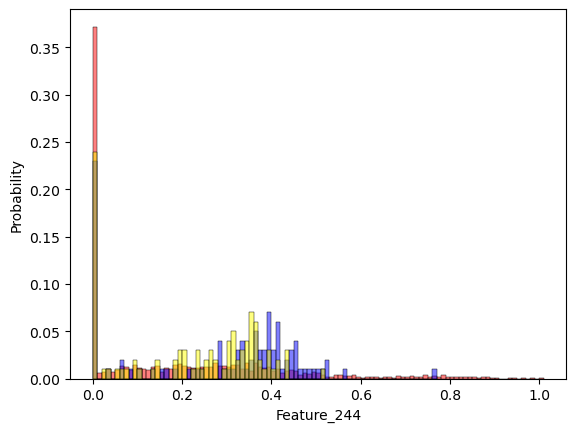

Feature_247
8.088636048962614e-14 0.00024380791570773714 0.9998781602536735 0.22983790376001156


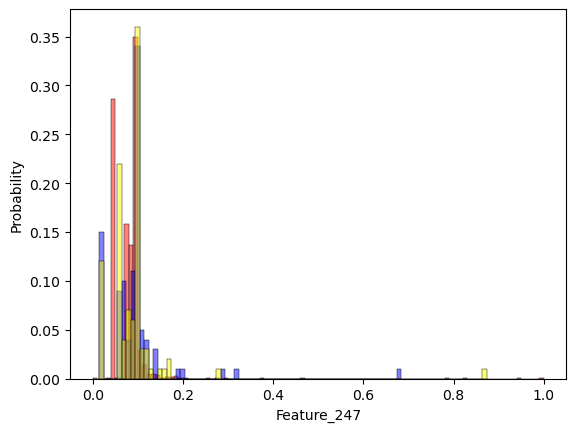

Feature_251
0.00022387527910610426 0.0019831948193518903 0.9990089237503497 0.08647307321890493


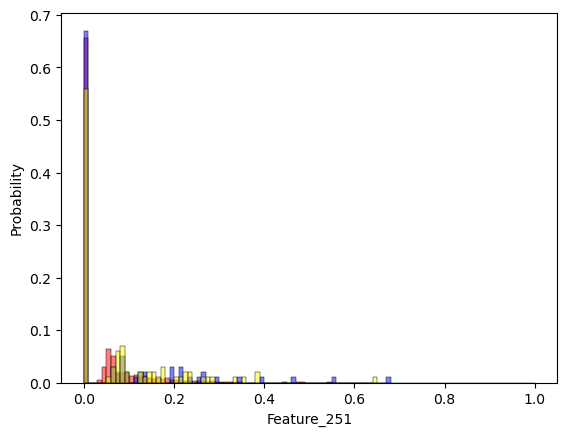

Feature_253
0.14764410676967268 0.7471339276006319 0.37356696380031595 0.05971253251808407


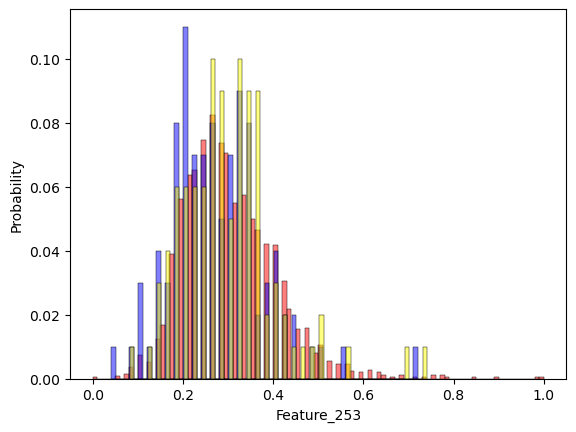

Feature_260
1.8511454161821278e-22 3.7725228678809114e-22 1.0 0.6164558123831589


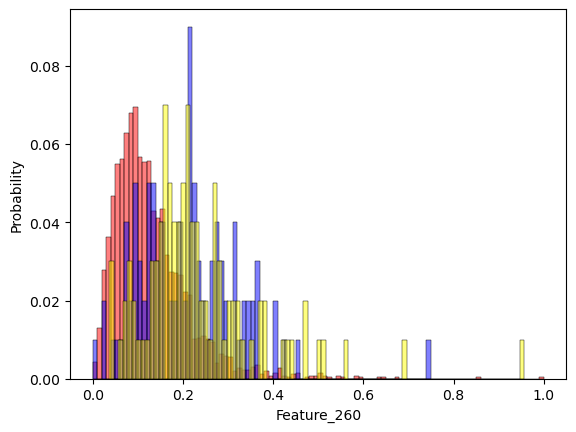

Feature_261
0.021992243201213603 0.5325055036756446 0.7338086583108643 2.2839009404354875e-06


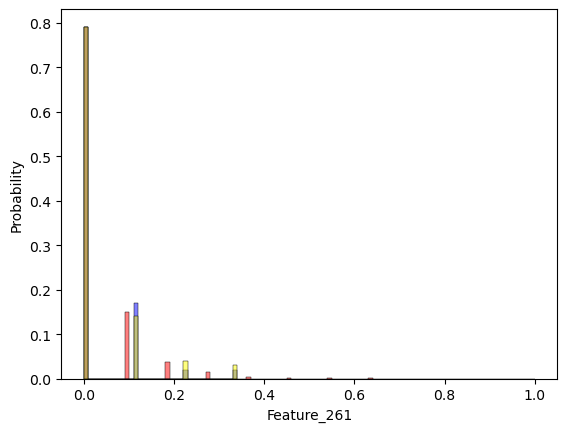

Feature_262
0.5855563252153624 0.11802135660857231 0.059010678304286156 0.012086781454427452


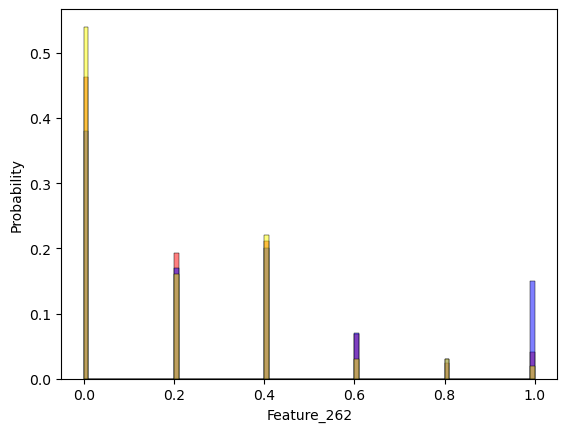

Feature_263
0.3280948686497925 0.16996147420721208 0.9150398870127876 0.034630261881782906


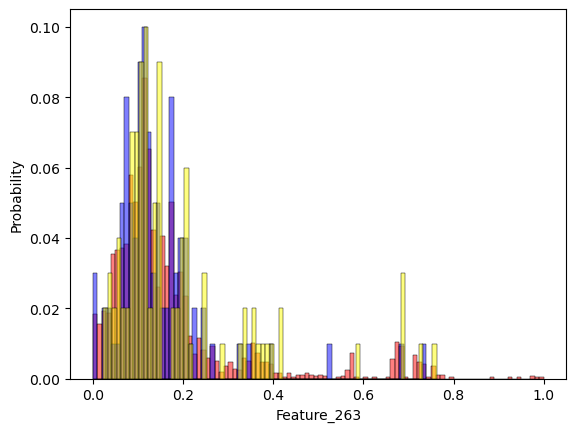

Feature_265
0.018810632181594122 0.3034819057028687 0.15174095285143435 0.026746142084762614


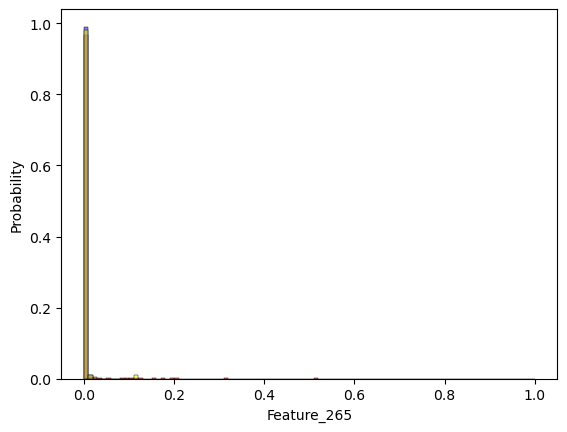

Feature_266
0.0005581604591180268 0.8845755202782342 0.4422877601391171 0.4782672152809273


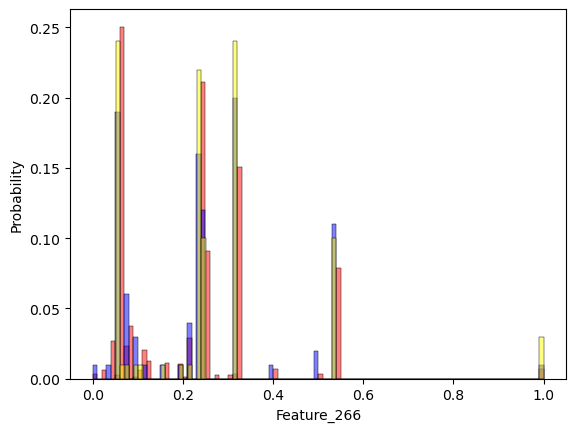

Feature_268
4.758719103639418e-132 1.1390725249583507e-61 1.0 0


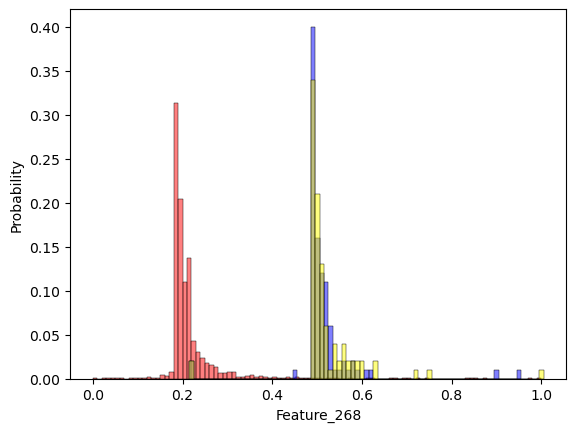

Feature_269
2.9067154907576488e-08 0.0001826429482152385 0.9999087274048334 0.01962348607784536


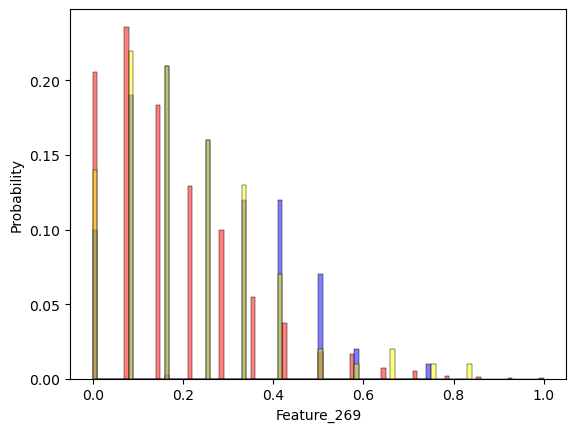

Feature_270
0.5625974978182433 0.3137295839746561 0.8431681856824682 0.006987410444010959


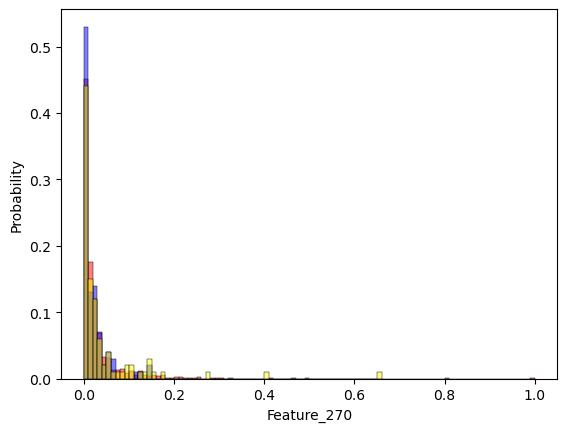

Feature_271
0.01247082187838943 0.1281010390295741 0.935966097510717 0.03367841394457398


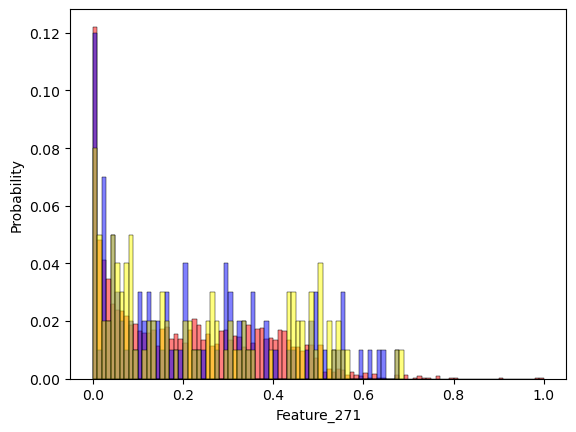

Feature_272
3.816114528128992e-06 0.1163760746587399 0.9418301919450682 0.00010355877268428647


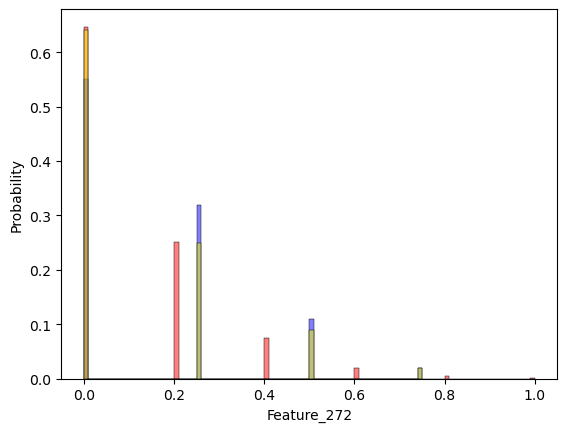

Feature_273
1.0148165656880514e-09 3.8417266417980934e-09 1.9208633208990467e-09 0.22435222178816452


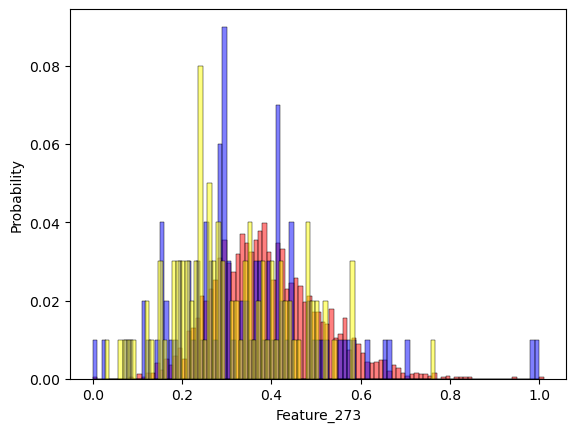

Feature_279
2.2280327110925994e-10 0.005107701077854012 0.9974473493097071 0.04765910346400154


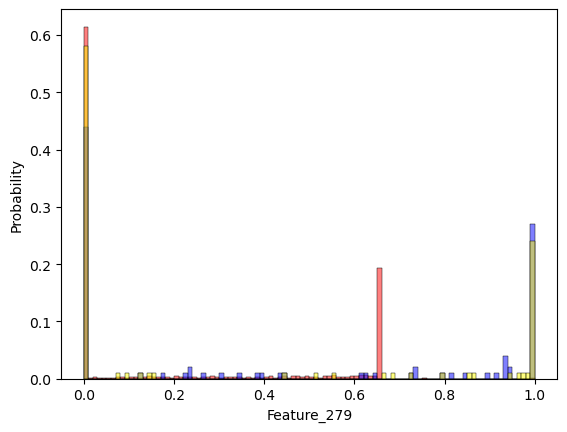

Feature_281
3.163872787534259e-09 4.97198249392836e-06 0.9999975155890682 0.23943043285717416


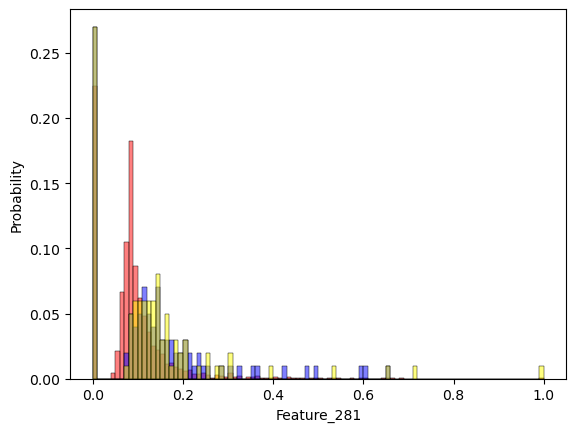

Feature_290
0.09748857983503871 0.049258160092525226 0.024629080046262613 0.0344575659899613


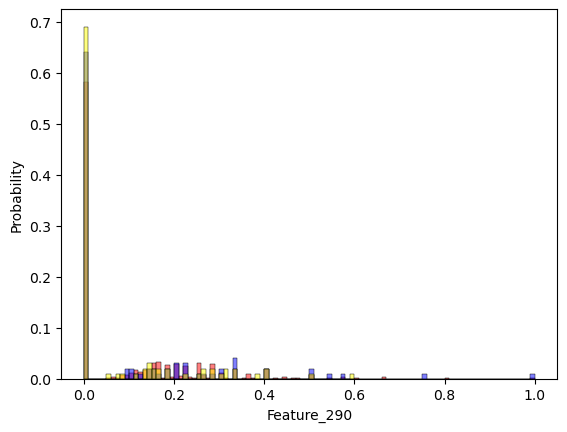

Feature_291
6.20146666262039e-143 4.276657403048123e-64 2.1383287015240615e-64 0


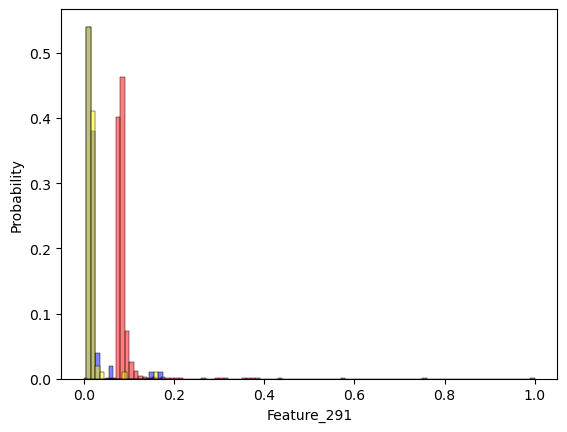

Feature_294
0.0021647470822021737 0.7548056334117351 0.6226564096328222 0.014873077349354946


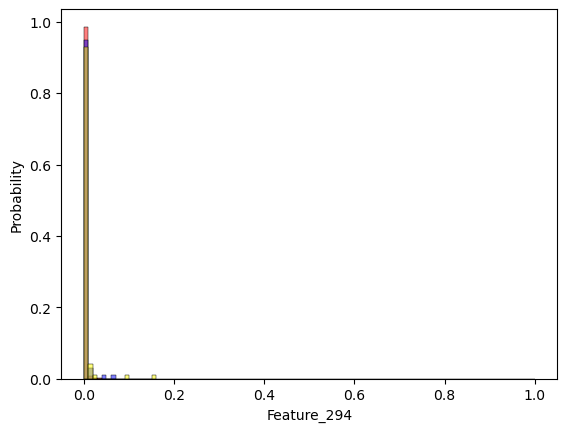

Feature_297
5.582588142614672e-10 0.009821304740899997 0.9950915243110922 0.000903099158494472


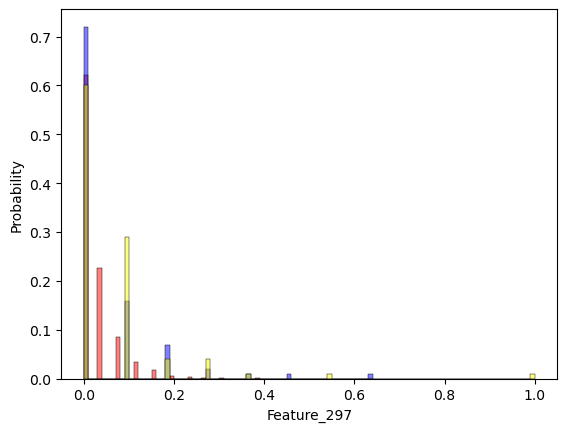

Feature_301
0.5159368579867626 0.9643117680164024 0.4821558840082012 0.024725553973412563


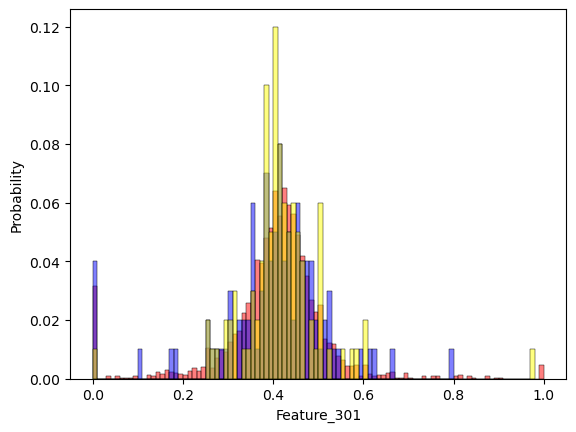

Feature_302
1.0763864024047951e-06 0.046251391488799365 0.9768826356322735 0.0022468970881828684


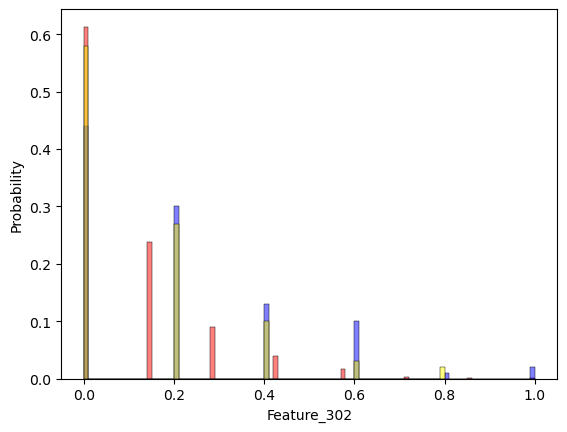

Feature_303
0.16775911574653302 0.04011773657167982 0.02005886828583991 0.019478987837212483


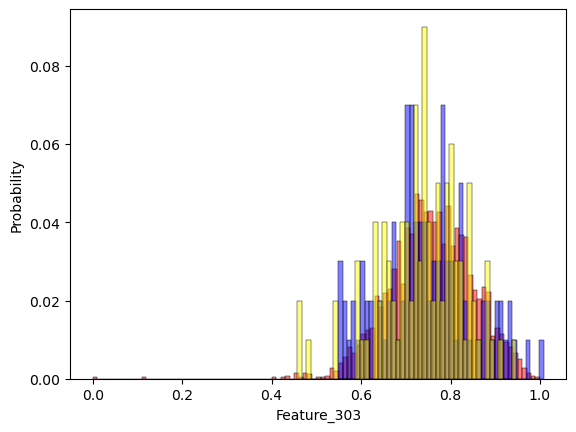

Feature_304
0.03139108836583077 0.0945028649577076 0.9527618338083051 0.025336229395198792


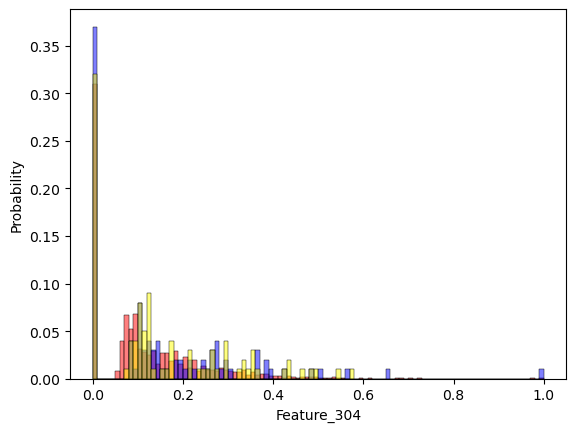

Feature_305
2.394177381946749e-12 0.0010066434155350165 0.9994969251299741 0.0134756478126562


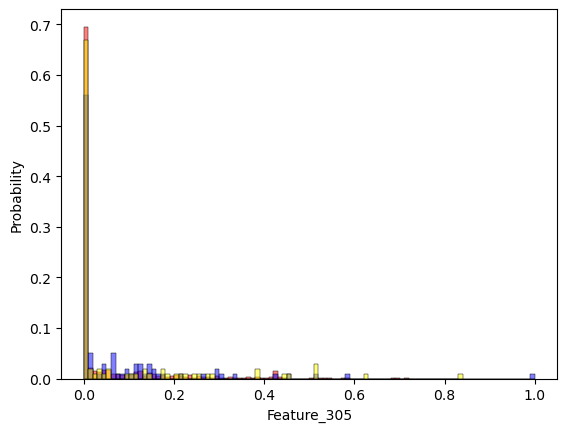

Feature_306
0.7240915260069938 0.7628035971339442 0.6186487456508185 0.006409975550110218


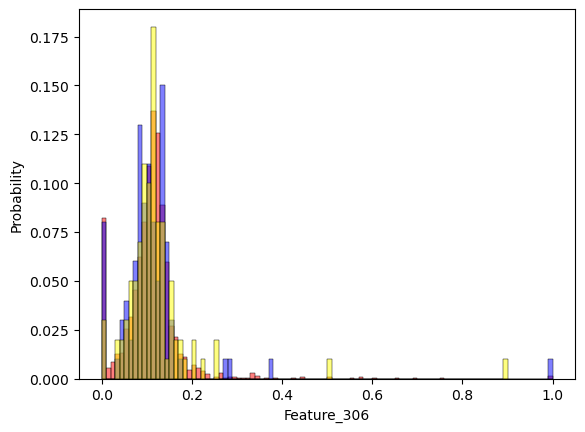

Feature_309
0.5683995826280163 0.33687305823262326 0.8315968185227174 0.011139493856503448


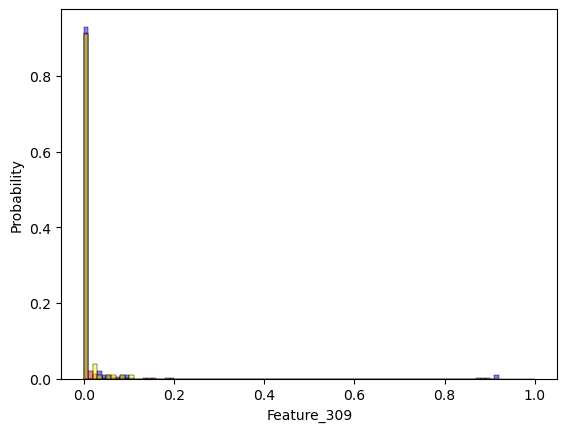

Feature_312
5.331401966601324e-15 6.91877836834185e-05 0.9999654261999403 0.023994034982210366


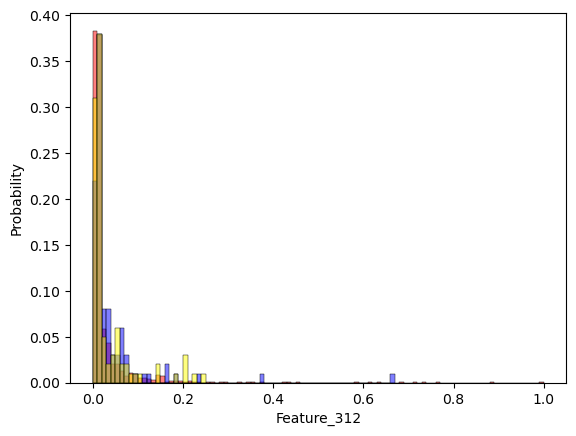

Feature_318
4.878161234559901e-11 1.3114314344275405e-08 0.9999999934479443 0.14726366204800256


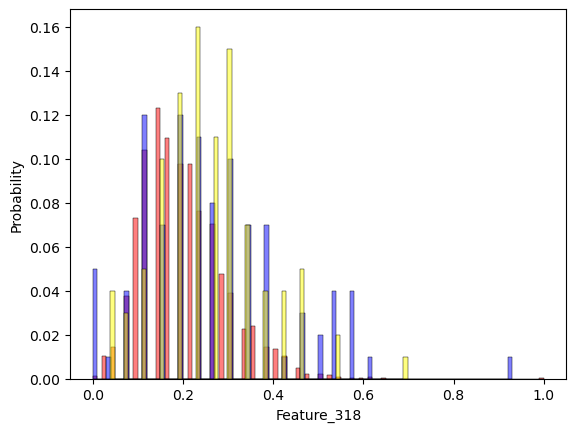

Feature_319
3.082780731719472e-51 6.5995641598250396e-34 1.0 0


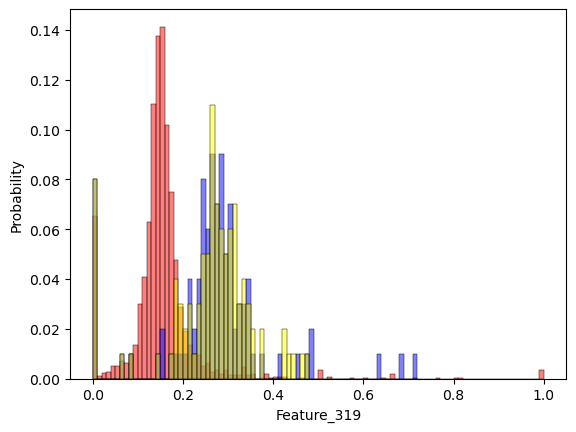

Feature_324
0.025669135109397896 0.0464946460799939 0.02324732303999695 0.0382771443099261


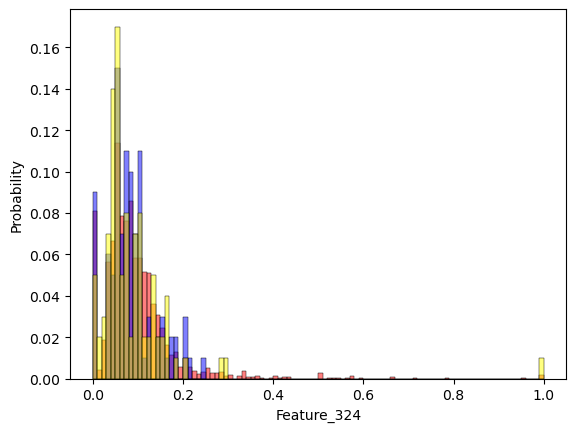

Feature_326
9.495147915778386e-22 0.0021515517117182224 0.0010757758558591112 0


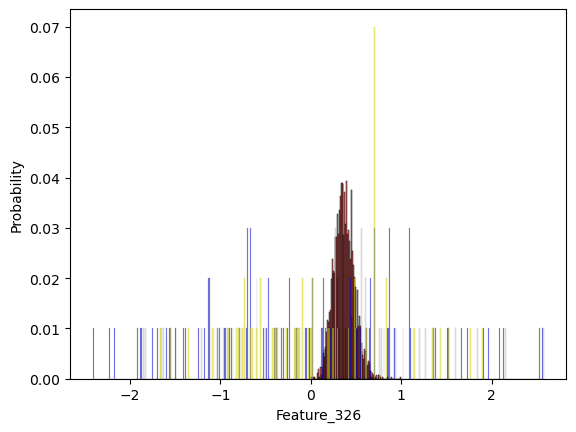

Feature_327
0.014681403794080049 0.2638199638433688 0.8681184502065258 0.06527215670541128


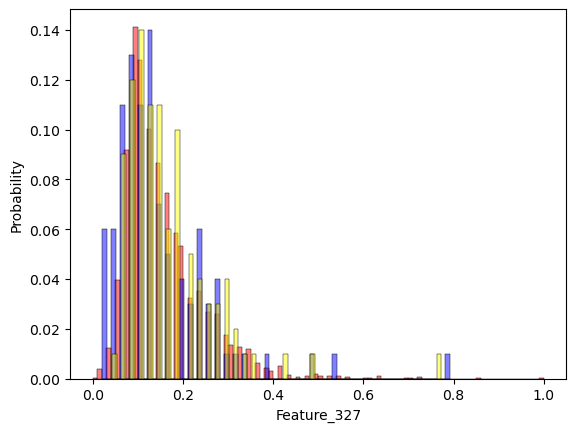

Feature_336
0.020742685099891654 0.17887783848936656 0.08943891924468328 0.057150398782736374


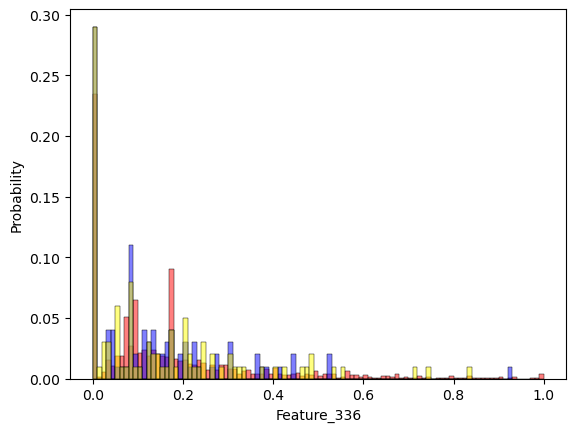

Feature_337
0.00021340135846566717 0.3493907943486797 0.17469539717433985 0


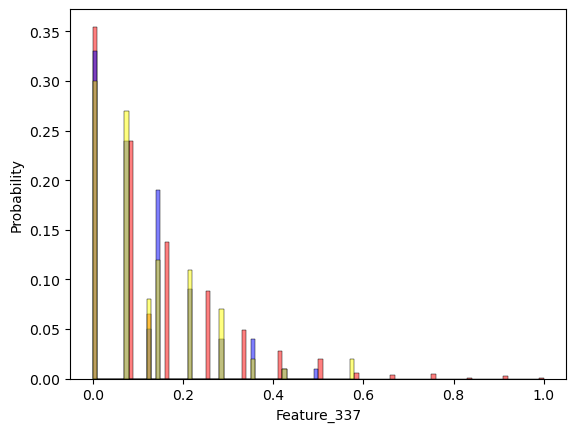

Feature_339
1.653753346874175e-66 3.459892011493885e-50 1.7299460057469426e-50 1.7686152826942843


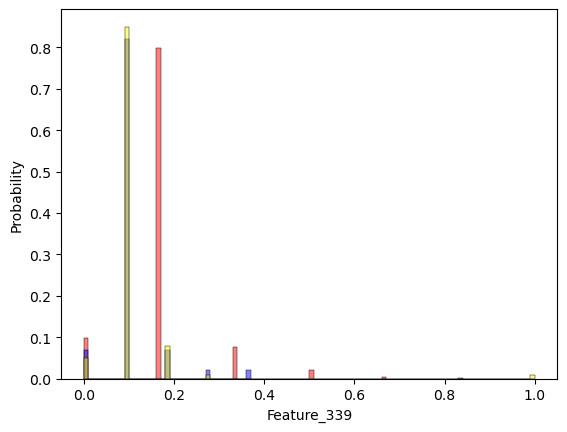

Feature_343
2.6427730213372566e-05 4.625922236212086e-05 0.9999768835857459 0.15123507344526457


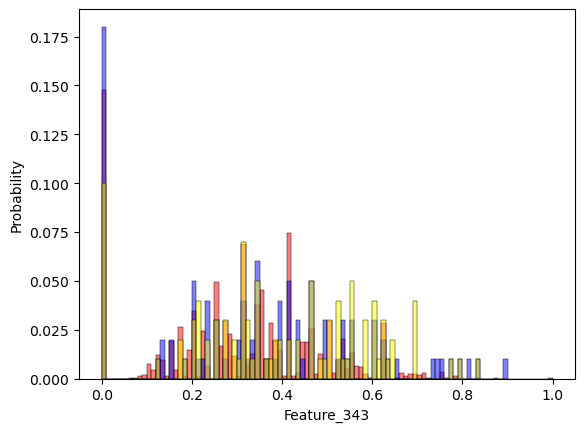

Feature_344
0.5169364126686259 0.9441095785004177 0.5279995953994967 0.025222756648226034


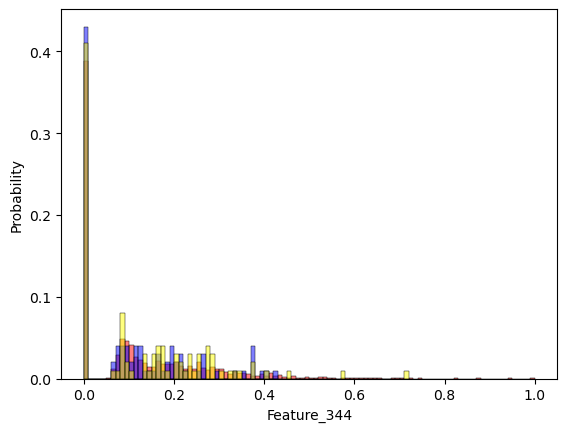

Feature_346
1.058695486751785e-05 0.44993242103947184 0.22496621051973592 0.3092516342667857


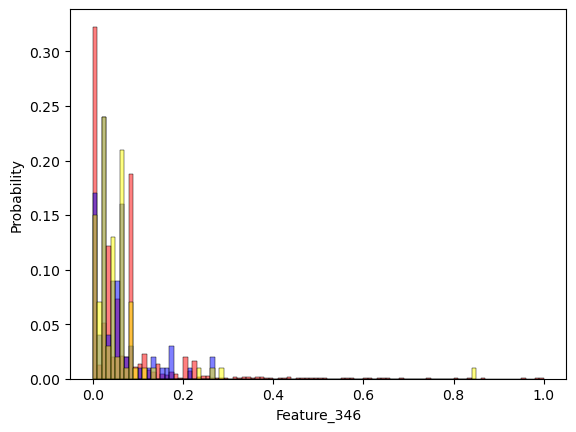

Feature_347
6.85400490255041e-10 0.00043246701932528656 0.9997838857384531 0.029097596662137216


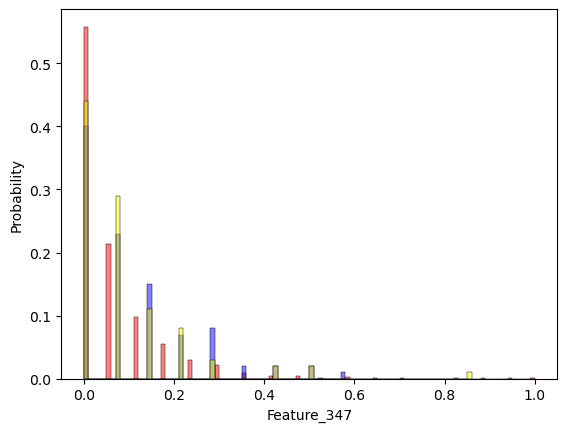

Feature_349
0.21386977589249268 0.3632691861497992 0.1816345930748996 0.01697759363988756


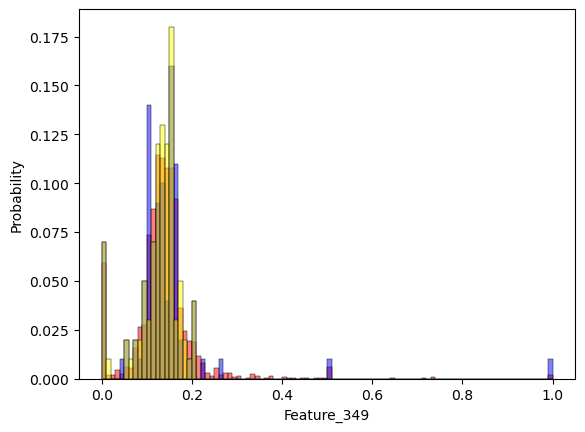

Feature_350
0.4536116059095087 0.6324391205113509 0.6838276146436986 0.05703029628120522


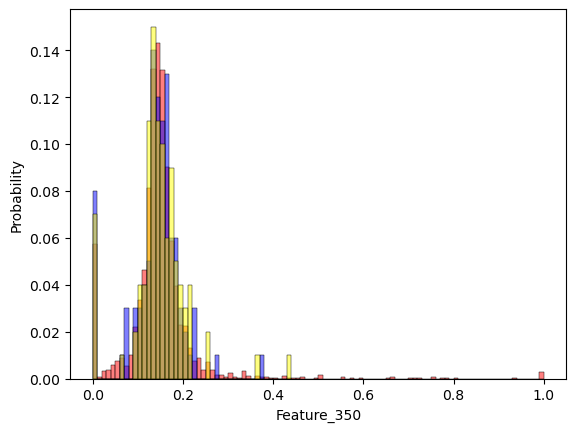

Feature_352
0.09076433826451866 0.3552560346238328 0.8224066703742962 0.04676386050565523


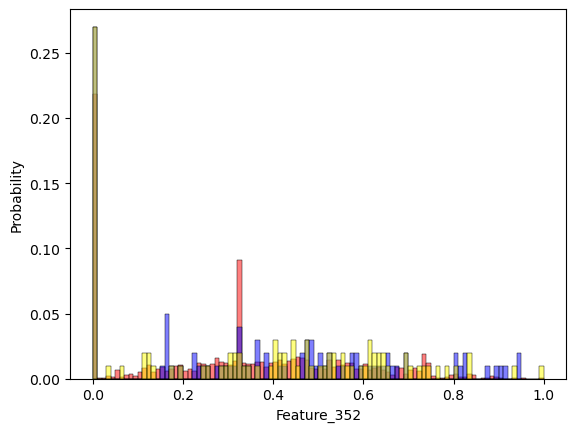

Feature_353
0.9575897485686554 0.9880988181116565 0.5060034811105538 0.013803086898109553


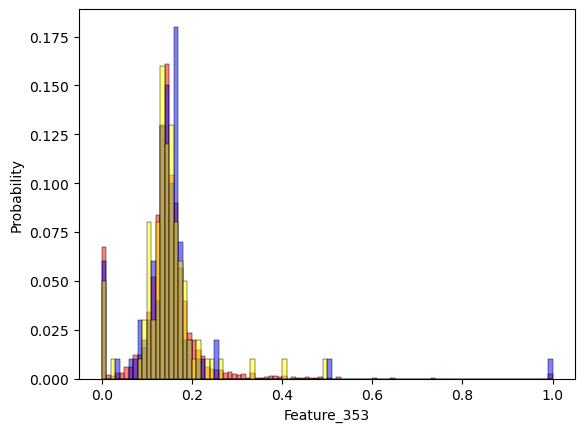

Feature_359
0.0431256790292416 0.02119664010868655 0.9894054041187442 0.03170550922910473


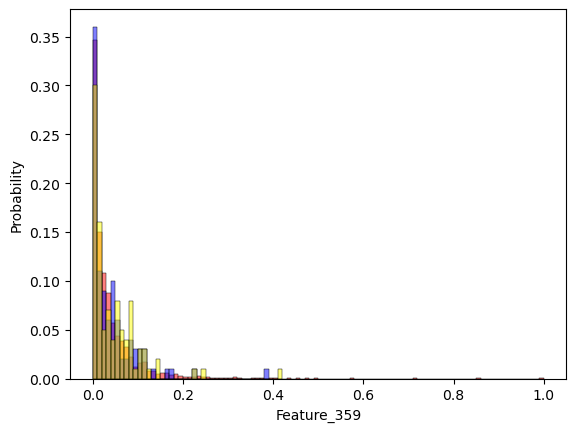

Feature_361
0.19724844264541302 0.6171808001956692 0.3085904000978346 0.007597554453585058


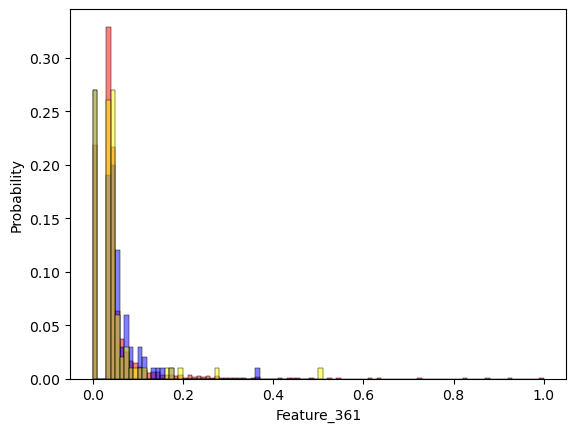

Feature_363
2.1755082587726817e-09 4.019107019072523e-05 0.9999799163278345 0.01239824594420022


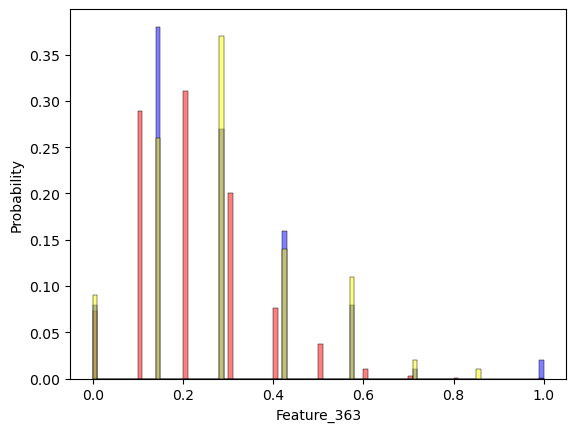

Feature_376
0.9947895259368607 0.6356869374378469 0.31784346871892344 0.004533940657442136


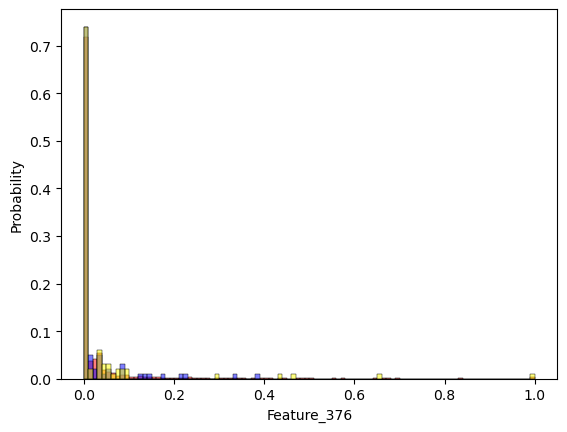

Feature_378
4.8192603985327664e-20 1.862092027206292e-21 1.0 0.3657337145768066


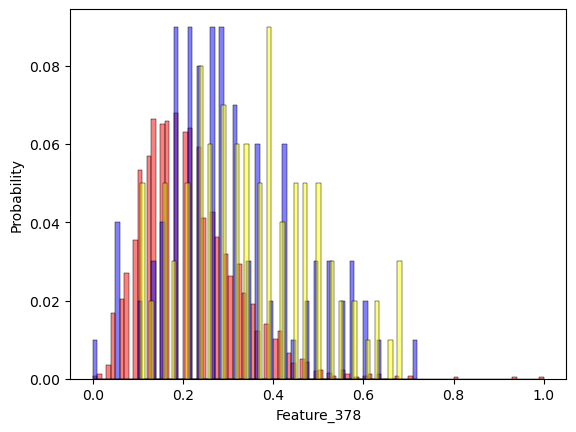

Feature_383
0.0009147058481778447 0.18064785045115062 0.09032392522557531 0.3008981046591387


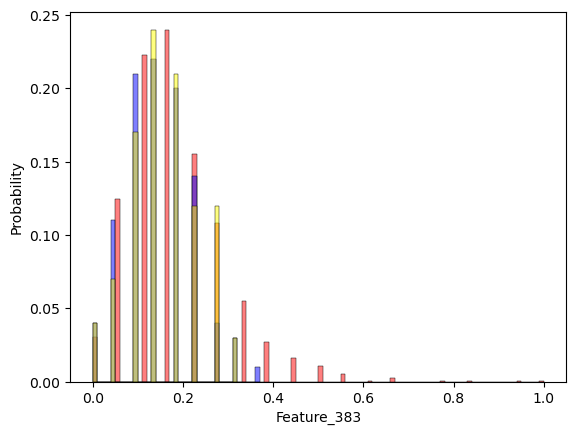

Feature_384
1.0366893156972873e-19 4.491840235468148e-07 0.9999997755747778 0.03316405952001907


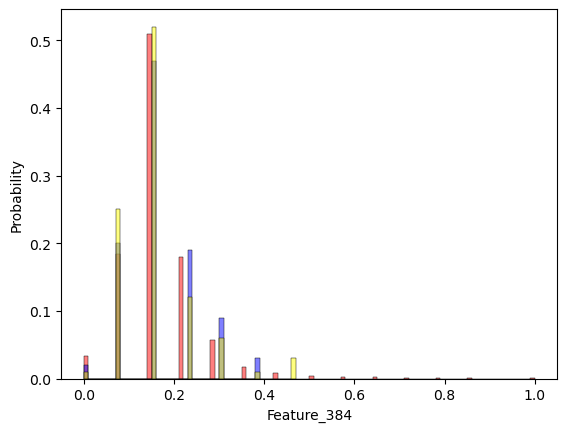

Feature_386
7.807995561931432e-36 2.2658065962263683e-20 1.0 0


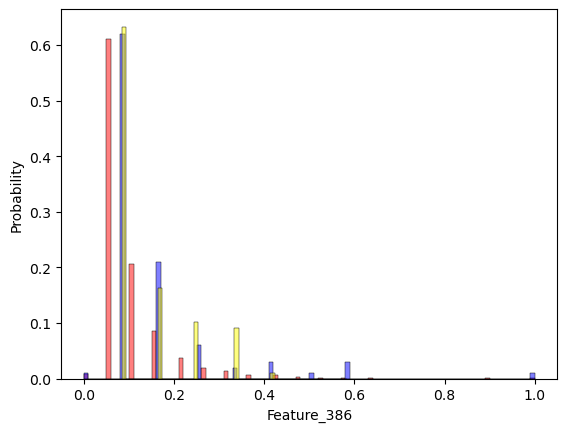

Feature_388
0.876003841352576 0.46747281813634123 0.7663174708307108 0.008583531848235987


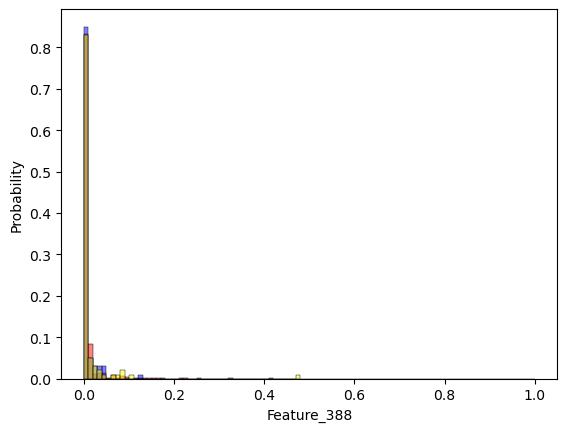

Feature_391
1.0279714322769371e-21 5.001583188326684e-08 2.500791594163342e-08 0.8850857159192317


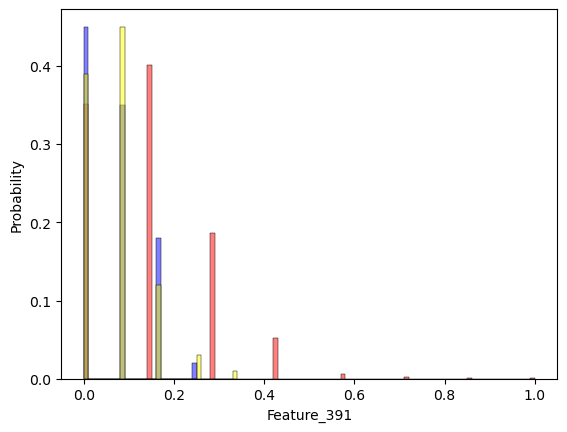

Feature_398
0.00018263965165925085 0.2769989030302742 0.8615324249708296 0.001199018222668706


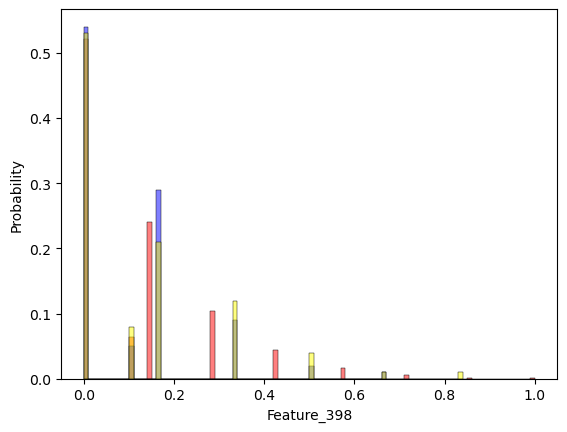

Feature_399
0.9891312416447454 0.7996180115817004 0.600242265226614 0.004843222542112861


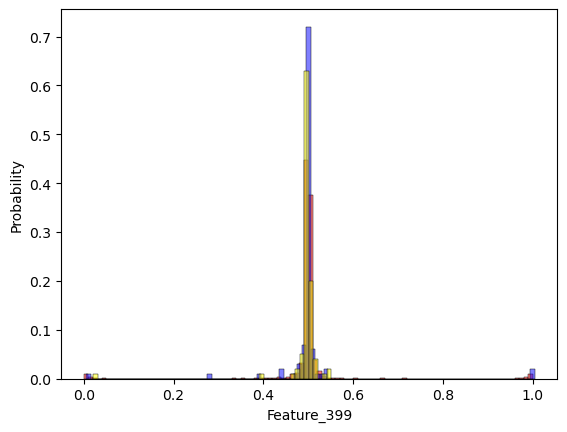

Feature_400
0.5670315155693144 0.18557065538529294 0.9072449933423989 0.03934965203432088


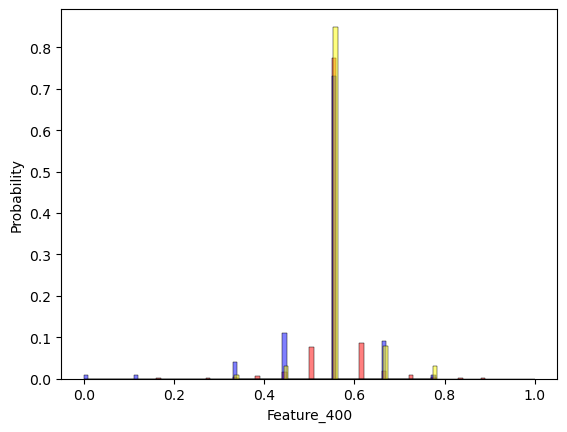

Feature_401
1.7902347158947494e-142 4.061169444920189e-63 2.0305847224600944e-63 0


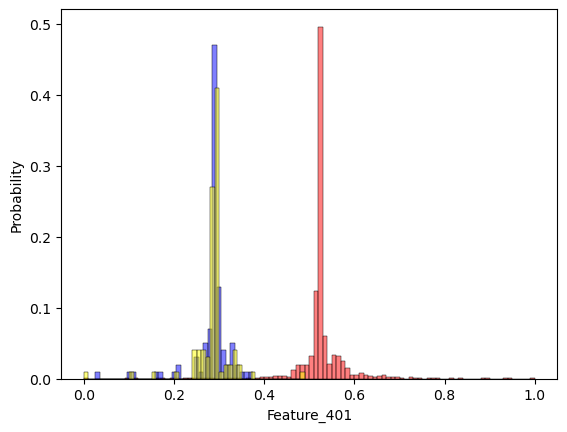

Feature_402
1.6368669576913757e-177 6.702329956153817e-77 1.0 0


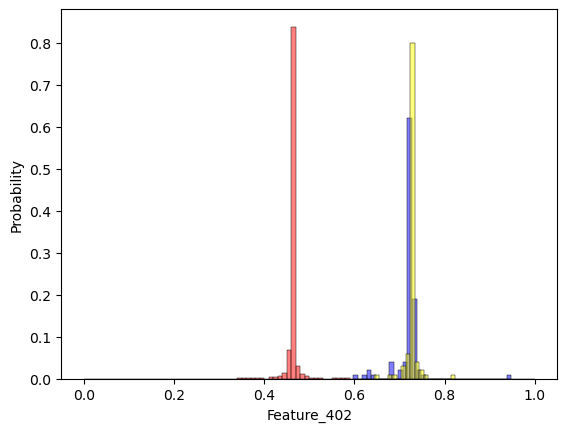

Feature_403
1.4541353862594732e-10 2.176798637601585e-06 0.9999989123151634 0.18230146688807392


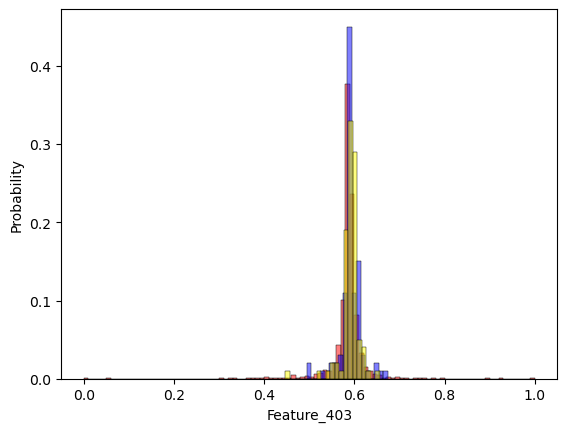

Feature_406
2.2462653831153948e-102 9.434058167259862e-79 1.0 0.2453500962002591


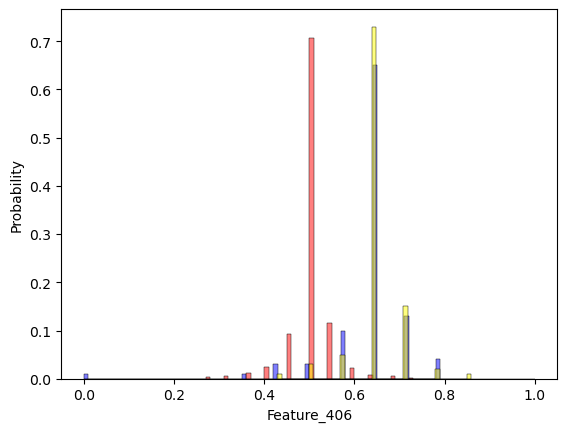

Feature_407
2.7101924013429105e-60 6.337064570536029e-42 1.0 0


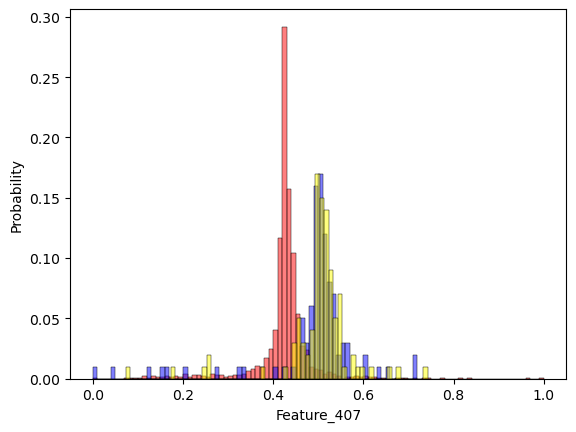

Feature_408
0.0006886023939927315 0.0003082315153204543 0.00015411575766022714 0.07751574758470303


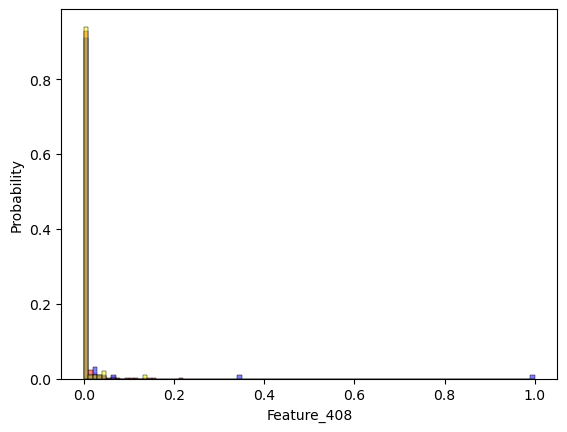

Feature_410
1.2499264335278601e-11 5.120770620888373e-12 2.5603853104441867e-12 0.24128906700785768


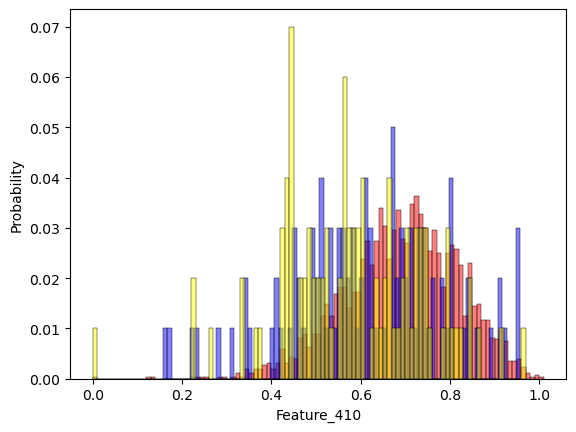

Feature_411
4.943198208131241e-15 1.287187839618105e-07 0.999999935687164 0.16373183601453822


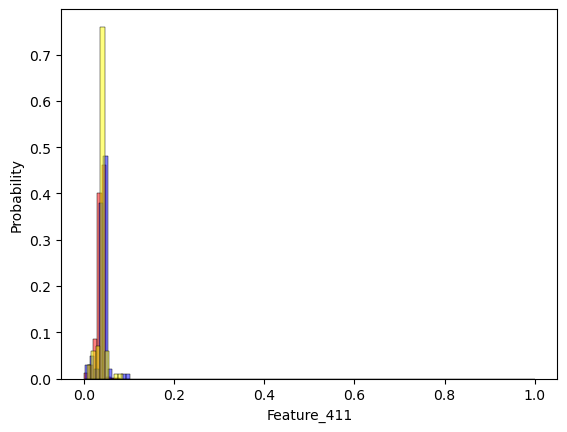

Feature_412
8.231708533430153e-82 5.4685513372177e-51 2.73427566860885e-51 0


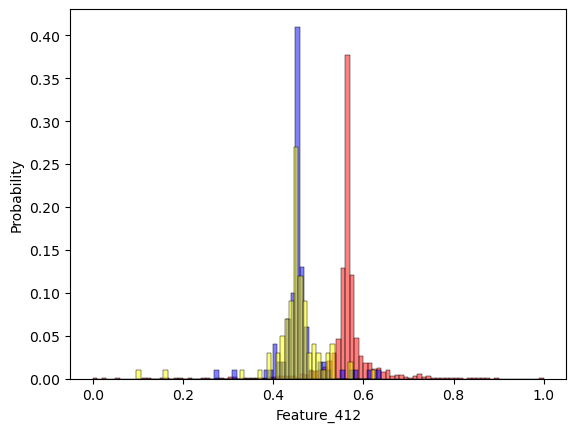

Feature_413
1.0044347373027812e-17 0.0002598196456132879 0.00012990982280664394 0.473751286258272


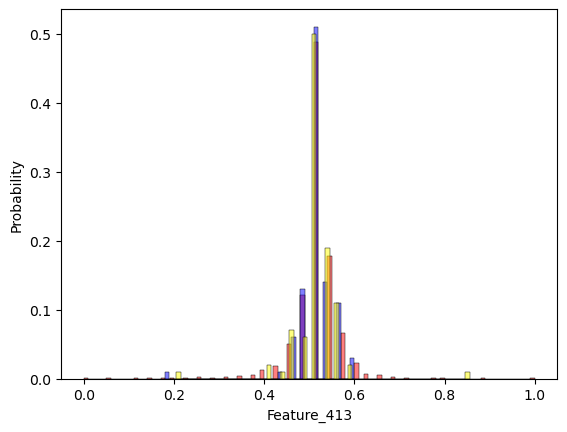

Feature_416
0.4832500290906215 0.16091001147369843 0.08045500573684922 0.012837247961243518


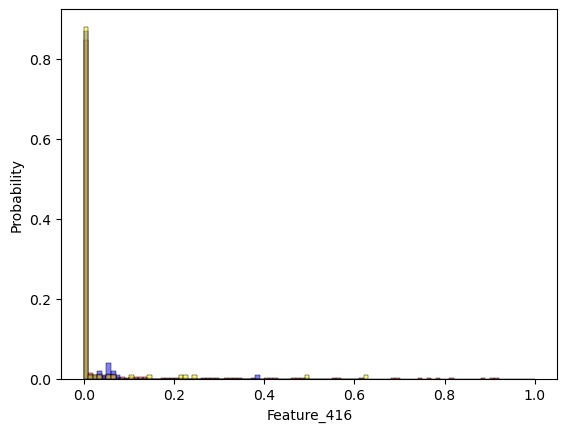

Feature_417
1.3510345484026722e-54 9.283176573041556e-39 1.0 0


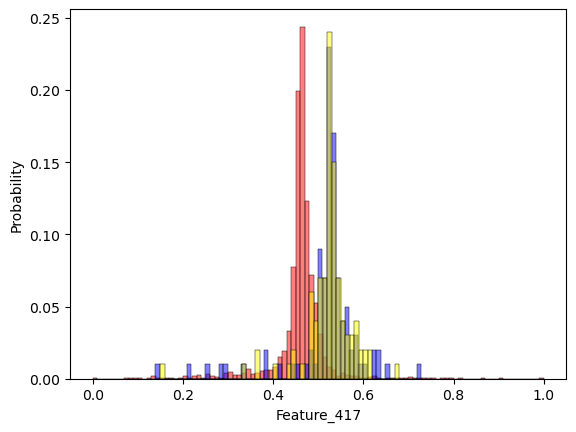

Feature_419
1.3922771430721227e-107 1.3821872239439032e-63 6.910936119719516e-64 0


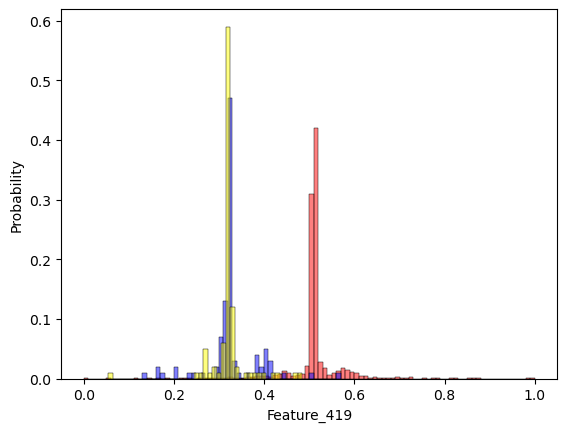

Feature_421
2.48532712828606e-128 6.6410605899893295e-75 1.0 0


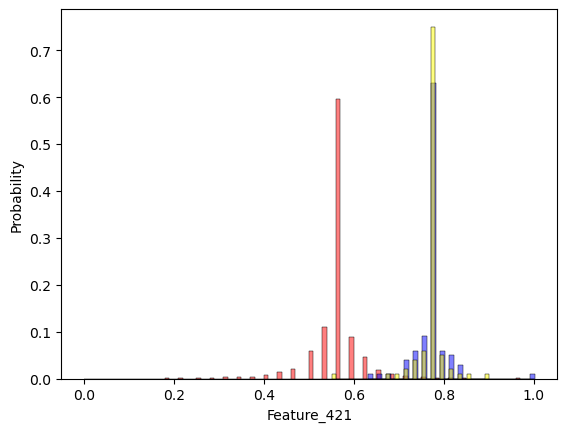

Feature_422
5.704351672778902e-139 3.088771439842235e-62 1.0 0


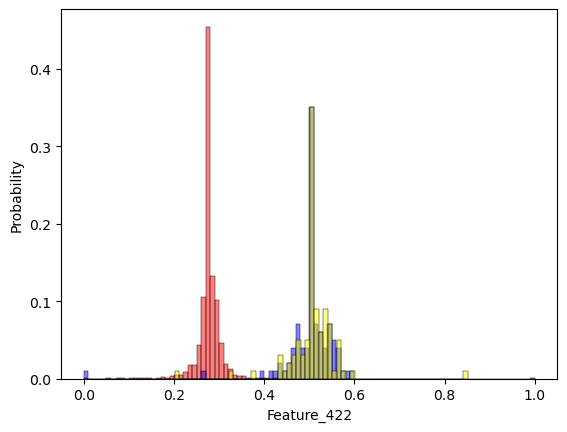

Feature_427
1.048813067604499e-161 2.372908051404893e-163 1.0 0


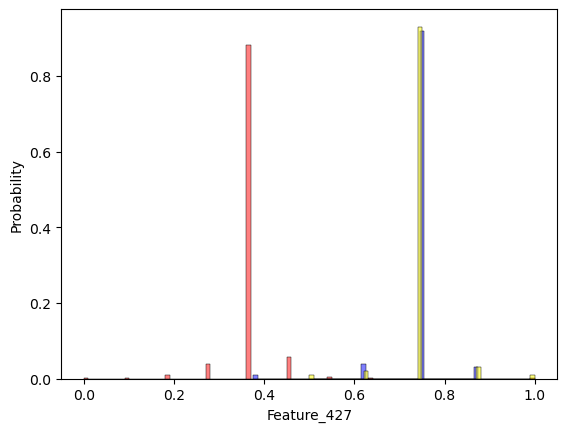

Feature_428
9.145075525040335e-122 1.64019183730051e-92 1.0 0.18992416437902418


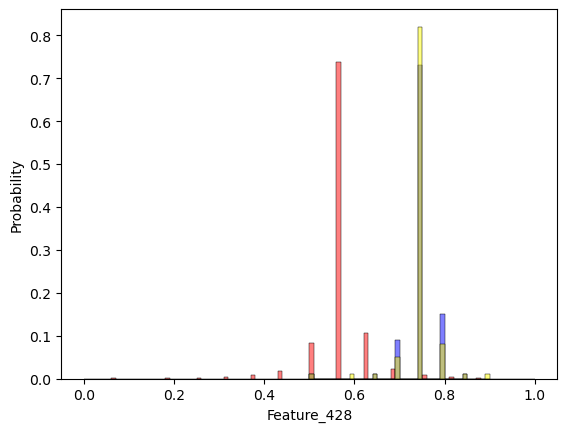

Feature_429
3.2939738698440724e-78 5.5249347411222045e-52 2.7624673705611022e-52 0


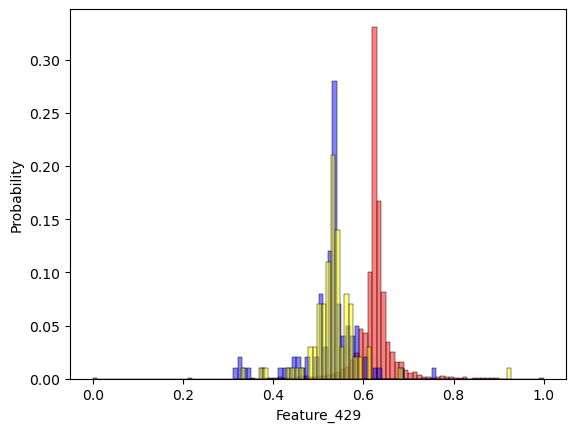

Feature_431
5.105484189921535e-142 8.428686835016615e-64 1.0 0


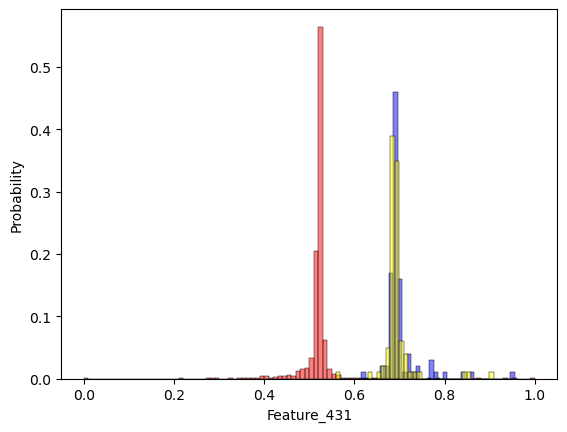

Feature_432
1.0707118152402917e-131 1.43551869973389e-59 7.17759349866945e-60 0


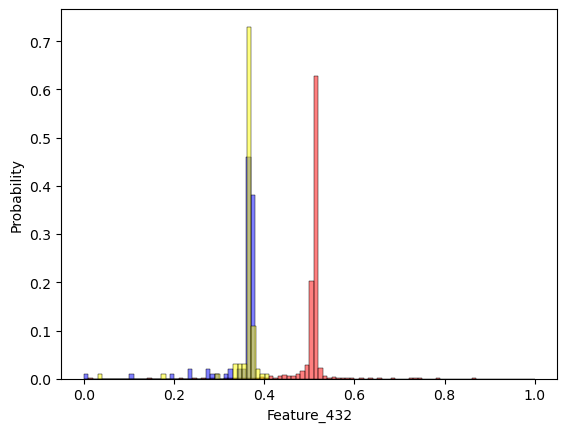

Feature_433
0.00843508401007822 0.003453384665821786 0.001726692332910893 0.0822189336319504


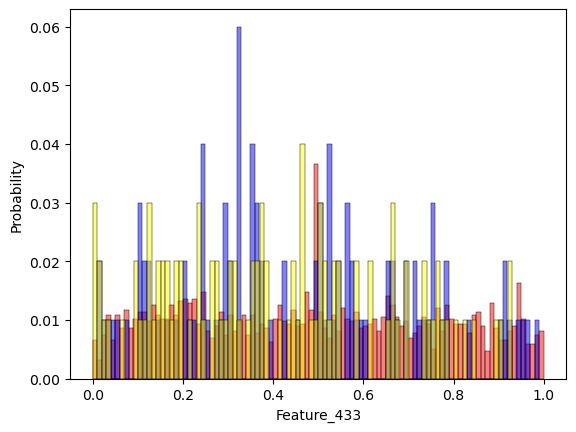

Feature_437
0.6481665040852592 0.7758235181280393 0.612139027252598 0.0363109879206186


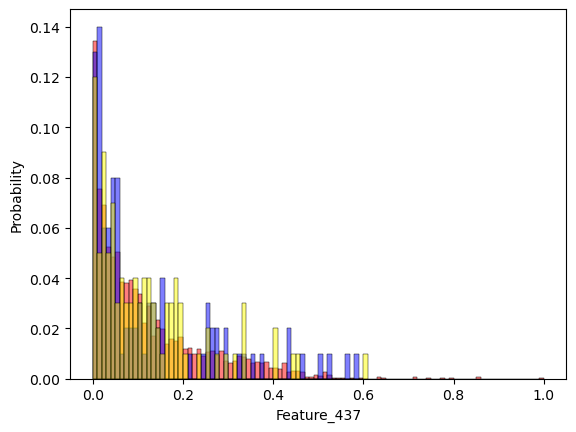

Feature_441
1.7054527056696366e-18 6.016681303881228e-08 0.9999999699400954 0


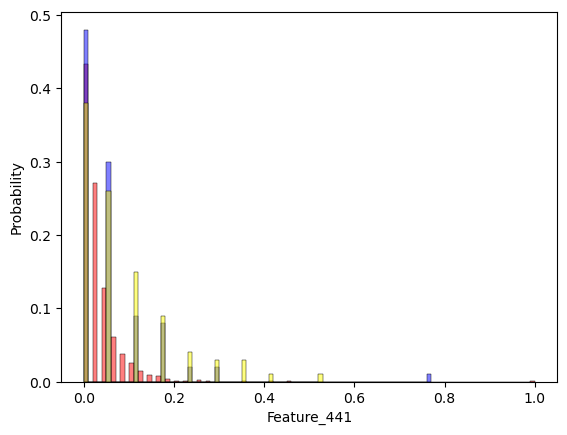

Feature_444
0.9999999999998985 0.6858849568322716 0.6571333558042143 0.0


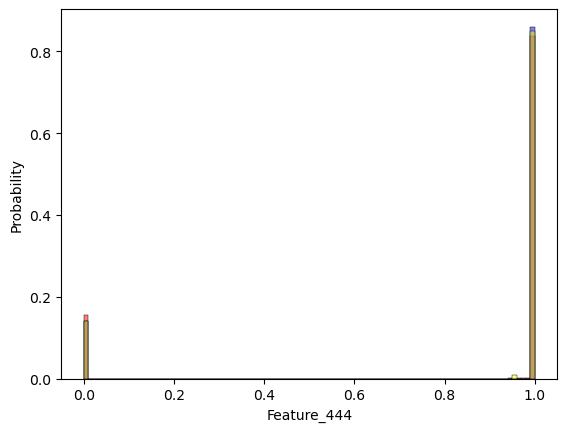

Feature_445
0.12838744948831232 0.003949740908864796 0.9980260384351555 0.028324299162468425


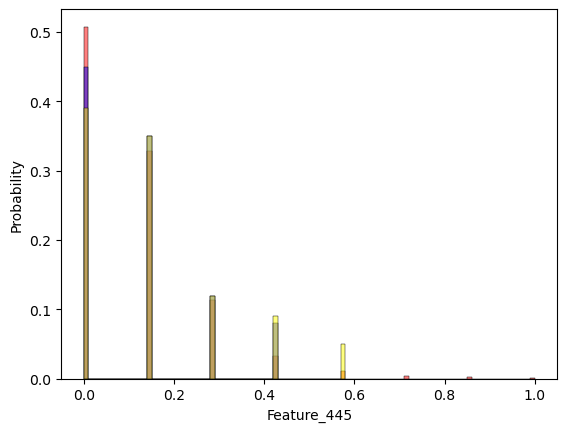

Feature_446
0.0015679567831109467 0.01173496859140152 0.9941347257208194 0.04097680815787508


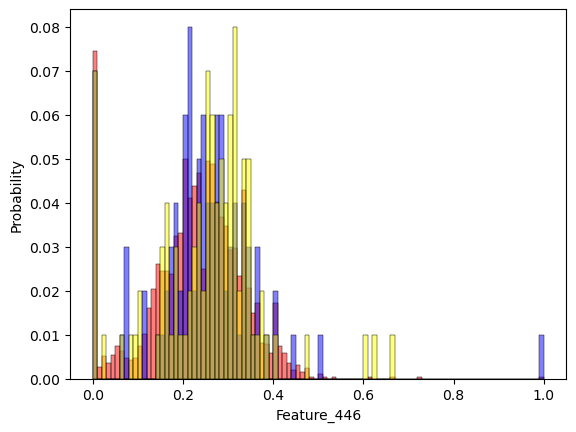

Feature_454
1.2486569152506965e-18 1.6530437355299109e-15 0.9999999999999992 0.48389516037624475


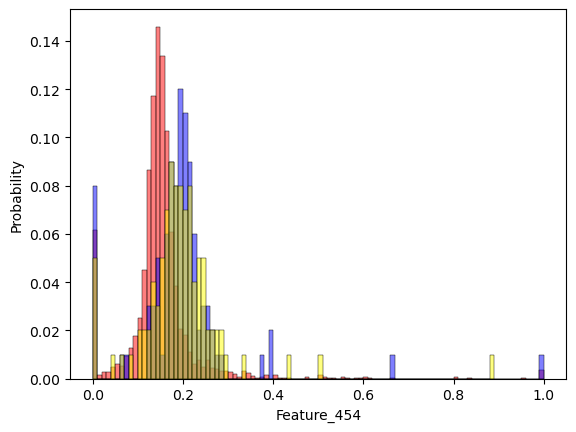

Feature_463
0.9868497943833745 0.7188962562493819 0.35944812812469096 9.317784975616849e-07


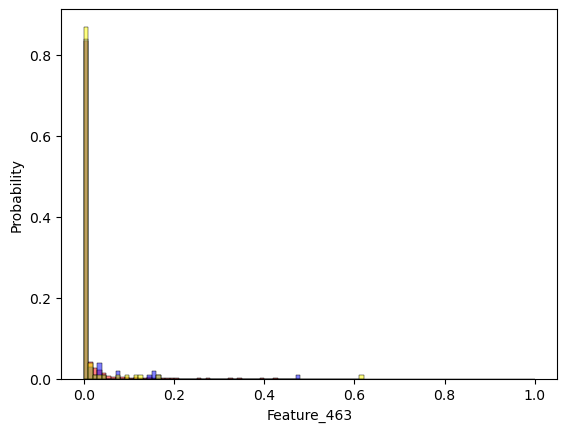

Feature_467
0.7185035912502233 0.7216404362743503 0.6392294512537257 0.01864910571640413


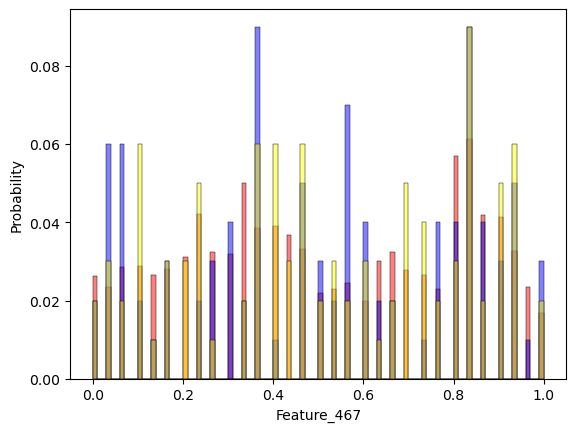

Feature_471
6.52546725026445e-23 3.739442517757209e-14 0.9999999999999813 0


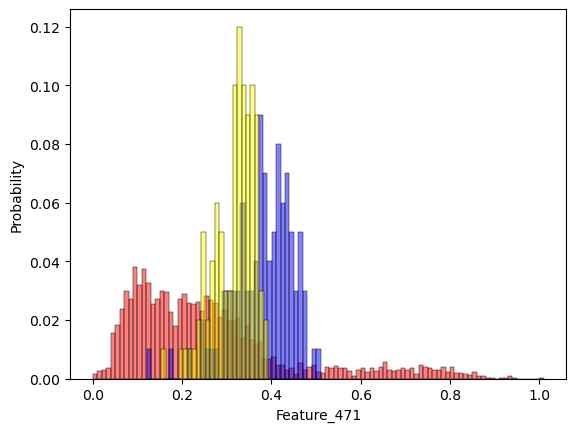

Feature_473
0.8023128572006296 0.8865472619161934 0.4432736309580967 0.016984766389060796


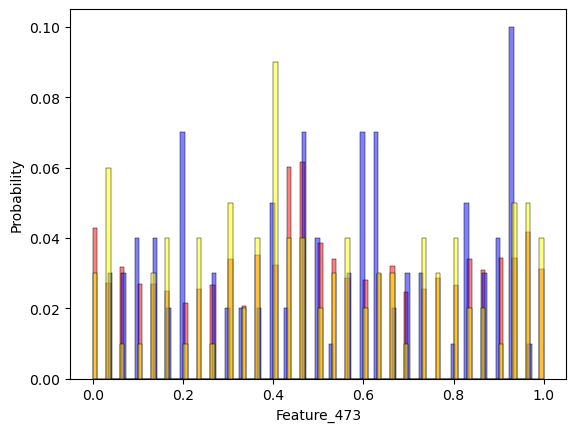

Feature_474
0.9386492018337826 0.8162101444947453 0.40810507224737264 0.007151003220100465


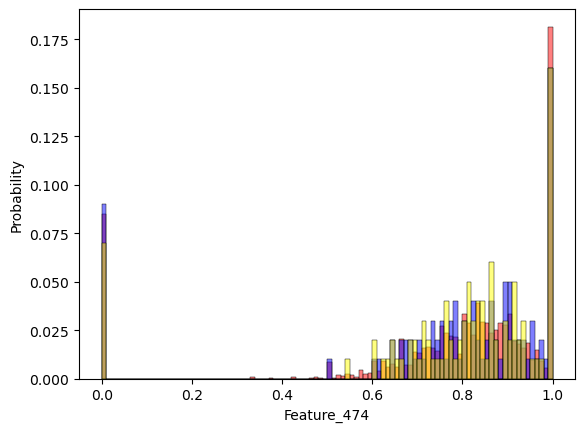

Feature_475
0.9999996017636926 0.6178174180630649 0.30890870903153245 0.0004042286388491658


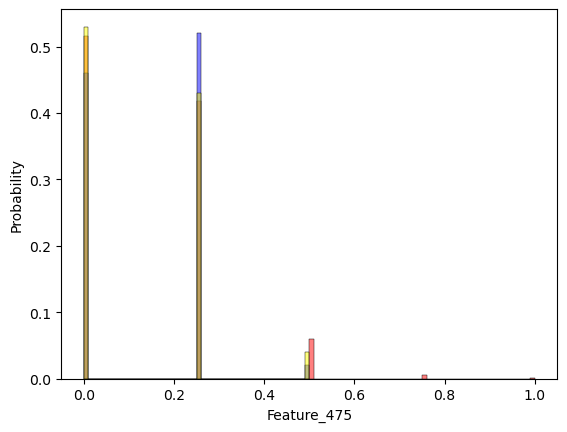

Feature_477
4.963766845293687e-40 6.39955742345287e-36 1.0 0


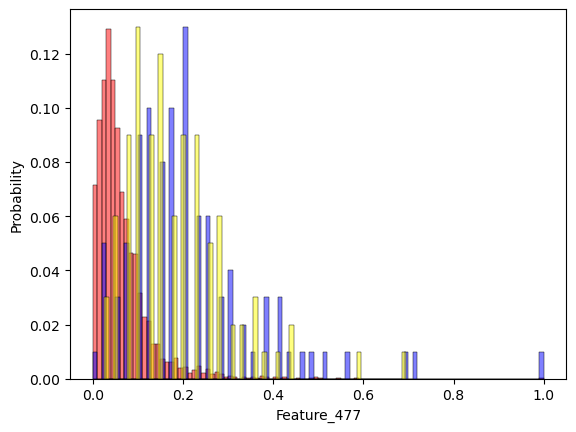

Feature_478
0.6396968523643942 0.9699427854836493 0.48497139274182466 0.0003785378543172766


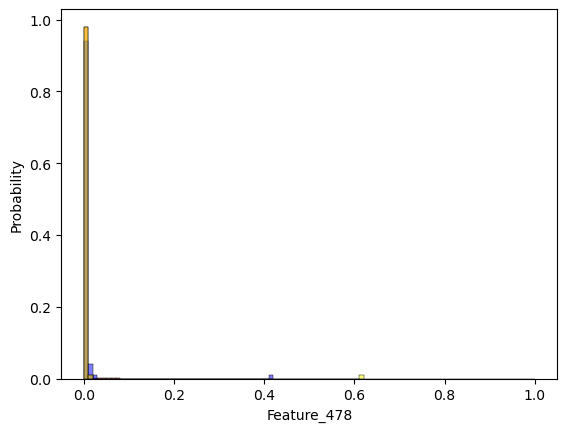

Feature_481
0.2269388177993736 0.8531475268106359 0.573496473890742 0.0005097427162023271


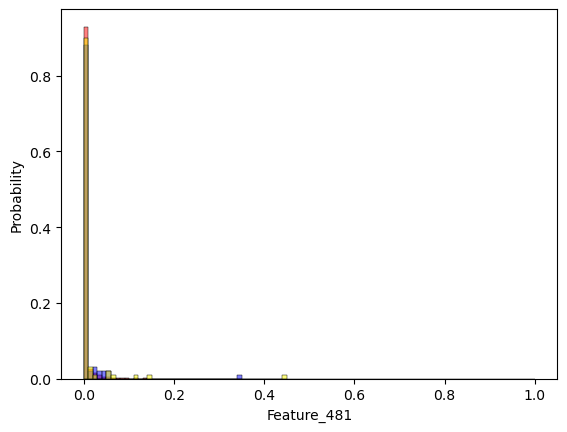

Feature_482
0.8585584739039335 0.2447601828197219 0.12238009140986095 0.009091152356580798


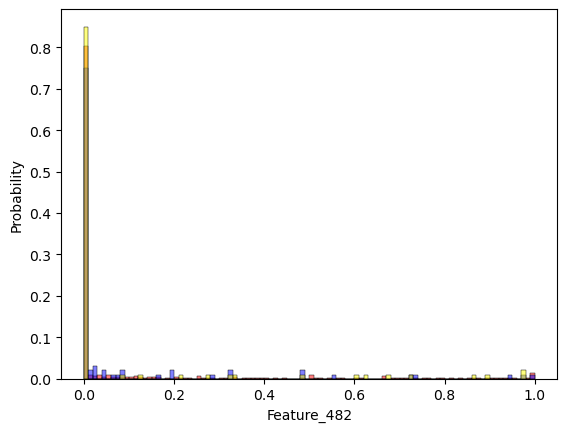

Feature_484
0.9108771458719181 0.9034808791845603 0.45174043959228016 6.148511883270844e-05


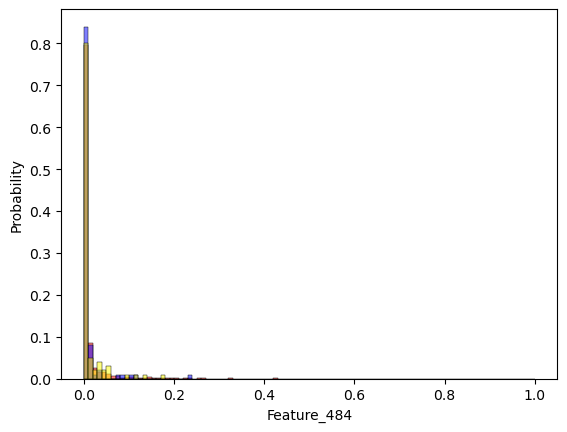

Feature_485
0.17512786491787072 0.14730706186556305 0.9263709262657198 0.015910101379298006


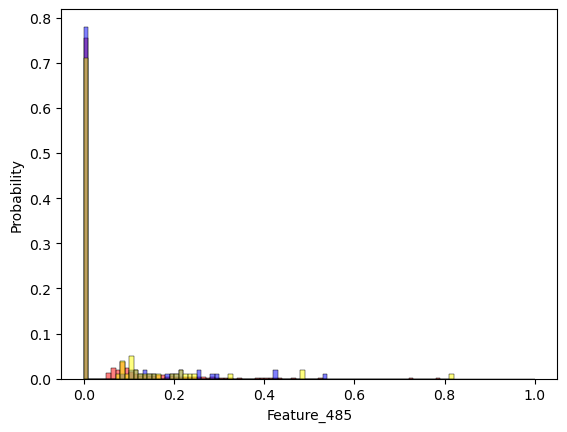

Feature_486
0.0325452303016687 0.07206576182607712 0.963977609067682 0.04075975264584261


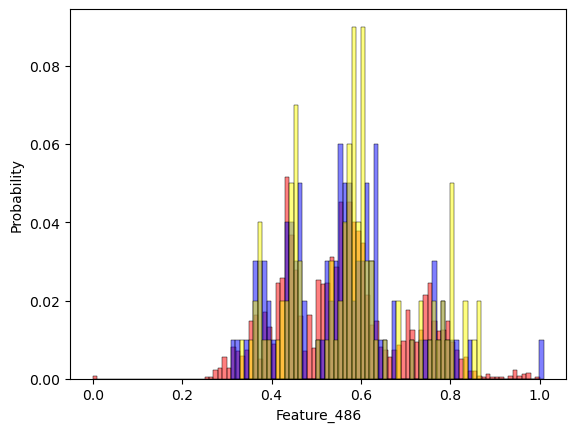

Feature_489
0.0009116323446619059 0.0022397394033437925 0.998880625426171 0.07567759947439236


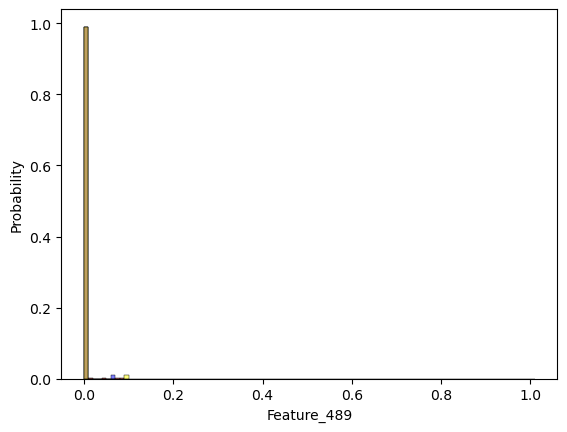

Feature_490
0.0004996396657840831 0.08645329439684918 0.9567895530697256 0.003555696953586547


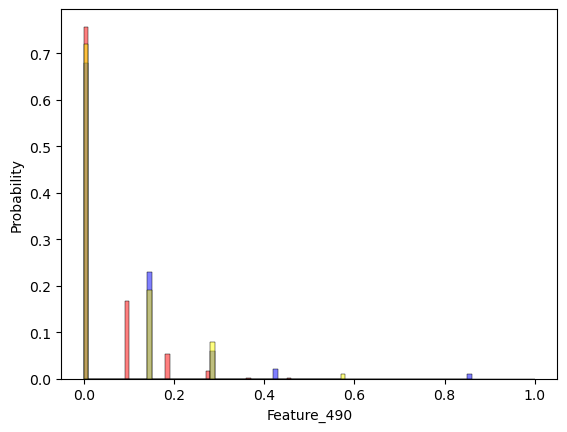

Feature_492
1.462198830319032e-17 3.3854853431867403e-15 0.9999999999999983 0


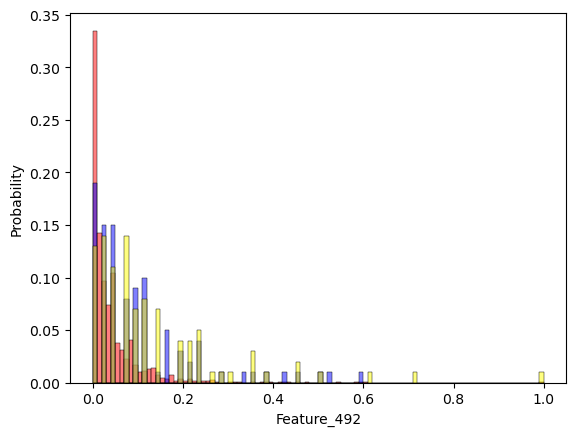

Feature_493
0.9999085348081552 0.824578011901548 0.412289005950774 0.0014425321103866372


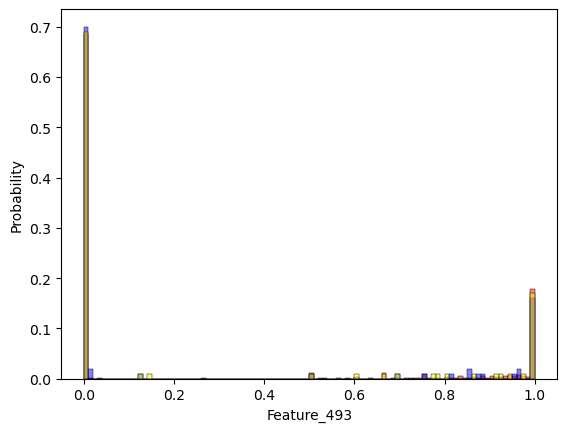

Feature_496
0.09417589703722483 0.27234692052738885 0.13617346026369442 0.08634705505288717


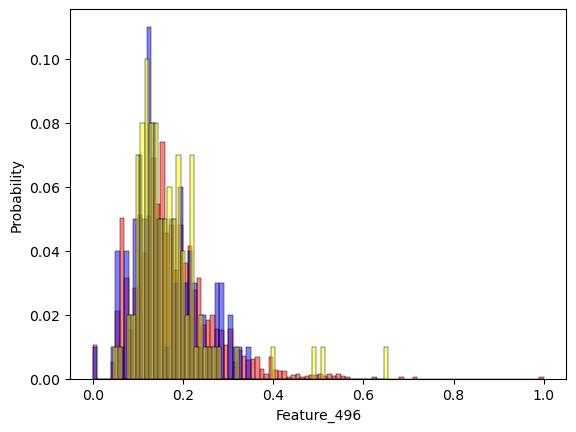

Feature_498
0.20667237275933334 0.11637365349204454 0.05818682674602227 0.033962605739734544


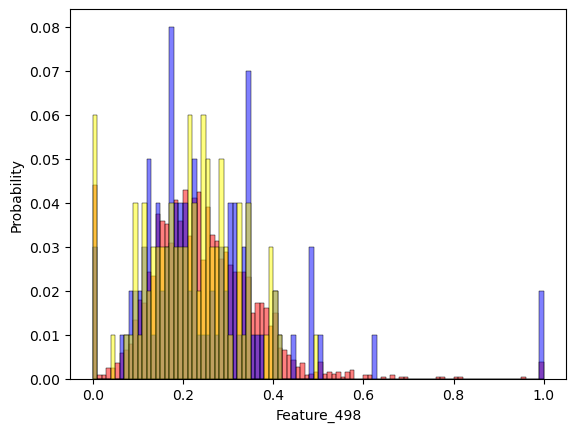

Feature_499
0.3453903535922312 0.691928435117481 0.3459642175587405 0.0307285856906189


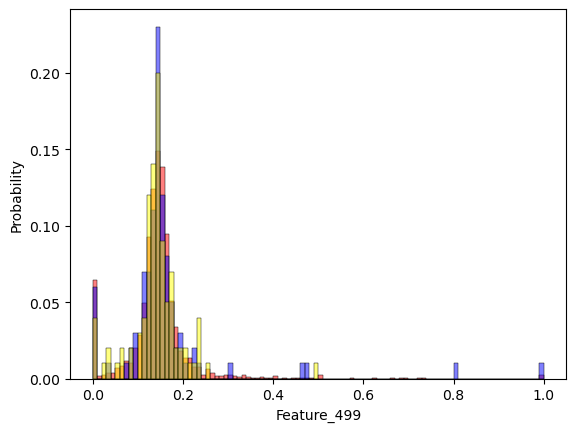

Feature_502
0.5801294806882717 0.07425496961220227 0.9628846278633567 0.012120284855776597


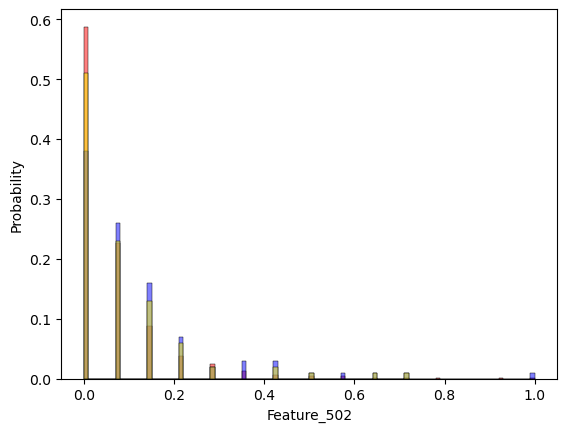

Feature_504
3.5678562235325475e-18 1.6644500894425286e-18 1.0 0.20189186610612986


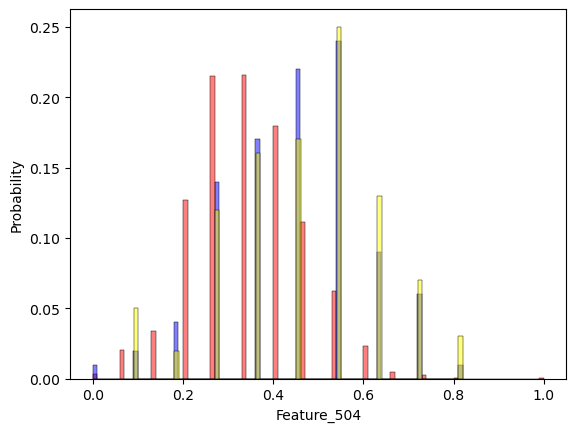

Feature_505
0.18213876615622202 0.19724817400622985 0.9013989480915686 0.018823717882728852


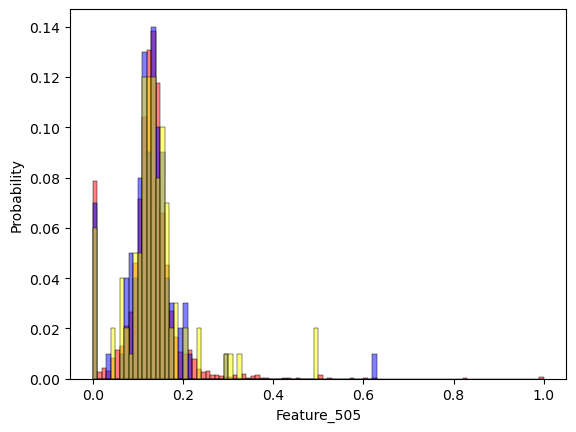

Feature_508
0.42329932771977236 0.9746597016595648 0.5127341181401212 0.012718746377104746


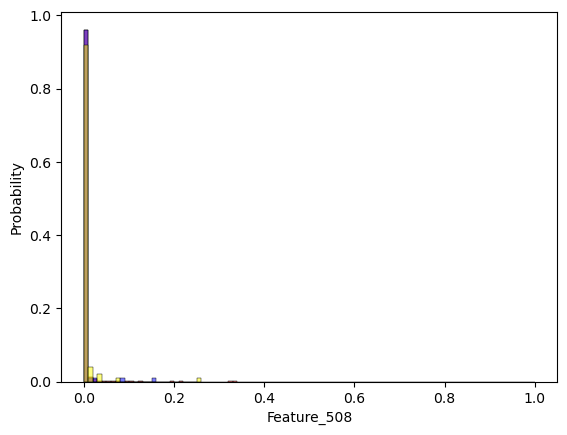

Feature_515
0.10835577051395538 0.12003371483918347 0.060016857419591736 0.030367373338911763


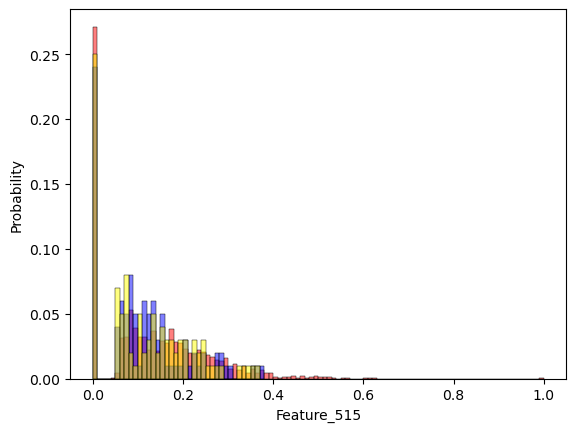

Feature_516
0.0008105645254545074 0.27761167445427026 0.13880583722713513 0.18380340110024954


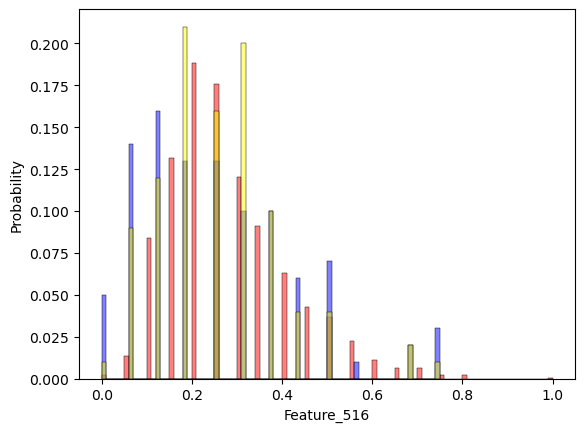

Feature_518
0.6255067984031297 0.2691607811024552 0.8654483921660082 0.01831623071488009


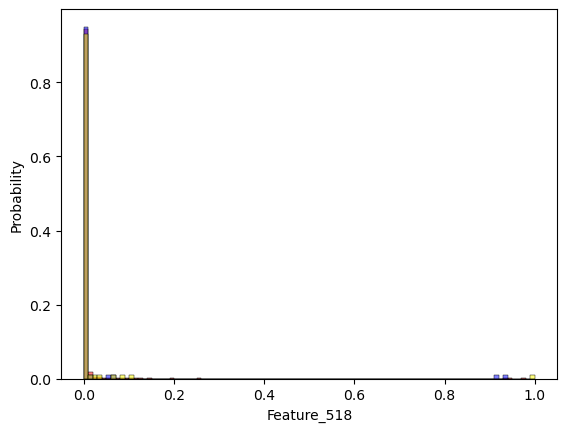

Feature_520
0.7260140808434241 0.400228299493812 0.7999303147358042 0.013831095787465456


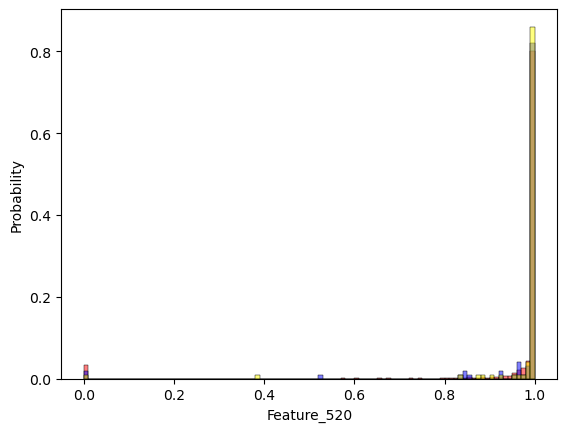

Feature_523
6.465764783511014e-05 1.5161015607137497e-06 0.9999992424517594 0.10299607827533017


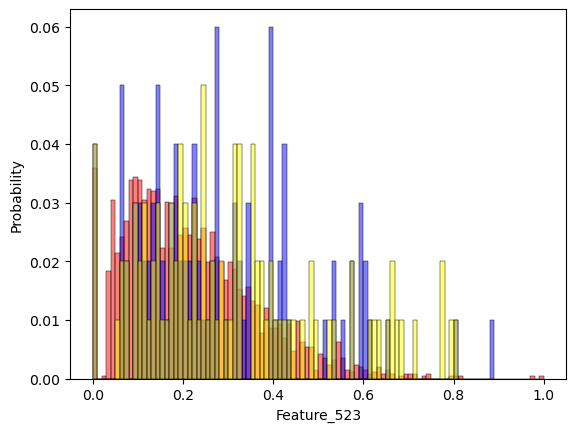

Feature_528
0.1575690133285722 0.996658059108837 0.5017240168012553 0.02522088169493389


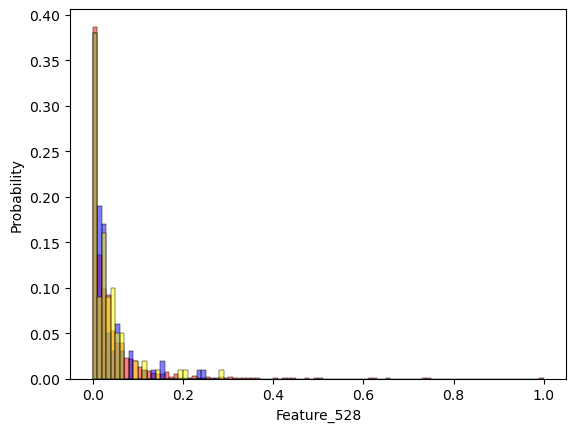

Feature_529
1.8895705462316484e-07 0.004963403280566717 0.0024817016402833587 0.20271316083940275


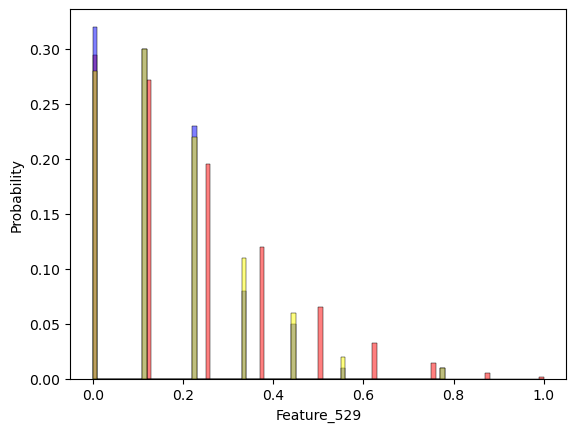

Feature_530
8.151896895720567e-10 0.0002471802070471687 0.9998764754646611 0.023497642110353448


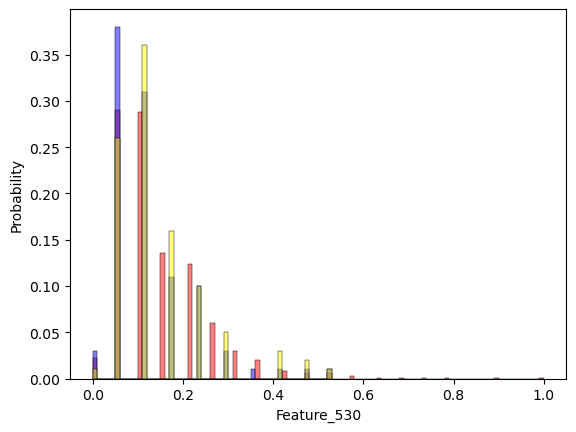

Feature_532
2.1466095372212236e-08 1.7027273328080074e-05 0.9999914914615436 0


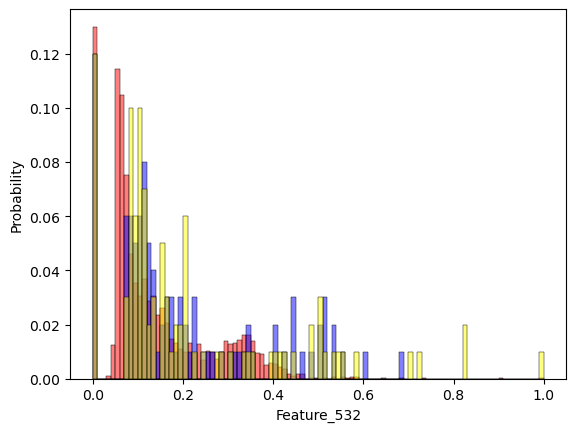

Feature_534
0.17934095710638148 0.08318769566458716 0.958417943243887 0.03697887312860683


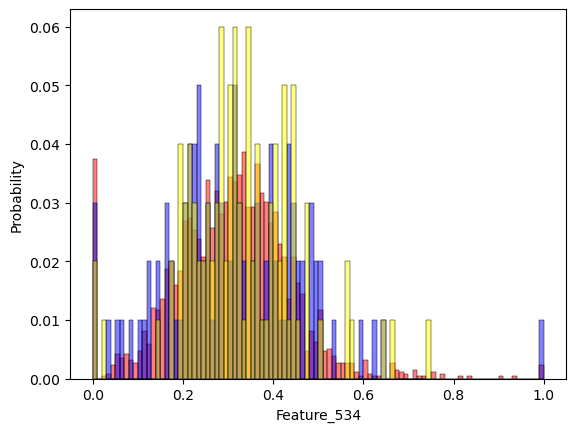

Feature_540
0.20851388537123494 0.9809174154628792 0.4904587077314396 0.006957285038500079


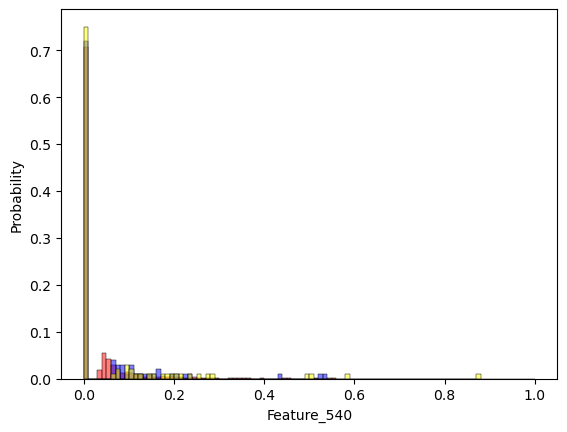

Feature_545
0.9999999598817745 0.9741942329722661 0.5129688597233991 2.719292335618263e-07


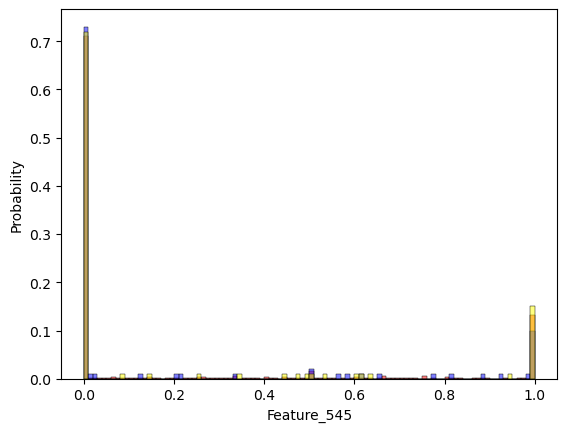

In [30]:
p_value_ks = []
count = 1
p1 = []
p2 = []
p3 = []
p4 = []
for i in df_train_procesing_3.columns:
    print(i)
    ks_statistic, p_value = stats.ks_2samp(df_train_procesing_3[i], df_val1_processing_3[i])
    ks_statistic, p_value2 = stats.mannwhitneyu(df_train_procesing_3[i], df_val1_processing_3[i],  alternative='two-sided')
    ks_statistic, p_value4 = stats.mannwhitneyu(df_train_procesing_3[i], df_val1_processing_3[i],  alternative='greater')
    try:
        discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')
        # Ajustar el discretizador solo con los datos de entrenamiento
        discretizer.fit(np.array(df_train_procesing_3[i]).reshape(-1, 1))
        # Transformar los datos de entrenamiento
        X_train_discretized = discretizer.transform(np.array(df_train_procesing_3[i]).reshape(-1, 1))

        # Transformar los datos de prueba con los mismos bordes de bins
        X_test_discretized = discretizer.transform(np.array(df_val1_processing_3[i]).reshape(-1,1))
        conteos = np.unique(X_train_discretized.reshape(1,-1)[0], return_counts=True)[1]
        conteos_val = np.unique(X_test_discretized.reshape(1,-1)[0], return_counts=True)[1]
        contingency_table = np.concatenate((conteos.reshape(-1,1), conteos_val.reshape(-1,1)), axis=1)
        p_value3 = stats.entropy(conteos/sum(conteos), conteos_val/sum(conteos_val))
    except:
        p_value3 = 0

    p1.append(p_value)
    p2.append(p_value2)
    p3.append(p_value3)
    p4.append(p_value4)
    print(p_value, p_value2, p_value4, p_value3)
    sns.histplot(df_train_procesing_3[i], color="red", stat='probability', binwidth=.01, alpha=0.5)
    sns.histplot(df_val_processing_3[i],color="blue", stat='probability', binwidth=.01, alpha=0.5)
    sns.histplot(df_val1_processing_3[i], color="yellow", stat='probability', binwidth=.01, alpha=0.5)
    count += 1
    plt.show()

In [31]:
df_pvalues = pd.DataFrame({"feature":df_train_procesing_3.columns,
                           "p1":p1,
                          "p2":p2,
                          "p3":p3,
                          "p4":p4})

In [92]:
inconsistencia_drop_column = df_pvalues[np.sum(df_pvalues.select_dtypes("float")<0.0001, axis=1)==3]

In [97]:
inconsistencia_drop_column["feature"].values

array(['Feature_11', 'Feature_71', 'Feature_88', 'Feature_90',
       'Feature_143', 'Feature_156', 'Feature_176', 'Feature_194',
       'Feature_200', 'Feature_216', 'Feature_237', 'Feature_268',
       'Feature_273', 'Feature_319', 'Feature_339', 'Feature_386',
       'Feature_391', 'Feature_402', 'Feature_407', 'Feature_410',
       'Feature_417', 'Feature_421', 'Feature_422', 'Feature_427',
       'Feature_431', 'Feature_441', 'Feature_471', 'Feature_477',
       'Feature_492', 'Feature_532'], dtype=object)

Feature_11
1.7529675443661212e-10 2.5569613070838675e-08 0.9999999872250658 0


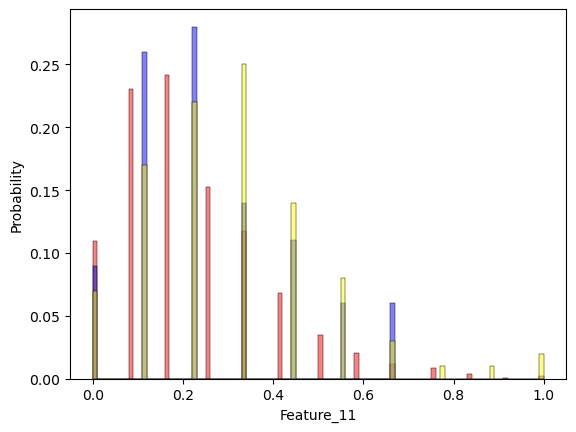

Feature_71
1.2299632538019297e-56 6.877641137260707e-41 3.4388205686303536e-41 1.2464292962520696


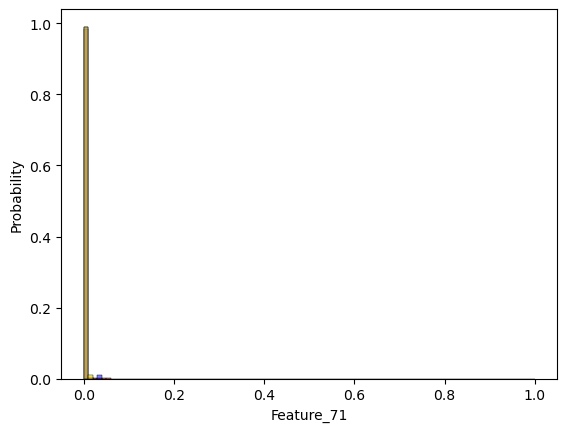

Feature_88
4.260813211320323e-31 3.1810185911100736e-22 1.5905092955550368e-22 0.9261724729118195


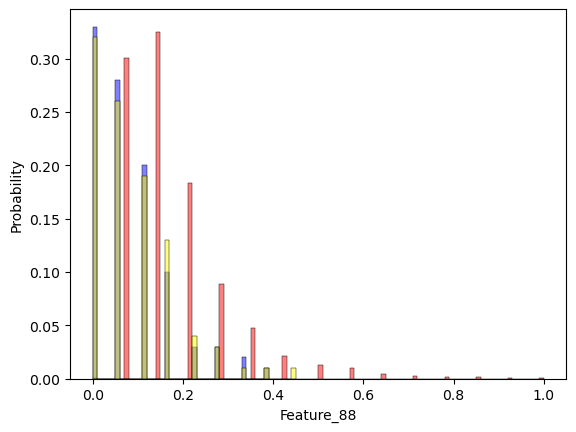

Feature_90
1.6117244377451672e-77 1.9150275621334882e-41 9.575137810667441e-42 2.46624312063994


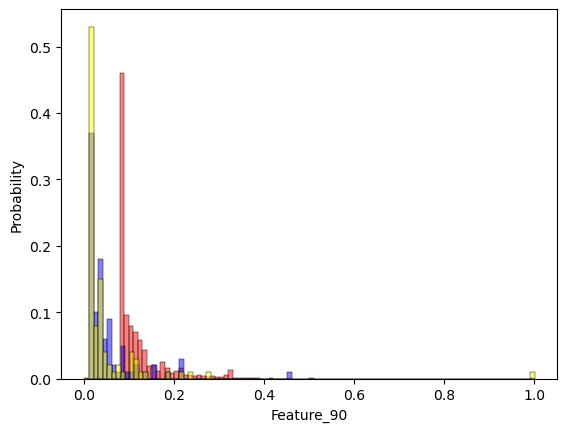

Feature_143
9.259531939843588e-159 6.319945685735386e-69 1.0 0


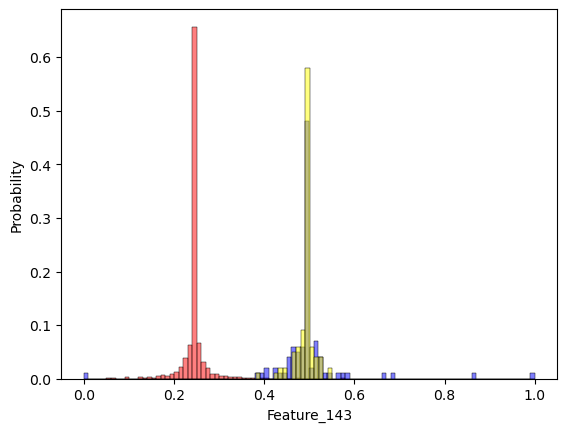

Feature_156
1.122739267004003e-25 6.074956984627237e-18 3.0374784923136185e-18 0.8276694648658298


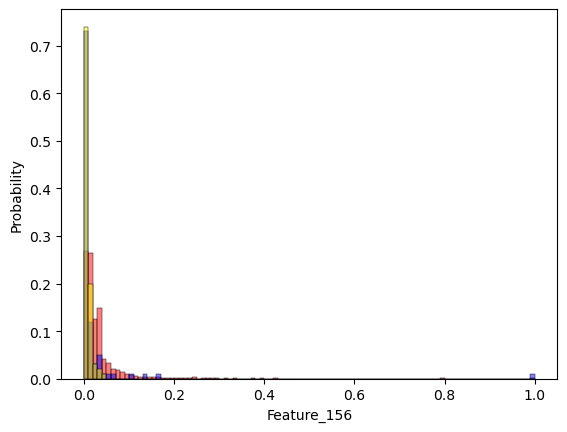

Feature_176
1.6037510779068769e-25 2.2740568860293827e-07 1.1370284430146914e-07 1.242124385979753


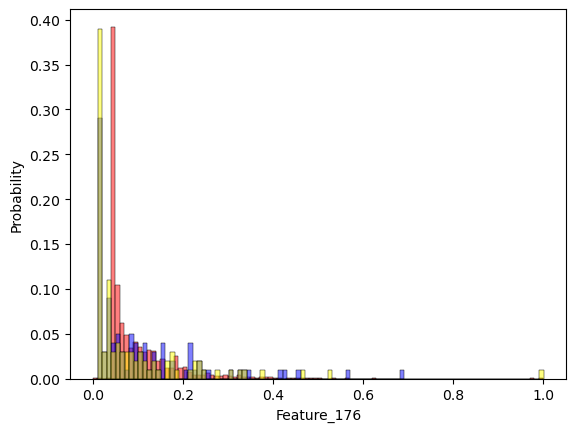

Feature_194
6.619379355769189e-48 2.9314322673898616e-32 1.0 0


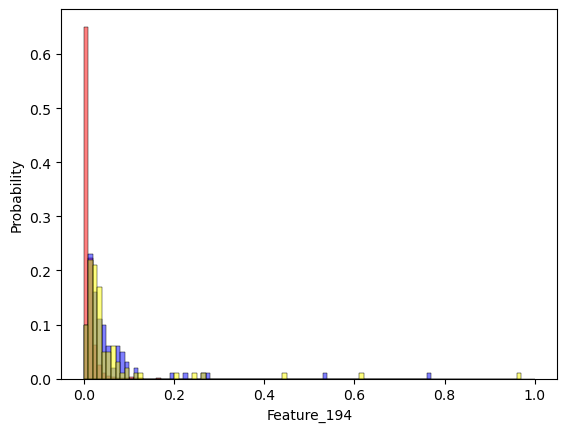

Feature_200
1.0980444839526009e-30 3.064249916162825e-23 1.5321249580814126e-23 1.0728813858120985


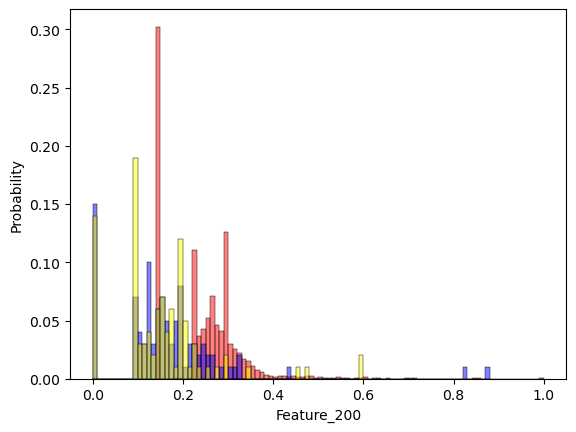

Feature_216
4.1054600344649787e-13 6.366048656406888e-11 3.183024328203444e-11 0.4315420573435901


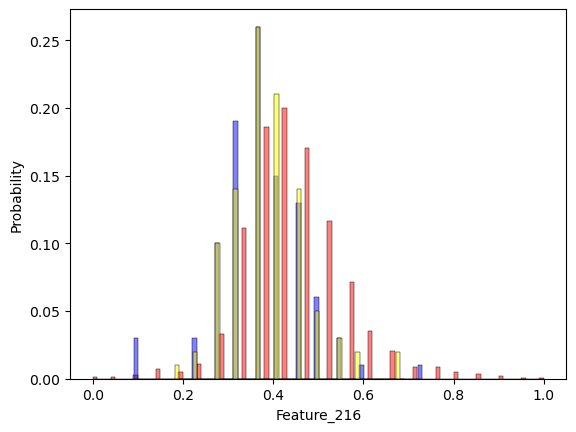

Feature_237
2.2436558161928687e-157 3.892840871551924e-68 1.0 0


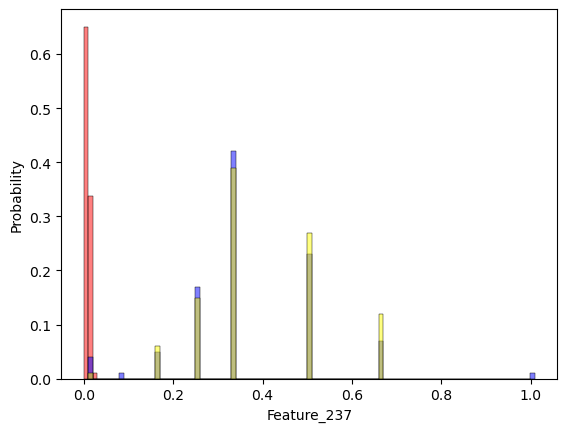

Feature_268
4.758719103639418e-132 1.1390725249583507e-61 1.0 0


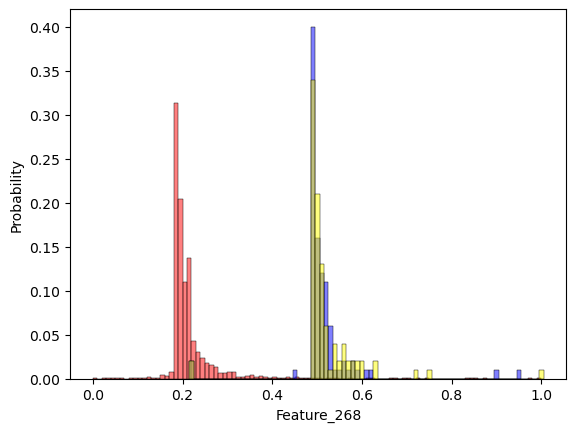

Feature_273
1.0148165656880514e-09 3.8417266417980934e-09 1.9208633208990467e-09 0.22435222178816452


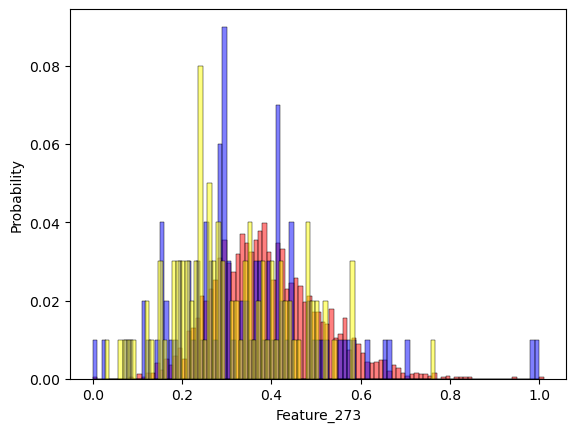

Feature_319
3.082780731719472e-51 6.5995641598250396e-34 1.0 0


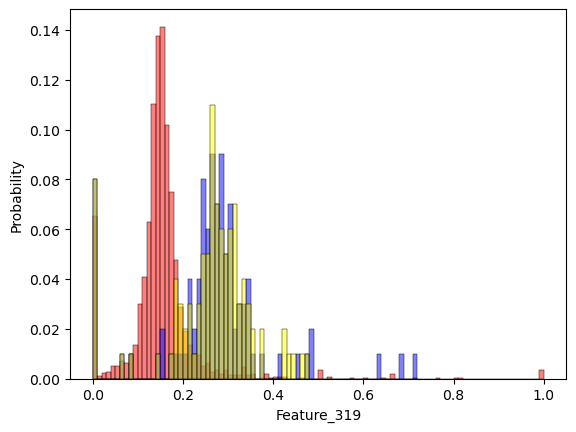

Feature_339
1.653753346874175e-66 3.459892011493885e-50 1.7299460057469426e-50 1.7686152826942843


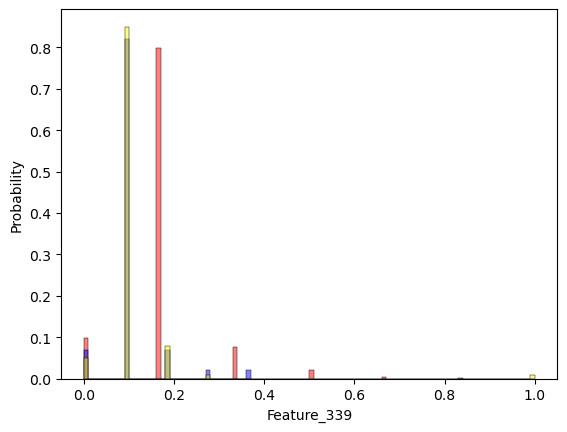

Feature_386
7.807995561931432e-36 2.2658065962263683e-20 1.0 0


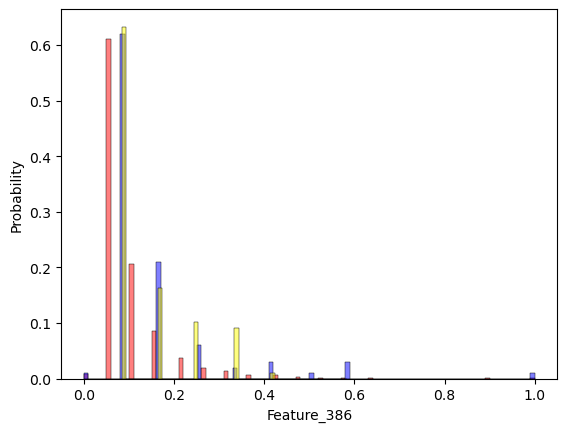

Feature_391
1.0279714322769371e-21 5.001583188326684e-08 2.500791594163342e-08 0.8850857159192317


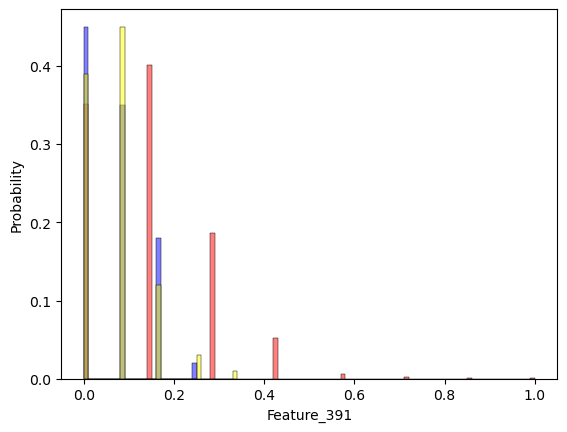

Feature_402
1.6368669576913757e-177 6.702329956153817e-77 1.0 0


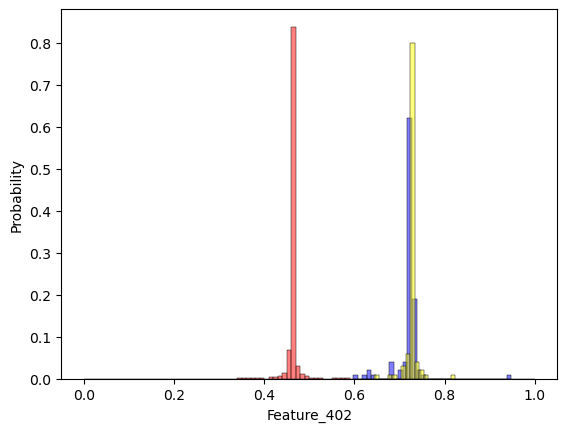

Feature_407
2.7101924013429105e-60 6.337064570536029e-42 1.0 0


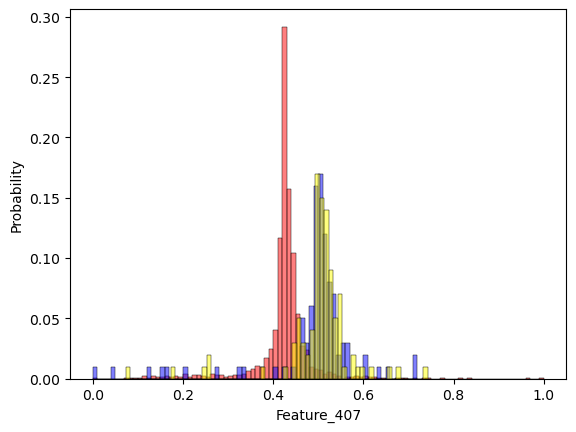

Feature_410
1.2499264335278601e-11 5.120770620888373e-12 2.5603853104441867e-12 0.24128906700785768


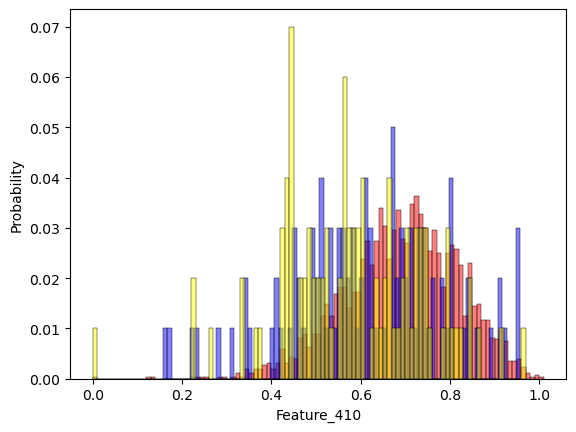

Feature_417
1.3510345484026722e-54 9.283176573041556e-39 1.0 0


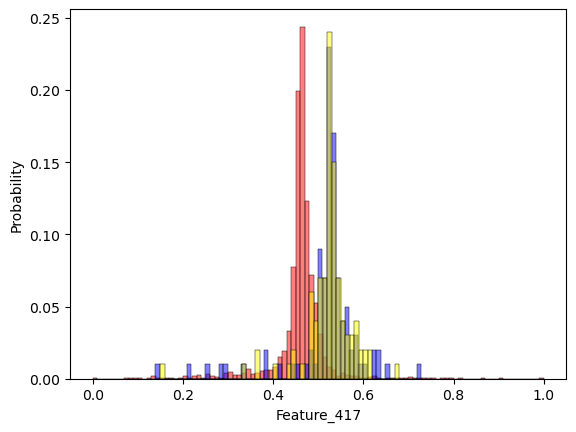

Feature_421
2.48532712828606e-128 6.6410605899893295e-75 1.0 0


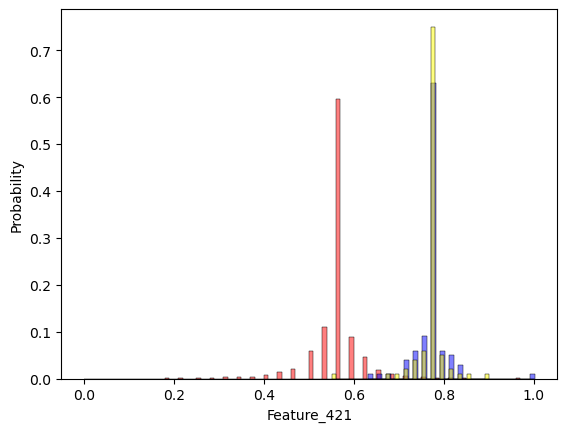

Feature_422
5.704351672778902e-139 3.088771439842235e-62 1.0 0


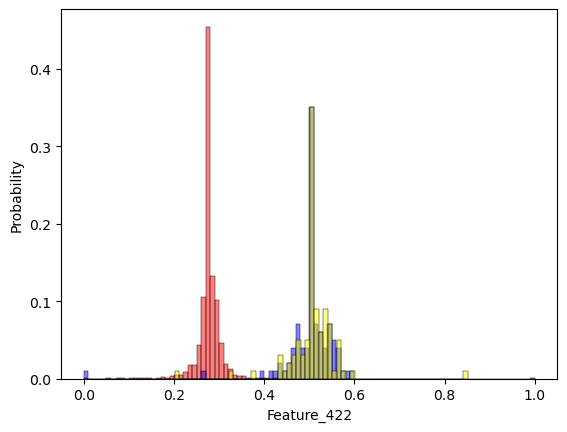

Feature_427
1.048813067604499e-161 2.372908051404893e-163 1.0 0


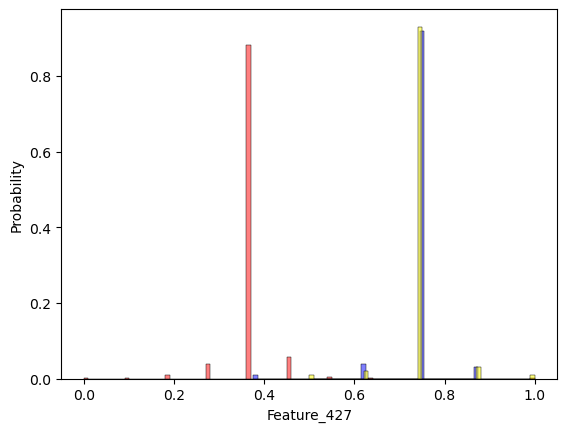

Feature_431
5.105484189921535e-142 8.428686835016615e-64 1.0 0


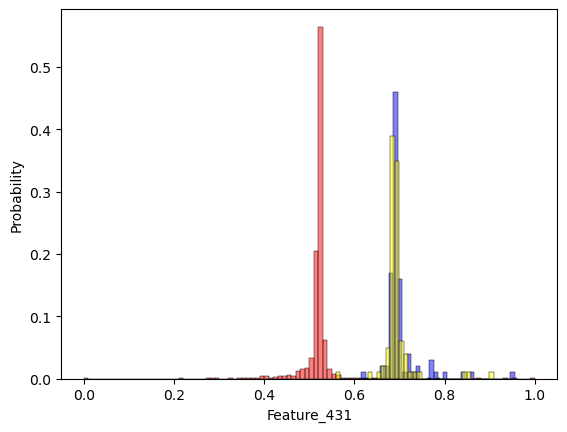

Feature_441
1.7054527056696366e-18 6.016681303881228e-08 0.9999999699400954 0


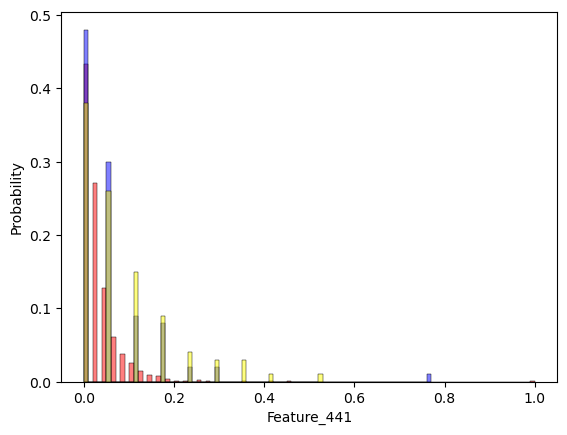

Feature_471
6.52546725026445e-23 3.739442517757209e-14 0.9999999999999813 0


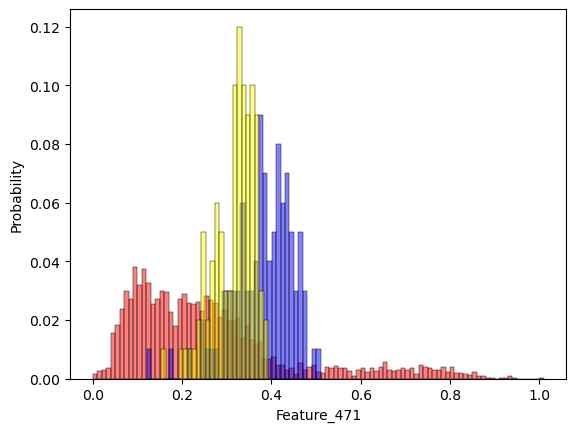

Feature_477
4.963766845293687e-40 6.39955742345287e-36 1.0 0


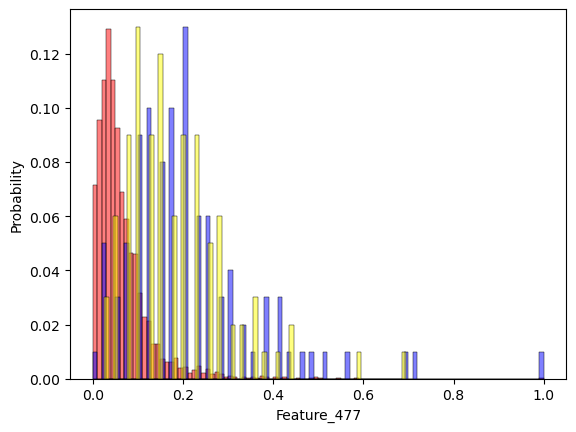

Feature_492
1.462198830319032e-17 3.3854853431867403e-15 0.9999999999999983 0


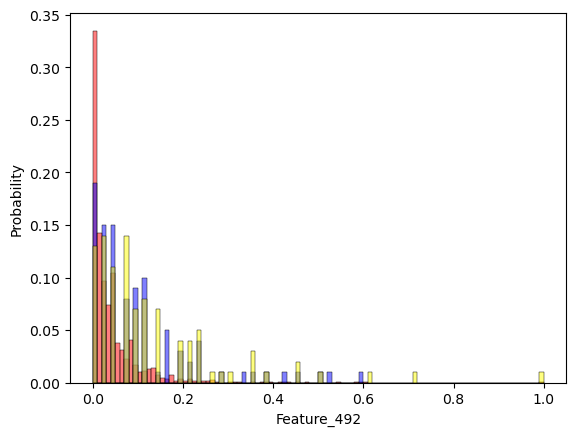

Feature_532
2.1466095372212236e-08 1.7027273328080074e-05 0.9999914914615436 0


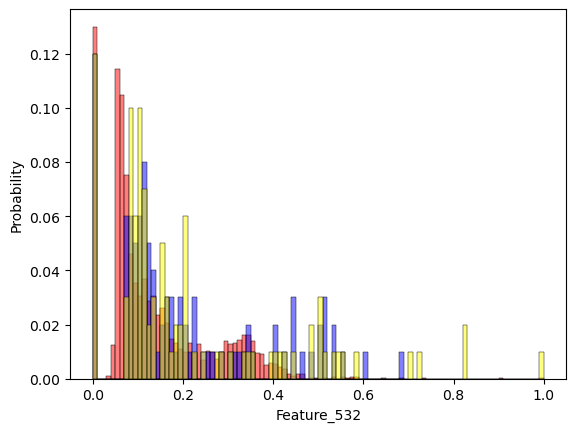

In [94]:
for i in df_pvalues[np.sum(df_pvalues.select_dtypes("float")<0.0001, axis=1)==3].feature:
    print(i)
    ks_statistic, p_value = stats.ks_2samp(df_train_procesing_3[i], df_val1_processing_3[i])
    ks_statistic, p_value2 = stats.mannwhitneyu(df_train_procesing_3[i], df_val1_processing_3[i],  alternative='two-sided')
    ks_statistic, p_value4 = stats.mannwhitneyu(df_train_procesing_3[i], df_val1_processing_3[i],  alternative='greater')
    try:
        discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')
        # Ajustar el discretizador solo con los datos de entrenamiento
        discretizer.fit(np.array(df_train_procesing_3[i]).reshape(-1, 1))
        # Transformar los datos de entrenamiento
        X_train_discretized = discretizer.transform(np.array(df_train_procesing_3[i]).reshape(-1, 1))

        # Transformar los datos de prueba con los mismos bordes de bins
        X_test_discretized = discretizer.transform(np.array(df_val1_processing_3[i]).reshape(-1,1))
        conteos = np.unique(X_train_discretized.reshape(1,-1)[0], return_counts=True)[1]
        conteos_val = np.unique(X_test_discretized.reshape(1,-1)[0], return_counts=True)[1]
        contingency_table = np.concatenate((conteos.reshape(-1,1), conteos_val.reshape(-1,1)), axis=1)
        p_value3 = stats.entropy(conteos/sum(conteos), conteos_val/sum(conteos_val))
    except:
        p_value3 = 0

    p1.append(p_value)
    p2.append(p_value2)
    p3.append(p_value3)
    p4.append(p_value4)
    print(p_value, p_value2, p_value4, p_value3)
    sns.histplot(df_train_procesing_3[i], color="red", stat='probability', binwidth=.01, alpha=0.5)
    sns.histplot(df_val_processing_3[i],color="blue", stat='probability', binwidth=.01, alpha=0.5)
    sns.histplot(df_val1_processing_3[i], color="yellow", stat='probability', binwidth=.01, alpha=0.5)
    count += 1
    plt.show()

In [34]:
df_train_procesing_4 = df_train_procesing_3.drop(columns=inconsistencia_drop_column.feature)
df_val_processing_4 = df_val_processing_3.drop(columns=inconsistencia_drop_column.feature)
df_val1_processing_4 = df_val1_processing_3.drop(columns=inconsistencia_drop_column.feature)


In [69]:
df_train_procesing_3.shape

(2563, 231)

In [67]:
df_val1_processing_4.shape

(100, 221)

In [70]:
X_train = np.concatenate((np.array(df_train_procesing_4), X_new_value), axis=1)
X_val = np.concatenate((np.array(df_val_processing_4), X_new_value_val), axis=1)
X_val2 = np.concatenate((np.array(df_val1_processing_4), X_new_value_val1), axis=1)

y_train = y.copy()

In [71]:
# Muestreo
#oversample = SMOTE(sampling_strategy=0.4)

#X_train_pre, y_train_pre = oversample.fit_resample(X_train, y_train)
X_train_pre, y_train_pre = X_train.copy(), y_train.copy()

In [72]:
from imblearn.pipeline import Pipeline


In [73]:
# Define la función objetivo para la optimización de hiperparámetros
def objective(trial):
    # Define los hiperparámetros que se optimizarán
    param = {
        "multi_class": 'ovr',
        "verbose": 0,
        "penalty": trial.suggest_categorical("penalty", ['l1', 'l2']),
        "C": trial.suggest_float("C", 1e-8, 1.0, log=True),
        "solver": trial.suggest_categorical("solver", ['lbfgs', 'liblinear', 'saga']),
        "max_iter": trial.suggest_categorical("max_iter", [100, 1000, 2500, 5000])
    }
    
    # Crea un modelo de regresión logística con los hiperparámetros definidos
    lr_model = LogisticRegression(**param)
    steps = [('over', SMOTE(sampling_strategy='minority', random_state=42)), ('model', lr_model)]

    # steps = [('over', SMOTE(sampling_strategy=0.3)), ('model', lr_model)]
    # steps = [('model', lr_model)]
    pipeline = Pipeline(steps=steps)
    # Realiza validación cruzada para evaluar el modelo
    score = cross_val_score(
    pipeline,
    X_train_pre,
    y_train_pre,
    scoring=make_scorer(brier_score_loss, needs_proba=True),
    cv=StratifiedKFold(n_splits=3, shuffle=True, random_state=42),
    )
    
    return np.mean(score)



In [74]:
# Crea un objeto de estudio de Optuna para la optimización
study = optuna.create_study(direction="minimize")

# Realiza la optimización de hiperparámetros con un número limitado de iteraciones y tiempo máximo
study.optimize(objective, n_trials=100,
    timeout=600,
    show_progress_bar=True)

# Imprime información sobre los resultados de la optimización
print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: {}".format(trial.value))
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2023-12-16 21:54:20,852] A new study created in memory with name: no-name-1894bcb9-76ff-4dfd-934f-ac17f7c6a70b


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2023-12-16 21:54:21,386] Trial 0 finished with value: 0.24087706270530385 and parameters: {'penalty': 'l2', 'C': 0.0014232146028640997, 'solver': 'saga', 'max_iter': 2500}. Best is trial 0 with value: 0.24087706270530385.
[I 2023-12-16 21:54:21,738] Trial 1 finished with value: 0.19615782660537914 and parameters: {'penalty': 'l2', 'C': 0.3988414140020492, 'solver': 'liblinear', 'max_iter': 2500}. Best is trial 1 with value: 0.19615782660537914.
[I 2023-12-16 21:54:22,088] Trial 2 finished with value: 0.19684160127012787 and parameters: {'penalty': 'l2', 'C': 0.3466087203640083, 'solver': 'lbfgs', 'max_iter': 2500}. Best is trial 1 with value: 0.19615782660537914.
[I 2023-12-16 21:54:22,174] Trial 3 finished with value: 0.24999977667333004 and parameters: {'penalty': 'l2', 'C': 3.0719816419507383e-06, 'solver': 'liblinear', 'max_iter': 100}. Best is trial 1 with value: 0.19615782660537914.
[W 2023-12-16 21:54:22,215] Trial 4 failed with parameters: {'penalty': 'l1', 'C': 4.4922679615

KeyboardInterrupt: 

In [43]:
trial.params

{'penalty': 'l2',
 'C': 0.5920908200909871,
 'solver': 'liblinear',
 'max_iter': 5000}

In [44]:
# Crea un modelo de regresión logística con los hiperparámetros definidos
trial.params["multi_class"] = 'ovr'
trial.params["verbose"] = 0

lr_model = LogisticRegression(**trial.params)
steps = [('over', SMOTE(sampling_strategy='minority', random_state=42)), ('model', lr_model)]
pipeline = Pipeline(steps=steps)

# Realiza validación cruzada para evaluar el modelo
score = cross_val_score(
    pipeline,
    X_train,
    y_train,
    scoring=make_scorer(brier_score_loss, needs_proba=True),
    cv=StratifiedKFold(n_splits=3, shuffle=True, random_state=42),
    )

In [46]:
lr_model.fit(X_train, y_train)


LogisticRegression(C=0.5920908200909871, max_iter=5000, multi_class='ovr',
                   solver='liblinear')

In [49]:
    scoring=make_scorer(brier_score_loss, needs_proba=True),


In [52]:
scoring.count(X_train, y_train)

TypeError: tuple.count() takes exactly one argument (2 given)

In [48]:
lr_model.score(X_train, y_train)

0.8966055403823644

In [45]:
np.mean(score)

0.19599817030051322

In [243]:
importancia = pd.DataFrame({"importances":lr_model.coef_[0]}).reset_index()
top_50_lr = importancia.sort_values(by="importances", ascending=False).head(50)

In [33]:
y_prediction = lr_model.predict_proba(X_val)
y_pred_sumission = [c[1] for c in y_prediction]

In [34]:
y_pred_sumission

[0.25700627224207007,
 0.07498354335524307,
 0.09293433564471872,
 0.06532903039665557,
 0.014657232502272615,
 0.09730760425135314,
 0.34806741849079514,
 0.08980022395553745,
 0.05593208902103061,
 0.09094884599577485,
 0.05949731856802288,
 0.16937770599991286,
 0.09333580119408769,
 0.21318775231931658,
 0.09588828101951449,
 0.06475229153061582,
 0.07624433771121222,
 0.0476859277893225,
 0.0940607027850672,
 0.12382334417027999,
 0.030289409855680714,
 0.10309125920011976,
 0.0110855412619164,
 0.1873316179515002,
 0.19205031639662942,
 0.028054003238105737,
 0.26587708284574196,
 0.2701495798706813,
 0.03537191783514874,
 0.04231164042421926,
 0.07552326028609588,
 0.02858780125735343,
 0.08182948980621742,
 0.07697053176081575,
 0.15433074516393672,
 0.14617661774211899,
 0.058705024139486674,
 0.3322301168699824,
 0.03162868024039627,
 0.09328961956766613,
 0.06692896972737111,
 0.04398315077233663,
 0.04887424992169852,
 0.05395986657089794,
 0.07092796406468142,
 0.008527719

In [35]:
submission3 = pd.DataFrame({'prediction': y_pred_sumission})
submission3.to_csv('../data/interim/submission3.csv', index=False)


### Xgboost

In [75]:
# Define la función objetivo para la optimización de hiperparámetros
def objective(trial):
    # Define los hiperparámetros que se optimizarán
    param = {
        "verbose": 1,
        "seed":19970808,
        "objective":"binary:logistic",
        "learning_rate":trial.suggest_float("lambda", 1e-8, 1.0, log=True),
        "n_estimators": trial.suggest_categorical("n_estimators", [5,20,50,100]),
        "max_depth": trial.suggest_int("max_depth", 1, 10),
        "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True),
        "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True),
        "subsample": trial.suggest_float("subsample", 0.2, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.2, 1.0)
    }
    
    # Crea un modelo de regresión logística con los hiperparámetros definidos
    xgb_model = XGBClassifier(**param)
    steps = [('over', SMOTE(sampling_strategy='minority', random_state=42)), ('model', xgb_model)]
    pipeline = Pipeline(steps=steps)
    # Realiza validación cruzada para evaluar el modelo
    score = cross_val_score(
    pipeline,
    X_train_pre,
    y_train_pre,
    scoring=make_scorer(brier_score_loss, needs_proba=True),
    cv=StratifiedKFold(n_splits=3, shuffle=True, random_state=42),
    )
    
    return np.max(score)



In [77]:
# Crea un objeto de estudio de Optuna para la optimización
study = optuna.create_study(direction="minimize")

# Realiza la optimización de hiperparámetros con un número limitado de iteraciones y tiempo máximo
study.optimize(objective, n_trials=100,
    timeout=600,
    show_progress_bar=True)

# Imprime información sobre los resultados de la optimización
print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: {}".format(trial.value))
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2023-12-16 21:54:52,407] A new study created in memory with name: no-name-2bc0a385-8347-491b-846e-fc430074de85


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2023-12-16 21:54:53,523] Trial 0 finished with value: 0.2499852688425633 and parameters: {'lambda': 3.6796381522057644e-06, 'n_estimators': 20, 'max_depth': 9, 'alpha': 0.00012205908292015274, 'subsample': 0.3640327295326604, 'colsample_bytree': 0.42649745410254747}. Best is trial 0 with value: 0.2499852688425633.
[I 2023-12-16 21:54:55,206] Trial 1 finished with value: 0.23539615213770787 and parameters: {'lambda': 0.0014882447879223997, 'n_estimators': 50, 'max_depth': 8, 'alpha': 0.8265167825495798, 'subsample': 0.708771923313188, 'colsample_bytree': 0.3595040418077889}. Best is trial 1 with value: 0.23539615213770787.
[I 2023-12-16 21:54:55,756] Trial 2 finished with value: 0.24987907576922008 and parameters: {'lambda': 0.00013081719266032926, 'n_estimators': 5, 'max_depth': 9, 'alpha': 0.18642711223321418, 'subsample': 0.3819326996754131, 'colsample_bytree': 0.939570555995872}. Best is trial 1 with value: 0.23539615213770787.
[I 2023-12-16 21:54:56,575] Trial 3 finished with va

[I 2023-12-16 21:55:21,792] Trial 26 finished with value: 0.19766109867648857 and parameters: {'lambda': 0.0072931772157472695, 'n_estimators': 50, 'max_depth': 5, 'alpha': 0.0018468629957414419, 'subsample': 0.7038228489619781, 'colsample_bytree': 0.9297790392029139}. Best is trial 17 with value: 0.10010345780880857.
[I 2023-12-16 21:55:22,513] Trial 27 finished with value: 0.24999999986041074 and parameters: {'lambda': 1.813026891397329e-08, 'n_estimators': 5, 'max_depth': 8, 'alpha': 2.973792436432312e-05, 'subsample': 0.8586560382499813, 'colsample_bytree': 0.5081035952978009}. Best is trial 17 with value: 0.10010345780880857.
[I 2023-12-16 21:55:24,673] Trial 28 finished with value: 0.10113812066657521 and parameters: {'lambda': 0.06894833153146109, 'n_estimators': 100, 'max_depth': 6, 'alpha': 0.0235678928121319, 'subsample': 0.9307015581089179, 'colsample_bytree': 0.7518680475284107}. Best is trial 17 with value: 0.10010345780880857.
[I 2023-12-16 21:55:26,143] Trial 29 finished

[I 2023-12-16 21:56:16,980] Trial 52 finished with value: 0.09871333054051876 and parameters: {'lambda': 0.04493061683329987, 'n_estimators': 100, 'max_depth': 6, 'alpha': 0.016115277548348152, 'subsample': 0.9911095569711977, 'colsample_bytree': 0.8264163620892719}. Best is trial 52 with value: 0.09871333054051876.
[I 2023-12-16 21:56:20,329] Trial 53 finished with value: 0.09990622385022471 and parameters: {'lambda': 0.04880603142696353, 'n_estimators': 100, 'max_depth': 7, 'alpha': 0.03560770329861547, 'subsample': 0.9677999873831735, 'colsample_bytree': 0.7943412115944853}. Best is trial 52 with value: 0.09871333054051876.
[I 2023-12-16 21:56:24,057] Trial 54 finished with value: 0.22662522544903524 and parameters: {'lambda': 0.0010830785310897257, 'n_estimators': 100, 'max_depth': 7, 'alpha': 0.012915921469254693, 'subsample': 0.9943310938662703, 'colsample_bytree': 0.8188887020893483}. Best is trial 52 with value: 0.09871333054051876.
[I 2023-12-16 21:56:27,870] Trial 55 finished

[I 2023-12-16 21:57:35,600] Trial 78 finished with value: 0.10148619465530291 and parameters: {'lambda': 0.026108546408191602, 'n_estimators': 100, 'max_depth': 7, 'alpha': 0.00031077559770307904, 'subsample': 0.8659903129906137, 'colsample_bytree': 0.554849930488081}. Best is trial 52 with value: 0.09871333054051876.
[I 2023-12-16 21:57:38,826] Trial 79 finished with value: 0.12529638255084097 and parameters: {'lambda': 0.013231747039841781, 'n_estimators': 100, 'max_depth': 6, 'alpha': 0.002564602211125487, 'subsample': 0.922258162065963, 'colsample_bytree': 0.6322786081276304}. Best is trial 52 with value: 0.09871333054051876.
[I 2023-12-16 21:57:39,700] Trial 80 finished with value: 0.2299133119301201 and parameters: {'lambda': 0.005369024138613027, 'n_estimators': 20, 'max_depth': 6, 'alpha': 0.014105179524908347, 'subsample': 0.8468624649894936, 'colsample_bytree': 0.6010182795822864}. Best is trial 52 with value: 0.09871333054051876.
[I 2023-12-16 21:57:42,533] Trial 81 finished

In [78]:
trial.params

{'lambda': 0.04140365192934721,
 'n_estimators': 100,
 'max_depth': 7,
 'alpha': 0.005128716215348625,
 'subsample': 0.9152024056696869,
 'colsample_bytree': 0.5870394766368237}

In [79]:
trial.params["seed"] = 19970808
trial.params["verbose"] = 1
trial.params["objective"] = "binary:logistic"
estimator = XGBClassifier(**trial.params)
steps = [('over', SMOTE(sampling_strategy='minority', random_state=42)), ('model', estimator)]
pipeline = Pipeline(steps=steps)
score = cross_val_score(
        pipeline,
        X_train,
        y_train,
        scoring=make_scorer(brier_score_loss, needs_proba=True),
        cv=StratifiedKFold(n_splits=3, shuffle=True, random_state=42),
)

In [80]:
score

array([0.10329201, 0.10573006, 0.10247769])

In [81]:
# estimator = XGBClassifier(**trial.params)
pipeline.fit(X_train, y_train)

Pipeline(steps=[('over', SMOTE(random_state=42, sampling_strategy='minority')),
                ('model',
                 XGBClassifier(alpha=0.005128716215348625, base_score=None,
                               booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=0.5870394766368237, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None,
                               lambda=0.04140365192934721, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=7, m

In [91]:
X_val2

array([[0.09243697, 1.        , 0.83335   , ..., 0.        , 0.        ,
        0.        ],
       [0.1092437 , 0.875     , 0.5       , ..., 0.        , 1.        ,
        0.        ],
       [0.05882353, 1.        , 0.        , ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.15966387, 1.        , 0.        , ..., 0.        , 1.        ,
        0.        ],
       [0.01680672, 0.5       , 0.5       , ..., 0.        , 0.        ,
        0.        ],
       [0.05042017, 1.        , 0.        , ..., 0.        , 1.        ,
        0.        ]])

In [83]:
pipeline.predict_proba(X_val2)

array([[9.56530929e-01, 4.34690751e-02],
       [9.09413755e-01, 9.05862227e-02],
       [9.91074026e-01, 8.92596319e-03],
       [9.06728566e-01, 9.32714120e-02],
       [9.96089518e-01, 3.91047867e-03],
       [9.51656520e-01, 4.83434722e-02],
       [9.90537763e-01, 9.46222059e-03],
       [4.65312719e-01, 5.34687281e-01],
       [8.95709693e-01, 1.04290292e-01],
       [9.74499404e-01, 2.55006123e-02],
       [9.33686018e-01, 6.63139969e-02],
       [9.97550905e-01, 2.44908617e-03],
       [9.02890325e-01, 9.71096456e-02],
       [8.70108485e-01, 1.29891485e-01],
       [9.46993470e-01, 5.30065410e-02],
       [9.13318396e-01, 8.66816044e-02],
       [9.84352231e-01, 1.56477913e-02],
       [9.94762123e-01, 5.23785269e-03],
       [9.20708001e-01, 7.92919919e-02],
       [9.61986303e-01, 3.80137265e-02],
       [9.88699138e-01, 1.13008535e-02],
       [9.09133315e-01, 9.08666924e-02],
       [9.51469302e-01, 4.85307239e-02],
       [9.96262133e-01, 3.73787177e-03],
       [1.462052

In [211]:
importancia = pd.DataFrame({"importances":estimator.feature_importances_}).reset_index()
top_50 = importancia.sort_values(by="importances", ascending=False).head(50)
estimator.feature_importances_.[estimator.feature_importances_.argsort()>100]

XGBClassifier(alpha=0.9660443947233407, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.32970240135872403, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=0.013705725223458023,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=1,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, ...)

In [84]:
y_prediction = estimator.predict_proba(X_val)
y_pred_sumission = [c[1] for c in y_prediction]


<AxesSubplot:ylabel='Count'>

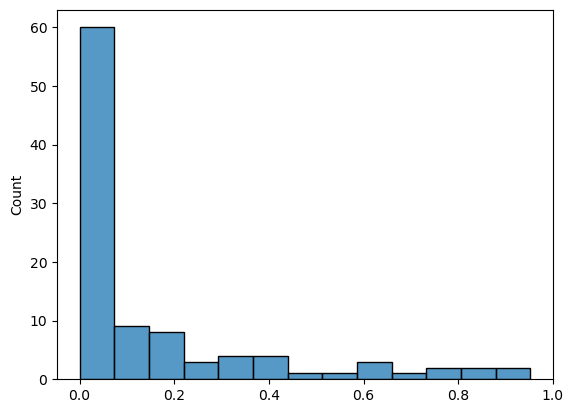

In [87]:
sns.histplot(y_pred_sumission)

In [86]:
submission4 = pd.DataFrame({'prediction': y_pred_sumission})
submission4.to_csv('../data/interim/submission1_3.csv', index=False)


In [90]:
score

array([0.10329201, 0.10573006, 0.10247769])

In [71]:
df_submission = 0
for i in range(1,5):
    df_read = pd.read_csv("../data/interim/submission{0}.csv".format(i))
    df_read.rename(columns={"prediction":"prediction{0}".format(i)}, inplace=True)
    try:
        df_submission = pd.concat([df_read, df_submission], axis=1) 
    except Exception as e:
        print(e)
        df_submission = df_read

cannot concatenate object of type '<class 'int'>'; only Series and DataFrame objs are valid


In [74]:
1-0.0938

0.9062

In [75]:
error_1 = 0.0938
error_2 = 0.10485859650450724
error_3 = 0.09641435
error_4 = 0.099

In [76]:
total = error_1 + error_2 + error_3 + error_4

In [80]:
4-total

3.605927053495493

In [83]:
error_4/(total)

0.2512225233377387

In [82]:
(1-error_4)/(4-total)

0.24986639680539124

In [ ]:
df_submission["prediction1"]

<AxesSubplot:>

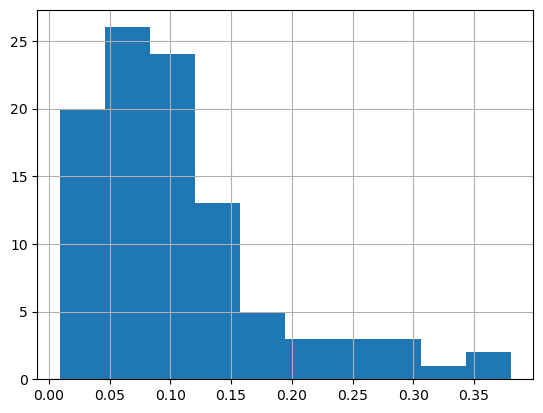

In [87]:
df_submission["prediction1"].hist()

<AxesSubplot:>

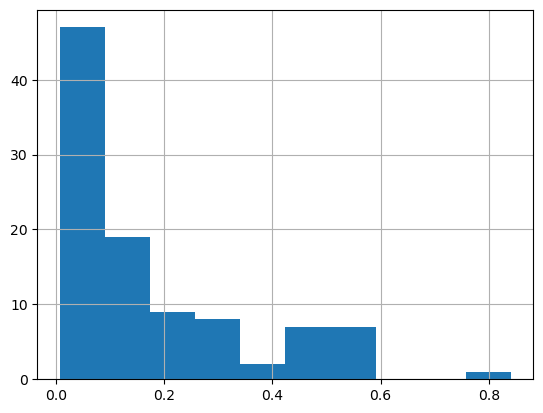

In [88]:
df_submission["prediction2"].hist()

<AxesSubplot:>

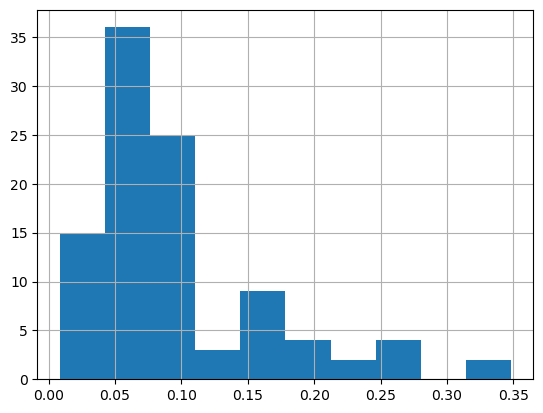

In [89]:
df_submission["prediction3"].hist()

<AxesSubplot:>

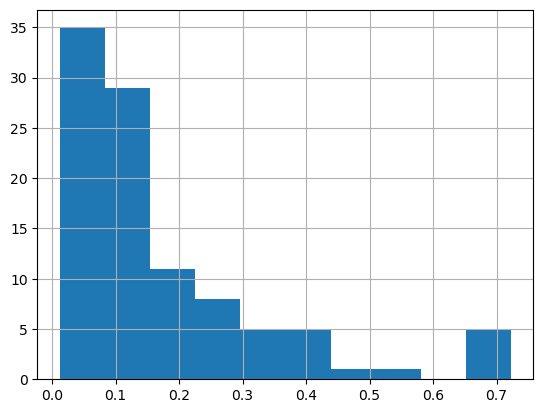

In [90]:
df_submission["prediction4"].hist()

In [281]:
error_1

0.0938

In [73]:
df_submission.to_parquet("../data/external/checkpoint2_data-troopers.parquet")

In [84]:
df_submission["prediction5"] = df_submission.apply(lambda x: np.mean(x[0]*(0.10)+x[1]*(0.20)+x[2]*(0.10)+x[3]*(0.60)), axis=1)

In [86]:
df_submission.to_parquet("../data/external/checkpoint2_data-troopers.parquet")

### XGBOOST

In [ ]:
df_sebas = pd.read_csv("../data/processed/categorized_data.csv")
X_sebas = df_sebas.drop('Target', axis=1)
y_sebas = df_sebas['Target']

In [ ]:
X_sebas = X_sebas.fillna(X_sebas.mean())

In [ ]:
# # Muestreo

oversample = SMOTE(sampling_strategy=0.4)
#X_sebas_pre, y_sebas_pre = oversample.fit_resample(X_sebas, y_sebas)
X_sebas_pre, y_sebas_pre = X_sebas.copy(), y_sebas.copy()

In [ ]:
# Define la función objetivo para la optimización de hiperparámetros
def objective(trial):
    # Define los hiperparámetros que se optimizarán
    param = {
        "multi_class": 'ovr',
        "verbose": 0,
        "penalty": trial.suggest_categorical("penalty", ['l1', 'l2']),
        "C": trial.suggest_float("C", 1e-8, 1.0, log=True),
        "solver": trial.suggest_categorical("solver", ['lbfgs', 'liblinear', 'saga']),
        "max_iter": trial.suggest_categorical("max_iter", [100, 1000, 2500, 5000])
    }
    
    # Crea un modelo de regresión logística con los hiperparámetros definidos
    lr_model = LogisticRegression(**param)
    # steps = [('over', SMOTE(sampling_strategy=0.3)), ('model', lr_model)]
    steps = [('model', lr_model)]
    pipeline = Pipeline(steps=steps)
    # Realiza validación cruzada para evaluar el modelo
    score = cross_val_score(
    pipeline,
    X_sebas_pre,
    y_sebas_pre,
    scoring=make_scorer(brier_score_loss, needs_proba=True),
    cv=StratifiedKFold(n_splits=3, shuffle=True, random_state=42),
    )
    
    return np.mean(score)



In [ ]:
# Crea un objeto de estudio de Optuna para la optimización
study = optuna.create_study(direction="minimize")

# Realiza la optimización de hiperparámetros con un número limitado de iteraciones y tiempo máximo
study.optimize(objective, n_trials=30,
    timeout=600,
    show_progress_bar=True)

# Imprime información sobre los resultados de la optimización
print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: {}".format(trial.value))
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

In [ ]:
# Crea un modelo de regresión logística con los hiperparámetros definidos
trial.params["multi_class"] = 'ovr'
trial.params["verbose"] = 0
lr_model = LogisticRegression(**trial.params)
# Realiza validación cruzada para evaluar el modelo
score = cross_val_score(
    lr_model,
    X_sebas_pre,
    y_sebas_pre,
    scoring=make_scorer(brier_score_loss, needs_proba=True),
    cv=StratifiedKFold(n_splits=3, shuffle=True, random_state=42),
    )

In [ ]:
np.mean(score)

In [ ]:
# Define la función objetivo para la optimización de hiperparámetros
def objective(trial):
    # Define los hiperparámetros que se optimizarán
    param = {
        "verbose": 1,
        "seed":19970808,
        "objective":"binary:logistic",
        "learning_rate":0.1,
        "n_estimators": trial.suggest_categorical("n_estimators", [5,20,50,100]),
        "max_depth": trial.suggest_int("max_depth", 1, 10),
        "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True),
        "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True),
        "subsample": trial.suggest_float("subsample", 0.2, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.2, 1.0)
    }
    
    # Crea un modelo de regresión logística con los hiperparámetros definidos
    xgb_model = XGBClassifier(**param)
    
    # Realiza validación cruzada para evaluar el modelo
    score = cross_val_score(
    xgb_model,
    X_sebas_pre,
    y_sebas_pre,
    scoring=make_scorer(brier_score_loss, needs_proba=True),
    cv=StratifiedKFold(n_splits=3, shuffle=True, random_state=42),
    )
    
    return np.mean(score)



In [ ]:
# Crea un objeto de estudio de Optuna para la optimización
study = optuna.create_study(direction="minimize")

# Realiza la optimización de hiperparámetros con un número limitado de iteraciones y tiempo máximo
study.optimize(objective, n_trials=30,
    timeout=600,
    show_progress_bar=True)

# Imprime información sobre los resultados de la optimización
print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial
print("  Value: {}".format(trial.value))
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

In [ ]:
trial.params["seed"] = 199970808

In [ ]:
estimator = XGBClassifier(**trial.params)
score = cross_val_score(
        estimator,
        X_sebas,
        y_sebas,
        scoring=make_scorer(brier_score_loss, needs_proba=True),
        cv=StratifiedKFold(n_splits=3, shuffle=True, random_state=42),
)

In [ ]:
np.mean(score)